## Comienzo

### Comprensión del problema

#### Objetivo general

Desarrollar un sistema inteligente capaz de detectar y proponer soluciones a errores en datos de cronometraje deportivo, aprendiendo de la corecciones (issues) realizadas manualmente por cronometradores en distintas carreras y de los tiempos que estos mismos atletas hacen durante la carrera. 

#### Objetivo del análisis actual

Realizar un análisis descriptivo y exploratorio de los datasets históricos (athletes.json e issues.json) provenientes de diferentes competiciones (deportes como ciclismo o running) para comprender la estructura de los datos, su calidad, las relaciones entre variables y los patrones asociados a los errores detectados.

#### Datos disponibles

Se tienen datos de distintas carreras, para cada carrera obtenemos un total de dos json. 

- athletes: Contiene la info. de los atletas, sus tiempos, etapas, posiciones, estados... 

- issues: registra los errores detectados durante el cronometraje y las correcciones aplicadas manualmente.

Tenemos datos de distintas carreras con distinto número de atletas, etapas y deportes.

En pasos siguientes analizaremos la estructura de cada uno de los json

#### Variables importantes

Como variables importantes las tenemos en varios grupos:

- Temporales: tiempos por etapa, timestamp de detección/corrección, duración entre controles.

- Categóricas: tipo de error, estado del atleta, deporte, categoría de edad, sexo.

- Numéricas: tiempos totales, diferencias entre splits, número de issues por atleta.

- Relacionales: vinculación entre el atleta afectado y el issue correspondiente.

#### Resultados esperados

- Comprender la estructura jerárquica y variabilidad entre carreras.

- Cuantificar la calidad de los datos y los tipos de errores más frecuentes.

- Detectar patrones espaciales o temporales en los issues.

- Evaluar la posibilidad de reconstruir el “antes y después” de una corrección.

- Generar una base sólida para la creación futura de modelos predictivos.

## Análisis descriptivo y carga de datos

### Carga y comprobaciones iniciales

Como primera parte vamos a cargar los datos necesarios que vamos a reescructurar y analizar. Son datos de la conocida media maratón de Barcelona, organizados en archivos json como antes adelantábamos, en athletes e issues. Por ahora solo se va analizar una carrera, ya que la mayoría tienen una estructura similar y nos va a servir para tener una visión general de las variables y datos almacenados en las carreras.

In [3]:
import pandas as pd

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

data_dir = r"C:\Users\mario\Desktop\MasterCienciadeDatos\TFM\TFM_MarioSoto\raiz\datos\historicos\datos"

In [ ]:
import json
import glob
import os

athletes_files = glob.glob(os.path.join(data_dir, "*.athletes.json"))
issues_files = glob.glob(os.path.join(data_dir, "*.issues.json"))

all_athletes = {}
all_issues = {}

def get_race_id(filepath):
    filename = os.path.basename(filepath)
    return filename.split(".")[0]

for a_file in athletes_files:
    race_id = get_race_id(a_file)
    with open(a_file, "r", encoding="utf-8") as f:
        all_athletes[race_id] = json.load(f)

for i_file in issues_files:
    race_id = get_race_id(i_file)
    with open(i_file, "r", encoding="utf-8") as f:
        all_issues[race_id] = json.load(f)

print("Carreras cargadas:", list(all_athletes.keys()))
print("Ejemplo atletas primera carrera:", all_athletes[list(all_athletes.keys())[0]][:3])
print("Ejemplo issues primera carrera:", all_issues[list(all_issues.keys())[0]][:3])

Carreras cargadas: ['edreams-mitja-marato-barcelona-2025-by-brooks']
Ejemplo atletas primera carrera: [{'id': 31, 'name': 'Abdezaliz', 'surname': 'Merzougui', 'nationality': 'es', 'gender': 'male', 'birthdate': '1991-08-30', 'TIEMPO ESTIMADO': None, 'events': [{'event': 'Mitja', 'dorsal': 31, 'chip': [31, 40031], 'team': '', 'team_type': [], 'category': 'Senior M', 'attributes': {}, 'gunTime': '2025-02-16T07:31:06.000Z', 'gunTimeMode': 'wave', 'gunTimeModeConfig': {'wave': '8:30'}, 'auto_category': True, 'auto_chip': True, 'status': 'retired', 'realStatus': 'running', 'startTime': 2560, 'startRawTime': 1739691068560, 'startNetTime': 2560, 'distance': 5000, 'leader_weight': 0, 'maxConsecutiveSplitsMissing': 0, 'splitsMissing': 0, 'issuesCount': {'data': 6, 'times': 0}, 'splitsSeen': 2, 'last_split_seen': '5K', 'times': {'Salida': {'time': 2560, 'split': 'Salida', 'order': 1, 'raw': {'created': 1739691074435, 'chip': '31', 'location': 'Salida', 'device': 'TS2P4 191', 'time': '2025-02-16T

Como vimos anteriormente, solo analizamos una sola carrera. 

Para poder ver la estructura de los json ejecutamos los siguientes codigos.

In [11]:
import os
import glob
import json
from collections import defaultdict


def merge_structures(base, new, max_unique=0):

    if isinstance(base, dict) and isinstance(new, dict):
        # si ambos son diccionarios, combinar claves recursivamente
        merged = dict(base)
        for key, val in new.items():
            if key in merged:
                merged[key] = merge_structures(merged[key], val, max_unique)
            else:
                merged[key] = val
        return merged

    elif isinstance(base, set) and isinstance(new, set):
        # si ambos son conjuntos, unir y limitar tamaño si es necesario
        merged_set = base | new
        if len(merged_set) > max_unique:
            return "*"
        return merged_set

    elif isinstance(base, set):
        # caso mixto: base es un set y new no
        if isinstance(new, (dict, list)):
            return "*|dict_or_list"
        return merge_structures(base, {new}, max_unique)

    elif isinstance(new, set):
        # caso mixto inverso: new es set y base no
        if isinstance(base, (dict, list)):
            return "*|dict_or_list"
        return merge_structures({base}, new, max_unique)

    else:
        # caso base: ambos son valores escalares (int, str, etc.)
        if isinstance(base, (dict, list)) or isinstance(new, (dict, list)):
            return "*|dict_or_list"
        return {base, new}


def extract_structure_unique(data):
    
    if isinstance(data, dict):
        return {k: extract_structure_unique(v) for k, v in data.items()}

    elif isinstance(data, list):
        if not data:
            return {"[]": {}}  # lista vacía, estructura vacía
        # empezamos con la estructura del primer elemento
        struct = extract_structure_unique(data[0])
        # combinamos estructuras del resto de elementos
        for item in data[1:]:
            struct = merge_structures(struct, extract_structure_unique(item))
        return {"[]": struct}

    else:
        # valor escalar (str, int, bool, None, etc.)
        return {data}


def sets_to_lists(obj):
    
    if isinstance(obj, dict):
        return {k: sets_to_lists(v) for k, v in obj.items()}
    elif isinstance(obj, set):
        return [sets_to_lists(v) for v in obj]
    elif isinstance(obj, list):
        return [sets_to_lists(v) for v in obj]
    else:
        return obj



athletes_files = glob.glob(os.path.join(data_dir, "*.athletes.json"))

output_dir = os.path.join(data_dir, "estructuras")
os.makedirs(output_dir, exist_ok=True)

def get_race_id(filepath):
    """Extrae el ID de carrera a partir del nombre del archivo."""
    return os.path.basename(filepath).split(".")[0]


for a_file in athletes_files:
    race_id = get_race_id(a_file)
    print(f"\nProcesando carrera: {race_id}")

    # procesamiento de ATHLETES
    with open(a_file, "r", encoding="utf-8") as f:
        athletes = json.load(f)

    structure = {}
    # fusionar estructuras de todos los registros
    for record in athletes:
        structure = merge_structures(structure, extract_structure_unique(record))

    structure_serializable = sets_to_lists(structure)

    # guardar estructura en archivo JSON
    output_path_ath = os.path.join(output_dir, f"{race_id}_structure_athletes.json")
    with open(output_path_ath, "w", encoding="utf-8") as f:
        json.dump(structure_serializable, f, indent=4, ensure_ascii=False)
    print(f"Estructura ATHLETES guardada en: {output_path_ath}")

    # procesamiento de issues
    i_file = a_file.replace(".athletes.json", ".issues.json")

    if os.path.exists(i_file):
        with open(i_file, "r", encoding="utf-8") as f:
            issues = json.load(f)

        structure_issues = {}
        for record in issues:
            structure_issues = merge_structures(structure_issues, extract_structure_unique(record))

        structure_issues_serializable = sets_to_lists(structure_issues)

        output_path_iss = os.path.join(output_dir, f"{race_id}_structure_issues.json")
        with open(output_path_iss, "w", encoding="utf-8") as f:
            json.dump(structure_issues_serializable, f, indent=4, ensure_ascii=False)

        print(f"Estructura ISSUES guardada en: {output_path_iss}")
    else:
        print("No se encontró archivo ISSUES para esta carrera.")



Procesando carrera: edreams-mitja-marato-barcelona-2025-by-brooks
Estructura ATHLETES guardada en: C:\Users\mario\Desktop\MasterCienciadeDatos\TFM\TFM_MarioSoto\raiz\datos\historicos\datos\estructuras\edreams-mitja-marato-barcelona-2025-by-brooks_structure_athletes.json
Estructura ISSUES guardada en: C:\Users\mario\Desktop\MasterCienciadeDatos\TFM\TFM_MarioSoto\raiz\datos\historicos\datos\estructuras\edreams-mitja-marato-barcelona-2025-by-brooks_structure_issues.json

Procesando carrera: skoda-titan-desert-morocco-2025
Estructura ATHLETES guardada en: C:\Users\mario\Desktop\MasterCienciadeDatos\TFM\TFM_MarioSoto\raiz\datos\historicos\datos\estructuras\skoda-titan-desert-morocco-2025_structure_athletes.json
Estructura ISSUES guardada en: C:\Users\mario\Desktop\MasterCienciadeDatos\TFM\TFM_MarioSoto\raiz\datos\historicos\datos\estructuras\skoda-titan-desert-morocco-2025_structure_issues.json

Procesando carrera: zurich-marato-barcelona-2025
Estructura ATHLETES guardada en: C:\Users\mari

Podemos sacar tambien atletas y problemas únicos de cada json

In [2]:
## CAMBIARLO PARA QUE SE UED HACER POR CARRERA TAMBIEN

import json
import os
import glob

ATHLETE_ID = 'L6554352'  # cambia por el ID del atleta que quieras

# obtener archivos
athletes_files = glob.glob(os.path.join(data_dir, "*.athletes.json"))
issues_files = glob.glob(os.path.join(data_dir, "*.issues.json"))

if not athletes_files:
    raise FileNotFoundError("No se encontró ningún archivo de atletas en el directorio.")
if not issues_files:
    raise FileNotFoundError("No se encontró ningún archivo de issues en el directorio.")

# carga de datos
for fpath in athletes_files:
    with open(fpath, "r", encoding="utf-8") as f:
        athletes_data.extend(json.load(f))  # agregamos todos los atletas de cada archivo

issues_data = []
for fpath in issues_files:
    with open(fpath, "r", encoding="utf-8") as f:
        issues_data.extend(json.load(f))  # agregamos todas las listas de issues

#buscarlo
athlete = next((a for a in athletes_data if str(a.get("id")) == str(ATHLETE_ID)), None)
if athlete is None:
    raise ValueError(f"No se encontró ningún atleta con id {ATHLETE_ID}")

#busar issues
for issue_list in issues_data:
    # cada issue_list puede ser una lista de issues
    if isinstance(issue_list, list):
        for issue in issue_list:
            if str(issue.get("athlete_id")) == str(ATHLETE_ID) or issue.get("athlete_id") == athlete.get("id"):
                athlete_issues.append(issue)
    elif isinstance(issue_list, dict):
        # si algún archivo tiene un dict en lugar de lista
        if str(issue_list.get("athlete_id")) == str(ATHLETE_ID):
            athlete_issues.append(issue_list)

output_athlete = os.path.join(data_dir, f"athlete_{ATHLETE_ID}.json")
output_issues = os.path.join(data_dir, f"athlete_{ATHLETE_ID}_issues.json")

with open(output_athlete, "w", encoding="utf-8") as f:
    json.dump(athlete, f, ensure_ascii=False, indent=4)

with open(output_issues, "w", encoding="utf-8") as f:
    json.dump(athlete_issues, f, ensure_ascii=False, indent=4)

print(f"Archivos guardados:\n - {output_athlete}\n - {output_issues}")

NameError: name 'athletes_data' is not defined

En esta fase se van a tratar varios puntos importantes referentes a la estructura de los datos y a homogeneizarlos para poder estudiarlos de una forma más sencilla

#### Análisis estructural

Los datos que vamos a estudiar vienen dados en dos archivos json por carrera como comentábamos antes, uno para los datos de atletas (athletes) y otro para los problemas que ocurren en carrera (issues). Estos archivos están compùestos estructuralmente de maneras distintas, tanto cadauno por separado como para cada carrera, teniendo campos distintos en algunos casos. Vamos a definir de forma ganeral lo que se encuentra dentro de cada uno. 

- athletes (list[dict]): Es el archivo que tiene la información de los atletas y viene ordenados en dos niveles principales.

- - Nivel 1: La estructura principal es una lista (list) de diccionarios (dict), donde cada diccionario representa un atleta. Cada diccionario contiene campos simples como id (int | str), name (str), surname (str), gender (str), nationality (str), birthdate (str | None), user_id (int | None), importID (str | None), featured (bool | None) y otros campos administrativos o personales (str | int | bool | None).

- - Nivel 2: Dentro de cada diccionario de atleta, el campo events es un diccionario (dict) que funciona como una lista implícita, donde cada clave representa un evento distinto en el que participa el atleta. Cada valor es un diccionario (dict) que contiene información detallada sobre ese evento.

- - Nivel 3: Dentro de cada evento, encontramos varios bloques funcionales: campos de identificación y metadatos (event (str), dorsal (int | str), chip (list[str]), team (str), team_type (list | dict), category (str), attributes (dict[str, str | list[str]])), tiempos principales (gunTime (float | None), startTime (float | None), netTime (float | None), rawTime (float | None)), información de control (issuesCount (dict[str, int]), splitsMissing (int)), y bloques complejos como times (dict[str, dict]), rankings (dict[str, dict]), leader (dict[str, float | str]), calculatedTimes (dict[str, dict[str, float]]), commentatorTimes (dict[str, float | None]), backups (dict[str, dict[str, float | str]]), custom-rankings (list[dict]), commentator (dict[str, str | float | int]) y penalties (list[dict]).

- - Nivel 4: Dentro del bloque times, cada punto de control como "Salida", "5K", "10K", "15K", "19K" y "Meta" es un diccionario (dict) con campos simples (time (float | None), split (int | None), order (int | None), raw (dict), average (float | None), weight (float | None), incidence (bool | None), isBackup (bool | None), offset (float | None) y location (str | None)).

- - Nivel 5: Dentro de raw (subdiccionario de cada punto de control), se guardan los datos originales del dispositivo (chip (str), device (str), time (float | str), valid (bool), manual (bool | list[bool]), times (dict[str, float | None]), offset (float | None), type (str), originalTime (float | None), rawTime (float | None), id (str | int), isBackup (bool | None), backupOffset (float | None) y otros metadatos).

- issues: Es un archivo más simple (es una lista de elementos) y además suele ser más homogéneo entre carreras, ya que el software para crearlo es el mismo. También contiene varios niveles

- - Nivel 1: La estructura principal es una lista (list) de diccionarios (dict), donde cada diccionario representa un registro asociado a un atleta. Cada registro contiene campos simples como id (int | str), type (str), time (float | str | None), athlete_id (int), priority (int | None), collection (str) y event (str).

- - Nivel 2: Dentro de cada registro, el campo data es un diccionario (dict) que contiene información detallada del atleta y su participación. Aquí encontramos datos planos como document (str), Licencia (str | None), statusNote (str | None), birthdate (str | None), club (str | None), TIEMPO ESTIMADO (float | str | None), name (str), surname (str) y gender (str), además de la lista nationality (list[str]).

- - Nivel 3: Dentro de data, el campo events es un diccionario (dict) que funciona como lista implícita ("[]"), donde cada elemento representa un evento o participación específica del atleta. Cada evento es un diccionario (dict) con campos como gunTimeModeConfig (dict con wave (str | int)), gunTime (float | None), status (str), auto_category (bool | None), category (str), dorsal (int | str), chip (list[str]), auto_chip (bool | None) y attributes (dict[str, bool]).

- - Nivel 3: Dentro de data, el campo events es un diccionario (dict) que funciona como lista implícita ("[]"), donde cada elemento representa un evento o participación específica del atleta. Cada evento es un diccionario (dict) con campos como gunTimeModeConfig (dict con wave (str | int)), gunTime (float | None), status (str), auto_category (bool | None), category (str), dorsal (int | str), chip (list[str]), auto_chip (bool | None) y attributes (dict[str, bool]).

- - Los subniveles más internos incluyen configuraciones específicas (gunTimeModeConfig) y atributos especiales (attributes), que son diccionarios (dict) con valores simples (bool | str | int). Esta estructura organiza jerárquicamente los datos del atleta, sus eventos y los tiempos registrados, con una profundidad de aproximadamente cuatro a cinco niveles

Para más información se puede consultar el glosario de términos

#### Normalización estructural

Ok, una vez conocemos los datos de los que disponemos y su estructura, pasamos a normalizar los datos con un opbejtico firme: **Transformar los datos en crudo a dataframes** para poder estudiarlos de mejor forma

El modelo propuesto es un modelo de tablas relacionales extraídas de athletes e issues, que tendrán claves y relaciones entre sí para poder estudiarlas de forma conjunta. Se usarán para cada tabla todas las carreras que se tengan disponibles. 

Explicamos el modelo de tablas relacionales:

- *athletes_df*: **Datos generales de los atletas**. En esta tabla se almacenan los datos personales y fijos de cada atleta, como nombre, apellidos, género, club, nacionalidad o fecha de nacimiento. (PK: athlete_id, Relaciones: [1:N] con athletes_events_df)

- *athletes_events_df*: **Datos de los eventos en los que participa el atleta**. Contiene la información específica del atleta en un evento concreto: dorsal, chip, categoría, estado, tipo de carrera, oleada, etc. (PK: event_id*, FK: athlete_id [N:1], Relaciones: [1:N] con athletes_time_df, athletes_rankings_df, athletes_commentator_df y athletes_backups_df)

- *athletes_time_df*: **Datos de tiempos y splits en cada evento**. Registra los tiempos cronometrados de cada atleta en los diferentes puntos de control (splits) de la carrera, como 5K, 10K, 15K o Meta. Incluye tiempos oficiales, netos, brutos y promedios. (PK: time_id*, FK: athlete_id [N:1], event_id [N:1], Relaciones: [1:1] con athletes_rankings_df, [1:N] con athletes_backups_df y [1:0..1] con athletes_commentator_df)

- *athletes_rankings_df*: **Datos de clasificación o ranking del atleta**. Contiene las posiciones obtenidas por el atleta en cada split, tanto generales como por categoría. Se calculan a partir de los tiempos de la tabla de tiempos. (PK: ranking_id*, FK: athlete_id [N:1], event_id [N:1], Relaciones: [1:1] con athletes_time_df)

- *athletes_commentator_df*: **Información de los comentaristas de la carrera**. Almacena los datos observados o comunicados por los comentaristas, incluyendo nombre del comentarista, tiempo registrado manualmente, posición general y posición por categoría del atleta. (PK: commentator_id*, FK: athlete_id [N:1], event_id [N:1], Relaciones: [0..1:1] con athletes_time_df)

- *athletes_backups_df*: **Datos de respaldo de tiempos (backups)**. Contiene los registros alternativos o backups físicos tomados desde dispositivos secundarios. Permite contrastar los tiempos oficiales y reconstruir resultados en caso de fallos. (PK: backup_id*, FK: athlete_id [N:1], event_id [N:1], Relaciones: [N:1] con athletes_time_df)

- *athletes_locations_df*: **Datos geoespaciales o puntos de control de cronometraje**. Registra la información de localización de los puntos de medición: coordenadas GPS, nombre del punto, tipo de control o distancia asociada. Permite mapear los tiempos con ubicaciones físicas.
(PK: location_id, FK: event_id [N:1], Relaciones: [N:1] con athletes_time_df)*

- *athletes_event_chips_df*: **Asociación entre atleta y chips utilizados en el evento**. Registra los identificadores de chips electrónicos asignados a cada atleta (uno o varios por evento), lo que permite vincular los registros de tiempo con los dispositivos.
(PK: chip_id, FK: athlete_id [N:1], event_id [N:1])*

- *athletes_custom_rankings_df*: **Clasificaciones personalizadas**. Contiene rankings adicionales definidos por la organización o personalizados para grupos concretos (por ejemplo, equipos, género, categoría o club). Puede incluir nombres y valores de ranking específicos.
(PK: custom_ranking_id, FK: athlete_id [N:1], event_id [N:1])*

- *athletes_penalties_df*: **Penalizaciones o sanciones aplicadas a los atletas**. Registra información sobre penalizaciones impuestas durante el evento, incluyendo tiempo añadido, motivos, juez responsable o tipo de sanción.
(PK: penalty_id, FK: athlete_id [N:1], event_id [N:1])*

- *athletes_team_type_df*: **Información del tipo de equipo o modalidad del atleta**. Define si el atleta participa como parte de un equipo, en modalidad individual, en relevos o en otro formato definido por la organización.
(PK: team_type_id, FK: athlete_id [N:1], event_id [N:1])*

- *issues_df*: **Datos generales de los issues**. Contiene información básica de cada issue, como tipo, timestamp, prioridad y colección. (PK: issue_id, FK: athlete_id [N:1] a athletes_df, Relaciones: [1:N] con issues_events_df, issues_times_df, issues_attributes_df y issues_chips_df)

- *issues_data_df*: **Datos de las modificaciones de datos descriptivos del atleta**. 

- *issues_events_df*: **Eventos asociados a cada issue**. Contiene los eventos afectados por un issue, incluyendo gunTime, wave y demás campos propios del evento. (PK: issue_id + event_index, FK: issue_id [N:1] a issues_df, athlete_id [N:1] a athletes_df, Relaciones: [1:N] con issues_times_df, issues_attributes_df y issues_chips_df)

- *issues_times_df*: **Tiempos y splits registrados dentro de un evento de un issue**. Guarda los tiempos en cada punto de control (splits) afectados por el issue. (PK: issue_id + event_index + split, FK: issue_id [N:1] a issues_df, athlete_id [N:1] a athletes_df, event_index [N:1] a issues_events_df, Relaciones: [0..N:1] con issues_events_df)

- *issues_attributes_df*: **Atributos específicos de un evento dentro de un issue**. Contiene atributos como “Discapacitado visual”, “Sillas” o “Discapacitado intelectual” y sus valores, asociados a un evento afectado por el issue. (PK: issue_id + event_index + attribute, FK: issue_id [N:1] a issues_df, athlete_id [N:1] a athletes_df, event_index [N:1] a issues_events_df, Relaciones: [0..N:1] con issues_events_df)

- *issues_chips_df*: **Chips asociados a un evento dentro de un issue**. Guarda los chips afectados por un issue en cada evento. (PK: issue_id + event_index + chip, FK: issue_id [N:1] a issues_df, athlete_id [N:1] a athletes_df, event_index [N:1] a issues_events_df, Relaciones: [0..N:1] con issues_events_df)

#### Esquema

#### Estructura de Datos de Carreras y Atletas

El sistema de datos está organizado jerárquicamente para reflejar carreras, atletas, eventos y los distintos registros asociados. Se describe a continuación de forma detallada:

1. `races`
- Tabla principal que contiene información de cada carrera.
- **PK:** `race_id`
- Relaciona con los atletas y sus issues.
- Otros campos planos: metadatos de la carrera.

2. `athletes_df` (1:N desde `races`)
- Contiene los atletas inscritos en cada carrera.
- **PK:** `athlete_id`
- **FK:** `race_id` → `races.race_id`
- Sub-tablas relacionadas:

2.1 `athletes_events_df` (1:N desde `athletes_df`)
- Registra los eventos de cada atleta dentro de la carrera.
- **PK:** `event_id`
- **FK:** `athlete_id` → `athletes_df.athlete_id`, `race_id` → `races.race_id`
- Sub-tablas relacionadas:

2.1.1 `athletes_time_df` (1:N desde `athletes_events_df`)
- Tiempos de cada atleta por split.
- **FK:** `athlete_id`, `event_id`
- **PK parcial:** `split`

2.1.2 `athletes_rankings_df` (1:N)
- Clasificaciones por split.
- **FK:** `athlete_id`, `event_id`
- **PK parcial:** `split`

2.1.3 `athletes_commentator_df` (0..N:1)
- Tiempos usados por el comentarista.
- **FK:** `athlete_id`, `event_id`
- **PK parcial:** `split`

2.1.4 `athletes_backups_df` (1:N)
- Backups de tiempos por split.
- **FK:** `athlete_id`, `event_id`
- **PK parcial:** `split`

2.1.5 `athletes_locations_df` (1:N)
- Ubicaciones del atleta por split.
- **FK:** `athlete_id`, `event_id`

2.1.6 `athletes_event_chips_df` (1:N)
- Chips asignados a cada evento del atleta.
- **FK:** `athlete_id`, `event_id`
- Campos: `chip`

2.1.7 `athletes_custom_rankings_df` (1:N)
- Rankings personalizados por evento.
- **FK:** `athlete_id`, `event_id`
- Campos: `ranking_name`, `ranking_value`

2.1.8 `athletes_penalties_df` (0..N:1)
- Penalizaciones asociadas al atleta por evento.
- **FK:** `athlete_id`, `event_id`

2.1.9 `athletes_team_type_df` (0..N:1)
- Tipo de equipo del atleta en cada evento.
- **FK:** `athlete_id`, `event_id`
- Campos: `team_type`

3. `issues_df` (1:N desde `athletes_df`)
- Problemas o ajustes registrados por cronometradores.
- **PK:** `issue_id`
- **FK:** `athlete_id` → `athletes_df.athlete_id`, `race_id` → `races.race_id`
- Sub-tablas relacionadas:

3.1 `issues_data_df` (1:N desde issues_df)
- Contiene los datos generales del atleta asociados al issue (todo lo que está dentro del campo "data" excepto "events").
- **FK**: issue_id → issues_df.issue_id, athlete_id → athletes_df.athlete_id, race_id → races.race_id
- Campos: prefijados con data_ (por ejemplo data_bib, data_gender, data_category, etc.)
- Sirve para comparar el estado de los datos del atleta al momento del issue.

3.2 `issues_events_df` (1:N)
- Eventos afectados por un issue.
- **FK:** `issue_id`, `athlete_id`, `race_id`
- **PK parcial:** `event_index`
- **FK:** `event_id` → `athletes_events_df.event_id`
- Sub-tablas:

3.2.1 `issues_times_df` (0..N:1)
- Ajustes de tiempo por split.
- **FK:** `issue_id`, `athlete_id`, `race_id`, `event_index`, `event_id`
- **PK parcial:** `split`

3.2.2 `issues_attributes_df` (0..N:1)
- Atributos modificados por el issue.
- **FK:** `issue_id`, `athlete_id`, `race_id`, `event_index`, `event_id`
- Campos: `attribute`, `value`

3.2.3 `issues_chips_df` (0..N:1)
- Chips asociados al issue.
- **FK:** `issue_id`, `athlete_id`, `race_id`, `event_index`, `event_id`
- Campos: `chip`

- Otros campos planos del issue: información adicional de contexto o metadatos.



#### Justificación de la Separación de DataFrames

**Complejidad del JSON**

El JSON de atletas es jerárquico y muy anidado y contiene información de cada atleta, eventos, splits, rankings, backups y otros datos complementarios.  
Si tratáramos de aplanarlo en una sola tabla, generaríamos muchísima duplicación de datos (el mismo atleta repetido por cada split o evento) y un número enorme de columnas, difícil de manejar y propenso a errores.


**Normalización de la información**

Se decidió aplicar un principio de normalización, similar al de bases de datos relacionales, separando cada tipo de entidad en su propio df:


**Ventajas**

1. **Evita duplicación de datos:**
2. **Escalable:** soporta múltiples atletas, eventos y carreras sin cambiar la estructura.  
3. **Modulable:** La información se procesa de forma conjunta o separada  
4. Los cambios pueden más fácil de aplicar  
5. Se pueden realizar joins/consultas de manera sencilla.


Ahora que ya sabemos las tablas que vamos a usar pasamos a transformar los datos que tenemos en formato .json en dataframes que poder estudiar y analizar

In [4]:
import json
import pandas as pd
from pathlib import Path
import uuid

def flatten_dict(d, parent_key='', sep='_'):
    
    items = []  # se guardan las tuplas (clave, valor)
    for k, v in d.items():  # Iteramos sobre cada clave y valor del diccionario
        # si hay clave padre, se concatena; si no, se usa la clave tal cual
        new_key = f"{parent_key}{sep}{k}" if parent_key else k
        if isinstance(v, dict):  # si el valor es otro diccionario
            # llamada recursiva aplanar el hijo
            items.extend(flatten_dict(v, new_key, sep=sep).items())
        else:
            # si no es diccionario, lo agregamos a la lista
            items.append((new_key, v))
    return dict(items)


def parse_athletes_json(data):
    
    athletes_rows, events_rows, times_rows = [], [], []
    rankings_rows, commentator_rows, backups_rows = [], [], []
    locations_rows, chips_rows, custom_rankings_rows = [], [], []
    penalties_rows, team_type_rows = [], []

    # iteramos sobre cada atleta
    for athlete in data:
        athlete_id = athlete.get("id")

        # aplanamos el diccionario del atleta, excluyendo "events" por que la tratamos mas tarde
        athlete_flat = flatten_dict({k: v for k, v in athlete.items() if k != "events"})
        athlete_flat["athlete_id"] = athlete_id  # id para referencia
        athletes_rows.append(athlete_flat)  #lo añadimos

        # ahora iteramos eventos
        for event in athlete.get("events", []):
            # id para evento
            event_id = event.get("event") or event.get("id") or f"{athlete_id}_{len(events_rows)}"
            
            # aplanamos los datos de eventos y evadimos subentidades complejas 
            event_flat = flatten_dict({
                k: v for k, v in event.items()
                if k not in ["times", "rankings", "commentator", "backups",
                             "locations", "chip", "custom-rankings",
                             "penalties", "team_type"]
            })
            # añadimos referencias al atleta y al evento
            event_flat.update({"athlete_id": athlete_id, "event_id": event_id})
            events_rows.append(event_flat)

            # splits
            for split_name, split_data in event.get("times", {}).items():
                time_flat = flatten_dict(split_data)  #aplnamos splits
                # mismo de antes
                time_flat.update({"athlete_id": athlete_id, "event_id": event_id, "split": split_name})
                times_rows.append(time_flat)

            # rankings
            for split_name, ranking_data in event.get("rankings", {}).items():
                rank_flat = flatten_dict(ranking_data)
                rank_flat.update({"athlete_id": athlete_id, "event_id": event_id, "split": split_name})
                rankings_rows.append(rank_flat)

            # commentator
            for key, value in event.get("commentator", {}).items():
                if "_" in key:  # separa el split del nombre del campo
                    split, field = key.split("_", 1)
                    commentator_rows.append({
                        "athlete_id": athlete_id,
                        "event_id": event_id,
                        "split": split,
                        field: value
                    })

            # backups
            for split_name, backup_data in event.get("backups", {}).items():
                backup_flat = flatten_dict(backup_data)
                backup_flat.update({"athlete_id": athlete_id, "event_id": event_id, "split": split_name})
                backups_rows.append(backup_flat)

            # localizaciones
            for loc in event.get("locations", []):
                loc_flat = flatten_dict(loc)
                loc_flat.update({"athlete_id": athlete_id, "event_id": event_id})
                locations_rows.append(loc_flat)

            # chips
            for chip in event.get("chip", []):
                chips_rows.append({"athlete_id": athlete_id, "event_id": event_id, "chip": chip})

            # rankings
            custom_rankings = event.get("custom-rankings", {})
            if isinstance(custom_rankings, dict):
                for key, val in custom_rankings.items():
                    custom_rankings_rows.append({
                        "athlete_id": athlete_id,
                        "event_id": event_id,
                        "ranking_name": key,
                        "ranking_value": val
                    })
            elif isinstance(custom_rankings, list):
                for item in custom_rankings:
                    if isinstance(item, dict):
                        custom_rankings_rows.append({
                            "athlete_id": athlete_id,
                            "event_id": event_id,
                            **flatten_dict(item)
                        })
                    else:
                        custom_rankings_rows.append({
                            "athlete_id": athlete_id,
                            "event_id": event_id,
                            "ranking_value": item
                        })

            # penalizaciones
            for pen in event.get("penalties", []):
                pen_flat = flatten_dict(pen)
                pen_flat.update({"athlete_id": athlete_id, "event_id": event_id})
                penalties_rows.append(pen_flat)

            # tipos de equipo
            for t in event.get("team_type", []):
                team_type_rows.append({"athlete_id": athlete_id, "event_id": event_id, "team_type": t})

    return {
        "athletes_df": pd.DataFrame(athletes_rows),
        "athletes_events_df": pd.DataFrame(events_rows),
        "athletes_time_df": pd.DataFrame(times_rows),
        "athletes_rankings_df": pd.DataFrame(rankings_rows),
        "athletes_commentator_df": pd.DataFrame(commentator_rows),
        "athletes_backups_df": pd.DataFrame(backups_rows),
        "athletes_locations_df": pd.DataFrame(locations_rows),
        "athletes_event_chips_df": pd.DataFrame(chips_rows),
        "athletes_custom_rankings_df": pd.DataFrame(custom_rankings_rows),
        "athletes_penalties_df": pd.DataFrame(penalties_rows),
        "athletes_team_type_df": pd.DataFrame(team_type_rows)
    }


def parse_issues_json_flat(data):
    issues_rows, issues_data_rows, events_rows, times_rows, attributes_rows, chips_rows = [], [], [], [], [], []

    flat_issues = []
    for sublist in data:
        if isinstance(sublist, list):
            flat_issues.extend(sublist)
        else:
            flat_issues.append(sublist)

    # Recopilar keys de eventos
    all_event_keys = set()
    for issue in flat_issues:
        athlete_data = issue.get("data", {})
        for idx, event_val in enumerate(athlete_data.get("events", [])):
            event_flat = flatten_dict(event_val)
            event_flat = {f"data_events_{k}" if not k.startswith("data_") else k: v for k, v in event_flat.items()}
            all_event_keys.update(event_flat.keys())

    for issue in flat_issues:
        if not isinstance(issue, dict):
            continue
        issue_id = issue.get("id")
        athlete_data = issue.get("data", {})
        athlete_id = issue.get("athlete_id") or athlete_data.get("id")

        # --- 1. Datos fuera de data van a issues_df ---
        general_issue = {k: v for k, v in issue.items() if k != "data"}
        general_issue.update({"issue_id": issue_id, "athlete_id": athlete_id})
        issues_rows.append(general_issue)

        # --- 2. Datos dentro de data (excepto events) van a issues_data_df ---
        data_general = {k: v for k, v in athlete_data.items() if k != "events"}
        data_general = {f"data_{k}" if not k.startswith("data_") else k: v for k, v in data_general.items()}
        data_general.update({"issue_id": issue_id, "athlete_id": athlete_id})
        issues_data_rows.append(data_general)

        # --- 3. Iterar eventos ---
        for idx, event_val in enumerate(athlete_data.get("events", [])):
            event_flat = flatten_dict(event_val)
            event_flat = {f"data_events_{k}" if not k.startswith("data_") else k: v for k, v in event_flat.items()}
            complete_event = {k: event_flat.get(k, "") for k in all_event_keys}
            complete_event.update({"issue_id": issue_id, "athlete_id": athlete_id, "event_index": idx})
            events_rows.append(complete_event)

            # --- times ---
            for split_name, split_data in event_val.get("times", {}).items():
                time_flat = flatten_dict(split_data)
                time_flat.update({
                    "issue_id": issue_id,
                    "athlete_id": athlete_id,
                    "event_index": idx,
                    "split": split_name
                })
                times_rows.append(time_flat)

            # --- attributes ---
            for attr_key, attr_val in event_val.get("attributes", {}).items():
                attributes_rows.append({
                    "issue_id": issue_id,
                    "athlete_id": athlete_id,
                    "event_index": idx,
                    "attribute": attr_key,
                    "value": attr_val
                })

            # --- chips ---
            for chip in event_val.get("chip", []):
                chips_rows.append({
                    "issue_id": issue_id,
                    "athlete_id": athlete_id,
                    "event_index": idx,
                    "chip": chip
                })

    return {
        "issues_df": pd.DataFrame(issues_rows),
        "issues_data_df": pd.DataFrame(issues_data_rows),
        "issues_events_df": pd.DataFrame(events_rows),
        "issues_times_df": pd.DataFrame(times_rows),
        "issues_attributes_df": pd.DataFrame(attributes_rows),
        "issues_chips_df": pd.DataFrame(chips_rows)
    }



def load_all_json(folder_path):
    folder = Path(folder_path)
    races_file = Path(r"C:\Users\mario\Desktop\MasterCienciadeDatos\TFM\TFM_MarioSoto\raiz\datos\historicos\races\races.json")
    races_file.parent.mkdir(parents=True, exist_ok=True)

    # si hay archivo de races, se carga
    races = []
    if races_file.exists():
        with open(races_file, "r", encoding="utf-8") as f:
            races = json.load(f)

    # creamos un mapa de nombre de carrera -> race_id
    race_map = {r["race_name"].lower(): r["race_id"] for r in races}

    combined = {
        "athletes_df": [], "athletes_events_df": [], "athletes_time_df": [],
        "athletes_rankings_df": [], "athletes_commentator_df": [], "athletes_backups_df": [],
        "athletes_locations_df": [], "athletes_event_chips_df": [],
        "athletes_custom_rankings_df": [], "athletes_penalties_df": [], "athletes_team_type_df": [],
        "issues_df": [], "issues_data_df": [], "issues_events_df": [], "issues_times_df": [],
        "issues_attributes_df": [], "issues_chips_df": []
    }

    # --- Procesar archivos de atletas ---
    for file in folder.glob("*athletes*.json"):
        race_name = file.stem.replace("athletes_", "").replace(".athletes", "").replace(".issues", "").lower()
        if race_name not in race_map:
            race_id = str(uuid.uuid4())
            race_map[race_name] = race_id
            races.append({"race_id": race_id, "race_name": race_name})
        else:
            race_id = race_map[race_name]

        with open(file, "r", encoding="utf-8") as f:
            data = json.load(f)

        dfs = parse_athletes_json(data)
        for name, df in dfs.items():
            if not df.empty:
                df["race_id"] = race_id
            combined[name].append(df)

    # --- Procesar archivos de issues ---
    for file in folder.glob("*issues*.json"):
        race_name = file.stem.replace("issues_", "").replace(".athletes", "").replace(".issues", "").lower()
        race_id = race_map.get(race_name)
        if race_id is None:
            print(f"No se encontró race_id para {race_name}, saltando...")
            continue

        with open(file, "r", encoding="utf-8") as f:
            data = json.load(f)

        dfs = parse_issues_json_flat(data)
        for name, df in dfs.items():
            if not df.empty:
                df["race_id"] = race_id
            combined[name].append(df)

    # actualizar races.json
    with open(races_file, "w", encoding="utf-8") as f:
        json.dump(races, f, indent=4, ensure_ascii=False)

    # concatenar y limpiar columnas complejas
    result = {}
    for name, dfs_list in combined.items():
        if dfs_list:
            df_concat = pd.concat(dfs_list, ignore_index=True, sort=True)
            
            complex_cols = [col for col in df_concat.columns if df_concat[col].apply(lambda x: isinstance(x, (dict, list))).any()]
            if complex_cols:
                print(f"\nCampos complejos detectados en {name}: {complex_cols}")
                for col in complex_cols:
                    sample_vals = df_concat[col].dropna().head(5).tolist()
                    print(f"  Columna '{col}' valores de ejemplo: {sample_vals}")

            df_clean = df_concat.drop(columns=complex_cols, errors='ignore')
            result[name] = df_clean
        else:
            result[name] = pd.DataFrame()

    print(f"Se procesaron {len(races)} carreras. races.json actualizado en {races_file}")
    return result, pd.DataFrame(races)


que significan raw:chip, raw_device y raw_importID
que significan estas? (son parecidas a otras): raw_times_real, raw_times_official. 
que son incidence y raw_rewind? es lo mismo que issues o esta relacionado? 
de que variables se calcula el average? distance y time? 
starttime y startnettime eson lo mismo?
en los valores raw hay muchas variables que creo que significan lo mismo: raw_times_rawtime, raw_rawtime, rawtime
que quiere representar officialtime?
cuales son los significados de raw_backupOffset, raw_offset, offset? offset entiendo que es la diferencia aplicada a un tiempo si se ha cogido su tiempo de backup
porque me salen que casi todos los valores temporales como True en raw_manual en la media maraton de Barcelona?
todo esta en milisegundos?

In [5]:
# Cargar todos los JSON
dfs, races_df = load_all_json(data_dir)
copia = dfs.copy()

No se encontró race_id para athlete_159_issues, saltando...
No se encontró race_id para athlete_l6554352_issues, saltando...
No se encontró race_id para atleta_l6554352_issues, saltando...
No se encontró race_id para af4215f0-e856-11ef-aee0-f3683f511a40, saltando...

Campos complejos detectados en athletes_df: ['locations']
  Columna 'locations' valores de ejemplo: [['Backup Salida', 'Salida', '5K'], ['Backup Salida', 'Salida', '5K', '10K', '15K', '20K', 'Backup Meta', 'Meta'], ['Backup Salida', 'Salida', '5K', '10K', '15K', '20K', 'Backup Meta', 'Meta'], ['5K', 'Backup Salida', 'Salida', '10K', '15K', '20K', 'Backup Meta', 'Meta'], ['Backup Salida', 'Salida', '5K', '10K', '15K', '20K', 'Backup Meta', 'Meta']]

Campos complejos detectados en athletes_events_df: ['mst']
  Columna 'mst' valores de ejemplo: [[], [], [], [], []]

Campos complejos detectados en issues_df: ['event']
  Columna 'event' valores de ejemplo: ['Mitja', 'Mitja', 'Mitja', 'Mitja', 'Mitja']

Campos complejos detectad

In [6]:
# Lista de nombres que te interesan
nombres_dfs = [
    "athletes_df",
    "athletes_events_df",
    "athletes_time_df",
    "issues_df",
    "issues_data_df",
    "issues_events_df",
    "issues_times_df"
]

# Filtramos solo los que están en la lista
dfs_filtrados = {k: v for k, v in copia.items() if k in nombres_dfs}

In [7]:
athletes_df = dfs_filtrados.get("athletes_df")
athletes_events_df = dfs_filtrados.get("athletes_events_df")
athletes_time_df = dfs_filtrados.get("athletes_time_df")
issues_df = dfs_filtrados.get("issues_df")
issues_data_df = dfs_filtrados.get("issues_data_df")
issues_events_df = dfs_filtrados.get("issues_events_df")
issues_time_df = dfs_filtrados.get("issues_time_df")

In [19]:
# Suponiendo que copia es un diccionario de DataFrames
for name, df in copia.items():
    print(f"{name}: {len(df)} filas")

athletes_df: 106905 filas
athletes_events_df: 109642 filas
athletes_time_df: 558466 filas
athletes_rankings_df: 463579 filas
athletes_commentator_df: 3400080 filas
athletes_backups_df: 95883 filas
athletes_locations_df: 0 filas
athletes_event_chips_df: 110471 filas
athletes_custom_rankings_df: 0 filas
athletes_penalties_df: 108 filas
athletes_team_type_df: 12817 filas
issues_df: 537970 filas
issues_data_df: 537970 filas
issues_events_df: 401376 filas
issues_times_df: 366 filas
issues_attributes_df: 145 filas
issues_chips_df: 1041 filas


### Comprobación datos de tiempo

Queremos comprobar la escala de los datos temporales, ya que será clave para la conversión de los mismos para su tratamiento y análisis

In [5]:
import pandas as pd
import numpy as np

def sugerir_conversion_global(dic_dfs, id_col='race_id'):
    """
    Para cada carrera (race_id) en todos los DataFrames del diccionario,
    calcula el número máximo de dígitos de cualquier columna numérica 
    y sugiere conversión a ms o ns según tenga <16 o >=16 dígitos.
    """
    max_digitos_por_race = {}

    for nombre_df, df in dic_dfs.items():
        if df.empty or id_col not in df.columns:
            continue
        
        numericos = df.select_dtypes(include=[np.number])
        if numericos.empty:
            continue

        for race_id, grupo in df.groupby(id_col):
            max_digitos = 0
            for col in numericos.columns:
                serie = grupo[col].dropna().abs().astype(np.int64)
                if not serie.empty:
                    max_col = serie.astype(str).str.len().max()
                    if max_col > max_digitos:
                        max_digitos = max_col
            # Guardar el máximo global entre todos los DataFrames
            if race_id in max_digitos_por_race:
                max_digitos_por_race[race_id] = max(max_digitos_por_race[race_id], max_digitos)
            else:
                max_digitos_por_race[race_id] = max_digitos

    # Construir DataFrame final con sugerencia
    resultados = []
    for race_id, max_dig in max_digitos_por_race.items():
        sugerencia = 'ms' if max_dig < 16 else 'ns'
        resultados.append({
            'race_id': race_id,
            'max_digitos': max_dig,
            'sugerencia': sugerencia
        })

    return pd.DataFrame(resultados)

# Uso
conversion_df = sugerir_conversion_global(copia)
print(conversion_df)

                                race_id  max_digitos sugerencia
0  1a83229e-2547-42a3-b5b4-36c7425c4d8f           13         ms
1  331e7589-6440-4968-9b44-484ba589824e           13         ms
2  cf6f71f2-1235-45e3-802e-02833b71ae8b           13         ms


Podemos ver que los valores más altos para el tiempo no pasan de 14/15 dígitos, por lo que sospechamos que su timestamp se expresa en milisegundos

Vemos que justo esta en el año en el que empiez la carrera, todo se pasa a milisegundos. Probablemente sea algo típico en todas las carreras.

También sospechamos que algunas variables son la misma o con valores muy similares

In [118]:
athletes_time_df = dfs['athletes_time_df']

import pandas as pd
import numpy as np

numeric_pairs = [
    ("netTime", "time"),
    ("originalTime", "raw_times_official"),
    ("originalTime", "raw_times_real"),
    ("raw_backupOffset", "offset"),
    ("raw_times_official", "raw_times_real"),
    ("raw_times_rawTime", "raw_rawTime"),
]

for col1, col2 in numeric_pairs:
    df_pair = athletes_time_df[[col1, col2]].dropna()
    exact_match = (df_pair[col1] == df_pair[col2]).all()
    diff_mean = (df_pair[col1] - df_pair[col2]).abs().mean()
    print(f"{col1} vs {col2}: Exact match? {exact_match}, Mean absolute difference: {diff_mean}")

datetime_pairs = [
    ("rawTime", "raw_rawTime"),
    ("raw_originalTime", "raw_times_rawTime"),
]

for col1, col2 in datetime_pairs:
    df_pair = athletes_time_df[[col1, col2]].dropna()
    exact_match = (df_pair[col1] == df_pair[col2]).all()
    diff_mean = (df_pair[col1] - df_pair[col2]).abs().mean()
    print(f"{col1} vs {col2}: Exact match? {exact_match}, Mean absolute difference: {diff_mean}")



netTime vs time: Exact match? False, Mean absolute difference: 120188.3033678868
originalTime vs raw_times_official: Exact match? True, Mean absolute difference: 0.0
originalTime vs raw_times_real: Exact match? True, Mean absolute difference: 0.0
raw_backupOffset vs offset: Exact match? True, Mean absolute difference: 0.0
raw_times_official vs raw_times_real: Exact match? False, Mean absolute difference: 36.24453079846038
raw_times_rawTime vs raw_rawTime: Exact match? True, Mean absolute difference: 0 days 00:00:00
rawTime vs raw_rawTime: Exact match? True, Mean absolute difference: 0 days 00:00:00
raw_originalTime vs raw_times_rawTime: Exact match? True, Mean absolute difference: 0 days 00:00:00


#### Variables iguales en teoría

| Columna 1         | Columna 2          
| ----------------- | ------------------ 
| originalTime      | raw_times_official
| originalTime      | raw_times_real     
| raw_backupOffset  | offset             
| raw_times_rawTime | raw_rawTime      
| rawTime           | raw_rawTime        
| raw_originalTime  | raw_times_rawTime  

Esto nos ayudará a detectar variables redundantes

### Resumen detallado de todo el flujo de limpieza y análisis de DataFrames


Aquí detallaremos la limpieza de los datos a realizar para poder para poder pasa al descriptivo y al AED



#### 1. Revisión de columnas con datos complejos
- Se itera sobre cada DataFrame dentro de un diccionario de DataFrames.
- Si un DataFrame está vacío:
  - Se indica que está vacío y se pasa al siguiente.
- Para cada columna del DataFrame:
  - Se toma la primera fila no nula como muestra representativa.
  - Si el valor es una lista o un diccionario:
    - Se considera que la columna contiene datos complejos.
- Al finalizar cada DataFrame:
  - Se imprime un listado de columnas complejas si existen.
  - Si no hay columnas complejas, se indica que todos los campos son simples.

---

#### 2. Resumen numérico básico de los datos
- Se verifica la existencia de los DataFrames relevantes (por ejemplo, atletas e issues).
- Se cuentan elementos únicos importantes:
  - Número de carreras únicas. 
  - Número de atletas únicos. (por carrera)
  - Número de issues únicos. (por carrera)
- Si algún DataFrame está vacío, el conteo para ese conjunto se establece en cero.

---

#### 3. Conversión de columnas temporales y de duración
- Se define un conjunto de patrones de columnas que probablemente contienen información temporal.
- Se identifican formatos de fechas y datetime estándar con expresiones regulares.
- Para cada DataFrame:
  - Se ignoran los vacíos.
  - Para cada columna:
    - Se convierte automáticamente cualquier columna explícita de fecha de nacimiento a datetime.
    - Se procesan solo columnas cuyos nombres contengan los patrones definidos.
    - Se procesan únicamente columnas de tipo numérico o texto.
    - Si la columna es texto:
      - Se detectan strings con formato ISO de fecha o datetime.
      - Se convierten a `datetime`.
    - Si la columna es numérica:
      - Se calcula el valor medio absoluto para inferir si representa milisegundos desde 1970 o duraciones.
      - Según el rango del valor:
        - Milisegundos 1970 → convertir a `datetime` con unidad ms.
        - Duraciones → convertir a `timedelta` con unidad ms. Se crea nueva columna con _td
  - Se procesan columnas especiales y sus columnas asociadas de tipo:
    - Se extraen horas y minutos de la columna `wave`.
    - Se suman al día indicado por `gunTime` para generar un datetime completo.
  - Se reasignan los DataFrames procesados en el diccionario original.

---

#### 4. Identificación y visualización de valores faltantes
- Para cada DataFrame y carrera:
  - Se genera un heatmap de valores nulos usando colores para identificar su ubicación.
  - Se imprime por consola la cantidad de valores nulos por columna.
  - Si el DataFrame está vacío, se indica que no se puede generar el heatmap.

---

#### 5. Descripción detallada de cada columna
- Para cada DataFrame y cada columna:
  - Se detectan todos los tipos de datos presentes.
  - Se cuentan los valores nulos.
  - Se cuentan los strings vacíos si la columna es de tipo texto.
  - Se muestran ejemplos generales de valores (hasta un límite definido).
  - Se generan ejemplos por tipo de dato, limitados por tipo.
- Esto permite conocer la composición exacta y variabilidad de cada columna antes de aplicar transformaciones.

---

#### 6. Homogeneización de columnas con tipos mixtos
- Se identifican columnas clave que no deben modificarse (por ejemplo, `_id` o `_index` presentes en más de un DataFrame).
- Para cada columna de cada DataFrame:
  - Se detectan los tipos de datos presentes: numérico, string, vacío, nulo, u otros.
  - Se aplica una regla especial para el ID de atletas:
    - Todos los valores se convierten a string.
  - Se protegen columnas clave o con tipos no permitidos (`otro`) para no modificarlas. (las temporales sobre todo)
  - Si la columna contiene más de un tipo de dato permitido, se aplica homogeneización según la combinación detectada:
    - Números + strings → convertir todos a strings.
    - Vacíos → convertir a NaN.
    - Nulos → convertir a strings vacíos.
    - Combinaciones mixtas → aplicar reglas combinadas de los anteriores.
  - Se genera un reporte con:
    - Columnas modificadas y la acción aplicada.
    - Columnas no modificadas y la razón de no modificación.
  - Se propaga la armonización a columnas clave en otros DataFrames si corresponde.
- Se devuelve un diccionario con:
  - DataFrames armonizados.
  - Reporte de cambios.
  - Tipos detectados por columna.

---

#### 7. Detección de duplicados
- Para cada DataFrame:
  - Si se trata de la tabla de atletas:
    - Se detectan duplicados basados en el ID de atleta.
  - Para otros DataFrames:
    - Se detectan duplicados exactos en todas las columnas.
- Se guarda información sobre:
  - Número de duplicados encontrados.
  - DataFrame con los registros duplicados.
- Se imprime un resumen del número de duplicados por DataFrame.

---

Podemos comprobar varios valores, como por ejemplo si todos los campos tienen valores complejos

In [12]:
import pandas as pd

def check_complex_fields(result):
    # iteramos almacenado en el diccionario
    for name, df in result.items():
        # si el DataFrame está vacío, lo indicamos y seguimos con el siguiente
        if df.empty:
            print(f"{name}: está vacía.")
            continue

        complex_cols = [] 

        # iteramos sobre cada columna del DataFrame
        for col in df.columns:
            # tomamos la primera fila no nula de la columna para analizar su tipo
            sample = df[col].dropna().head(1)
            
            # comprobamos que haya algún valor no nulo
            if not sample.empty:
                val = sample.iloc[0]
                
                # si el valor es un diccionario o lista, lo consideramos complejo
                if isinstance(val, (list, dict)):
                    complex_cols.append(col)

        # informamos si se encontraron columnas complejas o si todos los campos son simples
        if complex_cols:
            print(f"{name}: contiene campos complejos -> {complex_cols}")
        else:
            print(f"{name}: todos los campos son simples.")

# llamamos a la función para revisar los DataFrames contenidos en 'dfs'
check_complex_fields(dfs)


athletes_df: todos los campos son simples.
athletes_events_df: todos los campos son simples.
athletes_time_df: todos los campos son simples.
athletes_rankings_df: todos los campos son simples.
athletes_commentator_df: todos los campos son simples.
athletes_backups_df: todos los campos son simples.
athletes_locations_df: está vacía.
athletes_event_chips_df: todos los campos son simples.
athletes_custom_rankings_df: está vacía.
athletes_penalties_df: todos los campos son simples.
athletes_team_type_df: todos los campos son simples.
issues_df: todos los campos son simples.
issues_data_df: todos los campos son simples.
issues_events_df: todos los campos son simples.
issues_times_df: todos los campos son simples.
issues_attributes_df: todos los campos son simples.
issues_chips_df: todos los campos son simples.


No vemos valores complejos en los dfs

In [14]:
def resumen_por_carrera(dfs):
    athletes_df = dfs.get('athletes_df', pd.DataFrame())
    issues_df = dfs.get('issues_df', pd.DataFrame())

    if athletes_df.empty:
        print("No hay datos de atletas.")
        return

    # Lista de carreras
    carreras = athletes_df['race_id'].unique()

    resultados = []
    for race in carreras:
        num_atletas = athletes_df.loc[athletes_df['race_id'] == race, 'athlete_id'].nunique()
        num_issues = issues_df.loc[issues_df['race_id'] == race, 'issue_id'].nunique() if not issues_df.empty else 0
        resultados.append({
            'race_id': race,
            'num_atletas': num_atletas,
            'num_issues': num_issues
        })

    # Mostrar resultados
    for r in resultados:
        print(f"🏁 Carrera {r['race_id']}: {r['num_atletas']} atletas, {r['num_issues']} issues")

# Uso
resumen_por_carrera(dfs)

🏁 Carrera 1a83229e-2547-42a3-b5b4-36c7425c4d8f: 31683 atletas, 402 issues
🏁 Carrera cf6f71f2-1235-45e3-802e-02833b71ae8b: 456 atletas, 205 issues
🏁 Carrera 331e7589-6440-4968-9b44-484ba589824e: 26865 atletas, 402 issues


Podemos ver como en esta carrera podemso ver un número elevado de atletas, cerca de 30k personas. Por otro lado, podemos ver un número no muy alto de problemas en carrera, cerca de 400. 

In [18]:
import pandas as pd

def campos_resumen_por_carrera(dfs_dic, id_col="race_id"):
    """
    Recorre un diccionario de DataFrames y genera un resumen de columnas
    para cada DataFrame, indicando:
      - tipo, ejemplo, cardinalidad, % missing
      - en qué carreras (race_id) aparece la columna con valores no nulos
      - número de carreras donde aparece (o 'Todas' si está en todas)
    
    dfs_dic: diccionario de DataFrames
    id_col: columna que identifica la carrera
    """
    for name, df in dfs_dic.items():
        print(f"\n=== {name} ===")
        try:
            resumen = []

            if df.empty:
                print("DataFrame vacío")
                continue

            for col in df.columns:
                sample = df[col].dropna().head(1)
                ejemplo = sample.iloc[0] if not sample.empty else None
                tipo = type(ejemplo).__name__ if ejemplo is not None else "NaN"
                cardinalidad = df[col].nunique()
                missing_pct = df[col].isna().mean() * 100

                # --- Carreras donde la columna tiene valores no nulos ---
                if id_col in df.columns:
                    carreras_nonnull = df.loc[df[col].notna(), id_col].unique()
                    dfs_aparece = list(carreras_nonnull)
                    total_carreras = df[id_col].nunique()
                    num_carreras = len(carreras_nonnull)
                    carreras_info = "Todas" if num_carreras == total_carreras else num_carreras
                else:
                    dfs_aparece = []
                    carreras_info = None

                resumen.append({
                    "campo": col,
                    "tipo": tipo,
                    "ejemplo": ejemplo,
                    "cardinalidad": cardinalidad,
                    "% missing": missing_pct,
                    "carreras": dfs_aparece,
                    "num_carreras": carreras_info
                })

            resumen_df = pd.DataFrame(resumen)
            display(resumen_df)

        except Exception as e:
            print(f"Error en campos_resumen para {name}: {e}")

# --- Uso ---
campos_resumen_por_carrera(dfs)


=== athletes_df ===


,campo,tipo,ejemplo,cardinalidad,% missing,carreras,num_carreras
0,CATEGORY_ORIGINAL,str,Master 50,7,99.227171,[cf6f71f2-1235-45e3-802e-02833b71ae8b],1
1,Código Postal,str,8031,27,99.954240,[331e7589-6440-4968-9b44-484ba589824e],1
2,LEGEND TYPE,str,PLATINUM,3,99.877974,[cf6f71f2-1235-45e3-802e-02833b71ae8b],1
3,LICENCIA,str,10149422117,1705,54.586130,[331e7589-6440-4968-9b44-484ba589824e],1
4,LICENCIA CAT,str,,1,99.954240,[331e7589-6440-4968-9b44-484ba589824e],1
5,Licencia,str,,1246,46.539218,[1a83229e-2547-42a3-b5b4-36c7425c4d8f],1
6,Pais,str,FRANCIA,4,99.944072,[331e7589-6440-4968-9b44-484ba589824e],1
7,País,str,Francia,23,99.716968,[331e7589-6440-4968-9b44-484ba589824e],1
8,Población,str,Barcelona,21,99.954240,[331e7589-6440-4968-9b44-484ba589824e],1
9,Provincia,str,Barcelona,15,99.954240,[331e7589-6440-4968-9b44-484ba589824e],1



=== athletes_events_df ===


,campo,tipo,ejemplo,cardinalidad,% missing,carreras,num_carreras
0,athlete_id,int,31,59004,0.000000,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
1,attributes_ADVENTURE,str,ADVENTURE,1,99.773243,[cf6f71f2-1235-45e3-802e-02833b71ae8b],1
2,attributes_Camp.España,str,"Sí, me apunto",1,99.998380,[331e7589-6440-4968-9b44-484ba589824e],1
3,attributes_Clasif. Campionat Catalunya,str,,3,56.621315,[331e7589-6440-4968-9b44-484ba589824e],1
4,attributes_Clasif. Campionat Catalunya Master,str,,15,56.825397,[331e7589-6440-4968-9b44-484ba589824e],1
5,attributes_Clasif. Campionat Catalunya Universitari,str,Masculí,3,56.626174,[331e7589-6440-4968-9b44-484ba589824e],1
6,attributes_Clasif. Discapacitat,str,,5,56.827017,[331e7589-6440-4968-9b44-484ba589824e],1
7,attributes_Cto de España Absoluto,str,,3,56.830256,[331e7589-6440-4968-9b44-484ba589824e],1
8,attributes_Cto de España Master,str,,16,56.830256,[331e7589-6440-4968-9b44-484ba589824e],1
9,attributes_Discapacitado intelectual,str,Femenino,2,99.983803,[1a83229e-2547-42a3-b5b4-36c7425c4d8f],1



=== athletes_time_df ===


,campo,tipo,ejemplo,cardinalidad,% missing,carreras,num_carreras
0,athlete_id,int,31,50940,0.000000,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
1,average,float64,0.0,35046,0.000000,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
2,averageNet,float64,0.30213,2158,99.394439,[cf6f71f2-1235-45e3-802e-02833b71ae8b],1
3,distance,int64,0,52,0.000000,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
4,event_id,str,Mitja,10,0.000000,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
5,incidence,bool,True,1,99.775435,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
6,isBackup,bool,True,2,99.796524,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
7,location,str,Meta,21,99.212285,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
8,net,float64,27493083.0,2613,99.394439,[cf6f71f2-1235-45e3-802e-02833b71ae8b],1
9,netTime,float64,0.0,369714,0.605561,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas



=== athletes_rankings_df ===


,campo,tipo,ejemplo,cardinalidad,% missing,carreras,num_carreras
0,athlete_id,int,31,50850,0.000000,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
1,average,float64,0.17876,35329,0.000000,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
2,averageNet,float64,0.17825,34409,0.673817,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
3,event_id,str,Mitja,10,0.000000,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
4,id,str,7b167227-8f2b-5f8c-8d1b-6202a946d7bf,445,99.326183,[cf6f71f2-1235-45e3-802e-02833b71ae8b],1
5,location,str,5K,56,0.000000,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
6,net,float64,891230.0,370144,0.673817,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
7,race_id,str,1a83229e-2547-42a3-b5b4-36c7425c4d8f,3,0.000000,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
8,rawTime,int64,1739691959790,372932,0.000000,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
9,split,str,5K,25,0.000000,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas



=== athletes_commentator_df ===


,campo,tipo,ejemplo,cardinalidad,% missing,carreras,num_carreras
0,athlete_id,int,31,59004,0.000000,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
1,event_id,str,Mitja,10,0.000000,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
2,name,str,5K,19,83.225077,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
3,pos,str,@(rankings.[5K].pos),18,83.225077,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
4,posCat,str,@(rankings.[5K].posCat),18,83.225077,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
5,posGen,str,@(rankings.[5K].posGen),18,83.225077,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
6,race_id,str,1a83229e-2547-42a3-b5b4-36c7425c4d8f,3,0.000000,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
7,split,str,5K,58,0.000000,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
8,time,float64,893790.0,369567,83.225077,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas



=== athletes_backups_df ===


,campo,tipo,ejemplo,cardinalidad,% missing,carreras,num_carreras
0,athlete_id,int,31,27508,0.0,[1a83229e-2547-42a3-b5b4-36c7425c4d8f],Todas
1,event_id,str,Mitja,1,0.0,[1a83229e-2547-42a3-b5b4-36c7425c4d8f],Todas
2,offset,int64,-2000,2,0.0,[1a83229e-2547-42a3-b5b4-36c7425c4d8f],Todas
3,physicalLocation,str,Backup Salida,2,0.0,[1a83229e-2547-42a3-b5b4-36c7425c4d8f],Todas
4,race_id,str,1a83229e-2547-42a3-b5b4-36c7425c4d8f,1,0.0,[1a83229e-2547-42a3-b5b4-36c7425c4d8f],Todas
5,split,str,Salida,2,0.0,[1a83229e-2547-42a3-b5b4-36c7425c4d8f],Todas
6,time,int64,0,52650,0.0,[1a83229e-2547-42a3-b5b4-36c7425c4d8f],Todas



=== athletes_locations_df ===
DataFrame vacío

=== athletes_event_chips_df ===


,campo,tipo,ejemplo,cardinalidad,% missing,carreras,num_carreras
0,athlete_id,int,31,59001,0.0,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
1,chip,int,31,58878,0.0,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
2,event_id,str,Mitja,11,0.0,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
3,race_id,str,1a83229e-2547-42a3-b5b4-36c7425c4d8f,3,0.0,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas



=== athletes_custom_rankings_df ===
DataFrame vacío

=== athletes_penalties_df ===


,campo,tipo,ejemplo,cardinalidad,% missing,carreras,num_carreras
0,athlete_id,str,7b167227-8f2b-5f8c-8d1b-6202a946d7bf,62,0.000000,[cf6f71f2-1235-45e3-802e-02833b71ae8b],Todas
1,created,str,2025-05-04T16:09:12.972Z,72,0.000000,[cf6f71f2-1235-45e3-802e-02833b71ae8b],Todas
2,description,str,Saltarse e4 cp4,23,18.518519,[cf6f71f2-1235-45e3-802e-02833b71ae8b],Todas
3,event,str,Stage 4,3,0.000000,[cf6f71f2-1235-45e3-802e-02833b71ae8b],Todas
4,event_id,str,Stage 4,3,0.000000,[cf6f71f2-1235-45e3-802e-02833b71ae8b],Todas
5,id,str,c953b274-780d-4d8a-ab95-aaaaeffc4a17,108,0.000000,[cf6f71f2-1235-45e3-802e-02833b71ae8b],Todas
6,isNew,bool,True,1,0.925926,[cf6f71f2-1235-45e3-802e-02833b71ae8b],Todas
7,offset,int64,18000000,7,0.000000,[cf6f71f2-1235-45e3-802e-02833b71ae8b],Todas
8,race_id,str,cf6f71f2-1235-45e3-802e-02833b71ae8b,1,0.000000,[cf6f71f2-1235-45e3-802e-02833b71ae8b],Todas



=== athletes_team_type_df ===


,campo,tipo,ejemplo,cardinalidad,% missing,carreras,num_carreras
0,athlete_id,str,4d325944-3693-5adf-a199-43b47210f9db,475,0.0,"[cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
1,event_id,str,Stage 1,8,0.0,"[cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
2,race_id,str,cf6f71f2-1235-45e3-802e-02833b71ae8b,2,0.0,"[cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
3,team_type,str,TEAM/EQUIPO 3,8,0.0,"[cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas



=== issues_df ===


,campo,tipo,ejemplo,cardinalidad,% missing,carreras,num_carreras
0,athlete_id,str,L6554352,32139,0.000000,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
1,collection,str,athlete,2,0.000000,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
2,id,str,af4215f0-e856-11ef-aee0-f3683f511a40,607,0.000000,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
3,issue_id,str,af4215f0-e856-11ef-aee0-f3683f511a40,607,0.000000,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
4,priority,float64,2.0,2,66.961683,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
5,race_id,str,1a83229e-2547-42a3-b5b4-36c7425c4d8f,3,0.000000,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
6,time,int64,1739264447695,4630,0.000000,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
7,type,str,changeRanking,6,0.000000,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas



=== issues_data_df ===


,campo,tipo,ejemplo,cardinalidad,% missing,carreras,num_carreras
0,athlete_id,str,L6554352,32139,0.000000,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
1,data_Licencia,str,,1243,82.298428,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, 331e7589-6440-4968-9b44-484ba589824e]",2
2,data_TIEMPO ESTIMADO,str,Entre 1h45 y 1h50,12,99.696441,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, 331e7589-6440-4968-9b44-484ba589824e]",2
3,data_birthdate,str,1996-11-10,814,99.655329,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
4,data_club,str,Independiente,213,99.846250,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
5,data_document,str,03888423C,31189,82.296738,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, 331e7589-6440-4968-9b44-484ba589824e]",2
6,data_gender,str,male,3,99.939457,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
7,data_name,str,ALBERT,114,99.930165,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
8,data_nationality,str,España,212,65.007983,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
9,data_statusNote,str,RT 55.10,3,99.826538,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, 331e7589-6440-4968-9b44-484ba589824e]",2



=== issues_events_df ===


,campo,tipo,ejemplo,cardinalidad,% missing,carreras,num_carreras
0,athlete_id,str,L6554352,32139,0.000000,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
1,data_events_attributes_ADVENTURE,str,,2,98.333437,[cf6f71f2-1235-45e3-802e-02833b71ae8b],1
2,data_events_attributes_Discapacitado intelectual,str,,3,1.666563,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, 331e7589-6440-4968-9b44-484ba589824e]",2
3,data_events_attributes_Discapacitado visual,str,,3,1.666563,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, 331e7589-6440-4968-9b44-484ba589824e]",2
4,data_events_attributes_Sillas,str,,2,1.666563,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, 331e7589-6440-4968-9b44-484ba589824e]",2
5,data_events_auto_category,str,,2,1.666563,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, 331e7589-6440-4968-9b44-484ba589824e]",2
6,data_events_auto_chip,str,,3,0.000000,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
7,data_events_category,str,,40,0.000000,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
8,data_events_dorsal,str,,54,1.666563,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, 331e7589-6440-4968-9b44-484ba589824e]",2
9,data_events_gunTime,str,2025-02-16T07:40:00.000Z,31,0.000000,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas



=== issues_times_df ===


,campo,tipo,ejemplo,cardinalidad,% missing,carreras,num_carreras
0,athlete_id,str,FB39347C,104,0.0,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
1,event_index,int64,0,1,0.0,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
2,issue_id,str,255c8590-ec3f-11ef-a9ce-21a37501454e,136,0.0,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
3,race_id,str,1a83229e-2547-42a3-b5b4-36c7425c4d8f,3,0.0,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
4,split,str,15K,9,0.0,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
5,time,int64,2387000,129,0.0,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas



=== issues_attributes_df ===


,campo,tipo,ejemplo,cardinalidad,% missing,carreras,num_carreras
0,athlete_id,str,Z6FC76FY,36,0.0,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
1,attribute,str,Discapacitado visual,4,0.0,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
2,event_index,int64,0,1,0.0,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
3,issue_id,str,30bf65a0-e867-11ef-a2f8-8fc2c235f062,10,0.0,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
4,race_id,str,1a83229e-2547-42a3-b5b4-36c7425c4d8f,3,0.0,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
5,value,str,Masculino,5,0.0,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas



=== issues_chips_df ===


,campo,tipo,ejemplo,cardinalidad,% missing,carreras,num_carreras
0,athlete_id,str,4CC3C12Y,271,0.0,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
1,chip,int,32416,480,0.0,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
2,event_index,int64,0,1,0.0,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
3,issue_id,str,c581b2d0-ebee-11ef-951e-993cb79cdde0,79,0.0,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas
4,race_id,str,1a83229e-2547-42a3-b5b4-36c7425c4d8f,3,0.0,"[1a83229e-2547-42a3-b5b4-36c7425c4d8f, cf6f71f2-1235-45e3-802e-02833b71ae8b, 331e7589-6440-4968-9b44-484ba589824e]",Todas


In [8]:
import unidecode
import pandas as pd

def remove_forbidden_events(dfs: dict):
    """
    Elimina de todos los DataFrames los eventos que contengan palabras prohibidas.
    """

    FORBIDDEN_WORDS = ['cadires', 'ponderada', 'ranking']

    # Recorrer todos los DataFrames
    for key, df in dfs.items():
        if 'event_id' in df.columns:
            mask_valid = df['event_id'].apply(
                lambda x: isinstance(x, str) and not any(word in unidecode.unidecode(x.lower()) for word in FORBIDDEN_WORDS)
            )
            dfs[key] = df[mask_valid].reset_index(drop=True)
    return dfs

def create_event_std_column(dfs: dict):
    """
    Crea una columna 'event_std' con los eventos normalizados: 'media', 'maraton', 'stage'.
    Eventos que no correspondan a estas categorías se marcan como None.
    """
    def clean_event(event_name):
        if not isinstance(event_name, str):
            return None
        name = unidecode.unidecode(event_name.lower())
        if 'mitja' in name or 'medio maraton' in name:
            return 'media'
        elif 'maraton' in name or 'marato' in name or 'carrera' in name:
            return 'maraton'
        elif 'stage' in name:
            return 'stage'
        else:
            return None

    for key, df in dfs.items():
        if 'event_id' in df.columns:
            df['event_std'] = df['event_id'].apply(clean_event)
            dfs[key] = df

    return dfs


In [9]:
# Primero eliminar eventos prohibidos
dfs_cleaned = remove_forbidden_events(dfs)

# Luego crear columna estandarizada
dfs_final = create_event_std_column(dfs_cleaned)

De esta parte se pueden sacar algunas cosas en claro. 

Podemos ver que en la parte de la información de los atletas más general, vemos que cada uno de los campos esta más o menos establecido de manera ordenada, podemos ver como la mayoría de campos de tipo string, indicando que la mayoría de estos datos van a tratarse en forma de cadena, incluso siendo algunos id, pero que contienen letras y números. 

También vemos como en la cardinalidad hay datos básicos como que hay un número igual de atletas a los registros del dataframe, lo cual es lógico. En el lado de los datos perdidos vemos como la mayoría de los elementos no tienen muchos, pero destacan algunos como statusNote (alguna nota referente al estado del atleta). Posteriormente veremos como solucionar el problema de los missings.

Vemos como en los datos de cada evento de cada atleta hay algunas variables que también tiene muchos valores perdidos: [attributes_Discapacitado intelectual, attributes_Discapacitado visual, attributes_Sillas...], y también vemos como algunas variable podrían necesitar un cambio de tipo (gunTime a datetime, gunTimeModeConfig_wave a Tiempo tipo mm:ss, conviene transformar a segundos o timedelta) 

En el caso del dataframe de los tiempos, también vamos bastantes como casi perdidas completamente: [incidence, isbackup, location, offset, originalTime, raw_backupOffset y algunos raw mas...], además de que también vemos algunas variables con tipos a cambiar (raw_time, raw_created, raw_originaltime…). 

En resumen aprendemos de estos dataframes que hay variables que tendremos que cambiar de tipo y también columnas con muchos valores perdidos que deberemos tratar posteriormente.

### Estudio de tiempo


**athletes_df**

- **birthdate**
  - Tipo actual: str ("1979-07-23")
  - Conversión recomendada: datetime (`pd.to_datetime`)
  - Significado: Fecha de nacimiento del atleta. Útil para calcular edad.

---

**athletes_events_df**

- **gunTime**
  - Tipo actual: str
  - Conversión recomendada: datetime (`pd.to_datetime`)
  - Significado: Hora de salida de la carrera (pistola).

- **commentatorTimes_\***
  - Tipo actual: int (ms)
  - Conversión recomendada: datetime (`pd.to_datetime(..., unit='ms')`)
  - Significado: Hora de los splits registrados para comentarista.

- **calculatedTimes_\*_net**
  - Tipo actual: float (ms)
  - Conversión recomendada: timedelta (`pd.to_timedelta(..., unit='ms')`)
  - Significado: Tiempo neto acumulado hasta cada split.

- **calculatedTimes_\*_official**
  - Tipo actual: float (ms)
  - Conversión recomendada: timedelta (`pd.to_timedelta(..., unit='ms')`)
  - Significado: Tiempo oficial acumulado hasta cada split (incluye retrasos).

- **startRawTime**
  - Tipo actual: Timestamp 
  - Conversión recomendada: datetime (`pd.to_datetime(..., unit='ms')`).
  - Significado: Tiempo de cruce por la meta del atleta.

- **startTime, startNetTime**
  - Tipo actual: float (ms)
  - Conversión recomendada: timedelta (`pd.to_timedelta`) o datetime absoluto si representa un timestamp.
  - Significado: Tiempo relativo desde gunTime hasta startRawTime.

---

**athletes_time_df**

- **rawTime, originalTime**
  - Tipo actual: int/float (ms)
  - Conversión recomendada: datetime (`pd.to_datetime(..., unit='ms')`)
  - Significado: Timestamp absoluto registrado por el chip o dispositivo al pasar por un split.

- **netTime, time, offset**
  - Tipo actual: int/float (ms)
  - Conversión recomendada: timedelta (`pd.to_timedelta(..., unit='ms')`)
  - Significado: Tiempo acumulado relativo desde salida o desplazamiento temporal en el split.


Pasamos a aplicar la función de conversión temporal

In [11]:
import pandas as pd
import numpy as np
import re

def convertir_temporales(dfs):
    
    # patrones permitidos
    temporal_patterns = ['time', 'raw', 'offset', 'start', 'data']
    regex_date = re.compile(r"^\d{4}-\d{2}-\d{2}$")
    regex_datetime = re.compile(r"^\d{4}-\d{2}-\d{2}T\d{2}:\d{2}:\d{2}(?:\.\d+)?Z?$")
    pattern_gun = re.compile(r"^data_events_\d+_guntime$", re.IGNORECASE)
    pattern_wave = re.compile(r"^data_events_\d+_guntimemodeconfig_wave$", re.IGNORECASE)

    for df_name, df in dfs.items():
        if df.empty:
            continue

        df = df.copy()

        for col in df.columns:
            col_lower = col.lower().strip().replace(" ", "")
            serie = df[col]

            # Birthdate explícito
            if col_lower.endswith("birthdate"):
                df[col] = pd.to_datetime(serie, errors='coerce', utc=False)
                continue

            # patrones temporales
            if not any(p in col_lower for p in temporal_patterns):
                continue  # No cumple — no tocar

            # tipo de dato es adecuado
            if not (pd.api.types.is_numeric_dtype(serie) or pd.api.types.is_string_dtype(serie)):
                continue

            # ISO
            if pd.api.types.is_string_dtype(serie):
                mask_fecha = serie.astype(str).str.match(regex_datetime) | serie.astype(str).str.match(regex_date)
                if mask_fecha.any():
                    df[col] = pd.to_datetime(serie, errors='coerce', utc=True)
                    continue

            # timestamps
            if pd.api.types.is_numeric_dtype(serie):
                valores_no_nulos = serie.dropna()
                if valores_no_nulos.empty:
                    continue
                valor_medio = valores_no_nulos.abs().median()

                if valor_medio > 1e15:  # nanosegundos
                    df[col] = pd.to_datetime(serie, errors='coerce')
                elif 1e10 <= valor_medio <= 1e15:  # milisegundos → datetime
                    df[col] = pd.to_datetime(serie, unit='ms', errors='coerce')
                elif 1e3 <= valor_medio < 1e10:  # duraciones en ms
                    df[f"{col}_td"] = pd.to_timedelta(serie, unit='ms')

        # variables espciales
        gun_cols = [c for c in df.columns if pattern_gun.match(c)]
        for gun_col in gun_cols:
            match = re.search(r"data_events_(\d+)_guntime", gun_col, re.IGNORECASE)
            if not match:
                continue
            num = match.group(1)
            wave_col = f"data_events_{num}_guntimemodeconfig_wave"

            if wave_col in df.columns:
                gun_datetime = pd.to_datetime(df[gun_col], errors='coerce', utc=True)
                hora_str = df[wave_col].astype(str).str.strip()

                horas = pd.to_numeric(hora_str.str.split(":", expand=True)[0], errors='coerce').fillna(0).astype(int)
                minutos = pd.to_numeric(hora_str.str.split(":", expand=True)[1], errors='coerce').fillna(0).astype(int)

                wave_datetime = pd.to_datetime(gun_datetime.dt.date.astype(str), utc=True) \
                                + pd.to_timedelta(horas, unit='h') \
                                + pd.to_timedelta(minutos, unit='m')

                df[wave_col] = wave_datetime

        dfs[df_name] = df

    return dfs

In [12]:
dfs2 = convertir_temporales(dfs_final)

In [22]:
import pandas as pd

def tipos_y_ejemplos(dic_dfs):
    for nombre_df, df in dic_dfs.items():
        info = []
        for col in df.columns:
            tipo = df[col].dtype
            ejemplo = df[col].dropna().iloc[0] if not df[col].dropna().empty else None
            info.append({"Columna": col, "Tipo": tipo, "Ejemplo": ejemplo})
        
        resumen = pd.DataFrame(info)
        print(f"\n=== DataFrame: {nombre_df} ===")
        print(resumen)


In [23]:
tipos_y_ejemplos(dfs2)


=== DataFrame: athletes_df ===
              Columna            Tipo                               Ejemplo
0   CATEGORY_ORIGINAL          object                             Master 50
1       Código Postal          object                                  8031
2         LEGEND TYPE          object                              PLATINUM
3            LICENCIA          object                           10149422117
4        LICENCIA CAT          object                                      
5            Licencia          object                                      
6                Pais          object                               FRANCIA
7                País          object                               Francia
8           Población          object                             Barcelona
9           Provincia          object                             Barcelona
10    TIEMPO ESTIMADO          object                     Entre 1h35 y 1h40
11         athlete_id          object                   

### Missings

Ahora que hemos convertido los tiempos de manera efectiva vamos a estudiar los valores perdidos con gráficos pertinentes

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

def missing_heatmap(df, df_name="DataFrame"):
    plt.figure(figsize=(12,6))
    sns.heatmap(df.isna(), cbar=False)
    plt.title(f"Missingness en {df_name}")
    plt.show()

def missing_summary(df, df_name="DataFrame"):
    print(f"\n Missingness por campo en {df_name}")
    print(df.isna().sum())

In [ ]:
for name, df in dfs2.items():
    print(f"\n=== {name} ===")
    try:
        if df.empty:
            print(f"{name} está vacío, no se puede mostrar heatmap")
        else:
            missing_heatmap(df, name)
    except Exception as e:
        print(f"Error en missing_heatmap para {name}: {e}")

NameError: name 'dfs2' is not defined

- Las variables en el daraframe de athletes_df son generales y su ausencia no indican un fallo enorme (en este caso solo tenemos como ausencia significativa a statusNote, que son notas sobre el porque se ha cambiado el estado del atleta, que nos puede ser útil en algunos casos). 

- En athletes_events_df tampoco vemos muchos fallos, sobre todo porque la mayoría hacen referencia a datos de tiempo faltantes y es justo lo que queremos estudiar.

- En athletes_times_df vemos un problema parecido, con el que no trataremos con las variables con mas de ese porcentaje de issues que no sirvan en nuestro proyecto. 

- En todos los dataframes de issues, al ser problemas individuales, cualquier información que podamos obtener es importante, por lo que tampoco prescindimos de ninguna columna. 

**birthdate** (fecha de nacimiento)

- Tipo: fecha personal, estática, no derivada de sensores.

- 11% de missings

**gunTime, raw_time** y otros timestamps de carrera

- eventos en tiempo real (inicio de carrera, pasos por meta, etc.).

- Missings < 1.5 % (muy pocos).

Estos tiempos se usan para calcular intervalos (netTime, split, etc.). No conviene imputar: introducir un tiempo inventado rompe la secuencia de tiempos reales. En caso de necesitar valores completos para visualización, se puede: Propagar hacia adelante (ffill) dentro de cada athlete_id (si la lógica lo permite). Pero solo para visualización, no para análisis de rendimiento.

Se mantiene NaT. Añadir columna binaria _is_missing. Solo en casos de debugging o plots, usar una fecha simbólica.

**Variables de tiempo numéricas** (e.g. startTime, startNetTime, startRawTime, calculatedTimes_*, leader_time, etc.)

Representan tiempos en milisegundos o timedeltas. Missings entre 13 % y 16 %. No se deben imputar con -1 si van a participar en análisis de rendimiento. Podría sesgar promedios o percentiles. Mejor mantener NaN, y si se necesita calcular estadísticas, trabajar con funciones que lo ignoren (np.nanmean, etc.). Si es necesario un marcador explícito, usa -1 pero documentando que es “faltante”, no valor válido.

Recomendación: Mantener NaN (o -1 solo si tu pipeline no admite NaN). 

No vamos a prescindir de ninguna fila ni valor con vacios o nulos, ya que creemos que son parte del problema y conviene mantenerlos. Son totalmente missings MCAR dada la aleatoriedad de la que gozan. 

Pasamos a evaluar la consistencia de los tipos de datos en las variables. 

### Consistencia datos

In [25]:
def describe_dfs(dfs_dict, n_examples=10, n_examples_by_type=3):
    
    for df_name, df in dfs_dict.items():
        print(f"=== DataFrame: {df_name} ===")
        if df.empty:
            print("DataFrame vacío.\n")
            continue
        
        for col in df.columns:
            col_data = df[col]
            types_present = col_data.map(type).unique()
            n_nulls = col_data.isna().sum()
            n_empty_strings = col_data.eq('').sum() if col_data.dtype == object else 0
            examples = col_data.dropna().unique()[:n_examples]
            
            examples_by_type = {}
            for t in types_present:
                examples_of_type = col_data[col_data.map(type) == t].dropna().unique()[:n_examples_by_type]
                examples_by_type[t.__name__] = examples_of_type
            
            print(f"Columna: {col}")
            print(f"  Tipos de datos distintos: {types_present}")
            print(f"  Nulos: {n_nulls}, Strings vacíos: {n_empty_strings}")
            print(f"  Ejemplos generales: {examples}")
            print(f"  Ejemplos por tipo de dato: {examples_by_type}")
        print("\n")

Vemos bastantes inconsistencias, que tratamos de la siguiente forma: 

- Si la inconsistencias se dan entre variables que tienen diferencias en sus caracteres, por ejemplo numeros en una y letras en otra, se convierten segun el tipo más normal para esa variable (en nuestro caso la mayoria son ids, que pasarán a ser strings). 

- Si la inconsistencia es con solo datos numéricos, pero estan en formatos distintos, se pasan todos a int o float. Si son todos letras u otros caracteres, se pasan todos a str

In [13]:
import pandas as pd
import numpy as np

def armonizar_columnas(db_dict: dict) -> dict:

    def detectar_tipos(serie):
        tipos = set()
        for v in serie:
            if pd.isna(v):
                tipos.add("nulo")
            elif isinstance(v, (int, float)):
                tipos.add("num")
            elif isinstance(v, str):
                if v.strip() == "":
                    tipos.add("vacio")
                else:
                    tipos.add("str")
            else:
                tipos.add("otro")
        return tipos

    # identificar claves compartidas (_id, _index) y columnas que no deben tocarse
    clave_cols = set()
    col_count = {}
    for df in db_dict.values():
        for col in df.columns:
            if col.endswith("_id") or col.endswith("_index"):
                col_count[col] = col_count.get(col, 0) + 1
    clave_cols = {col for col, c in col_count.items() if c > 1}

    report = {"modificadas": [], "no_modificadas": []}
    tipos_detectados_por_columna = {}

    for nombre_df, df in db_dict.items():
        tipos_detectados_por_columna[nombre_df] = {}
        for col in df.columns:
            tipos = detectar_tipos(df[col])
            tipos_detectados_por_columna[nombre_df][col] = list(tipos)

            # athlete_id 
            if col == "athlete_id":
                df[col] = df[col].apply(lambda x: str(x) if isinstance(x, (int, float)) else x)
                df[col] = df[col].astype(str)
                report["modificadas"].append({
                    "tabla": nombre_df,
                    "columna": col,
                    "tipos_detectados": list(tipos),
                    "accion": "athlete_id → convertir todos a str"
                })
                continue  # Saltamos reglas generales para esta columna

            # proteger columnas claves
            if col in clave_cols or "otro" in tipos:
                report["no_modificadas"].append({
                    "tabla": nombre_df,
                    "columna": col,
                    "razon": "columna protegida (clave o tipo no permitido)",
                    "tipos_detectados": list(tipos)
                })
                continue
            if len(tipos) <= 1:
                report["no_modificadas"].append({
                    "tabla": nombre_df,
                    "columna": col,
                    "razon": "solo un tipo",
                    "tipos_detectados": list(tipos)
                })
                continue

            accion = None

            if tipos == {"num", "str"}:
                df[col] = df[col].apply(lambda x: str(x) if isinstance(x, (int, float)) else x)
                accion = "num → str"

            elif tipos == {"num", "vacio"}:
                df[col] = df[col].replace("", np.nan)
                accion = "vacio → NaN"

            elif tipos == {"str", "nulo"}:
                df[col] = df[col].replace({np.nan: ""})
                accion = "nulo → ''"

            elif tipos == {"num", "str", "nulo"}:
                df[col] = df[col].apply(lambda x: str(x) if isinstance(x, (int, float)) else ("" if pd.isna(x) else x))
                accion = "num → str, nulo → ''"

            elif tipos == {"num", "str", "vacio"}:
                df[col] = df[col].apply(lambda x: str(x) if isinstance(x, (int, float)) else x)
                accion = "num → str"

            elif tipos == {"num", "nulo", "vacio"}:
                df[col] = df[col].replace("", np.nan)
                accion = "vacio → NaN"

            elif tipos == {"str", "nulo", "vacio"}:
                df[col] = df[col].replace({np.nan: ""})
                accion = "nulo → ''"

            elif tipos == {"num", "str", "nulo", "vacio"}:
                df[col] = df[col].apply(lambda x: str(x) if isinstance(x, (int, float)) else ("" if pd.isna(x) else x))
                accion = "num → str, nulo → ''"

            if accion:
                report["modificadas"].append({
                    "tabla": nombre_df,
                    "columna": col,
                    "tipos_detectados": list(tipos),
                    "accion": accion
                })
                if col in clave_cols:
                    for otro_nombre, otro_df in db_dict.items():
                        if otro_nombre != nombre_df and col in otro_df.columns:
                            db_dict[otro_nombre][col] = df[col].copy()
            else:
                report["no_modificadas"].append({
                    "tabla": nombre_df,
                    "columna": col,
                    "razon": "sin regla aplicable",
                    "tipos_detectados": list(tipos)
                })

    return {
        "dataframes": db_dict,
        "report": report,
        "tipos_detectados": tipos_detectados_por_columna
    }

In [14]:
resultado = armonizar_columnas(dfs2)

C:\Users\mario\AppData\Local\Temp\ipykernel_15860\3574232961.py:93: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[col] = df[col].replace("", np.nan)
C:\Users\mario\AppData\Local\Temp\ipykernel_15860\3574232961.py:77: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[col] = df[col].replace("", np.nan)


In [ ]:
describe_dfs(resultado, 5, 5)

=== DataFrame: athletes_df ===
Columna: Licencia
  Tipos de datos distintos: [<class 'float'> <class 'str'>]
  Nulos: 139, Strings vacíos: 30295
  Ejemplos generales: ['' '7019268' 'CY51919' 'VC012' '2063919']
  Ejemplos por tipo de dato: {'float': array([], dtype=object), 'str': array(['', '7019268', 'CY51919', 'VC012', '2063919'], dtype=object)}
Columna: TIEMPO ESTIMADO
  Tipos de datos distintos: [<class 'NoneType'> <class 'str'> <class 'float'>]
  Nulos: 42, Strings vacíos: 156
  Ejemplos generales: ['Entre 1h35 y 1h40' 'Menos 1h15' 'Entre 2h00 y 2h15' 'Entre 1h25 y 1h30'
 'Entre 1h50 y 1h55']
  Ejemplos por tipo de dato: {'NoneType': array([], dtype=object), 'str': array(['Entre 1h35 y 1h40', 'Menos 1h15', 'Entre 2h00 y 2h15',
       'Entre 1h25 y 1h30', 'Entre 1h50 y 1h55'], dtype=object), 'float': array([], dtype=object)}
Columna: athlete_id
  Tipos de datos distintos: [<class 'int'> <class 'str'>]
  Nulos: 0, Strings vacíos: 0
  Ejemplos generales: [31 159 160 191 192]
  Ejempl

In [ ]:
import pandas as pd

def resumen_diccionario_dfs(dic_dfs):
    resumen_list = []

    for nombre, df in dic_dfs.items():
        if not isinstance(df, pd.DataFrame):
            print(f"'{nombre}' no es un DataFrame, se omite.")
            continue
        
        for col in df.columns:
            resumen_list.append({
                "DataFrame": nombre,
                "Columna": col,
                "Tipo de Dato": df[col].dtype
            })
    
    resumen_df = pd.DataFrame(resumen_list)
    return resumen_df

Vesmos como se h arreglado el problema que teníamos con los tipos de las variables.

In [15]:
dfs_final = resultado['dataframes']

In [16]:
import pickle

# --- Guardar ---
with open('dfs_final.pkl', 'wb') as f:
    pickle.dump(dfs_final, f)

# --- Cargar ---
with open('dfs_final.pkl', 'rb') as f:
    dfs_final = pickle.load(f)

Pasamos a ver los duplicados por columna

In [29]:
duplicados_info = {}

for df_name, df in dfs_final.items():
    if df.empty:
        continue

    if df_name == 'athletes_df':
        dup = df[df.duplicated(subset=['athlete_id'], keep=False)]
    else:
        dup = df[df.duplicated(keep=False)]
    
    duplicados_info[df_name] = {
        'num_duplicados': dup.shape[0],
        'duplicados_df': dup
    }

for df_name, info in duplicados_info.items():
    print(f"{df_name}: {info['num_duplicados']} duplicados")

athletes_df: 0 duplicados
athletes_events_df: 0 duplicados
athletes_time_df: 0 duplicados
athletes_rankings_df: 0 duplicados
athletes_commentator_df: 361615 duplicados
athletes_backups_df: 0 duplicados
athletes_event_chips_df: 0 duplicados
athletes_penalties_df: 0 duplicados
athletes_team_type_df: 0 duplicados
issues_df: 0 duplicados
issues_data_df: 288 duplicados
issues_events_df: 0 duplicados
issues_times_df: 0 duplicados
issues_attributes_df: 0 duplicados
issues_chips_df: 0 duplicados


El unico dataframe que podemos ver que tiene duplicados es issues_data_df, pero ello se debe a su construcción, ya que no tiene id propio. 

## Análisis descriptivo

Vamos a pasar a hacer un análisis descriptivo simple de la carrera, que nos enseñe valores clave para poder entender la mayoría de variables

In [32]:
import pandas as pd
import numpy as np

def descriptive_template(dfs_dic, race_col="race_id", athlete_col="athlete_id", event_col="event",
                                            variables_analizar=None):
    """
    Analiza variables de athletes_df agregadas por evento dentro de cada carrera,
    manteniendo estadísticas completas: numéricas, fechas, timedelta, booleanas y categóricas.
    Además genera un resumen global por evento (todas las carreras).
    """
    athletes_df = dfs_dic.get("athletes_df")
    athletes_events_df = dfs_dic.get("athletes_events_df")

    if athletes_df is None or athletes_events_df is None:
        print("Faltan los DataFrames 'athletes_df' o 'athletes_events_df'.")
        return

    if variables_analizar is None:
        variables_analizar = ["gender", "birthdate", "club", "nationality", "statusNote"]

    # Merge reducido
    athletes_min = [athlete_col, race_col] + variables_analizar
    merged = athletes_events_df[[athlete_col, race_col, event_col]].merge(
        athletes_df[athletes_min],
        on=[athlete_col, race_col],
        how="left"
    )

    # ---------- Análisis por carrera y evento ----------
    print("\n" + "="*100)
    print("ANÁLISIS COMPLETO POR CARRERA Y EVENTO")
    print("="*100)
    for (race_id, event), grupo in merged.groupby([race_col, event_col]):
        print(f"\n🔹 Carrera: {race_id} | Evento: {event} | Atletas: {grupo.shape[0]}")
        _resumen_completo(grupo, variables_analizar)

    # ---------- Resumen global por evento ----------
    print("\n" + "="*100)
    print("RESUMEN COMPLETO POR EVENTO (TODAS LAS CARRERAS)")
    print("="*100)
    for event, grupo in merged.groupby(event_col):
        print(f"\n🔹 Evento: {event} | Atletas totales: {grupo.shape[0]}")
        _resumen_completo(grupo, variables_analizar)

    print("\n🏁 ANÁLISIS FINALIZADO")


def _resumen_completo(df, variables):
    """
    Función interna que hace el análisis completo de un DataFrame reducido
    para un conjunto de variables, manteniendo toda la lógica de tipos.
    """
    for col in variables:
        serie = df[col]
        tipo = str(serie.dtype)
        nulos = serie.isna().sum()
        vacios = (serie == "").sum() if serie.dtype == "object" else 0
        unicos = serie.nunique(dropna=True)

        print(f"\n🧩 Columna: {col}")
        print(f"   Tipo: {tipo} | Valores únicos: {unicos:,} | Nulos: {nulos:,} | Vacíos: {vacios:,}")

        # Numéricas
        if pd.api.types.is_numeric_dtype(serie):
            desc = serie.describe(percentiles=[.25, .5, .75])
            media = desc.get("mean", np.nan)
            mediana = desc.get("50%", np.nan)
            desv = desc.get("std", np.nan)
            minimo = desc.get("min", np.nan)
            maximo = desc.get("max", np.nan)
            q1 = desc.get("25%", np.nan)
            q3 = desc.get("75%", np.nan)
            rango = maximo - minimo if pd.notna(maximo) and pd.notna(minimo) else np.nan
            iqr = q3 - q1 if pd.notna(q3) and pd.notna(q1) else np.nan

            print(f"   ▫️ Media: {media:.3f}" if pd.notna(media) else "   ▫️ Media: no aplica")
            print(f"   ▫️ Mediana: {mediana:.3f}" if pd.notna(mediana) else "   ▫️ Mediana: no aplica")
            print(f"   ▫️ Desviación estándar: {desv:.3f}" if pd.notna(desv) else "   ▫️ Desviación estándar: no aplica")
            print(f"   ▫️ Mínimo: {minimo:.3f}" if pd.notna(minimo) else "   ▫️ Mínimo: no aplica")
            print(f"   ▫️ Máximo: {maximo:.3f}" if pd.notna(maximo) else "   ▫️ Máximo: no aplica")
            print(f"   ▫️ Rango: {rango:.3f}" if pd.notna(rango) else "   ▫️ Rango: no aplica")
            print(f"   ▫️ Q1 (25%): {q1:.3f} | Q3 (75%): {q3:.3f} | IQR: {iqr:.3f}")
            print(f"   ▫️ Skew: {serie.skew():.3f} | Kurtosis: {serie.kurt():.3f}")

        # Fechas
        elif pd.api.types.is_datetime64_any_dtype(serie):
            try:
                serie = serie.dt.tz_localize(None)
            except Exception:
                pass
            rango = (serie.max() - serie.min()).days if not serie.empty else "no aplica"
            años = serie.dt.year.mode()
            meses = serie.dt.month.mode()
            print(f"   ▫️ Fecha mínima: {serie.min()}")
            print(f"   ▫️ Fecha máxima: {serie.max()}")
            print(f"   ▫️ Rango de días: {rango}")
            print(f"   ▫️ Año más frecuente: {años.iloc[0] if not años.empty else 'no aplica'}")
            print(f"   ▫️ Mes más frecuente: {meses.iloc[0] if not meses.empty else 'no aplica'}")

        # Duraciones (timedelta)
        elif pd.api.types.is_timedelta64_dtype(serie):
            print(f"   ▫️ Duración mínima: {serie.min()}")
            print(f"   ▫️ Duración media: {serie.mean()}")
            print(f"   ▫️ Duración máxima: {serie.max()}")
            print(f"   ▫️ Rango de tiempo: {serie.max() - serie.min()}")

        # Booleanas
        elif pd.api.types.is_bool_dtype(serie):
            prop_true = serie.mean() * 100
            print(f"   ▫️ % Verdaderos (True): {prop_true:.2f}%")
            print(f"   ▫️ % Falsos (False): {100 - prop_true:.2f}%")

        # Categóricas / texto
        else:
            try:
                modo = serie.mode(dropna=True)
                valor_mas_frecuente = modo.iloc[0] if not modo.empty else "no aplica"
            except Exception:
                valor_mas_frecuente = "no aplica"

            try:
                frecuencia_moda = serie.value_counts(dropna=True).iloc[0] if not serie.value_counts(dropna=True).empty else 0
                top5 = serie.value_counts(dropna=True).head(5)
            except Exception:
                frecuencia_moda = 0
                top5 = pd.Series(dtype="object")

            prop_nulos_vacios = (nulos + vacios) / len(df) if len(df) > 0 else np.nan

            print(f"   ▫️ Moda: {valor_mas_frecuente} ({frecuencia_moda} ocurrencias)")
            print(f"   ▫️ % Nulos + Vacíos: {prop_nulos_vacios*100:.2f}%")
            if not top5.empty:
                print("   ▫️ Top 5 valores:")
                for valor, freq in top5.items():
                    print(f"      - {valor}: {freq:,}")

In [33]:
resuultado = descriptive_template(dfs_final, 'race_id', 'athlete_id', 'event', None)


ANÁLISIS COMPLETO POR CARRERA Y EVENTO

🔹 Carrera: 1a83229e-2547-42a3-b5b4-36c7425c4d8f | Evento: Mitja | Atletas: 31679

🧩 Columna: gender
   Tipo: object | Valores únicos: 3 | Nulos: 0 | Vacíos: 0
   ▫️ Moda: male (19290 ocurrencias)
   ▫️ % Nulos + Vacíos: 0.00%
   ▫️ Top 5 valores:
      - male: 19,290
      - female: 12,349
      - mixed: 40

🧩 Columna: birthdate
   Tipo: datetime64[ns] | Valores únicos: 12,826 | Nulos: 35 | Vacíos: 0
   ▫️ Fecha mínima: 1925-05-07 00:00:00
   ▫️ Fecha máxima: 2009-07-01 00:00:00
   ▫️ Rango de días: 30736
   ▫️ Año más frecuente: 1996.0
   ▫️ Mes más frecuente: 7.0

🧩 Columna: club
   Tipo: object | Valores únicos: 3,352 | Nulos: 0 | Vacíos: 1,485
   ▫️ Moda: Independiente (22629 ocurrencias)
   ▫️ % Nulos + Vacíos: 4.69%
   ▫️ Top 5 valores:
      - Independiente: 22,629
      - : 1,485
      - PRORUNNERS BARCELONA: 152
      - FUN RUNNERS CLUB ESPORTIU: 107
      - BCTeam: 60

🧩 Columna: nationality
   Tipo: object | Valores únicos: 98 | Nulos

Podemos sacar algunas conclusiones interesantes para el análisis posterior: 

- birthdate tiene algunos valores demasiado bajos, por lo que es posible que tengamos que arreglar esta variable o avisar pre carrera de que algunos atletas pueden tener mal la fevha de nacimiento. 

- Cada atleta tiene un promedio de 5-6 issues, lo cuál es bastante y estudiaremos posteriormente. 

- La mayoría de los starttime están concentrados en valores bajos, con algtunos puntos altos que podrían ser outliers y estaría bien estudiar. 

- Hay algunos valores etremos en nettime que podrían ser atletas atipicos. 

- algunos valores no nulos existentes en offset que podrian indicar un ajuste del guntime del atleta en concreto. 



## EDA

Según hemos ido estudiando a lo largo de lo que llevamos de proyecto, vamos a hacer un análisis exploratorio enfocado a varias cuestiones y objetivos hipotéticos más concisos de los que planteamos al principio. 

- Detección de atletas con datos anómalos o inconsistentes (PRE-CARRERA)

- - Identificar atletas cuyos tiempos o registros no se ajustan al comportamiento esperado de otros atletas de la misma carrera o categoría (o usando informacion tambien de optras carreras incluso, para tener mas muestra).

- - Detectar problemas de cronometraje, errores de importación, duplicados de chips o inconsistencias de dispositivos antes de la carrera empiece (sobre todo centrado en datos personales y descriptivos)


- Conexión con incidencias históricas (issues)

- - Explorar los issues (sobretodo los de tipo athletetime o changestatus, que parecen ser los más extrapolables) para entender qué situaciones generan errores o descalificaciones.

- - Identificar correlaciones entre tipos de issues, splits afectados y características del atleta.


- Preparación para modelado predictivo (IN & POST-CARRERA)

- - Definir features confiables y derivadas. 

- - Analizar relaciones entre variables para preparar modelos de detección no supervisada, predicción de tiempos esperados (expected_time).


- Rellenar datos faltantes y predecir tiempos esperados (IN & POST-CARRERA)

- - Predecir tiempos en splits faltantes usando el comportamiento del atleta y de atletas similares.

- - Permitir reconstruir series completas para detectar errores o completar registros incompletos.


- Alertar automáticamente a cronometradores (IN CARRERA)

- - Detectar y reportar splits faltantes o valores anómalos antes de que afecten resultados oficiales.

- - Proporcionar justificación basada en reglas y comparación con otros atletas.

Para ello, enfocaremos nuestro análisis exploratorio a las variables **temporales** (ya que son las que más información nos dan sobre el contexto de la carrera con los datos que tenemos), aunque también estudireamos variables que nos parezcan importantes. Abajo un pequeño resumen de lo que vamos a hacer.

🔹 **NIVEL 1 — Atleta (athletes_df)**

- *Objetivo*: Validar y depurar los datos personales y estructurales de los atletas para evitar errores de identificación o clasificación.

- - name, surname, fullName: detección de duplicados, errores de importación, o uniones incorrectas.  
  → Técnica: comparación difusa (fuzzy matching) o Levehenstein.  

- - gender: validación lógica frente a nombre y categorías de participación.  
  → Técnica: detección de inconsistencias por reglas y proporciones. Uso de lista de nombres comunes y sus géneos para poder detectar problemas. 

- - birthdate: cálculo de edad, detección de valores extremos o imposibles.  
  → Técnica: percentiles + validación de rango (mín/max) según categoría.  

- - club: análisis de frecuencia, detección de duplicados textuales (errores de digitación).  
  → Técnica: limpieza y agrupación léxica (Levenshtein o fuzzy matching).  

- - nationality: homogenización de códigos ISO, detección de outliers geográficos.  

- - featured: análisis descriptivo (proporción y relación con rendimientos).   

---

🔹 **NIVEL 2 — Eventos (athletes_events_df)**

- *Objetivo*: Evaluar la consistencia y calidad de los datos de participación por evento.

- - startTime, startRawTime, gunTime: detección de incoherencias (salidas negativas, retrasos inusuales).  
  → diferencias temporales, límites ±3σ, clustering de retrasos.  

- - auto_category, category: comparativa entre categoría asignada automática y real.  
  → tabla de contingencia + tasa de error de asignación.  

- - status, realStatus: identificación de discrepancias o combinaciones imposibles.  

- - splitsMissing, maxConsecutiveSplitsMissing: detección de participantes con seguimiento irregular.  
  → conteos, detección de secuencias vacías.  

---

🔹 **NIVEL 3 — Tiempos / Splits (athletes_time_df)**

- *Objetivo*: Analizar la dinámica temporal, detectar anomalías, interpolar tiempos faltantes, estimar consistencia y preparar alertas pre-carrera.

- - time, netTime, originalTime: cálculo de tiempos en segundos, verificación de orden creciente.  
  → detección de outliers (Z-score, IQR), validación secuencial.

- - average: detección de velocidades imposibles.  
  → umbrales físicos + z-score sobre medias.

- - pace_split (derivada): ritmo por tramo o km, comparación con mediana de categoría o histórico del atleta.  
  → desviación estándar, comparación intra-categoría.

- - offset, raw_offset: análisis de ajustes manuales y latencias del chip.  
  → relacionarlo con cierts variables.

- - isBackup, raw_manual, raw_valid: evaluación de calidad de registro y proporción de correcciones.  
  → Técnica: agregaciones y comparativas por evento.

- - incidence: conteo y relación con registros corregidos o penalizados.  

- *Conexión con issues históricos*:  
  - Relacionar registros anómalos con issues previos (athletetime, changestatus).  
  - Identificar correlaciones entre tipo de issue, prioridad, splits afectados y características del atleta.

- *Preparación para modelado predictivo*:  
  - Features confiables: netTime, time, average, offset, pace_split, acumulado_desviacion.  
  - Técnicas: regresión, Random Forest, XGBoost, detección no supervisada (Isolation Forest, LOF).

- *Interpolación y predicción de tiempos faltantes*:  
  - Técnicas: splines cúbicos, regresión polinómica, filtros de Kalman.  
  - Objetivo: reconstruir series completas para detectar errores o completar registros incompletos.

- *Alertas automáticas in-carrera*:  
  - Detección de splits faltantes o valores anómalos antes de afectar resultados oficiales.  
  - Justificación basada en reglas y comparación con otros atletas.

- *Técnicas avanzadas sugeridas*:  
  - Detección de anomalías: Isolation Forest, DBSCAN, LOF (comparar con z-score).  
  - Interpolación temporal: splines cúbicos, regresión polinómica, Kalman Filters.  
  - Predicción de tiempos: modelos de regresión (Random Forest, XGBoost) para estimar meta o tramos faltantes.
 

---

🔹 **NIVEL 4 — Issues / Incidencias**

- *Objetivo*: Analizar el comportamiento histórico de errores y su relación con los datos de atletas, eventos y tiempos.

- - type: distribución de tipos de incidencias (athleteTime, changeStatus, etc.).  
  → Técnica: análisis de frecuencia.  

- - time: evolución temporal de incidencias (pre-carrera, en carrera, post-carrera).  
  → Técnica: series temporales.  

- *Objetivo final de este nivel*:  
  Identificar patrones recurrentes de error y sus causas probables (dispositivo, categoría, atleta, tipo de evento), con análisis contextual temporal (pre, durante y post carrera).  

---

🔹 **Variables temporales clave y su valor analítico**

| Variable temporal | Qué mide | Qué se hace con ella | Qué aporta |
|------------------|---------|--------------------|-----------|
| gunTime | Salida oficial | Comparar con startTime y startNetTime | Mide el retraso de salida real |
| startTime | Inicio registrado | Validar si coincide con gunTime o difiere excesivamente | Detecta salidas adelantadas o retrasadas |
| startRawTime | Tiempo crudo del chip | Comparar con startTime | Identifica errores del chip o correcciones |
| startNetTime | Diferencia neta desde la salida oficial | Analizar negativos o desviaciones | Indica posibles ajustes erróneos o chips mal sincronizados |
| time / netTime | Tiempos por split | Convertir a segundos, validar secuencia, outliers | Evalúa ritmo y consistencia |
| originalTime | Tiempo inicial antes de correcciones | Comparar con netTime | Mide el impacto de correcciones manuales |
| rawTime | Tiempo crudo del dispositivo | Analizar desviación respecto a netTime | Detección de fallos de hardware |
| offset / raw_offset | Diferencia entre tiempos ajustados | Analizar magnitud y signo | Mide compensaciones y latencias |
| created | Timestamp del registro | Ordenar cronológicamente los eventos | Permite reconstruir secuencia temporal real |
| penalties.offset | Penalización añadida | Incorporar al tiempo total | Evalúa efecto de sanciones en ranking final |



Empezamos conviertiendo el diccionario en dfs separados:

In [17]:
dfs = dfs_final

athletes_df = dfs['athletes_df']
athletes_events_df = dfs['athletes_events_df']
athletes_time_df = dfs['athletes_time_df']

issues_df = dfs['issues_df']
issues_events_df = dfs['issues_events_df']
issues_data_df = dfs['issues_data_df']
issues_times_df = dfs['issues_times_df']

Los guardamos con extensión de archivo específica para observar cuánto ocupa

In [ ]:
import os

output_folder = r"C:\Users\mario\Desktop\MasterCienciadeDatos\TFM\TFM_MarioSoto\raiz\datos\historicos\calcular_peso"
os.makedirs(output_folder, exist_ok=True)

for name, df in dfs_final.items():
    print(f"Guardando {name}...")

    parquet_path = os.path.join(output_folder, f"{name}.parquet")
    df.to_parquet(parquet_path, index=False)
    
    csv_path = os.path.join(output_folder, f"{name}.csv.gz")
    df.to_csv(csv_path, index=False, compression='gzip')

print("\n✅ Todos los DataFrames se han guardado correctamente en:")
print(output_folder)

📦 Guardando athletes_df...
📦 Guardando athletes_events_df...
📦 Guardando athletes_time_df...
📦 Guardando athletes_rankings_df...
📦 Guardando athletes_commentator_df...
📦 Guardando athletes_backups_df...
📦 Guardando athletes_locations_df...
📦 Guardando athletes_event_chips_df...
📦 Guardando athletes_custom_rankings_df...
📦 Guardando athletes_penalties_df...
📦 Guardando athletes_team_type_df...
📦 Guardando issues_df...
📦 Guardando issues_data_df...
📦 Guardando issues_events_df...
📦 Guardando issues_times_df...
📦 Guardando issues_attributes_df...
📦 Guardando issues_chips_df...

✅ Todos los DataFrames se han guardado correctamente en:
C:\Users\mario\Desktop\MasterCienciadeDatos\TFM\TFM_MarioSoto\raiz\datos\historicos\calcular_peso


Alrededor de 75 mb los datos de una sola carrera. Habrá que tenerlo en cuenta a la hora de almacenar los datos de bastantes carreras a la vez y usarlas para el análisis. 

### Nivel Atletas

Pasamos con el reporte de datos simples de atletas

In [ ]:
import pandas as pd
import Levenshtein

def eda_athletes(df, max_dist=2, top_n=50):
    """
    Exploración básica del DataFrame de atletas.
    Analiza de forma global y además por carrera (race_id).
    Detecta inconsistencias, errores comunes y posibles valores similares.
    """

    def detectar_casi_iguales(columna):
        valores = columna.dropna().astype(str).str.strip().str.lower()
        conteo = valores.value_counts()
        top_valores = conteo.head(top_n).index.tolist()
        posibles_errores = {}
        for val in valores.unique():
            if val in top_valores:
                continue
            for top_val in top_valores:
                if Levenshtein.distance(val, top_val) <= max_dist:
                    posibles_errores[val] = top_val
                    break
        return posibles_errores

    def analizar_subdf(subdf):
        """Analiza un subconjunto de atletas (general o por carrera)."""
        report = {}

        # ---- Nombres y apellidos ----
        report['nombres_apellidos'] = {}
        for col in ['fullName', 'name', 'surname']:
            if col not in subdf.columns:
                continue
            uniques = subdf[col].dropna().unique()
            n_null = subdf[col].isnull().sum()
            casi_iguales = detectar_casi_iguales(subdf[col])
            report['nombres_apellidos'][col] = {
                'n_unicos': len(uniques),
                'n_null': int(n_null),
                'ejemplos': list(uniques[:10]),
                'casi_iguales': casi_iguales
            }

        # ---- Club ----
        if 'club' in subdf.columns:
            report['club'] = {}
            subdf['club_clean'] = subdf['club'].astype(str).str.strip().str.lower()
            n_null_club = subdf['club'].isnull().sum()
            top_clubs = subdf['club'].value_counts().head(10).to_dict()
            club_casi_iguales = detectar_casi_iguales(subdf['club'])
            report['club'] = {
                'n_null': int(n_null_club),
                'n_unicos': subdf['club'].nunique(),
                'top': top_clubs,
                'casi_iguales': club_casi_iguales
            }

        # ---- Género ----
        if 'gender' in subdf.columns:
            report['gender'] = {}
            genders = subdf['gender'].dropna().unique()
            n_null_gender = subdf['gender'].isnull().sum()
            report['gender']['unicos'] = list(genders)
            report['gender']['n_null'] = int(n_null_gender)
            report['gender']['conteo'] = subdf['gender'].value_counts().to_dict()

        # ---- Fechas de nacimiento ----
        if 'birthdate' in subdf.columns:
            report['birthdate'] = {}
            subdf['birthdate'] = pd.to_datetime(subdf['birthdate'], errors='coerce')
            edades = (pd.Timestamp.now() - subdf['birthdate']).dt.days // 365
            report['birthdate']['edades_estadisticas'] = edades.describe().to_dict()
            report['birthdate']['outliers'] = subdf.loc[
                (edades < 10) | (edades > 90),
                ['fullName', 'birthdate']
            ].to_dict(orient='records')

        # ---- Nacionalidad ----
        if 'nationality' in subdf.columns:
            report['nationality'] = {}
            subdf['nationality_clean'] = subdf['nationality'].astype(str).str.upper().str.strip()
            n_null_nat = subdf['nationality_clean'].isnull().sum()
            codigos_invalidos = subdf.loc[
                ~subdf['nationality_clean'].str.match(r'^[A-Z]{2}$', na=False),
                'nationality_clean'
            ].unique()
            report['nationality']['n_null'] = int(n_null_nat)
            report['nationality']['codigos_invalidos'] = list(codigos_invalidos)
            report['nationality']['conteo'] = subdf['nationality_clean'].value_counts().to_dict()

            valores = subdf['nationality_clean'].dropna().unique()
            codigos_2 = [v for v in valores if len(v) == 2 and v.isalpha()]
            codigos_no_2 = [v for v in valores if len(v) != 2 and v.isalpha()]
            
            casi_iguales_nac = {}
            for val in codigos_no_2:
                for v2 in codigos_2:
                    if Levenshtein.distance(val, v2) <= max_dist:
                        casi_iguales_nac[val] = v2
                        break
            report['nationality']['casi_iguales'] = casi_iguales_nac

        # ---- Featured ----
        if 'featured' in subdf.columns:
            report['featured'] = {}
            report['featured']['conteo'] = subdf['featured'].value_counts().to_dict()
            try:
                report['featured']['proporcion'] = float(subdf['featured'].mean())
            except:
                report['featured']['proporcion'] = None

        return report

    # --- Análisis general ---
    general_report = analizar_subdf(df)

    # --- Análisis por carrera ---
    race_reports = {}
    if 'race_id' in df.columns:
        for race_id, group in df.groupby('race_id'):
            race_reports[race_id] = analizar_subdf(group)

    # --- Consolidar resultado ---
    return {
        'general': general_report,
        'por_carrera': race_reports
    }

In [ ]:
report_eda = eda_athletes(athletes_df)

In [14]:
report_eda

{'general': {'nombres_apellidos': {'fullName': {'n_unicos': 55354,
    'n_null': 0,
    'ejemplos': ['Abdezaliz Merzougui',
     'Floriane Hot',
     'Laura Santos',
     'Nicolas Navarro',
     'Dmitrijs Serjogins',
     'Maxime Lopes',
     'Ruben Ortiz Martínez',
     'Benjamin Franke',
     'Samuel Martin López',
     'Ciaran Lewis'],
    'casi_iguales': {'sue evans': 'sam evans',
     'max wilson': 'mark wilson',
     'thomas marion': 'thomas martin',
     'thomas bastin': 'thomas martin',
     'xavier armengol': 'xavi armengol',
     'thomas machin': 'thomas martin',
     'thomas curtin': 'thomas martin',
     'phil smith': 'paul smith'}},
   'name': {'n_unicos': 12304,
    'n_null': 0,
    'ejemplos': ['Abdezaliz',
     'Floriane',
     'Laura',
     'Nicolas',
     'Dmitrijs',
     'Maxime',
     'Ruben',
     'Benjamin',
     'Samuel',
     'Ciaran'],
    'casi_iguales': {'samuel': 'manuel',
     'tom': 'pol',
     'núria': 'maria',
     'marina': 'marta',
     'jhoan': 'joan'

In [16]:
import pandas as pd

def mostrar_reporte_tabular(reporte, titulo="REPORTE"):
    """Muestra de forma tabular un reporte generado por eda_athletes() (nivel general o por carrera)."""
    print(f"\n{'='*80}\n{titulo}\n{'='*80}")

    # --- Nombres y apellidos ---
    if 'nombres_apellidos' in reporte:
        for col, data in reporte['nombres_apellidos'].items():
            print(f"\n=== {col} ===")
            print(f"Únicos: {data['n_unicos']}, Nulos: {data['n_null']}")
            print(f"Ejemplos: {', '.join(map(str, data['ejemplos']))}")
            if data.get('casi_iguales'):
                casi = pd.DataFrame(list(data['casi_iguales'].items()), columns=[col, 'Sugerido'])
                print("Posibles errores tipográficos (casi iguales):")
                print(casi.head(10).to_string(index=False))

    # --- Club ---
    if 'club' in reporte:
        club = reporte['club']
        print("\n=== Clubes ===")
        print(f"Únicos: {club['n_unicos']}, Nulos: {club['n_null']}")
        print("Top 10 clubes:")
        print(pd.Series(club['top']).head(10))
        if club.get('casi_iguales'):
            casi_club = pd.DataFrame(list(club['casi_iguales'].items()), columns=['Club', 'Sugerido'])
            print("Posibles errores tipográficos (casi iguales):")
            print(casi_club.head(10).to_string(index=False))

    # --- Género ---
    if 'gender' in reporte:
        g = reporte['gender']
        print("\n=== Gender ===")
        print(f"Únicos: {g['unicos']}, Nulos: {g['n_null']}")
        print("Conteo:")
        print(pd.Series(g['conteo']))

    # --- Birthdate ---
    if 'birthdate' in reporte:
        b = reporte['birthdate']
        print("\n=== Birthdate ===")
        print("Estadísticas de edades:")
        print(pd.Series(b['edades_estadisticas']))
        print("Outliers (edades sospechosas):")
        outliers = pd.DataFrame(b['outliers'])
        if not outliers.empty:
            print(outliers.head(5).to_string(index=False))
        else:
            print("  No se detectaron outliers.")

    # --- Nacionalidad ---
    if 'nationality' in reporte:
        n = reporte['nationality']
        print("\n=== Nationality ===")
        print(f"Nulos: {n['n_null']}")
        print(f"Códigos inválidos: {', '.join(map(str, n['codigos_invalidos'][:10]))}")
        print("Top 10 códigos:")
        print(pd.Series(n['conteo']).head(10))
        print("\nPosibles nacionalidades mal escritas (según distancia de Levenshtein):")
        if n.get('casi_iguales'):
            for invalido, sugerido in n['casi_iguales'].items():
                print(f"  - '{invalido}' → posible '{sugerido}'")
        else:
            print("  No se detectaron nacionalidades sospechosas.")

    # --- Featured ---
    if 'featured' in reporte:
        f = reporte['featured']
        print("\n=== Featured ===")
        print(f"Conteo: {f['conteo']}, Proporción: {f['proporcion']:.3f}" if f.get('proporcion') is not None else f"Conteo: {f['conteo']}")


In [19]:
mostrar_reporte_tabular(report_eda['general'], titulo="REPORTE GENERAL")


REPORTE GENERAL

=== fullName ===
Únicos: 55354, Nulos: 0
Ejemplos: Abdezaliz Merzougui, Floriane Hot, Laura Santos, Nicolas Navarro, Dmitrijs Serjogins, Maxime Lopes, Ruben Ortiz Martínez, Benjamin Franke, Samuel Martin López, Ciaran Lewis
Posibles errores tipográficos (casi iguales):
       fullName      Sugerido
      sue evans     sam evans
     max wilson   mark wilson
  thomas marion thomas martin
  thomas bastin thomas martin
xavier armengol xavi armengol
  thomas machin thomas martin
  thomas curtin thomas martin
     phil smith    paul smith

=== name ===
Únicos: 12304, Nulos: 0
Ejemplos: Abdezaliz, Floriane, Laura, Nicolas, Dmitrijs, Maxime, Ruben, Benjamin, Samuel, Ciaran
Posibles errores tipográficos (casi iguales):
   name Sugerido
 samuel   manuel
    tom      pol
  núria    maria
 marina    marta
  jhoan     joan
   luca    laura
mariona    maria
   mark     marc
  ronan     joan
  lucas     luis

=== surname ===
Únicos: 44775, Nulos: 0
Ejemplos: Merzougui, Hot, Santos,

In [20]:
for race_id, rep in report_eda['por_carrera'].items():
    mostrar_reporte_tabular(rep, titulo=f"REPORTE CARRERA {race_id}")


REPORTE CARRERA 1a83229e-2547-42a3-b5b4-36c7425c4d8f

=== fullName ===
Únicos: 31629, Nulos: 0
Ejemplos: Abdezaliz Merzougui, Floriane Hot, Laura Santos, Nicolas Navarro, Dmitrijs Serjogins, Maxime Lopes, Ruben Ortiz Martínez, Benjamin Franke, Samuel Martin López, Ciaran Lewis
Posibles errores tipográficos (casi iguales):
         fullName          Sugerido
      maria serra        marc serra
  david fernandez   david hernandez
gustavo rodriguez gustavo rodrigues
        sam evans         sue evans
 carlos dominguez  carlos domínguez

=== name ===
Únicos: 8057, Nulos: 0
Ejemplos: Abdezaliz, Floriane, Laura, Nicolas, Dmitrijs, Maxime, Ruben, Benjamin, Samuel, Ciaran
Posibles errores tipográficos (casi iguales):
     name  Sugerido
   samuel    manuel
   ciaran     clara
      tom       pol
      isa       ana
alexandre alejandro
    núria     maria
    jhoan      joan
     luca     laura
  mariona     maria
     mark      marc

=== surname ===
Únicos: 27128, Nulos: 0
Ejemplos: Merzougu

Como reflexión sobre este dataframe: 

- La mayoría de nombres y apellidos son nombres únicos, pero podemos ver algunos parecidos a otros a través de distancia de levehenstein con ligeras diferencias y que además no tienen sentido o por lo menos no son comunes (sasa, torr,... ), por lo que podríamnos tener un indicio de problemas de inmportación o escritura de nombres que habría que solucionar antes de empezar la carrera. 

- En los clubes ocurre algo similar, los nombres de los clubes varían siendo el mismo club de una persona a otra (runpac = runnpac), por lo que podríamos arreglarlo también antes de empezar la carrera. 

- Podemos ver que hay personas con rangos de edad muy avnazados (hay corriendo una persona de ¡100 años!), y aunque es posible, siempre esta bien comprobar edades que no cumplan con la edad mínima de competición o edades muy avanzadas 

- La variable featured en este caos no nos da información alguna, por lo que probablemente tengamos que identificar a los atletas más destacados en la propia carrera y asi tratarlos de forma más específica post carrera. 

### Nivel Atletas (Eventos)

Para esta parte vamos a pasar a estudiar ciertas variables interesantes: 

- La relación entre category y auto-category, para ver cuántas de las categorías se añadieron de forma automática (suponiendo que a través de alguna característica del atleta). 
- Distribución de los tiempos de salida de cada atleta (startTime) y detección a través de IQR de datos anómnalos de salida. 
- Comprobación de status de atleta para observar si tiene sentido con lo expresado en los datos y distribución de los mismos por categoría. 
- Proporción de backups
- Conteo de missing splits (seguidos o en general)

In [23]:
import pandas as pd
import numpy as np

def analizar_categorias_por_carrera(df):
    """
    Analiza el porcentaje de valores True en las columnas
    'auto_category' y 'auto_chip', de forma general y por carrera (race_id).
    No genera gráficos.
    """
    print("=== Análisis general de las categorías ===")

    cols = ['auto_category', 'auto_chip']
    existentes = [c for c in cols if c in df.columns]

    if not existentes:
        print("No existen columnas 'auto_category' ni 'auto_chip' en el DataFrame.")
        return None, None

    # ---- Análisis global ----
    auto_summary = (df[existentes].agg(['mean']).T * 100).rename(columns={'mean': '%_True'})
    print(auto_summary, '\n')

    # ---- Análisis por carrera ----
    if 'race_id' not in df.columns:
        print("No existe columna 'race_id' — no se puede analizar por carrera.")
        return auto_summary, None

    print("=== Análisis por carrera ===")
    resumenes = []

    for race_id, subdf in df.groupby('race_id'):
        resumen = (subdf[existentes].agg(['mean']).T * 100).rename(columns={'mean': '%_True'})
        resumen['race_id'] = race_id
        resumenes.append(resumen.reset_index())

    resumenes_df = pd.concat(resumenes, ignore_index=True)
    print(resumenes_df.head(20).to_string(index=False))  # muestra primeras filas

    return auto_summary, resumenes_df

In [24]:
auto_summary, resumenes_por_carrera = analizar_categorias_por_carrera(athletes_events_df)

=== Análisis general de las categorías ===
                  %_True
auto_category  50.989634
auto_chip      56.554908 

=== Análisis por carrera ===
        index    %_True                              race_id
auto_category 98.971057 1a83229e-2547-42a3-b5b4-36c7425c4d8f
    auto_chip 99.753811 1a83229e-2547-42a3-b5b4-36c7425c4d8f
auto_category  0.461567 331e7589-6440-4968-9b44-484ba589824e
    auto_chip  0.681184 331e7589-6440-4968-9b44-484ba589824e
auto_category  0.000000 cf6f71f2-1235-45e3-802e-02833b71ae8b
    auto_chip 98.026316 cf6f71f2-1235-45e3-802e-02833b71ae8b


Homogeneidad extrema en las asignaciones, el sistema de clasificación automática está funcionando correctamente y de forma consistente y hay un riesgo bajo de errores humanos en la categorización inicial. Sin embargo, esta homogeneidad también implica que si existe un error sistemático (auto_category), afectará a muchos atletas, pero en principio no prece importar. 

Por otro laod en otras carreras no hay casi asignaciones automáticas. 

La mínima diferencia entre auto_category y auto_chip indica que algunos atletas podrían haber recibido el chip de forma manual (por sustitución o duplicación detectada). Pueden ser indicadores de problemas de lectura del chip o errores de importación.

Pasamos a analizar la salida 

In [25]:
import pandas as pd

def verificar_valores_negativos(df, columnas, group_col=None):
    """
    Verifica valores negativos en columnas numéricas de un DataFrame.
    
    Args:
        df (pd.DataFrame): DataFrame a analizar.
        columnas (list): Lista de columnas numéricas a verificar.
        group_col (str): Columna para agrupar (opcional, p.ej. 'race_id').
    
    Retorna:
        resumen_df (pd.DataFrame): Resumen de valores negativos por grupo (si group_col)
                                   o global si no se indica group_col.
    """
    # --- Análisis global ---
    print("=== Análisis global ===")
    for col in columnas:
        if col in df.columns:
            neg_count = (df[col] < 0).sum()
            print(f"Valores negativos en {col}: {neg_count}")
        else:
            print(f"La columna '{col}' no existe en el DataFrame.")
    print()

    # --- Análisis por grupo ---
    if group_col and group_col in df.columns:
        print(f"=== Valores negativos por {group_col} ===")
        resumen = []
        for grp, subdf in df.groupby(group_col):
            fila = {group_col: grp}
            for col in columnas:
                fila[f'negativos_{col}'] = int((subdf[col] < 0).sum()) if col in subdf.columns else 0
            resumen.append(fila)
        resumen_df = pd.DataFrame(resumen)
        print(resumen_df.to_string(index=False))
        return resumen_df
    elif group_col:
        print(f"La columna de agrupamiento '{group_col}' no existe en el DataFrame.")
    
    return None

In [26]:
columnas_a_verificar = ['startTime', 'startNetTime']
resumen_negativos = verificar_valores_negativos(
    athletes_events_df,
    columnas=columnas_a_verificar,
    group_col='race_id'
)

=== Análisis global ===
Valores negativos en startTime: 0
Valores negativos en startNetTime: 525

=== Valores negativos por race_id ===
                             race_id  negativos_startTime  negativos_startNetTime
1a83229e-2547-42a3-b5b4-36c7425c4d8f                    0                      28
331e7589-6440-4968-9b44-484ba589824e                    0                      60
cf6f71f2-1235-45e3-802e-02833b71ae8b                    0                     437


In [18]:
import pandas as pd
import numpy as np
from scipy import stats

def test_normalidad(df, col, group_col=None, alpha=0.05, transform=None):
    """
    Realiza tests de normalidad sobre una columna numérica con opción de transformación.
    Soporta agrupación por una o varias columnas.

    Args:
        df (pd.DataFrame): DataFrame con los datos.
        col (str): Columna numérica a evaluar.
        group_col (str or list[str], opcional): Columna(s) para agrupar.
        alpha (float): Nivel de significancia (default 0.05).
        transform (str or None): 'log', 'sqrt' o None. Aplica transformación antes del test.

    Retorna:
        pd.DataFrame: Tabla con estadísticos de normalidad por grupo.
    """

    resultados = []

    def aplicar_transformacion(data, transform):
        if transform == 'log':
            return np.log(data[data > 0])  # evitar log(0)
        elif transform == 'sqrt':
            return np.sqrt(data[data >= 0])
        else:
            return data

    def evaluar_normalidad(subdf, group):
        data = subdf[col].dropna()
        data = aplicar_transformacion(data, transform)
        n = len(data)
        if n < 3:
            return None  # No hay suficientes datos

        # Shapiro-Wilk (recomendado para n < 5000)
        stat_shapiro, p_shapiro = stats.shapiro(data) if n <= 5000 else (None, None)
        
        # D’Agostino K²
        try:
            stat_dagostino, p_dagostino = stats.normaltest(data)
        except Exception:
            stat_dagostino, p_dagostino = None, None
        
        # Anderson-Darling
        ad_result = stats.anderson(data, dist='norm')
        stat_anderson = ad_result.statistic
        crit_val_5 = ad_result.critical_values[2] if len(ad_result.critical_values) >= 3 else None
        normal_ad = stat_anderson < crit_val_5 if crit_val_5 else None

        # Kolmogorov-Smirnov (comparado con N(media, std))
        mean, std = np.mean(data), np.std(data, ddof=1)
        if n >= 8:
            stat_ks, p_ks = stats.kstest(data, 'norm', args=(mean, std))
        else:
            stat_ks, p_ks = None, None

        result = {
            'n': n,
            'shapiro_stat': stat_shapiro,
            'shapiro_p': p_shapiro,
            'dagostino_stat': stat_dagostino,
            'dagostino_p': p_dagostino,
            'anderson_stat': stat_anderson,
            'anderson_normal_5%': normal_ad,
            'ks_stat': stat_ks,
            'ks_p': p_ks,
            'normal_shapiro': p_shapiro > alpha if p_shapiro is not None else None,
            'normal_dagostino': p_dagostino > alpha if p_dagostino is not None else None,
            'normal_ks': p_ks > alpha if p_ks is not None else None
        }

        # Agregar identificadores de grupo
        if isinstance(group, tuple):
            for col_name, val in zip(group_col, group):
                result[col_name] = val
        elif group_col:
            result[group_col] = group
        else:
            result['group'] = 'global'

        resultados.append(result)

    # --- Agrupación ---
    if group_col is not None:
        if isinstance(group_col, list):
            df_grouped = df.groupby(group_col)
        elif isinstance(group_col, str):
            df_grouped = df.groupby([group_col])
        else:
            raise ValueError("group_col debe ser str, list o None")

        for group_vals, subdf in df_grouped:
            evaluar_normalidad(subdf, group_vals)
    else:
        evaluar_normalidad(df, group='global')

    # --- Orden de columnas ---
    df_result = pd.DataFrame(resultados)
    group_cols = group_col if isinstance(group_col, list) else ([group_col] if group_col else ['group'])
    col_order = group_cols + [c for c in df_result.columns if c not in group_cols]
    return df_result[col_order]

In [20]:
test_normalidad(
    athletes_events_df, 
    'startNetTime', 
    group_col=['event', 'race_id']
)

,event,race_id,n,shapiro_stat,shapiro_p,dagostino_stat,dagostino_p,anderson_stat,anderson_normal_5%,ks_stat,ks_p,normal_shapiro,normal_dagostino,normal_ks
0,Carrera Profuturo,ad64fc28-2968-4993-a182-f642c0310a93,1933,0.724559,9.228705e-49,1675.563823,0.000000e+00,43.802353,False,0.143504,3.366277e-35,False,False,False
1,Marato,331e7589-6440-4968-9b44-484ba589824e,22592,NaN,NaN,10760.967309,0.000000e+00,338.937782,False,0.104356,1.131376e-214,None,False,False
2,Medio Maratón,ad64fc28-2968-4993-a182-f642c0310a93,20954,NaN,NaN,24030.251261,0.000000e+00,722.883700,False,0.133121,0.000000e+00,None,False,False
3,Mitja,1a83229e-2547-42a3-b5b4-36c7425c4d8f,27462,NaN,NaN,9997.918127,0.000000e+00,525.714215,False,0.111535,5.112595e-298,None,False,False
4,Stage 1,cf6f71f2-1235-45e3-802e-02833b71ae8b,447,0.893266,4.283515e-17,192.208429,1.830080e-42,4.969300,False,0.080198,6.001831e-03,False,False,False
5,Stage 2,cf6f71f2-1235-45e3-802e-02833b71ae8b,444,0.949678,3.798820e-11,27.388405,1.128973e-06,5.884011,False,0.084358,3.382052e-03,False,False,False
6,Stage 3,cf6f71f2-1235-45e3-802e-02833b71ae8b,447,0.952876,9.587496e-11,77.744571,1.312142e-17,5.997132,False,0.082970,3.993802e-03,False,False,False
7,Stage 4,cf6f71f2-1235-45e3-802e-02833b71ae8b,442,0.954251,1.809880e-10,73.720378,9.813487e-17,5.869491,False,0.084734,3.288232e-03,False,False,False
8,Stage 5,cf6f71f2-1235-45e3-802e-02833b71ae8b,433,0.940991,4.322994e-12,106.343152,8.088684e-24,7.577671,False,0.098996,3.804540e-04,False,False,False
9,Stage 6,cf6f71f2-1235-45e3-802e-02833b71ae8b,433,0.962513,4.625165e-09,53.001505,3.096488e-12,4.197414,False,0.072626,1.971930e-02,False,False,False


Poca normalidad

Análisis robusto de consistencia de salida por carrera y oleadas

=== Pistoletazos detectados (gunTime por carrera y oleada) ===


,race_id,gunTime_local,event_id,num_athletes
0,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 07:31:06+00:00,Mitja,5062
1,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 07:40:32+00:00,Mitja,3744
2,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 07:50:25+00:00,Mitja,3093
3,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 08:00:13+00:00,Mitja,3621
4,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 08:10:11+00:00,Mitja,4412
5,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 08:20:03+00:00,Mitja,3690
6,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 08:30:09+00:00,Mitja,4763
7,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 08:40:25+00:00,Mitja,3300
8,331e7589-6440-4968-9b44-484ba589824e,2025-03-16 07:31:15.272000+00:00,Marato,3315
9,331e7589-6440-4968-9b44-484ba589824e,2025-03-16 07:40:06.273000+00:00,Marato,2302



=== Distribución porcentual global del delay (IQR) ===


C:\Users\mario\AppData\Local\Temp\ipykernel_15860\535287910.py:80: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ).apply(detectar_outliers)


delay_category
Normal                     99.30
Extremadamente temprana     0.63
Extremadamente tardía       0.07
No evaluado                 0.00
Name: proportion, dtype: float64


Atletas tardíos según IQR: 65 (0.07%)
Atletas tardíos según percentil 95: 3791 (4.28%)
Atletas tardíos según percentil 99: 770 (0.87%)

=== Distribución porcentual del delay por carrera (IQR) ===


,event_id,race_id,delay_category,porcentaje
0,Carrera Profuturo,ad64fc28-2968-4993-a182-f642c0310a93,Normal,99.324831
1,Carrera Profuturo,ad64fc28-2968-4993-a182-f642c0310a93,Extremadamente temprana,0.562641
2,Carrera Profuturo,ad64fc28-2968-4993-a182-f642c0310a93,Extremadamente tardía,0.075019
3,Carrera Profuturo,ad64fc28-2968-4993-a182-f642c0310a93,No evaluado,0.037509
4,Marato,331e7589-6440-4968-9b44-484ba589824e,Normal,99.757986
5,Marato,331e7589-6440-4968-9b44-484ba589824e,Extremadamente temprana,0.204781
6,Marato,331e7589-6440-4968-9b44-484ba589824e,Extremadamente tardía,0.037233
7,Medio Maratón,ad64fc28-2968-4993-a182-f642c0310a93,Normal,99.923002
8,Medio Maratón,ad64fc28-2968-4993-a182-f642c0310a93,Extremadamente temprana,0.076998
9,Mitja,1a83229e-2547-42a3-b5b4-36c7425c4d8f,Normal,99.747515



Atletas con retrasos extremos (tardíos): 65


,athlete_id,event_id,category,gender,startTime_td,startRawTime_dt,delay_sec,delay_category,race_id,gunTime_local
413,YY9857Y4,Mitja,Senior F,female,0 days 00:09:11.540000,2025-02-16 08:49:36.540,551.540,Extremadamente tardía,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 08:40:25+00:00
814,38B6ZY98,Mitja,F35,female,0 days 00:09:15.457000,2025-02-16 08:49:40.457,555.457,Extremadamente tardía,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 08:40:25+00:00
1006,537C6Z18,Mitja,Senior M,male,0 days 00:06:29.890000,2025-02-16 08:46:54.890,389.890,Extremadamente tardía,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 08:40:25+00:00
1922,A873YZ55,Mitja,Senior F,female,0 days 00:06:28.026000,2025-02-16 08:46:53.026,388.026,Extremadamente tardía,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 08:40:25+00:00
4081,2YDDDF44,Mitja,Senior F,female,0 days 00:06:15.507000,2025-02-16 08:46:40.507,375.507,Extremadamente tardía,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 08:40:25+00:00
4867,B6963C14,Mitja,Sub 23 F,female,0 days 00:14:26.124000,2025-02-16 08:54:51.124,866.124,Extremadamente tardía,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 08:40:25+00:00
5144,DY5F24Z2,Mitja,M60,male,0 days 00:06:00.440000,2025-02-16 08:46:25.440,360.440,Extremadamente tardía,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 08:40:25+00:00
5180,Y69C6F18,Mitja,Senior M,male,0 days 00:17:40.070000,2025-02-16 08:58:05.070,1060.070,Extremadamente tardía,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 08:40:25+00:00
5366,Y19Y27C6,Mitja,Senior M,male,0 days 00:07:11.232000,2025-02-16 08:47:36.232,431.232,Extremadamente tardía,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 08:40:25+00:00
5870,8493ZD4A,Mitja,Senior F,female,0 days 00:06:47.058000,2025-02-16 08:47:12.058,407.058,Extremadamente tardía,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 08:40:25+00:00



Atletas que salieron antes (tempranos): 554


,athlete_id,event_id,category,gender,startTime_td,startRawTime_dt,delay_sec,delay_category,race_id,gunTime_local
1202,AD218DFZ,Mitja,M50,male,0 days,2025-02-16 08:00:12.785,-0.215,Extremadamente temprana,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 08:00:13+00:00
1476,ZF425222,Mitja,Senior F,female,0 days,2025-02-16 08:10:10.336,-0.664,Extremadamente temprana,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 08:10:11+00:00
1649,DA951878,Mitja,Sub 23 F,female,0 days,2025-02-16 08:40:24.876,-0.124,Extremadamente temprana,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 08:40:25+00:00
1793,A45FZC12,Mitja,Sub 23 F,female,0 days,2025-02-16 07:20:27.194,-638.806,Extremadamente temprana,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 07:31:06+00:00
4581,6371D3FZ,Mitja,M40,male,0 days,2025-02-16 08:10:10.750,-0.250,Extremadamente temprana,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 08:10:11+00:00
5081,BDZ42688,Mitja,Senior F,female,0 days,2025-02-16 07:20:29.346,-636.654,Extremadamente temprana,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 07:31:06+00:00
5528,D8FBFZ7F,Mitja,Senior M,male,0 days,2025-02-16 08:00:11.237,-1.763,Extremadamente temprana,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 08:00:13+00:00
6244,6CFC283F,Mitja,F45,female,0 days,2025-02-16 08:10:10.930,-0.070,Extremadamente temprana,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 08:10:11+00:00
6816,6CZY3FAF,Mitja,M40,male,0 days,2025-02-16 08:20:02.294,-0.706,Extremadamente temprana,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 08:20:03+00:00
6964,746233DA,Mitja,Senior F,female,0 days,2025-02-16 08:10:10.936,-0.064,Extremadamente temprana,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 08:10:11+00:00


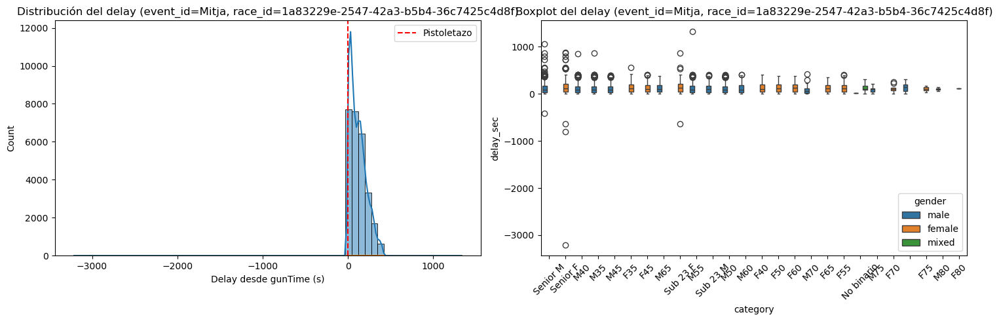

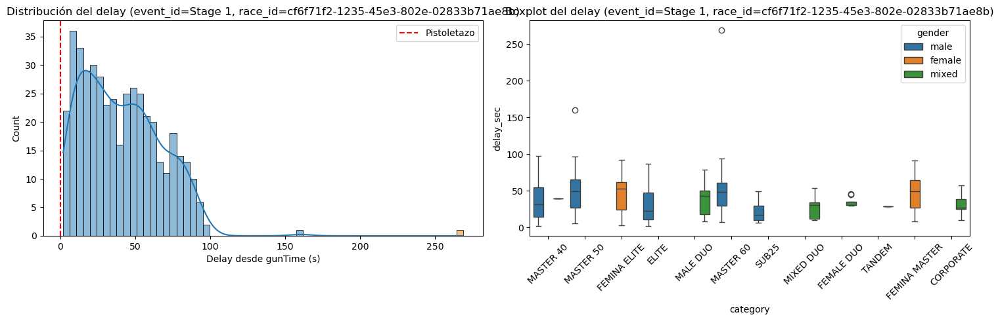

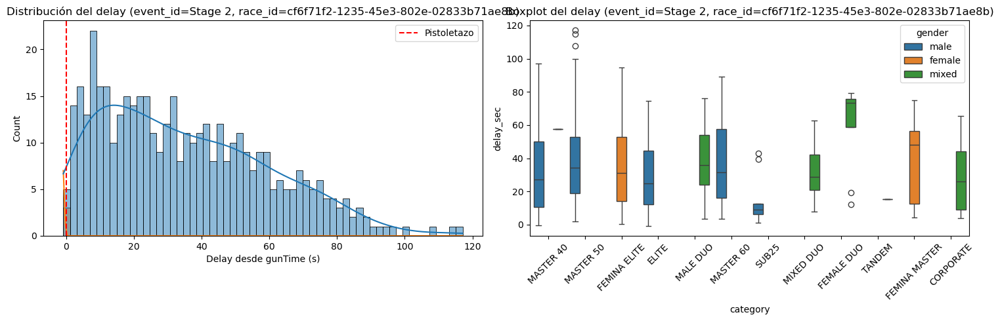

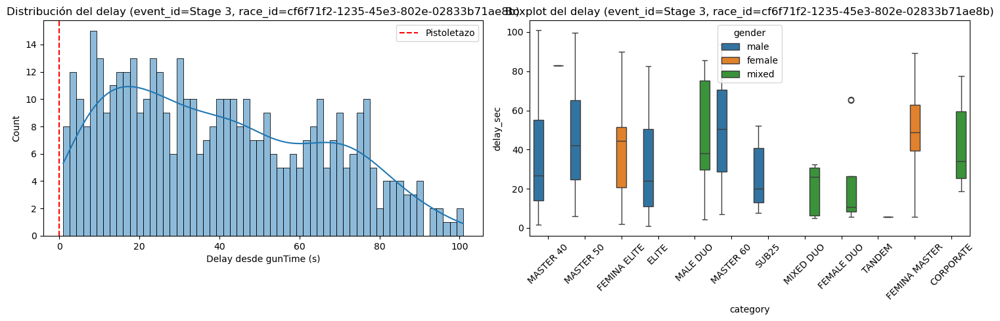

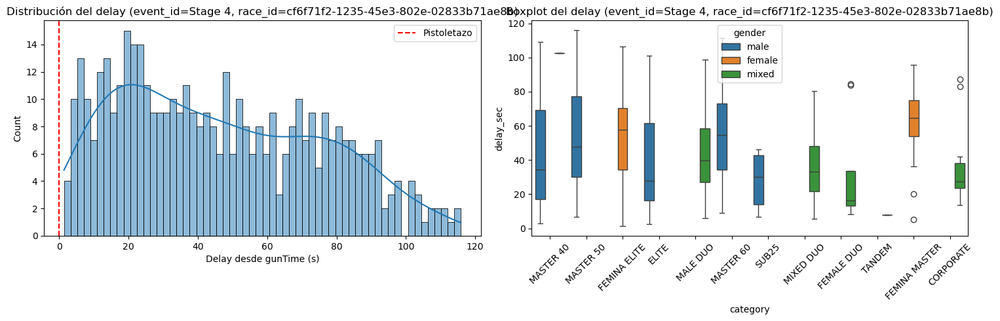

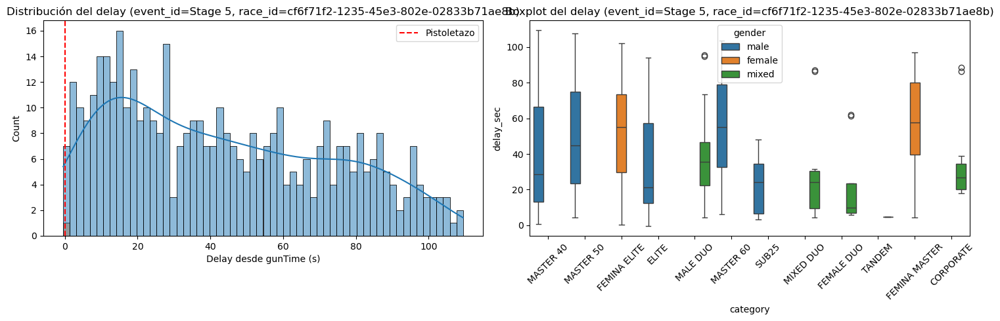

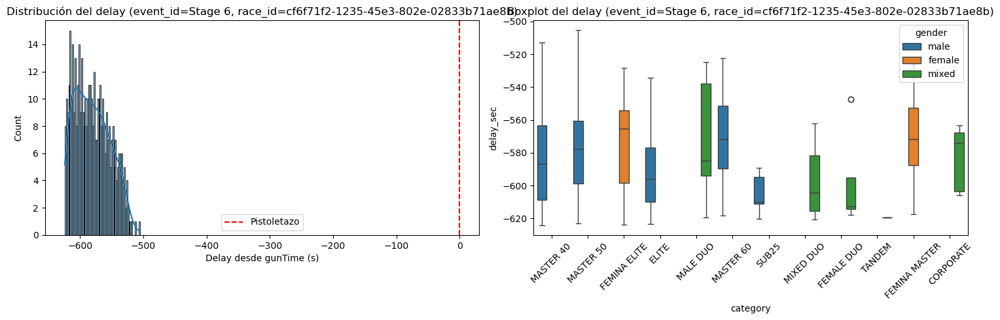

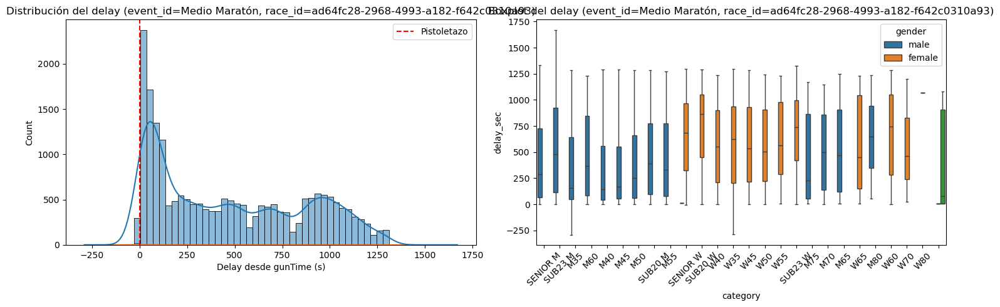

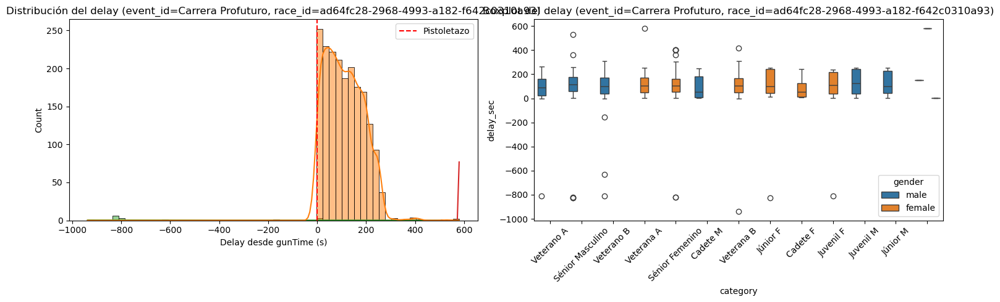

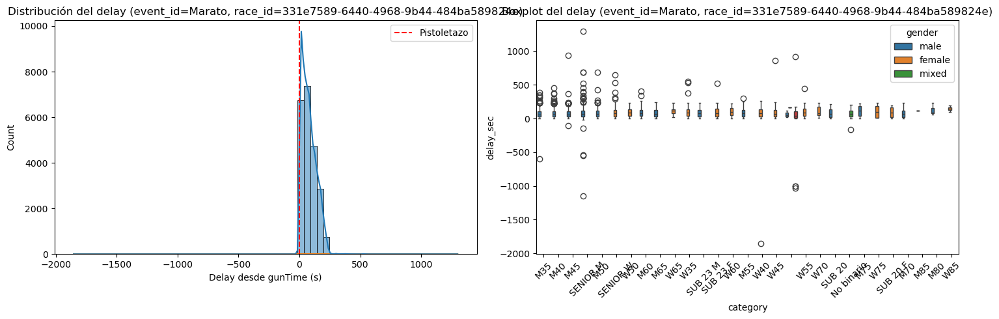

In [24]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# --- Preparación ---
print("Análisis robusto de consistencia de salida por carrera y oleadas")

# Merge con datos de atletas si no existe 'gender'
if 'gender' not in athletes_events_df.columns:
    athletes_events_df = athletes_events_df.merge(
        athletes_df[['athlete_id', 'gender']], on='athlete_id', how='left'
    )

# Asegurarse de que gunTime sea datetime (sin infer_datetime_format)
athletes_events_df['gunTime'] = pd.to_datetime(
    athletes_events_df['gunTime'], errors='coerce'
)
athletes_events_df['gunTime_local'] = athletes_events_df['gunTime']

# startRawTime como datetime
athletes_events_df['startRawTime_dt'] = pd.to_datetime(
    athletes_events_df['startRawTime'], errors='coerce'
)

# Cálculo de delay en segundos
athletes_events_df['delay_sec'] = athletes_events_df['startNetTime_td'].dt.total_seconds()

# --- Función para detectar outliers por IQR y percentiles ---
def detectar_outliers(grupo, k=3, min_athletes=100):
    if len(grupo) < min_athletes:
        # Grupo demasiado pequeño
        grupo['delay_category'] = 'No evaluado'
        grupo['upper_bound'] = np.nan
        grupo['percentile_95'] = np.nan
        grupo['percentile_99'] = np.nan
        grupo['tardio_95'] = False
        grupo['tardio_99'] = False
        return grupo
    
    # IQR
    Q1 = grupo['delay_sec'].quantile(0.25)
    Q3 = grupo['delay_sec'].quantile(0.75)
    IQR = Q3 - Q1
    upper_bound = Q3 + k * IQR

    # Percentiles
    p95 = grupo['delay_sec'].quantile(0.95)
    p99 = grupo['delay_sec'].quantile(0.99)

    grupo['delay_category'] = np.select(
        [
            grupo['delay_sec'] < 0,
            grupo['delay_sec'] > upper_bound
        ],
        ['Extremadamente temprana', 'Extremadamente tardía'],
        default='Normal'
    )
    grupo['upper_bound'] = upper_bound
    grupo['percentile_95'] = p95
    grupo['percentile_99'] = p99
    grupo['tardio_95'] = grupo['delay_sec'] > p95
    grupo['tardio_99'] = grupo['delay_sec'] > p99

    return grupo

# --- Resumen de gunTime por carrera y oleada ---
gun_summary = (
    athletes_events_df.groupby(['race_id', 'gunTime_local', 'event_id'])
    .size()
    .reset_index(name='num_athletes')
    .sort_values(['race_id', 'gunTime_local', 'event_id'])
)
print("\n=== Pistoletazos detectados (gunTime por carrera y oleada) ===")
display(gun_summary)

# --- Aplicar detección de outliers ---
athletes_events_df = athletes_events_df.groupby(
    ['race_id', 'gunTime_local', 'event_id'], group_keys=False
).apply(detectar_outliers)

# --- Resumen global ---
delay_summary = athletes_events_df['delay_category'].value_counts(normalize=True) * 100
print("\n=== Distribución porcentual global del delay (IQR) ===")
display(delay_summary.round(2))

# --- Conteo global de outliers por percentiles ---
outliers_iqr = (athletes_events_df['delay_category'] == 'Extremadamente tardía').sum()
outliers_95 = athletes_events_df['tardio_95'].sum()
outliers_99 = athletes_events_df['tardio_99'].sum()
total_atletas = len(athletes_events_df)

print(f"\nAtletas tardíos según IQR: {outliers_iqr} ({100*outliers_iqr/total_atletas:.2f}%)")
print(f"Atletas tardíos según percentil 95: {outliers_95} ({100*outliers_95/total_atletas:.2f}%)")
print(f"Atletas tardíos según percentil 99: {outliers_99} ({100*outliers_99/total_atletas:.2f}%)")

# --- Resumen por carrera ---
resumen_por_carrera = (
    athletes_events_df.groupby(['event_id', 'race_id'])['delay_category']
    .value_counts(normalize=True)
    .mul(100)
    .rename('porcentaje')
    .reset_index()
)
print("\n=== Distribución porcentual del delay por carrera (IQR) ===")
display(resumen_por_carrera)

# --- Outliers ---
outliers_tardios = athletes_events_df[athletes_events_df['delay_category'] == 'Extremadamente tardía']
outliers_tempranos = athletes_events_df[athletes_events_df['delay_category'] == 'Extremadamente temprana']

print(f"\nAtletas con retrasos extremos (tardíos): {len(outliers_tardios)}")
display(outliers_tardios[['athlete_id', 'event_id', 'category', 'gender', 
                          'startTime_td', 'startRawTime_dt', 'delay_sec', 'delay_category', 'race_id', 'gunTime_local']].head(10))

print(f"\nAtletas que salieron antes (tempranos): {len(outliers_tempranos)}")
display(outliers_tempranos[['athlete_id', 'event_id', 'category', 'gender', 
                            'startTime_td', 'startRawTime_dt', 'delay_sec', 'delay_category', 'race_id', 'gunTime_local']].head(10))

# --- Gráficos por evento y carrera ---
for event in athletes_events_df['event_id'].unique():
    df_event = athletes_events_df[athletes_events_df['event_id'] == event]
    
    for race in df_event['race_id'].unique():
        df_race = df_event[df_event['race_id'] == race]

        # Evitar errores si hay muy pocos datos
        if df_race['delay_sec'].dropna().shape[0] < 2:
            print(f"⚠️  Saltando event_id={event}, race_id={race}: muy pocos datos ({len(df_race)} filas)")
            continue
        
        fig, axes = plt.subplots(1, 2, figsize=(15, 5))
        
        sns.histplot(
            data=df_race,
            x='delay_sec',
            hue='delay_category',
            bins=60,
            kde=True,
            ax=axes[0]
        )
        axes[0].set_title(f"Distribución del delay (event_id={event}, race_id={race})")
        axes[0].set_xlabel("Delay desde gunTime (s)")
        axes[0].axvline(0, color='red', linestyle='--', label='Pistoletazo')
        axes[0].legend()
        
        sns.boxplot(
            data=df_race,
            x='category',
            y='delay_sec',
            hue='gender',
            ax=axes[1]
        )
        axes[1].set_title(f"Boxplot del delay (event_id={event}, race_id={race})")
        axes[1].tick_params(axis='x', rotation=45)
        
        plt.tight_layout()
        plt.show()

In [25]:
# --- Análisis de rarezas por oleada (con race_id y event_id) ---
# Filtramos solo los atletas "raros" (tempranos o tardíos)
raros_df = athletes_events_df[
    athletes_events_df['delay_category'].isin(['Extremadamente temprana', 'Extremadamente tardía'])
]

# Calculamos el porcentaje de casos raros por oleada dentro de cada carrera y evento
porcentaje_raros_por_oleada = (
    raros_df.groupby(['race_id', 'event_id', 'gunTime_local'])
    .size()
    .groupby(level=[0,1])  # normaliza dentro de cada carrera y evento
    .apply(lambda x: 100 * x / x.sum())
    .rename('porcentaje_sobre_raros')
    .reset_index()  # permite duplicados automáticamente
)

# Ordenamos por carrera, evento y gunTime
porcentaje_raros_por_oleada = porcentaje_raros_por_oleada.sort_values(
    ['race_id', 'event_id', 'gunTime_local']
)

print("\n=== Distribución de casos raros por oleada, carrera y evento (porcentaje sobre los raros) ===")
display(porcentaje_raros_por_oleada.round(2))

# Desglose de tempranos y tardíos por oleada, carrera y evento
desglose_raros = (
    raros_df.groupby(['race_id', 'event_id', 'gunTime_local', 'delay_category'])
    .size()
    .groupby(level=[0,1,2])
    .apply(lambda x: 100 * x / x.sum())
    .unstack(fill_value=0)
    .round(2)
)

print("\n=== Desglose porcentual de tipos de rareza (tempranos/tardíos) por oleada, carrera y evento ===")
display(desglose_raros)

ValueError: cannot insert event_id, already exists

El número de gun times detectados y su distribución de atletas confirman la segmentación del evento en oleadas bien definidas (aproximadamente cada 10 minutos).

Aparecen algunos gunTime distintos con pocos atletas (2 especificamente), puede haber un problema de registro o redondeo temporal. CONSULTAR    

Más del 90 % de los participantes cruzaron la línea de salida entre 1 y 5 minutos después de su pistoletazo, lo que indica un flujo normal en eventos masivos por oleadas. Solo un porcentaje marginal (<2 %) presentó salidas negativas o retrasadas, atribuibles probablemente a errores de chip o reasignaciones. CONSULTAR

No se observa una correlación significativa en el género o en la categoria, como era de esperar, ya que en estos contextos los retrasos se dan mas por pelotones grandes que por implicaciones en estas variables. 


=== Análisis de META para race_id = 1a83229e-2547-42a3-b5b4-36c7425c4d8f, event_id = Mitja ===


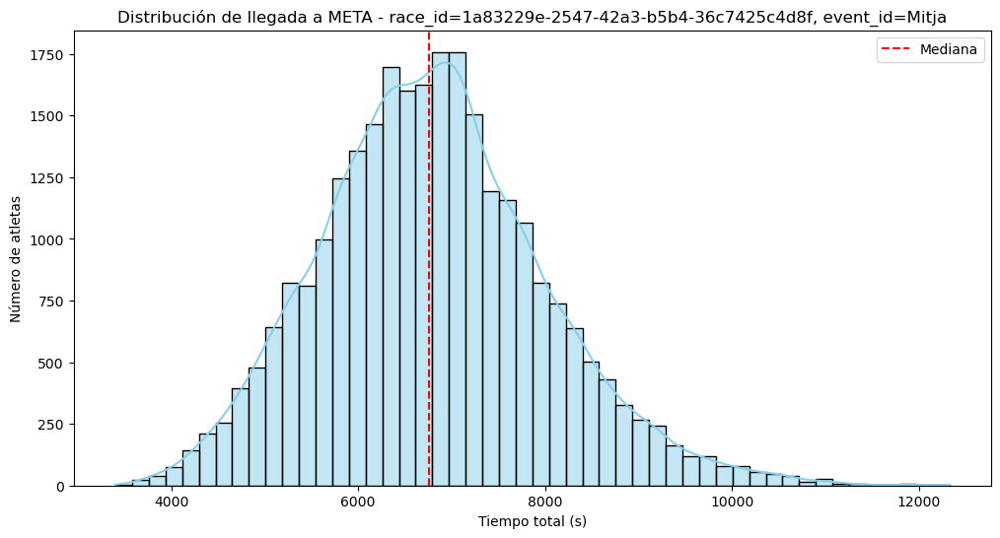

Mediana total a META: 6756.9 s
MAD: 777.6 s
Atletas outliers MAD: 1448 de 27163
Atletas outliers percentil 1: 271
Atletas outliers percentil 99: 271

Ejemplos de outliers MAD:


,athlete_id,average,averageNet,distance,event_id,incidence,isBackup,location,net,netTime,offset,order,originalTime,race_id,rawTime,raw_backupOffset,raw_chip,raw_created,raw_device,raw_id,raw_import,raw_importId,raw_isBackup,raw_location,raw_manual,raw_offset,raw_originalTime,raw_rawTime,raw_rewind,raw_rewindId,raw_time,raw_times_official,raw_times_rawTime,raw_times_real,raw_type,raw_valid,split,time,weight,event_std,netTime_td,originalTime_td,raw_backupOffset_td,raw_times_official_td,raw_times_real_td,time_td,startRawTime,total_time_sec
1,160,0.20712,NaN,21097,Mitja,NaN,NaN,,NaN,4364800.0,NaN,6,4369570.0,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 08:43:55.570,NaN,160,2025-02-16 08:43:58.737,TS2P8 3,160,False,,NaN,Meta,NaN,0.0,2025-02-16 08:43:55.570,2025-02-16 08:43:55.570,False,,2025-02-16T08:43:55.570Z,4369570.0,2025-02-16 08:43:55.570,4369570.0,2,True,Meta,4369570,7.000000,media,0 days 01:12:44.800000,0 days 01:12:49.570000,NaT,0 days 01:12:49.570000,0 days 01:12:49.570000,0 days 01:12:49.570000,2025-02-16 07:31:10.770,4364.800
2,191,0.18266,NaN,21097,Mitja,NaN,NaN,,NaN,3848838.0,NaN,6,3853482.0,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 08:35:19.482,NaN,191,2025-02-16 08:35:22.974,TS2P8 3,191,False,,NaN,Meta,NaN,0.0,2025-02-16 08:35:19.482,2025-02-16 08:35:19.482,False,,2025-02-16T08:35:19.482Z,3853482.0,2025-02-16 08:35:19.482,3853482.0,2,True,Meta,3853482,7.000000,media,0 days 01:04:08.838000,0 days 01:04:13.482000,NaT,0 days 01:04:13.482000,0 days 01:04:13.482000,0 days 01:04:13.482000,2025-02-16 07:31:10.644,3848.838
3,191,0.18266,NaN,21097,Mitja,NaN,NaN,,NaN,3848838.0,NaN,6,3853482.0,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 08:35:19.482,NaN,191,2025-02-16 08:35:22.974,TS2P8 3,191,False,,NaN,Meta,NaN,0.0,2025-02-16 08:35:19.482,2025-02-16 08:35:19.482,False,,2025-02-16T08:35:19.482Z,3853482.0,2025-02-16 08:35:19.482,3853482.0,2,True,Meta,3853482,7.000000,media,0 days 01:04:08.838000,0 days 01:04:13.482000,NaT,0 days 01:04:13.482000,0 days 01:04:13.482000,0 days 01:04:13.482000,2025-02-16 07:31:10.644,3848.838
4,192,0.18659,NaN,21097,Mitja,NaN,NaN,,NaN,3931167.0,NaN,6,3936398.0,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 08:36:42.398,NaN,40192,2025-02-16 08:36:45.876,TS2P8 3,192,False,,NaN,Meta,NaN,0.0,2025-02-16 08:36:42.398,2025-02-16 08:36:42.398,False,,2025-02-16T08:36:42.398Z,3936398.0,2025-02-16 08:36:42.398,3936398.0,2,True,Meta,3936398,7.000000,media,0 days 01:05:31.167000,0 days 01:05:36.398000,NaT,0 days 01:05:36.398000,0 days 01:05:36.398000,0 days 01:05:36.398000,2025-02-16 07:31:11.231,3931.167
5,192,0.18659,NaN,21097,Mitja,NaN,NaN,,NaN,3931167.0,NaN,6,3936398.0,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 08:36:42.398,NaN,40192,2025-02-16 08:36:45.876,TS2P8 3,192,False,,NaN,Meta,NaN,0.0,2025-02-16 08:36:42.398,2025-02-16 08:36:42.398,False,,2025-02-16T08:36:42.398Z,3936398.0,2025-02-16 08:36:42.398,3936398.0,2,True,Meta,3936398,7.000000,media,0 days 01:05:31.167000,0 days 01:05:36.398000,NaT,0 days 01:05:36.398000,0 days 01:05:36.398000,0 days 01:05:36.398000,2025-02-16 07:31:11.231,3931.167
6,195,0.19062,NaN,21097,Mitja,NaN,NaN,,NaN,4014802.0,NaN,6,4021437.0,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 08:38:07.437,NaN,40195,2025-02-16 08:38:11.641,TS2P8 3,195,False,,NaN,Meta,NaN,0.0,2025-02-16 08:38:07.437,2025-02-16 08:38:07.437,False,,2025-02-16T08:38:07.437Z,4021437.0,2025-02-16 08:38:07.437,4021437.0,2,True,Meta,4021437,7.000000,media,0 days 01:06:54.802000,0 days 01:07:01.437000,NaT,0 days 01:07:01.437000,0 days 01:07:01.437000,0 days 01:07:01.437000,2025-02-16 07:31:12.635,4014.802
7,195,0.19062,NaN,21097,Mitja,NaN,NaN,,NaN,4014802.0,NaN,6,4021437.0,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 08:38:07.437,NaN,40195,2025-02-16 08:38:11.641,TS2P8 3,195,False,,NaN,Meta,NaN,0.0,2025-02-16 08:38:07.437,2025-02-16 08:38:07.437,False,,2025-02-16T08:38:07.437Z,4021437.0,2025-02-16 08:38:07.437,4021437.0,2,True,Meta,4021437,7.000000,media,0 days 01:06:54.802000,0 days 01:07:01


Ejemplos de outliers percentiles:


,athlete_id,average,averageNet,distance,event_id,incidence,isBackup,location,net,netTime,offset,order,originalTime,race_id,rawTime,raw_backupOffset,raw_chip,raw_created,raw_device,raw_id,raw_import,raw_importId,raw_isBackup,raw_location,raw_manual,raw_offset,raw_originalTime,raw_rawTime,raw_rewind,raw_rewindId,raw_time,raw_times_official,raw_times_rawTime,raw_times_real,raw_type,raw_valid,split,time,weight,event_std,netTime_td,originalTime_td,raw_backupOffset_td,raw_times_official_td,raw_times_real_td,time_td,startRawTime,total_time_sec
2,191,0.18266,NaN,21097,Mitja,NaN,NaN,,NaN,3848838.0,NaN,6,3853482.0,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 08:35:19.482,NaN,191,2025-02-16 08:35:22.974,TS2P8 3,191,False,,NaN,Meta,NaN,0.0,2025-02-16 08:35:19.482,2025-02-16 08:35:19.482,False,,2025-02-16T08:35:19.482Z,3853482.0,2025-02-16 08:35:19.482,3853482.0,2,True,Meta,3853482,7.0,media,0 days 01:04:08.838000,0 days 01:04:13.482000,NaT,0 days 01:04:13.482000,0 days 01:04:13.482000,0 days 01:04:13.482000,2025-02-16 07:31:10.644,3848.838
3,191,0.18266,NaN,21097,Mitja,NaN,NaN,,NaN,3848838.0,NaN,6,3853482.0,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 08:35:19.482,NaN,191,2025-02-16 08:35:22.974,TS2P8 3,191,False,,NaN,Meta,NaN,0.0,2025-02-16 08:35:19.482,2025-02-16 08:35:19.482,False,,2025-02-16T08:35:19.482Z,3853482.0,2025-02-16 08:35:19.482,3853482.0,2,True,Meta,3853482,7.0,media,0 days 01:04:08.838000,0 days 01:04:13.482000,NaT,0 days 01:04:13.482000,0 days 01:04:13.482000,0 days 01:04:13.482000,2025-02-16 07:31:10.644,3848.838
4,192,0.18659,NaN,21097,Mitja,NaN,NaN,,NaN,3931167.0,NaN,6,3936398.0,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 08:36:42.398,NaN,40192,2025-02-16 08:36:45.876,TS2P8 3,192,False,,NaN,Meta,NaN,0.0,2025-02-16 08:36:42.398,2025-02-16 08:36:42.398,False,,2025-02-16T08:36:42.398Z,3936398.0,2025-02-16 08:36:42.398,3936398.0,2,True,Meta,3936398,7.0,media,0 days 01:05:31.167000,0 days 01:05:36.398000,NaT,0 days 01:05:36.398000,0 days 01:05:36.398000,0 days 01:05:36.398000,2025-02-16 07:31:11.231,3931.167
5,192,0.18659,NaN,21097,Mitja,NaN,NaN,,NaN,3931167.0,NaN,6,3936398.0,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 08:36:42.398,NaN,40192,2025-02-16 08:36:45.876,TS2P8 3,192,False,,NaN,Meta,NaN,0.0,2025-02-16 08:36:42.398,2025-02-16 08:36:42.398,False,,2025-02-16T08:36:42.398Z,3936398.0,2025-02-16 08:36:42.398,3936398.0,2,True,Meta,3936398,7.0,media,0 days 01:05:31.167000,0 days 01:05:36.398000,NaT,0 days 01:05:36.398000,0 days 01:05:36.398000,0 days 01:05:36.398000,2025-02-16 07:31:11.231,3931.167
6,195,0.19062,NaN,21097,Mitja,NaN,NaN,,NaN,4014802.0,NaN,6,4021437.0,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 08:38:07.437,NaN,40195,2025-02-16 08:38:11.641,TS2P8 3,195,False,,NaN,Meta,NaN,0.0,2025-02-16 08:38:07.437,2025-02-16 08:38:07.437,False,,2025-02-16T08:38:07.437Z,4021437.0,2025-02-16 08:38:07.437,4021437.0,2,True,Meta,4021437,7.0,media,0 days 01:06:54.802000,0 days 01:07:01.437000,NaT,0 days 01:07:01.437000,0 days 01:07:01.437000,0 days 01:07:01.437000,2025-02-16 07:31:12.635,4014.802
7,195,0.19062,NaN,21097,Mitja,NaN,NaN,,NaN,4014802.0,NaN,6,4021437.0,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 08:38:07.437,NaN,40195,2025-02-16 08:38:11.641,TS2P8 3,195,False,,NaN,Meta,NaN,0.0,2025-02-16 08:38:07.437,2025-02-16 08:38:07.437,False,,2025-02-16T08:38:07.437Z,4021437.0,2025-02-16 08:38:07.437,4021437.0,2,True,Meta,4021437,7.0,media,0 days 01:06:54.802000,0 days 01:07:01.437000,NaT,0 days 01:07:01.437000,0 days 01:07:01.437000,0 days 01:07:01.437000,2025-02-16 07:31:12.635,4014.802
98,1B1425ZA,0.18900,NaN,21097,Mitja,NaN,NaN,,NaN,3981200.0,NaN,6,3987280.0,1a83229e-2547-42a3-b5b4-36c7425c4d8f,2025-02-16 08:37:33.280,NaN,597,2025-02-16 08:37:38.464,TS2P8 3,1B1425ZA,False,,NaN,Meta,NaN,0.0,2025-02-16 08:37:33.280,2025-02-16 08:37:33.280,False,,2025-02-16T08:37:33.280Z,3987280.0,2025-02-16 08:37:33.280,3987280.0,2,True,Meta,3987280,7.0,media,0 days 01:06:21.200000,0 days 01:06:27.280000,NaT,0 days 01:06


=== Análisis de META para race_id = cf6f71f2-1235-45e3-802e-02833b71ae8b, event_id = Stage 1 ===


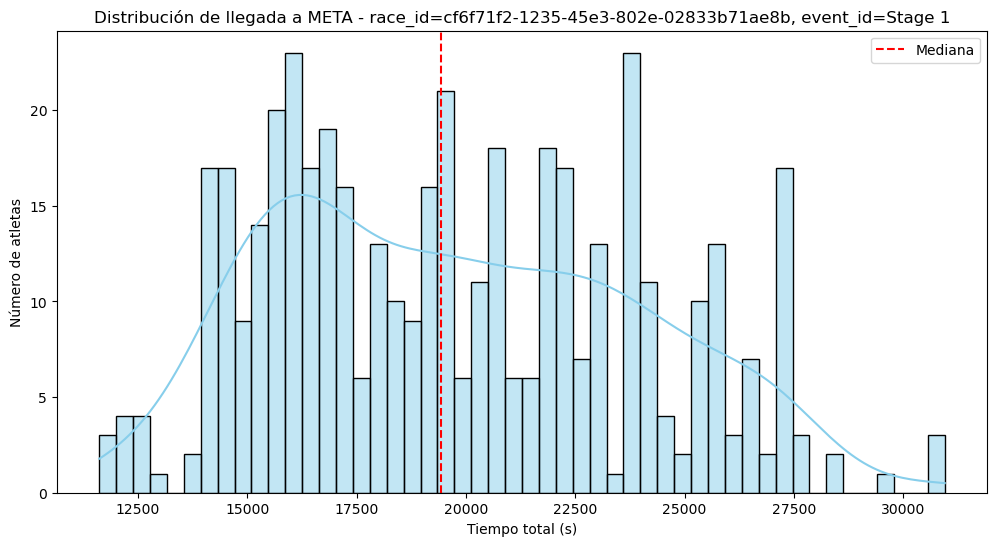

Mediana total a META: 19427.9 s
MAD: 3378.6 s
Atletas outliers MAD: 3 de 445
Atletas outliers percentil 1: 5
Atletas outliers percentil 99: 5

Ejemplos de outliers MAD:


,athlete_id,average,averageNet,distance,event_id,incidence,isBackup,location,net,netTime,offset,order,originalTime,race_id,rawTime,raw_backupOffset,raw_chip,raw_created,raw_device,raw_id,raw_import,raw_importId,raw_isBackup,raw_location,raw_manual,raw_offset,raw_originalTime,raw_rawTime,raw_rewind,raw_rewindId,raw_time,raw_times_official,raw_times_rawTime,raw_times_real,raw_type,raw_valid,split,time,weight,event_std,netTime_td,originalTime_td,raw_backupOffset_td,raw_times_official_td,raw_times_real_td,time_td,startRawTime,total_time_sec
27683,ed3c0f57-5bc7-5670-8de2-a5a9456c534a,0.34112,NaN,90999,Stage 1,NaN,NaN,,NaN,30950211.0,NaN,10,31041453.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-01 15:38:26.524,NaN,240,2025-05-01 15:38:51.183,TS2P8 243,ed3c0f57-5bc7-5670-8de2-a5a9456c534a,False,,NaN,E1 - META,NaN,0.0,2025-05-01 15:38:26.524,2025-05-01 15:38:26.524,False,,2025-05-01T15:38:26.524Z,31041453.0,2025-05-01 15:38:26.524,31041453.0,2,True,Meta,31041453,10.999997,stage,0 days 08:35:50.211000,0 days 08:37:21.453000,NaT,0 days 08:37:21.453000,0 days 08:37:21.453000,0 days 08:37:21.453000,2025-05-01 07:02:36.313,30950.211
28443,23e386ac-b354-5d95-8a18-67cd7cd83148,0.34113,NaN,90999,Stage 1,NaN,NaN,,NaN,30950158.0,NaN,10,31042630.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-01 15:38:27.701,NaN,209,2025-05-01 15:38:51.183,TS2P8 243,23e386ac-b354-5d95-8a18-67cd7cd83148,False,,NaN,E1 - META,NaN,0.0,2025-05-01 15:38:27.701,2025-05-01 15:38:27.701,False,,2025-05-01T15:38:27.701Z,31042630.0,2025-05-01 15:38:27.701,31042630.0,2,True,Meta,31042630,10.999997,stage,0 days 08:35:50.158000,0 days 08:37:22.630000,NaT,0 days 08:37:22.630000,0 days 08:37:22.630000,0 days 08:37:22.630000,2025-05-01 07:02:37.543,30950.158
28596,69eeb692-8c4c-5d96-90e1-910d66e7e8b2,0.34113,NaN,90999,Stage 1,NaN,NaN,,NaN,30949023.0,NaN,10,31042781.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-01 15:38:27.852,NaN,448,2025-05-01 15:38:51.183,TS2P8 243,69eeb692-8c4c-5d96-90e1-910d66e7e8b2,False,,NaN,E1 - META,NaN,0.0,2025-05-01 15:38:27.852,2025-05-01 15:38:27.852,False,,2025-05-01T15:38:27.852Z,31042781.0,2025-05-01 15:38:27.852,31042781.0,2,True,Meta,31042781,10.999997,stage,0 days 08:35:49.023000,0 days 08:37:22.781000,NaT,0 days 08:37:22.781000,0 days 08:37:22.781000,0 days 08:37:22.781000,2025-05-01 07:02:38.829,30949.023



Ejemplos de outliers percentiles:


,athlete_id,average,averageNet,distance,event_id,incidence,isBackup,location,net,netTime,offset,order,originalTime,race_id,rawTime,raw_backupOffset,raw_chip,raw_created,raw_device,raw_id,raw_import,raw_importId,raw_isBackup,raw_location,raw_manual,raw_offset,raw_originalTime,raw_rawTime,raw_rewind,raw_rewindId,raw_time,raw_times_official,raw_times_rawTime,raw_times_real,raw_type,raw_valid,split,time,weight,event_std,netTime_td,originalTime_td,raw_backupOffset_td,raw_times_official_td,raw_times_real_td,time_td,startRawTime,total_time_sec
27181,4d325944-3693-5adf-a199-43b47210f9db,0.12849,NaN,90999,Stage 1,True,NaN,,NaN,11615986.0,NaN,10,11692671.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-01 10:15:57.742,NaN,,NaT,,nan,NaN,,NaN,E1 - META,False,NaN,NaT,2025-05-01 10:15:57.742,NaN,,,NaN,NaT,NaN,nan,NaN,Meta,11692671,10.999999,stage,0 days 03:13:35.986000,0 days 03:14:52.671000,NaT,NaT,NaT,0 days 03:14:52.671000,2025-05-01 07:02:21.756,11615.986
27294,496b08ff-62c0-5a60-849f-1a99bcfe0f9e,0.13540,NaN,90999,Stage 1,NaN,NaN,,NaN,12317278.0,NaN,10,12321476.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-01 10:26:26.547,NaN,8,2025-05-01 10:26:29.848,TS2P8 243,496b08ff-62c0-5a60-849f-1a99bcfe0f9e,False,,NaN,E1 - META,NaN,0.0,2025-05-01 10:26:26.547,2025-05-01 10:26:26.547,False,,2025-05-01T10:26:26.547Z,12321476.0,2025-05-01 10:26:26.547,12321476.0,2,True,Meta,12321476,10.999999,stage,0 days 03:25:17.278000,0 days 03:25:21.476000,NaT,0 days 03:25:21.476000,0 days 03:25:21.476000,0 days 03:25:21.476000,2025-05-01 07:01:09.269,12317.278
27752,35b3cb57-c982-559f-9b1b-4411975ea175,0.12869,NaN,90999,Stage 1,NaN,NaN,,NaN,11708618.0,NaN,10,11710426.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-01 10:16:15.497,NaN,9,2025-05-01 10:16:34.926,TS2P8 243,35b3cb57-c982-559f-9b1b-4411975ea175,False,,NaN,E1 - META,NaN,0.0,2025-05-01 10:16:15.497,2025-05-01 10:16:15.497,False,,2025-05-01T10:16:15.497Z,11710426.0,2025-05-01 10:16:15.497,11710426.0,2,True,Meta,11710426,10.999999,stage,0 days 03:15:08.618000,0 days 03:15:10.426000,NaT,0 days 03:15:10.426000,0 days 03:15:10.426000,0 days 03:15:10.426000,2025-05-01 07:01:06.879,11708.618
27962,b09f286b-d893-5548-8bdc-64ba245e9604,0.12849,NaN,90999,Stage 1,NaN,NaN,,NaN,11689116.0,NaN,10,11692670.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-01 10:15:57.741,NaN,2,2025-05-01 10:16:04.510,TS2P8 243,b09f286b-d893-5548-8bdc-64ba245e9604,False,,NaN,E1 - META,NaN,0.0,2025-05-01 10:15:57.741,2025-05-01 10:15:57.741,False,,2025-05-01T10:15:57.741Z,11692670.0,2025-05-01 10:15:57.741,11692670.0,2,True,Meta,11692670,10.999999,stage,0 days 03:14:49.116000,0 days 03:14:52.670000,NaT,0 days 03:14:52.670000,0 days 03:14:52.670000,0 days 03:14:52.670000,2025-05-01 07:01:08.625,11689.116
29493,341b2256-a21f-5aa5-84f0-bd5ebb7ce25d,0.13540,NaN,90999,Stage 1,True,NaN,,NaN,12316944.0,NaN,10,12321477.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-01 10:26:26.548,NaN,,NaT,,nan,NaN,,NaN,E1 - META,False,NaN,NaT,2025-05-01 10:26:26.548,NaN,,,NaN,NaT,NaN,nan,NaN,Meta,12321477,10.999999,stage,0 days 03:25:16.944000,0 days 03:25:21.477000,NaT,NaT,NaT,0 days 03:25:21.477000,2025-05-01 07:01:09.604,12316.944
27556,15dde7fc-54de-5aa0-8a4e-464aea30342d,0.32420,NaN,90999,Stage 1,NaN,NaN,,NaN,29462239.0,NaN,10,29502007.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-01 15:12:47.078,NaN,390,2025-05-01 15:16:44.547,TS2P8 243,15dde7fc-54de-5aa0-8a4e-464aea30342d,False,,NaN,E1 - META,NaN,0.0,2025-05-01 15:12:47.078,2025-05-01 15:12:47.078,False,,2025-05-01T15:12:47.078Z,29502007.0,2025-05-01 15:12:47.078,29502007.0,2,True,Meta,29502007,10.999997,stage,0 days 08:11:02.239000,0 days 08:11:42.007000,NaT,0 days 08:11:42.007000,0 days 08:11:42.007000,0 days 08:11:42.007000,2025-05-01 07:01:44.839,29462.239
27683,ed3c0f57-5bc7-5670-8de2-a5a9456c534a,0.34112,NaN,90999,Stage 1,NaN,NaN,,NaN,30950211.0,NaN,10,31041453.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-01 15:38:26.524,NaN,240,2025-05-01 15:38:51.183,TS2P8 243,ed3c0f57-5bc7-5670-8de2-a5a9456c534


=== Análisis de META para race_id = cf6f71f2-1235-45e3-802e-02833b71ae8b, event_id = Stage 2 ===


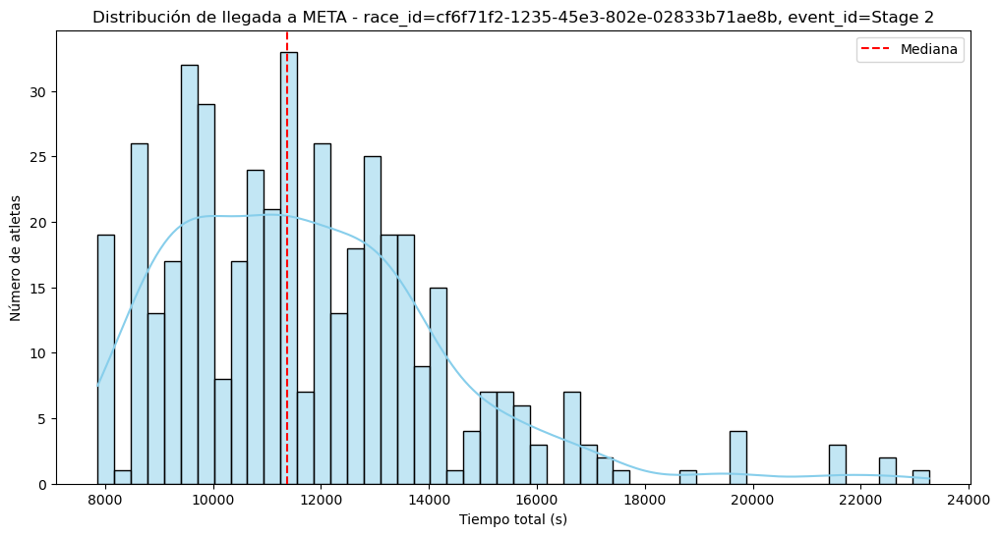

Mediana total a META: 11371.7 s
MAD: 1706.8 s
Atletas outliers MAD: 24 de 443
Atletas outliers percentil 1: 5
Atletas outliers percentil 99: 5

Ejemplos de outliers MAD:


,athlete_id,average,averageNet,distance,event_id,incidence,isBackup,location,net,netTime,offset,order,originalTime,race_id,rawTime,raw_backupOffset,raw_chip,raw_created,raw_device,raw_id,raw_import,raw_importId,raw_isBackup,raw_location,raw_manual,raw_offset,raw_originalTime,raw_rawTime,raw_rewind,raw_rewindId,raw_time,raw_times_official,raw_times_rawTime,raw_times_real,raw_type,raw_valid,split,time,weight,event_std,netTime_td,originalTime_td,raw_backupOffset_td,raw_times_official_td,raw_times_real_td,time_td,startRawTime,total_time_sec
27164,7b167227-8f2b-5f8c-8d1b-6202a946d7bf,0.24984,NaN,68000,Stage 2,NaN,NaN,,NaN,16949850.0,NaN,4,16988800.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-02 16:03:08.800,NaN,290,2025-05-02 16:03:12.703,TS2P8 243,7b167227-8f2b-5f8c-8d1b-6202a946d7bf,False,,NaN,E2 - META,NaN,0.0,2025-05-02 16:03:08.800,2025-05-02 16:03:08.800,False,,2025-05-02T16:03:08.800Z,16988800.0,2025-05-02 16:03:08.800,16988800.0,2,True,Meta,16988800,4.999998,stage,0 days 04:42:29.850000,0 days 04:43:08.800000,NaT,0 days 04:43:08.800000,0 days 04:43:08.800000,0 days 04:43:08.800000,2025-05-02 11:20:38.950,16949.850
27260,f9bac489-e75d-5587-953a-043f2ee9c4ca,0.25702,NaN,68000,Stage 2,NaN,NaN,,NaN,17441057.0,NaN,4,17477521.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-02 16:11:17.521,NaN,457,2025-05-02 16:13:44.613,TS2P8 243,f9bac489-e75d-5587-953a-043f2ee9c4ca,False,,NaN,E2 - META,NaN,0.0,2025-05-02 16:11:17.521,2025-05-02 16:11:17.521,False,,2025-05-02T16:11:17.521Z,17477521.0,2025-05-02 16:11:17.521,17477521.0,2,True,Meta,17477521,4.999998,stage,0 days 04:50:41.057000,0 days 04:51:17.521000,NaT,0 days 04:51:17.521000,0 days 04:51:17.521000,0 days 04:51:17.521000,2025-05-02 11:20:36.464,17441.057
27331,4223896e-afbc-5a37-8ae5-624bdd24d9ed,0.31637,NaN,68000,Stage 2,NaN,NaN,,NaN,21459468.0,NaN,4,21513068.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-02 17:18:33.068,NaN,13,2025-05-02 17:19:14.144,TS2P8 243,4223896e-afbc-5a37-8ae5-624bdd24d9ed,False,,NaN,E2 - META,NaN,0.0,2025-05-02 17:18:33.068,2025-05-02 17:18:33.068,False,,2025-05-02T17:18:33.068Z,21513068.0,2025-05-02 17:18:33.068,21513068.0,2,True,Meta,21513068,4.999998,stage,0 days 05:57:39.468000,0 days 05:58:33.068000,NaT,0 days 05:58:33.068000,0 days 05:58:33.068000,0 days 05:58:33.068000,2025-05-02 11:20:53.600,21459.468
27519,d60bcb98-913f-5234-8330-911129c7e102,0.25475,NaN,68000,Stage 2,NaN,NaN,,NaN,17294121.0,NaN,4,17323197.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-02 16:08:43.197,NaN,463,2025-05-02 16:13:44.613,TS2P8 243,d60bcb98-913f-5234-8330-911129c7e102,False,,NaN,E2 - META,NaN,0.0,2025-05-02 16:08:43.197,2025-05-02 16:08:43.197,False,,2025-05-02T16:08:43.197Z,17323197.0,2025-05-02 16:08:43.197,17323197.0,2,True,Meta,17323197,4.999998,stage,0 days 04:48:14.121000,0 days 04:48:43.197000,NaT,0 days 04:48:43.197000,0 days 04:48:43.197000,0 days 04:48:43.197000,2025-05-02 11:20:29.076,17294.121
27557,15dde7fc-54de-5aa0-8a4e-464aea30342d,0.33235,NaN,68000,Stage 2,True,NaN,,NaN,22542334.0,NaN,4,22600098.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-02 17:36:40.098,NaN,,NaT,,nan,NaN,,NaN,E2 - META,False,NaN,NaT,2025-05-02 17:36:40.098,NaN,,,NaN,NaT,NaN,nan,NaN,Meta,22600098,4.999998,stage,0 days 06:15:42.334000,0 days 06:16:40.098000,NaT,NaT,NaT,0 days 06:16:40.098000,2025-05-02 11:20:57.764,22542.334
27666,06cedd2a-fbaf-54b6-bd4b-8ba7feb6c735,0.24431,NaN,68000,Stage 2,NaN,NaN,,NaN,16590281.0,NaN,4,16612830.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-02 15:56:52.830,NaN,20,2025-05-02 15:56:55.893,TS2P8 243,06cedd2a-fbaf-54b6-bd4b-8ba7feb6c735,False,,NaN,E2 - META,NaN,0.0,2025-05-02 15:56:52.830,2025-05-02 15:56:52.830,False,,2025-05-02T15:56:52.830Z,16612830.0,2025-05-02 15:56:52.830,16612830.0,2,True,Meta,16612830,4.999998,stage,0 days 04:36:30.281000,0 days 04:36:52.830000,NaT,0 days 04:36:52.830000,0 days 04:36:52.830000,0 days 04:36:52.830000,2025-05-02 11:20:22.549,16590.281
27721,69b99897-b308-5b4f-98ea-60ad11015417,0.24593,NaN,68000,Stage 2,NaN,NaN


Ejemplos de outliers percentiles:


,athlete_id,average,averageNet,distance,event_id,incidence,isBackup,location,net,netTime,offset,order,originalTime,race_id,rawTime,raw_backupOffset,raw_chip,raw_created,raw_device,raw_id,raw_import,raw_importId,raw_isBackup,raw_location,raw_manual,raw_offset,raw_originalTime,raw_rawTime,raw_rewind,raw_rewindId,raw_time,raw_times_official,raw_times_rawTime,raw_times_real,raw_type,raw_valid,split,time,weight,event_std,netTime_td,originalTime_td,raw_backupOffset_td,raw_times_official_td,raw_times_real_td,time_td,startRawTime,total_time_sec
27182,4d325944-3693-5adf-a199-43b47210f9db,0.11679,NaN,68000,Stage 2,NaN,NaN,,NaN,7941446.0,NaN,4,7941446.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-02 12:54:26.446,NaN,1,2025-05-02 12:54:30.791,TS2P8 243,4d325944-3693-5adf-a199-43b47210f9db,False,,NaN,E2 - META,NaN,0.0,2025-05-02 12:54:26.446,2025-05-02 12:54:26.446,False,,2025-05-02T12:54:26.446Z,7941446.0,2025-05-02 12:54:26.446,7941446.0,2,True,Meta,7941446,4.999999,stage,0 days 02:12:21.446000,0 days 02:12:21.446000,NaT,0 days 02:12:21.446000,0 days 02:12:21.446000,0 days 02:12:21.446000,2025-05-02 10:42:04.529,7941.917
27753,35b3cb57-c982-559f-9b1b-4411975ea175,0.11679,NaN,68000,Stage 2,NaN,NaN,,NaN,7940628.0,NaN,4,7941388.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-02 12:54:26.388,NaN,9,2025-05-02 12:54:30.791,TS2P8 243,35b3cb57-c982-559f-9b1b-4411975ea175,False,,NaN,E2 - META,NaN,0.0,2025-05-02 12:54:26.388,2025-05-02 12:54:26.388,False,,2025-05-02T12:54:26.388Z,7941388.0,2025-05-02 12:54:26.388,7941388.0,2,True,Meta,7941388,4.999999,stage,0 days 02:12:20.628000,0 days 02:12:21.388000,NaT,0 days 02:12:21.388000,0 days 02:12:21.388000,0 days 02:12:21.388000,2025-05-02 10:42:05.760,7940.628
27963,b09f286b-d893-5548-8bdc-64ba245e9604,0.11679,NaN,68000,Stage 2,True,NaN,,NaN,7941447.0,NaN,4,7941447.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-02 12:54:26.447,NaN,,NaT,,nan,NaN,,NaN,E2 - META,False,NaN,NaT,2025-05-02 12:54:26.447,NaN,,,NaN,NaT,NaN,nan,NaN,Meta,7941447,4.999999,stage,0 days 02:12:21.447000,0 days 02:12:21.447000,NaT,NaT,NaT,0 days 02:12:21.447000,2025-05-02 10:42:04.199,7942.248
28177,21ff2d4d-a5c6-552c-ae14-08a17f94db60,0.11565,NaN,68000,Stage 2,True,NaN,,NaN,7861835.0,NaN,4,7863919.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-02 12:53:08.919,NaN,,NaT,,nan,NaN,,NaN,E2 - META,False,NaN,NaT,2025-05-02 12:53:08.919,NaN,,,NaN,NaT,NaN,nan,NaN,Meta,7863919,4.999999,stage,0 days 02:11:01.835000,0 days 02:11:03.919000,NaT,NaT,NaT,0 days 02:11:03.919000,2025-05-02 10:42:07.084,7861.835
29418,9ef98b72-d122-533c-968e-394d879f3c3c,0.11565,NaN,68000,Stage 2,NaN,NaN,,NaN,7862912.0,NaN,4,7863918.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-02 12:53:08.918,NaN,12,2025-05-02 12:53:12.360,TS2P8 243,9ef98b72-d122-533c-968e-394d879f3c3c,False,,NaN,E2 - META,NaN,0.0,2025-05-02 12:53:08.918,2025-05-02 12:53:08.918,False,,2025-05-02T12:53:08.918Z,7863918.0,2025-05-02 12:53:08.918,7863918.0,2,True,Meta,7863918,4.999999,stage,0 days 02:11:02.912000,0 days 02:11:03.918000,NaT,0 days 02:11:03.918000,0 days 02:11:03.918000,0 days 02:11:03.918000,2025-05-02 10:42:06.006,7862.912
27331,4223896e-afbc-5a37-8ae5-624bdd24d9ed,0.31637,NaN,68000,Stage 2,NaN,NaN,,NaN,21459468.0,NaN,4,21513068.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-02 17:18:33.068,NaN,13,2025-05-02 17:19:14.144,TS2P8 243,4223896e-afbc-5a37-8ae5-624bdd24d9ed,False,,NaN,E2 - META,NaN,0.0,2025-05-02 17:18:33.068,2025-05-02 17:18:33.068,False,,2025-05-02T17:18:33.068Z,21513068.0,2025-05-02 17:18:33.068,21513068.0,2,True,Meta,21513068,4.999998,stage,0 days 05:57:39.468000,0 days 05:58:33.068000,NaT,0 days 05:58:33.068000,0 days 05:58:33.068000,0 days 05:58:33.068000,2025-05-02 11:20:53.600,21459.468
27557,15dde7fc-54de-5aa0-8a4e-464aea30342d,0.33235,NaN,68000,Stage 2,True,NaN,,NaN,22542334.0,NaN,4,22600098.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-02 17:36:40.098,NaN,,NaT,,nan,NaN,,NaN,E2 - META,False,NaN,NaT,2025-05-02 17:36:40.098,NaN,,,NaN,NaT,NaN,nan,NaN,Meta,22600098,4.99


=== Análisis de META para race_id = cf6f71f2-1235-45e3-802e-02833b71ae8b, event_id = Stage 3 ===


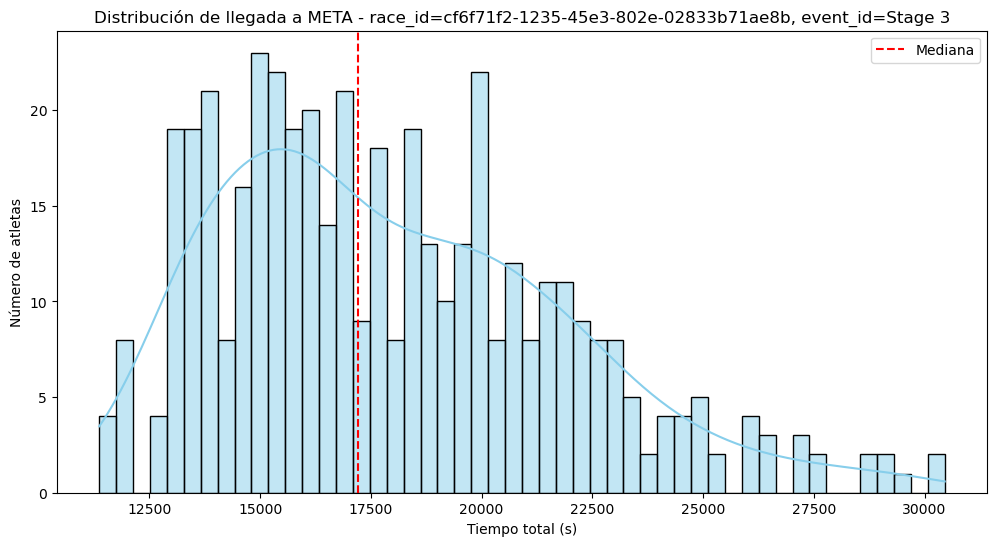

Mediana total a META: 17197.3 s
MAD: 2740.3 s
Atletas outliers MAD: 19 de 446
Atletas outliers percentil 1: 5
Atletas outliers percentil 99: 5

Ejemplos de outliers MAD:


,athlete_id,average,averageNet,distance,event_id,incidence,isBackup,location,net,netTime,offset,order,originalTime,race_id,rawTime,raw_backupOffset,raw_chip,raw_created,raw_device,raw_id,raw_import,raw_importId,raw_isBackup,raw_location,raw_manual,raw_offset,raw_originalTime,raw_rawTime,raw_rewind,raw_rewindId,raw_time,raw_times_official,raw_times_rawTime,raw_times_real,raw_type,raw_valid,split,time,weight,event_std,netTime_td,originalTime_td,raw_backupOffset_td,raw_times_official_td,raw_times_real_td,time_td,startRawTime,total_time_sec
27165,7b167227-8f2b-5f8c-8d1b-6202a946d7bf,0.30464,NaN,89996,Stage 3,NaN,NaN,,NaN,27355408.0,NaN,10,27416569.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-03 14:40:06.747,NaN,290,2025-05-03 14:40:11.899,TS2P8 243,7b167227-8f2b-5f8c-8d1b-6202a946d7bf,False,,NaN,E3 - META,NaN,0.0,2025-05-03 14:40:06.747,2025-05-03 14:40:06.747,False,,2025-05-03T14:40:06.747Z,27416569.0,2025-05-03 14:40:06.747,27416569.0,2,True,Meta,27416569,10.999997,stage,0 days 07:35:55.408000,0 days 07:36:56.569000,NaT,0 days 07:36:56.569000,0 days 07:36:56.569000,0 days 07:36:56.569000,2025-05-03 07:04:11.339,27355.408
27261,f9bac489-e75d-5587-953a-043f2ee9c4ca,0.30948,NaN,89996,Stage 3,NaN,NaN,,NaN,27759661.0,NaN,10,27852246.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-03 14:47:22.424,NaN,457,2025-05-03 14:47:27.226,TS2P8 3,f9bac489-e75d-5587-953a-043f2ee9c4ca,False,,NaN,E3 - META,NaN,0.0,2025-05-03 14:47:22.424,2025-05-03 14:47:22.424,False,,2025-05-03T14:47:22.424Z,27852246.0,2025-05-03 14:47:22.424,27852246.0,2,True,Meta,27852246,10.999997,stage,0 days 07:42:39.661000,0 days 07:44:12.246000,NaT,0 days 07:44:12.246000,0 days 07:44:12.246000,0 days 07:44:12.246000,2025-05-03 07:04:42.763,27759.661
27684,ed3c0f57-5bc7-5670-8de2-a5a9456c534a,0.32327,NaN,89996,Stage 3,NaN,NaN,,NaN,29003897.0,NaN,10,29093122.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-03 15:08:03.300,NaN,240,2025-05-03 15:08:06.528,TS2P8 243,ed3c0f57-5bc7-5670-8de2-a5a9456c534a,False,,NaN,E3 - META,NaN,0.0,2025-05-03 15:08:03.300,2025-05-03 15:08:03.300,False,,2025-05-03T15:08:03.300Z,29093122.0,2025-05-03 15:08:03.300,29093122.0,2,True,Meta,29093122,10.999997,stage,0 days 08:03:23.897000,0 days 08:04:53.122000,NaT,0 days 08:04:53.122000,0 days 08:04:53.122000,0 days 08:04:53.122000,2025-05-03 07:04:39.403,29003.897
27848,2f96ded9-1db9-55dd-ad34-45039f6302d0,0.30948,NaN,89996,Stage 3,NaN,NaN,,NaN,27752060.0,NaN,10,27851855.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-03 14:47:22.033,NaN,35090,2025-05-03 14:47:25.720,TS2P8 243,2f96ded9-1db9-55dd-ad34-45039f6302d0,False,,NaN,E3 - META,NaN,0.0,2025-05-03 14:47:22.033,2025-05-03 14:47:22.033,False,,2025-05-03T14:47:22.033Z,27851855.0,2025-05-03 14:47:22.033,27851855.0,2,True,Meta,27851855,10.999997,stage,0 days 07:42:32.060000,0 days 07:44:11.855000,NaT,0 days 07:44:11.855000,0 days 07:44:11.855000,0 days 07:44:11.855000,2025-05-03 07:04:49.973,27752.060
28036,5dfb0ad8-6857-5875-b4db-e67220e006bf,0.31861,NaN,89996,Stage 3,NaN,NaN,,NaN,28610493.0,NaN,10,28673712.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-03 15:01:03.890,NaN,439,2025-05-03 15:01:09.378,TS2P8 243,5dfb0ad8-6857-5875-b4db-e67220e006bf,False,,NaN,E3 - META,NaN,0.0,2025-05-03 15:01:03.890,2025-05-03 15:01:03.890,False,,2025-05-03T15:01:03.890Z,28673712.0,2025-05-03 15:01:03.890,28673712.0,2,True,Meta,28673712,10.999997,stage,0 days 07:56:50.493000,0 days 07:57:53.712000,NaT,0 days 07:57:53.712000,0 days 07:57:53.712000,0 days 07:57:53.712000,2025-05-03 07:04:13.397,28610.493
28066,3304619f-941a-58cb-8d8f-ed03b6665ae7,0.29083,NaN,89996,Stage 3,NaN,NaN,,NaN,26101008.0,NaN,10,26173913.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-03 14:19:24.091,NaN,223,2025-05-03 14:19:25.515,TS2P8 243,3304619f-941a-58cb-8d8f-ed03b6665ae7,False,,NaN,E3 - META,NaN,0.0,2025-05-03 14:19:24.091,2025-05-03 14:19:24.091,False,,2025-05-03T14:19:24.091Z,26173913.0,2025-05-03 14:19:24.091,26173913.0,2,True,Meta,26173913,10.999997,stage,0 days 07:15:01.008000,0 days 07:1


Ejemplos de outliers percentiles:


,athlete_id,average,averageNet,distance,event_id,incidence,isBackup,location,net,netTime,offset,order,originalTime,race_id,rawTime,raw_backupOffset,raw_chip,raw_created,raw_device,raw_id,raw_import,raw_importId,raw_isBackup,raw_location,raw_manual,raw_offset,raw_originalTime,raw_rawTime,raw_rewind,raw_rewindId,raw_time,raw_times_official,raw_times_rawTime,raw_times_real,raw_type,raw_valid,split,time,weight,event_std,netTime_td,originalTime_td,raw_backupOffset_td,raw_times_official_td,raw_times_real_td,time_td,startRawTime,total_time_sec
27754,35b3cb57-c982-559f-9b1b-4411975ea175,0.12634,NaN,89996,Stage 3,True,NaN,,NaN,11368318.0,NaN,10,11370494.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-03 10:12:40.672,NaN,,NaT,,nan,NaN,,NaN,E3 - META,False,NaN,NaT,2025-05-03 10:12:40.672,NaN,,,NaN,NaT,NaN,nan,NaN,Meta,11370494,10.999999,stage,0 days 03:09:28.318000,0 days 03:09:30.494000,NaT,NaT,NaT,0 days 03:09:30.494000,2025-05-03 07:03:12.354,11368.318
27784,c690c665-7cf0-5934-86a1-c9703823df0b,0.12853,NaN,89996,Stage 3,NaN,NaN,,NaN,11565813.0,NaN,10,11567602.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-03 10:15:57.780,NaN,16,2025-05-03 10:16:00.649,TS2P8 243,c690c665-7cf0-5934-86a1-c9703823df0b,False,,NaN,E3 - META,NaN,0.0,2025-05-03 10:15:57.780,2025-05-03 10:15:57.780,False,,2025-05-03T10:15:57.780Z,11567602.0,2025-05-03 10:15:57.780,11567602.0,2,True,Meta,11567602,10.999999,stage,0 days 03:12:45.813000,0 days 03:12:47.602000,NaT,0 days 03:12:47.602000,0 days 03:12:47.602000,0 days 03:12:47.602000,2025-05-03 07:03:11.967,11565.813
27964,b09f286b-d893-5548-8bdc-64ba245e9604,0.12634,NaN,89996,Stage 3,True,NaN,,NaN,11369541.0,NaN,10,11370493.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-03 10:12:40.671,NaN,,NaT,,nan,NaN,,NaN,E3 - META,False,NaN,NaT,2025-05-03 10:12:40.671,NaN,,,NaN,NaT,NaN,nan,NaN,Meta,11370493,10.999999,stage,0 days 03:09:29.541000,0 days 03:09:30.493000,NaT,NaT,NaT,0 days 03:09:30.493000,2025-05-03 07:03:11.130,11369.541
28178,21ff2d4d-a5c6-552c-ae14-08a17f94db60,0.12634,NaN,89996,Stage 3,NaN,NaN,,NaN,11367363.0,NaN,10,11370491.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-03 10:12:40.669,NaN,3,2025-05-03 10:12:44.266,TS2P8 243,21ff2d4d-a5c6-552c-ae14-08a17f94db60,False,,NaN,E3 - META,NaN,0.0,2025-05-03 10:12:40.669,2025-05-03 10:12:40.669,False,,2025-05-03T10:12:40.669Z,11370491.0,2025-05-03 10:12:40.669,11370491.0,2,True,Meta,11370491,10.999999,stage,0 days 03:09:27.363000,0 days 03:09:30.491000,NaT,0 days 03:09:30.491000,0 days 03:09:30.491000,0 days 03:09:30.491000,2025-05-03 07:03:13.306,11367.363
28404,1f99fe22-a93d-5198-9eb5-df83def8cefa,0.13159,NaN,89996,Stage 3,NaN,NaN,,NaN,11839732.0,NaN,10,11842465.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-03 10:20:32.643,NaN,58,2025-05-03 10:20:37.232,TS2P8 243,1f99fe22-a93d-5198-9eb5-df83def8cefa,False,,NaN,E3 - META,NaN,0.0,2025-05-03 10:20:32.643,2025-05-03 10:20:32.643,False,,2025-05-03T10:20:32.643Z,11842465.0,2025-05-03 10:20:32.643,11842465.0,2,True,Meta,11842465,10.999999,stage,0 days 03:17:19.732000,0 days 03:17:22.465000,NaT,0 days 03:17:22.465000,0 days 03:17:22.465000,0 days 03:17:22.465000,2025-05-03 07:03:12.911,11839.732
27684,ed3c0f57-5bc7-5670-8de2-a5a9456c534a,0.32327,NaN,89996,Stage 3,NaN,NaN,,NaN,29003897.0,NaN,10,29093122.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-03 15:08:03.300,NaN,240,2025-05-03 15:08:06.528,TS2P8 243,ed3c0f57-5bc7-5670-8de2-a5a9456c534a,False,,NaN,E3 - META,NaN,0.0,2025-05-03 15:08:03.300,2025-05-03 15:08:03.300,False,,2025-05-03T15:08:03.300Z,29093122.0,2025-05-03 15:08:03.300,29093122.0,2,True,Meta,29093122,10.999997,stage,0 days 08:03:23.897000,0 days 08:04:53.122000,NaT,0 days 08:04:53.122000,0 days 08:04:53.122000,0 days 08:04:53.122000,2025-05-03 07:04:39.403,29003.897
28445,23e386ac-b354-5d95-8a18-67cd7cd83148,0.33934,NaN,89996,Stage 3,NaN,NaN,,NaN,30449670.0,NaN,10,30539562.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-03 15:32:09.740,NaN,209,2025-05-03 15:32:14.093,TS2P8 243,23e386ac-b354-5d95-8a18-67cd7cd83


=== Análisis de META para race_id = cf6f71f2-1235-45e3-802e-02833b71ae8b, event_id = Stage 4 ===


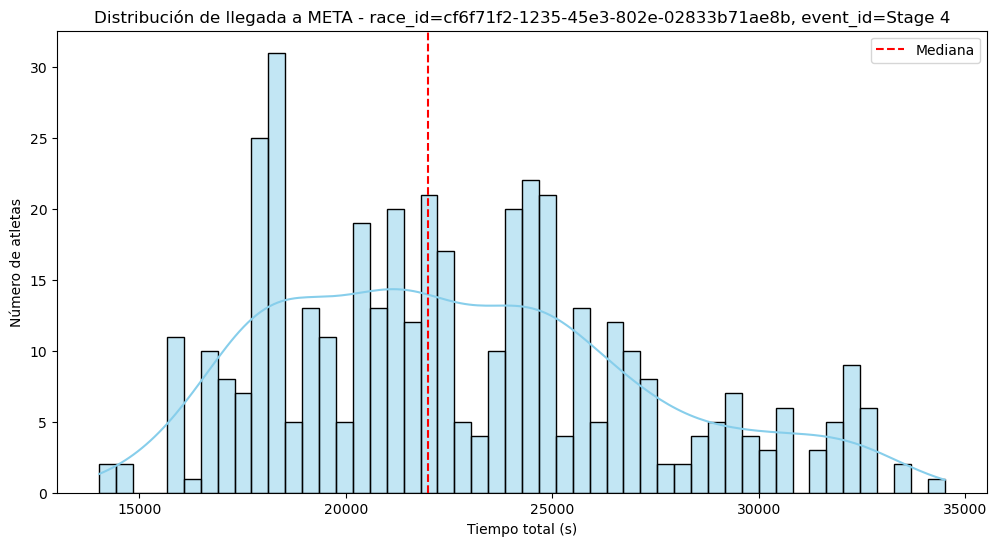

Mediana total a META: 21999.4 s
MAD: 3070.0 s
Atletas outliers MAD: 26 de 426
Atletas outliers percentil 1: 5
Atletas outliers percentil 99: 5

Ejemplos de outliers MAD:


,athlete_id,average,averageNet,distance,event_id,incidence,isBackup,location,net,netTime,offset,order,originalTime,race_id,rawTime,raw_backupOffset,raw_chip,raw_created,raw_device,raw_id,raw_import,raw_importId,raw_isBackup,raw_location,raw_manual,raw_offset,raw_originalTime,raw_rawTime,raw_rewind,raw_rewindId,raw_time,raw_times_official,raw_times_rawTime,raw_times_real,raw_type,raw_valid,split,time,weight,event_std,netTime_td,originalTime_td,raw_backupOffset_td,raw_times_official_td,raw_times_real_td,time_td,startRawTime,total_time_sec
27166,7b167227-8f2b-5f8c-8d1b-6202a946d7bf,0.48783,NaN,104000,Stage 4,NaN,NaN,,NaN,50665971.0,NaN,10,32734330.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-04 16:08:18.716,NaN,290,2025-05-04 16:08:21.647,TS2P8 243,7b167227-8f2b-5f8c-8d1b-6202a946d7bf,False,,NaN,E4 - META,NaN,0.0,2025-05-04 16:08:18.716,2025-05-04 16:08:18.716,False,,2025-05-04T16:08:18.716Z,32734330.0,2025-05-04 16:08:18.716,32734330.0,2,True,Meta,50734330,10.999995,stage,0 days 14:04:25.971000,0 days 09:05:34.330000,NaT,0 days 09:05:34.330000,0 days 09:05:34.330000,0 days 14:05:34.330000,2025-05-04 07:03:52.745,32665.971
27327,f4245c5a-8811-51c0-b718-8b016f6b8cb5,0.48778,NaN,104000,Stage 4,NaN,NaN,,NaN,50686272.0,NaN,10,32729420.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-04 16:08:13.806,NaN,400,2025-05-04 16:08:17.002,TS2P8 243,f4245c5a-8811-51c0-b718-8b016f6b8cb5,False,,NaN,E4 - META,NaN,0.0,2025-05-04 16:08:13.806,2025-05-04 16:08:13.806,False,,2025-05-04T16:08:13.806Z,32729420.0,2025-05-04 16:08:13.806,32729420.0,2,True,Meta,50729420,10.999995,stage,0 days 14:04:46.272000,0 days 09:05:29.420000,NaT,0 days 09:05:29.420000,0 days 09:05:29.420000,0 days 14:05:29.420000,2025-05-04 07:03:27.534,32686.272
27345,2e9a0ae4-542a-5766-be7a-a00b2bae2033,0.48216,NaN,104000,Stage 4,NaN,NaN,,NaN,50072032.0,NaN,10,32144719.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-04 15:58:29.105,NaN,221,2025-05-04 15:58:32.690,TS2P8 243,2e9a0ae4-542a-5766-be7a-a00b2bae2033,False,,NaN,E4 - META,NaN,0.0,2025-05-04 15:58:29.105,2025-05-04 15:58:29.105,False,,2025-05-04T15:58:29.105Z,32144719.0,2025-05-04 15:58:29.105,32144719.0,2,True,Meta,50144719,10.999995,stage,0 days 13:54:32.032000,0 days 08:55:44.719000,NaT,0 days 08:55:44.719000,0 days 08:55:44.719000,0 days 13:55:44.719000,2025-05-04 07:03:57.073,32072.032
27668,06cedd2a-fbaf-54b6-bd4b-8ba7feb6c735,0.30991,NaN,104000,Stage 4,NaN,NaN,,NaN,32178092.0,NaN,10,32230223.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-04 15:59:54.609,NaN,20,2025-05-04 15:59:57.673,TS2P8 243,06cedd2a-fbaf-54b6-bd4b-8ba7feb6c735,False,,NaN,E4 - META,NaN,0.0,2025-05-04 15:59:54.609,2025-05-04 15:59:54.609,False,,2025-05-04T15:59:54.609Z,32230223.0,2025-05-04 15:59:54.609,32230223.0,2,True,Meta,32230223,10.999997,stage,0 days 08:56:18.092000,0 days 08:57:10.223000,NaT,0 days 08:57:10.223000,0 days 08:57:10.223000,0 days 08:57:10.223000,2025-05-04 07:03:36.517,32178.092
27926,0a6e3323-3dac-5f3e-8fd0-1bd50da1b34f,0.47920,NaN,104000,Stage 4,NaN,NaN,,NaN,49737868.0,NaN,10,31836516.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-04 15:53:20.902,NaN,125,2025-05-04 15:53:24.832,TS2P8 243,0a6e3323-3dac-5f3e-8fd0-1bd50da1b34f,False,,NaN,E4 - META,NaN,0.0,2025-05-04 15:53:20.902,2025-05-04 15:53:20.902,False,,2025-05-04T15:53:20.902Z,31836516.0,2025-05-04 15:53:20.902,31836516.0,2,True,Meta,49836516,10.999995,stage,0 days 13:48:57.868000,0 days 08:50:36.516000,NaT,0 days 08:50:36.516000,0 days 08:50:36.516000,0 days 13:50:36.516000,2025-05-04 07:04:23.034,31737.868
27932,f692b6a4-11fa-5225-bc0a-c04da4d986b7,0.47779,NaN,104000,Stage 4,NaN,NaN,,NaN,49658351.0,NaN,10,31689728.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-04 15:50:54.114,NaN,176,2025-05-04 15:50:57.917,TS2P8 243,f692b6a4-11fa-5225-bc0a-c04da4d986b7,False,,NaN,E4 - META,NaN,0.0,2025-05-04 15:50:54.114,2025-05-04 15:50:54.114,False,,2025-05-04T15:50:54.114Z,31689728.0,2025-05-04 15:50:54.114,31689728.0,2,True,Meta,49689728,10.999995,stage,0 days 13:47:38.351000,0 days


Ejemplos de outliers percentiles:


,athlete_id,average,averageNet,distance,event_id,incidence,isBackup,location,net,netTime,offset,order,originalTime,race_id,rawTime,raw_backupOffset,raw_chip,raw_created,raw_device,raw_id,raw_import,raw_importId,raw_isBackup,raw_location,raw_manual,raw_offset,raw_originalTime,raw_rawTime,raw_rewind,raw_rewindId,raw_time,raw_times_official,raw_times_rawTime,raw_times_real,raw_type,raw_valid,split,time,weight,event_std,netTime_td,originalTime_td,raw_backupOffset_td,raw_times_official_td,raw_times_real_td,time_td,startRawTime,total_time_sec
27184,4d325944-3693-5adf-a199-43b47210f9db,0.13530,NaN,104000,Stage 4,NaN,NaN,,NaN,14026555.0,NaN,10,14070787.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-04 10:57:15.173,NaN,1,2025-05-04 10:57:19.054,TS2P8 243,4d325944-3693-5adf-a199-43b47210f9db,False,,NaN,E4 - META,NaN,0.0,2025-05-04 10:57:15.173,2025-05-04 10:57:15.173,False,,2025-05-04T10:57:15.173Z,14070787.0,2025-05-04 10:57:15.173,14070787.0,2,True,Meta,14070787,10.999999,stage,0 days 03:53:46.555000,0 days 03:54:30.787000,NaT,0 days 03:54:30.787000,0 days 03:54:30.787000,0 days 03:54:30.787000,2025-05-04 07:03:28.618,14026.555
27755,35b3cb57-c982-559f-9b1b-4411975ea175,0.13530,NaN,104000,Stage 4,True,NaN,,NaN,14068267.0,NaN,10,14070800.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-04 10:57:15.186,NaN,,NaT,,nan,NaN,,NaN,E4 - META,False,NaN,NaT,2025-05-04 10:57:15.186,NaN,,,NaN,NaT,NaN,nan,NaN,Meta,14070800,10.999999,stage,0 days 03:54:28.267000,0 days 03:54:30.800000,NaT,NaT,NaT,0 days 03:54:30.800000,2025-05-04 07:02:46.919,14068.267
27965,b09f286b-d893-5548-8bdc-64ba245e9604,0.14152,NaN,104000,Stage 4,NaN,NaN,,NaN,14714851.0,NaN,10,14718324.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-04 11:08:02.710,NaN,2,2025-05-04 11:08:06.261,TS2P8 243,b09f286b-d893-5548-8bdc-64ba245e9604,False,,NaN,E4 - META,NaN,0.0,2025-05-04 11:08:02.710,2025-05-04 11:08:02.710,False,,2025-05-04T11:08:02.710Z,14718324.0,2025-05-04 11:08:02.710,14718324.0,2,True,Meta,14718324,10.999999,stage,0 days 04:05:14.851000,0 days 04:05:18.324000,NaT,0 days 04:05:18.324000,0 days 04:05:18.324000,0 days 04:05:18.324000,2025-05-04 07:02:47.859,14714.851
29125,0ef12dba-e013-58ab-b4ab-65a1a1a21889,0.15211,NaN,104000,Stage 4,NaN,NaN,,NaN,15813613.0,NaN,10,15819061.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-04 11:26:23.447,NaN,78,2025-05-04 11:26:27.937,TS2P8 243,0ef12dba-e013-58ab-b4ab-65a1a1a21889,False,,NaN,E4 - META,NaN,0.0,2025-05-04 11:26:23.447,2025-05-04 11:26:23.447,False,,2025-05-04T11:26:23.447Z,15819061.0,2025-05-04 11:26:23.447,15819061.0,2,True,Meta,15819061,10.999998,stage,0 days 04:23:33.613000,0 days 04:23:39.061000,NaT,0 days 04:23:39.061000,0 days 04:23:39.061000,0 days 04:23:39.061000,2025-05-04 07:02:49.834,15813.613
29420,9ef98b72-d122-533c-968e-394d879f3c3c,0.14152,NaN,104000,Stage 4,True,NaN,,NaN,14714480.0,NaN,10,14718400.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-04 11:08:02.786,NaN,,NaT,,nan,NaN,,NaN,E4 - META,False,NaN,NaT,2025-05-04 11:08:02.786,NaN,,,NaN,NaT,NaN,nan,NaN,Meta,14718400,10.999999,stage,0 days 04:05:14.480000,0 days 04:05:18.400000,NaT,NaT,NaT,0 days 04:05:18.400000,2025-05-04 07:02:48.306,14714.480
27327,f4245c5a-8811-51c0-b718-8b016f6b8cb5,0.48778,NaN,104000,Stage 4,NaN,NaN,,NaN,50686272.0,NaN,10,32729420.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-04 16:08:13.806,NaN,400,2025-05-04 16:08:17.002,TS2P8 243,f4245c5a-8811-51c0-b718-8b016f6b8cb5,False,,NaN,E4 - META,NaN,0.0,2025-05-04 16:08:13.806,2025-05-04 16:08:13.806,False,,2025-05-04T16:08:13.806Z,32729420.0,2025-05-04 16:08:13.806,32729420.0,2,True,Meta,50729420,10.999995,stage,0 days 14:04:46.272000,0 days 09:05:29.420000,NaT,0 days 09:05:29.420000,0 days 09:05:29.420000,0 days 14:05:29.420000,2025-05-04 07:03:27.534,32686.272
28037,5dfb0ad8-6857-5875-b4db-e67220e006bf,0.50573,NaN,104000,Stage 4,NaN,NaN,,NaN,52504005.0,NaN,10,34595685.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-04 16:39:20.071,NaN,439,2025-05-04 16:39:25.811,TS2P8 243,5dfb0ad8-6857-5875-b4db-e67


=== Análisis de META para race_id = cf6f71f2-1235-45e3-802e-02833b71ae8b, event_id = Stage 5 ===


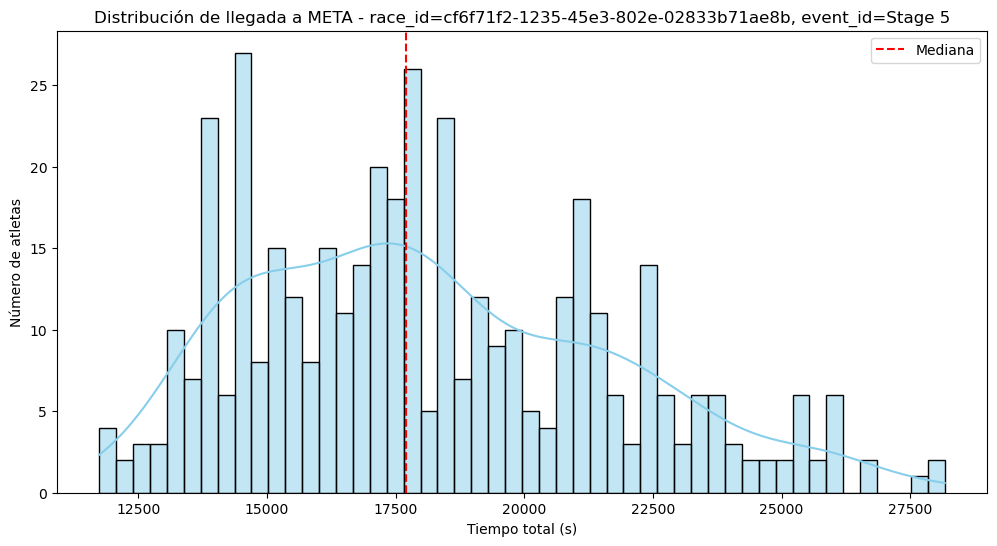

Mediana total a META: 17707.5 s
MAD: 2637.9 s
Atletas outliers MAD: 13 de 420
Atletas outliers percentil 1: 5
Atletas outliers percentil 99: 5

Ejemplos de outliers MAD:


,athlete_id,average,averageNet,distance,event_id,incidence,isBackup,location,net,netTime,offset,order,originalTime,race_id,rawTime,raw_backupOffset,raw_chip,raw_created,raw_device,raw_id,raw_import,raw_importId,raw_isBackup,raw_location,raw_manual,raw_offset,raw_originalTime,raw_rawTime,raw_rewind,raw_rewindId,raw_time,raw_times_official,raw_times_rawTime,raw_times_real,raw_type,raw_valid,split,time,weight,event_std,netTime_td,originalTime_td,raw_backupOffset_td,raw_times_official_td,raw_times_real_td,time_td,startRawTime,total_time_sec
27492,1f9e843d-c956-5658-90f1-b970c45f3d4e,0.29287,NaN,91000,Stage 5,NaN,NaN,,NaN,26595633.0,NaN,10,26650842.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-05 14:27:28.842,NaN,236,2025-05-05 14:27:33.811,TS2P8 243,1f9e843d-c956-5658-90f1-b970c45f3d4e,False,,NaN,E5 - META,NaN,0.0,2025-05-05 14:27:28.842,2025-05-05 14:27:28.842,False,,2025-05-05T14:27:28.842Z,26650842.0,2025-05-05 14:27:28.842,26650842.0,2,True,Meta,26650842,10.999997,stage,0 days 07:23:15.633000,0 days 07:24:10.842000,NaT,0 days 07:24:10.842000,0 days 07:24:10.842000,0 days 07:24:10.842000,2025-05-05 07:04:13.209,26595.633
27522,d60bcb98-913f-5234-8330-911129c7e102,0.31041,NaN,91000,Stage 5,NaN,NaN,,NaN,28170862.0,NaN,10,28247536.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-05 14:54:05.536,NaN,463,2025-05-05 14:54:11.261,TS2P8 243,d60bcb98-913f-5234-8330-911129c7e102,False,,NaN,E5 - META,NaN,0.0,2025-05-05 14:54:05.536,2025-05-05 14:54:05.536,False,,2025-05-05T14:54:05.536Z,28247536.0,2025-05-05 14:54:05.536,28247536.0,2,True,Meta,28247536,10.999997,stage,0 days 07:49:30.862000,0 days 07:50:47.536000,NaT,0 days 07:50:47.536000,0 days 07:50:47.536000,0 days 07:50:47.536000,2025-05-05 07:04:34.674,28170.862
28038,5dfb0ad8-6857-5875-b4db-e67220e006bf,0.30434,NaN,91000,Stage 5,NaN,NaN,,NaN,27609580.0,NaN,10,27694692.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-05 14:44:52.692,NaN,439,2025-05-05 14:44:57.431,TS2P8 243,5dfb0ad8-6857-5875-b4db-e67220e006bf,False,,NaN,E5 - META,NaN,0.0,2025-05-05 14:44:52.692,2025-05-05 14:44:52.692,False,,2025-05-05T14:44:52.692Z,27694692.0,2025-05-05 14:44:52.692,27694692.0,2,True,Meta,27694692,10.999997,stage,0 days 07:40:09.580000,0 days 07:41:34.692000,NaT,0 days 07:41:34.692000,0 days 07:41:34.692000,0 days 07:41:34.692000,2025-05-05 07:04:43.112,27609.580
28068,3304619f-941a-58cb-8d8f-ed03b6665ae7,0.28814,NaN,91000,Stage 5,NaN,NaN,,NaN,26130535.0,NaN,10,26220889.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-05 14:20:18.889,NaN,223,2025-05-05 14:20:23.294,TS2P8 243,3304619f-941a-58cb-8d8f-ed03b6665ae7,False,,NaN,E5 - META,NaN,0.0,2025-05-05 14:20:18.889,2025-05-05 14:20:18.889,False,,2025-05-05T14:20:18.889Z,26220889.0,2025-05-05 14:20:18.889,26220889.0,2,True,Meta,26220889,10.999997,stage,0 days 07:15:30.535000,0 days 07:17:00.889000,NaT,0 days 07:17:00.889000,0 days 07:17:00.889000,0 days 07:17:00.889000,2025-05-05 07:04:48.354,26130.535
28311,676e33b9-e648-5459-a149-a4bf740ca225,0.29287,NaN,91000,Stage 5,NaN,NaN,,NaN,26596338.0,NaN,10,26651604.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-05 14:27:29.604,NaN,235,2025-05-05 14:27:35.634,TS2P8 3,676e33b9-e648-5459-a149-a4bf740ca225,False,,NaN,E5 - META,NaN,0.0,2025-05-05 14:27:29.604,2025-05-05 14:27:29.604,False,,2025-05-05T14:27:29.604Z,26651604.0,2025-05-05 14:27:29.604,26651604.0,2,True,Meta,26651604,10.999997,stage,0 days 07:23:16.338000,0 days 07:24:11.604000,NaT,0 days 07:24:11.604000,0 days 07:24:11.604000,0 days 07:24:11.604000,2025-05-05 07:04:13.266,26596.338
28329,e2e8cffb-36f4-5af8-a163-50b07150594e,0.28503,NaN,91000,Stage 5,NaN,NaN,,NaN,25831202.0,NaN,10,25937541.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-05 14:15:35.541,NaN,55,2025-05-05 14:15:40.036,TS2P8 243,e2e8cffb-36f4-5af8-a163-50b07150594e,False,,NaN,E5 - META,NaN,0.0,2025-05-05 14:15:35.541,2025-05-05 14:15:35.541,False,,2025-05-05T14:15:35.541Z,25937541.0,2025-05-05 14:15:35.541,25937541.0,2,True,Meta,25937541,10.999997,stage,0 days 07:10:31.202000,0 days 07:12:1


Ejemplos de outliers percentiles:


,athlete_id,average,averageNet,distance,event_id,incidence,isBackup,location,net,netTime,offset,order,originalTime,race_id,rawTime,raw_backupOffset,raw_chip,raw_created,raw_device,raw_id,raw_import,raw_importId,raw_isBackup,raw_location,raw_manual,raw_offset,raw_originalTime,raw_rawTime,raw_rewind,raw_rewindId,raw_time,raw_times_official,raw_times_rawTime,raw_times_real,raw_type,raw_valid,split,time,weight,event_std,netTime_td,originalTime_td,raw_backupOffset_td,raw_times_official_td,raw_times_real_td,time_td,startRawTime,total_time_sec
27185,4d325944-3693-5adf-a199-43b47210f9db,0.12930,NaN,91000,Stage 5,NaN,NaN,,NaN,11740502.0,NaN,10,11766655.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-05 10:19:24.655,NaN,1,2025-05-05 10:19:59.983,TS2P8 243,4d325944-3693-5adf-a199-43b47210f9db,False,,NaN,E5 - META,NaN,0.0,2025-05-05 10:19:24.655,2025-05-05 10:19:24.655,False,,2025-05-05T10:19:24.655Z,11766655.0,2025-05-05 10:19:24.655,11766655.0,2,True,Meta,11766655,10.999999,stage,0 days 03:15:40.502000,0 days 03:16:06.655000,NaT,0 days 03:16:06.655000,0 days 03:16:06.655000,0 days 03:16:06.655000,2025-05-05 07:03:44.153,11740.502
27756,35b3cb57-c982-559f-9b1b-4411975ea175,0.12931,NaN,91000,Stage 5,NaN,NaN,,NaN,11765747.0,NaN,10,11766827.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-05 10:19:24.827,NaN,35083,2025-05-05 10:19:59.983,TS2P8 243,35b3cb57-c982-559f-9b1b-4411975ea175,False,,NaN,E5 - META,NaN,0.0,2025-05-05 10:19:24.827,2025-05-05 10:19:24.827,False,,2025-05-05T10:19:24.827Z,11766827.0,2025-05-05 10:19:24.827,11766827.0,2,True,Meta,11766827,10.999999,stage,0 days 03:16:05.747000,0 days 03:16:06.827000,NaT,0 days 03:16:06.827000,0 days 03:16:06.827000,0 days 03:16:06.827000,2025-05-05 07:03:19.080,11765.747
27966,b09f286b-d893-5548-8bdc-64ba245e9604,0.12991,NaN,91000,Stage 5,NaN,NaN,,NaN,11820546.0,NaN,10,11822169.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-05 10:20:20.169,NaN,2,2025-05-05 10:20:25.053,TS2P8 3,b09f286b-d893-5548-8bdc-64ba245e9604,False,,NaN,E5 - META,NaN,0.0,2025-05-05 10:20:20.169,2025-05-05 10:20:20.169,False,,2025-05-05T10:20:20.169Z,11822169.0,2025-05-05 10:20:20.169,11822169.0,2,True,Meta,11822169,10.999999,stage,0 days 03:17:00.546000,0 days 03:17:02.169000,NaT,0 days 03:17:02.169000,0 days 03:17:02.169000,0 days 03:17:02.169000,2025-05-05 07:03:19.623,11820.546
28180,21ff2d4d-a5c6-552c-ae14-08a17f94db60,0.12992,NaN,91000,Stage 5,NaN,NaN,,NaN,11821906.0,NaN,10,11822389.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-05 10:20:20.389,NaN,3,2025-05-05 10:20:25.053,TS2P8 3,21ff2d4d-a5c6-552c-ae14-08a17f94db60,False,,NaN,E5 - META,NaN,0.0,2025-05-05 10:20:20.389,2025-05-05 10:20:20.389,False,,2025-05-05T10:20:20.389Z,11822389.0,2025-05-05 10:20:20.389,11822389.0,2,True,Meta,11822389,10.999999,stage,0 days 03:17:01.906000,0 days 03:17:02.389000,NaT,0 days 03:17:02.389000,0 days 03:17:02.389000,0 days 03:17:02.389000,2025-05-05 07:03:18.483,11821.906
29421,9ef98b72-d122-533c-968e-394d879f3c3c,0.13312,NaN,91000,Stage 5,NaN,NaN,,NaN,12112460.0,NaN,10,12114144.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-05 10:25:12.144,NaN,12,2025-05-05 10:25:17.481,TS2P8 243,9ef98b72-d122-533c-968e-394d879f3c3c,False,,NaN,E5 - META,NaN,0.0,2025-05-05 10:25:12.144,2025-05-05 10:25:12.144,False,,2025-05-05T10:25:12.144Z,12114144.0,2025-05-05 10:25:12.144,12114144.0,2,True,Meta,12114144,10.999999,stage,0 days 03:21:52.460000,0 days 03:21:54.144000,NaT,0 days 03:21:54.144000,0 days 03:21:54.144000,0 days 03:21:54.144000,2025-05-05 07:03:19.684,12112.460
27492,1f9e843d-c956-5658-90f1-b970c45f3d4e,0.29287,NaN,91000,Stage 5,NaN,NaN,,NaN,26595633.0,NaN,10,26650842.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-05 14:27:28.842,NaN,236,2025-05-05 14:27:33.811,TS2P8 243,1f9e843d-c956-5658-90f1-b970c45f3d4e,False,,NaN,E5 - META,NaN,0.0,2025-05-05 14:27:28.842,2025-05-05 14:27:28.842,False,,2025-05-05T14:27:28.842Z,26650842.0,2025-05-05 14:27:28.842,26650842.0,2,True,Meta,26650842,10.999997,stage,0 days 07:23:15.633000,0 days 07:24:10.8420


=== Análisis de META para race_id = cf6f71f2-1235-45e3-802e-02833b71ae8b, event_id = Stage 6 ===


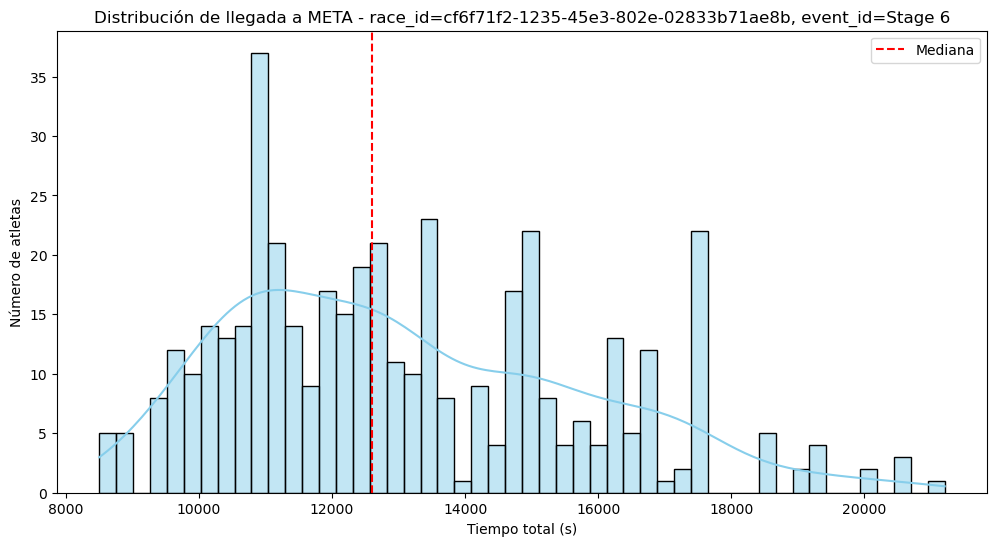

Mediana total a META: 12606.2 s
MAD: 1816.7 s
Atletas outliers MAD: 17 de 433
Atletas outliers percentil 1: 5
Atletas outliers percentil 99: 5

Ejemplos de outliers MAD:


,athlete_id,average,averageNet,distance,event_id,incidence,isBackup,location,net,netTime,offset,order,originalTime,race_id,rawTime,raw_backupOffset,raw_chip,raw_created,raw_device,raw_id,raw_import,raw_importId,raw_isBackup,raw_location,raw_manual,raw_offset,raw_originalTime,raw_rawTime,raw_rewind,raw_rewindId,raw_time,raw_times_official,raw_times_rawTime,raw_times_real,raw_type,raw_valid,split,time,weight,event_std,netTime_td,originalTime_td,raw_backupOffset_td,raw_times_official_td,raw_times_real_td,time_td,startRawTime,total_time_sec
27168,7b167227-8f2b-5f8c-8d1b-6202a946d7bf,0.32848,NaN,61000,Stage 6,NaN,NaN,,NaN,20037285.0,NaN,9,20037285.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-06 12:47:02.285,NaN,290,2025-05-06 12:47:05.989,TS2P8 243,7b167227-8f2b-5f8c-8d1b-6202a946d7bf,False,,NaN,E6 - META,NaN,0.0,2025-05-06 12:47:02.285,2025-05-06 12:47:02.285,False,,2025-05-06T12:47:02.285Z,20037285.0,2025-05-06 12:47:02.285,20037285.0,2,True,Meta,20037285,9.999998,stage,0 days 05:33:57.285000,0 days 05:33:57.285000,NaT,0 days 05:33:57.285000,0 days 05:33:57.285000,0 days 05:33:57.285000,2025-05-06 07:04:00.707,20581.578
27523,d60bcb98-913f-5234-8330-911129c7e102,0.29430,NaN,61000,Stage 6,NaN,NaN,,NaN,17952035.0,NaN,9,17952035.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-06 12:12:17.035,NaN,463,2025-05-06 12:12:26.039,TS2P8 243,d60bcb98-913f-5234-8330-911129c7e102,False,,NaN,E6 - META,NaN,0.0,2025-05-06 12:12:17.035,2025-05-06 12:12:17.035,False,,2025-05-06T12:12:17.035Z,17952035.0,2025-05-06 12:12:17.035,17952035.0,2,True,Meta,17952035,9.999998,stage,0 days 04:59:12.035000,0 days 04:59:12.035000,NaT,0 days 04:59:12.035000,0 days 04:59:12.035000,0 days 04:59:12.035000,2025-05-06 07:03:54.658,18502.377
28039,5dfb0ad8-6857-5875-b4db-e67220e006bf,0.30161,NaN,61000,Stage 6,NaN,NaN,,NaN,18397953.0,NaN,9,18397953.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-06 12:19:42.953,NaN,439,2025-05-06 12:19:46.270,TS2P8 243,5dfb0ad8-6857-5875-b4db-e67220e006bf,False,,NaN,E6 - META,NaN,0.0,2025-05-06 12:19:42.953,2025-05-06 12:19:42.953,False,,2025-05-06T12:19:42.953Z,18397953.0,2025-05-06 12:19:42.953,18397953.0,2,True,Meta,18397953,9.999998,stage,0 days 05:06:37.953000,0 days 05:06:37.953000,NaT,0 days 05:06:37.953000,0 days 05:06:37.953000,0 days 05:06:37.953000,2025-05-06 07:04:01.641,18941.312
28069,3304619f-941a-58cb-8d8f-ed03b6665ae7,0.30771,NaN,61000,Stage 6,NaN,NaN,,NaN,18770191.0,NaN,9,18770191.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-06 12:25:55.191,NaN,223,2025-05-06 12:25:56.554,TS2P8 243,3304619f-941a-58cb-8d8f-ed03b6665ae7,False,,NaN,E6 - META,NaN,0.0,2025-05-06 12:25:55.191,2025-05-06 12:25:55.191,False,,2025-05-06T12:25:55.191Z,18770191.0,2025-05-06 12:25:55.191,18770191.0,2,True,Meta,18770191,9.999998,stage,0 days 05:12:50.191000,0 days 05:12:50.191000,NaT,0 days 05:12:50.191000,0 days 05:12:50.191000,0 days 05:12:50.191000,2025-05-06 07:04:09.402,19305.789
28151,01f3ab93-17f9-5414-9023-93832a5e40f9,0.30770,NaN,61000,Stage 6,NaN,NaN,,NaN,18769707.0,NaN,9,18769707.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-06 12:25:54.707,NaN,410,2025-05-06 12:25:58.145,TS2P8 243,01f3ab93-17f9-5414-9023-93832a5e40f9,False,,NaN,E6 - META,NaN,0.0,2025-05-06 12:25:54.707,2025-05-06 12:25:54.707,False,,2025-05-06T12:25:54.707Z,18769707.0,2025-05-06 12:25:54.707,18769707.0,2,True,Meta,18769707,9.999998,stage,0 days 05:12:49.707000,0 days 05:12:49.707000,NaT,0 days 05:12:49.707000,0 days 05:12:49.707000,0 days 05:12:49.707000,2025-05-06 07:04:01.014,19313.693
28341,a3982101-3edf-56e9-8aa5-01609f2ddbe2,0.29429,NaN,61000,Stage 6,NaN,NaN,,NaN,17951744.0,NaN,9,17951744.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-06 12:12:16.744,NaN,464,2025-05-06 12:12:26.039,TS2P8 243,a3982101-3edf-56e9-8aa5-01609f2ddbe2,False,,NaN,E6 - META,NaN,0.0,2025-05-06 12:12:16.744,2025-05-06 12:12:16.744,False,,2025-05-06T12:12:16.744Z,17951744.0,2025-05-06 12:12:16.744,17951744.0,2,True,Meta,17951744,9.999998,stage,0 days 04:59:11.744000,0 days 04:59:11.744000,


Ejemplos de outliers percentiles:


,athlete_id,average,averageNet,distance,event_id,incidence,isBackup,location,net,netTime,offset,order,originalTime,race_id,rawTime,raw_backupOffset,raw_chip,raw_created,raw_device,raw_id,raw_import,raw_importId,raw_isBackup,raw_location,raw_manual,raw_offset,raw_originalTime,raw_rawTime,raw_rewind,raw_rewindId,raw_time,raw_times_official,raw_times_rawTime,raw_times_real,raw_type,raw_valid,split,time,weight,event_std,netTime_td,originalTime_td,raw_backupOffset_td,raw_times_official_td,raw_times_real_td,time_td,startRawTime,total_time_sec
27186,4d325944-3693-5adf-a199-43b47210f9db,0.13005,NaN,61000,Stage 6,NaN,NaN,,NaN,7933339.0,NaN,9,7933339.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-06 09:25:18.339,NaN,1,2025-05-06 09:25:21.096,TS2P8 243,4d325944-3693-5adf-a199-43b47210f9db,False,,NaN,E6 - META,NaN,0.0,2025-05-06 09:25:18.339,2025-05-06 09:25:18.339,False,,2025-05-06T09:25:18.339Z,7933339.0,2025-05-06 09:25:18.339,7933339.0,2,True,Meta,7933339,9.999999,stage,0 days 02:12:13.339000,0 days 02:12:13.339000,NaT,0 days 02:12:13.339000,0 days 02:12:13.339000,0 days 02:12:13.339000,2025-05-06 07:03:36.585,8501.754
27757,35b3cb57-c982-559f-9b1b-4411975ea175,0.13013,NaN,61000,Stage 6,NaN,NaN,,NaN,7938211.0,NaN,9,7938211.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-06 09:25:23.211,NaN,35083,2025-05-06 09:25:26.350,TS2P8 243,35b3cb57-c982-559f-9b1b-4411975ea175,False,,NaN,E6 - META,NaN,0.0,2025-05-06 09:25:23.211,2025-05-06 09:25:23.211,False,,2025-05-06T09:25:23.211Z,7938211.0,2025-05-06 09:25:23.211,7938211.0,2,True,Meta,7938211,9.999999,stage,0 days 02:12:18.211000,0 days 02:12:18.211000,NaT,0 days 02:12:18.211000,0 days 02:12:18.211000,0 days 02:12:18.211000,2025-05-06 07:02:42.535,8560.676
27967,b09f286b-d893-5548-8bdc-64ba245e9604,0.13085,NaN,61000,Stage 6,NaN,NaN,,NaN,7981990.0,NaN,9,7981990.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-06 09:26:06.990,NaN,2,2025-05-06 09:26:10.635,TS2P8 243,b09f286b-d893-5548-8bdc-64ba245e9604,False,,NaN,E6 - META,NaN,0.0,2025-05-06 09:26:06.990,2025-05-06 09:26:06.990,False,,2025-05-06T09:26:06.990Z,7981990.0,2025-05-06 09:26:06.990,7981990.0,2,True,Meta,7981990,9.999999,stage,0 days 02:13:01.990000,0 days 02:13:01.990000,NaT,0 days 02:13:01.990000,0 days 02:13:01.990000,0 days 02:13:01.990000,2025-05-06 07:02:41.655,8605.335
28181,21ff2d4d-a5c6-552c-ae14-08a17f94db60,0.13084,NaN,61000,Stage 6,NaN,NaN,,NaN,7981411.0,NaN,9,7981411.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-06 09:26:06.411,NaN,3,2025-05-06 09:26:10.635,TS2P8 243,21ff2d4d-a5c6-552c-ae14-08a17f94db60,False,,NaN,E6 - META,NaN,0.0,2025-05-06 09:26:06.411,2025-05-06 09:26:06.411,False,,2025-05-06T09:26:06.411Z,7981411.0,2025-05-06 09:26:06.411,7981411.0,2,True,Meta,7981411,9.999999,stage,0 days 02:13:01.411000,0 days 02:13:01.411000,NaT,0 days 02:13:01.411000,0 days 02:13:01.411000,0 days 02:13:01.411000,2025-05-06 07:02:40.736,8605.675
29422,9ef98b72-d122-533c-968e-394d879f3c3c,0.13011,NaN,61000,Stage 6,NaN,NaN,,NaN,7936815.0,NaN,9,7936815.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-06 09:25:21.815,NaN,12,2025-05-06 09:25:25.233,TS2P8 243,9ef98b72-d122-533c-968e-394d879f3c3c,False,,NaN,E6 - META,NaN,0.0,2025-05-06 09:25:21.815,2025-05-06 09:25:21.815,False,,2025-05-06T09:25:21.815Z,7936815.0,2025-05-06 09:25:21.815,7936815.0,2,True,Meta,7936815,9.999999,stage,0 days 02:12:16.815000,0 days 02:12:16.815000,NaT,0 days 02:12:16.815000,0 days 02:12:16.815000,0 days 02:12:16.815000,2025-05-06 07:02:42.114,8559.701
27168,7b167227-8f2b-5f8c-8d1b-6202a946d7bf,0.32848,NaN,61000,Stage 6,NaN,NaN,,NaN,20037285.0,NaN,9,20037285.0,cf6f71f2-1235-45e3-802e-02833b71ae8b,2025-05-06 12:47:02.285,NaN,290,2025-05-06 12:47:05.989,TS2P8 243,7b167227-8f2b-5f8c-8d1b-6202a946d7bf,False,,NaN,E6 - META,NaN,0.0,2025-05-06 12:47:02.285,2025-05-06 12:47:02.285,False,,2025-05-06T12:47:02.285Z,20037285.0,2025-05-06 12:47:02.285,20037285.0,2,True,Meta,20037285,9.999998,stage,0 days 05:33:57.285000,0 days 05:33:57.285000,NaT,0 days 05:33:57.285000,0 days 0


=== Análisis de META para race_id = ad64fc28-2968-4993-a182-f642c0310a93, event_id = Medio Maratón ===


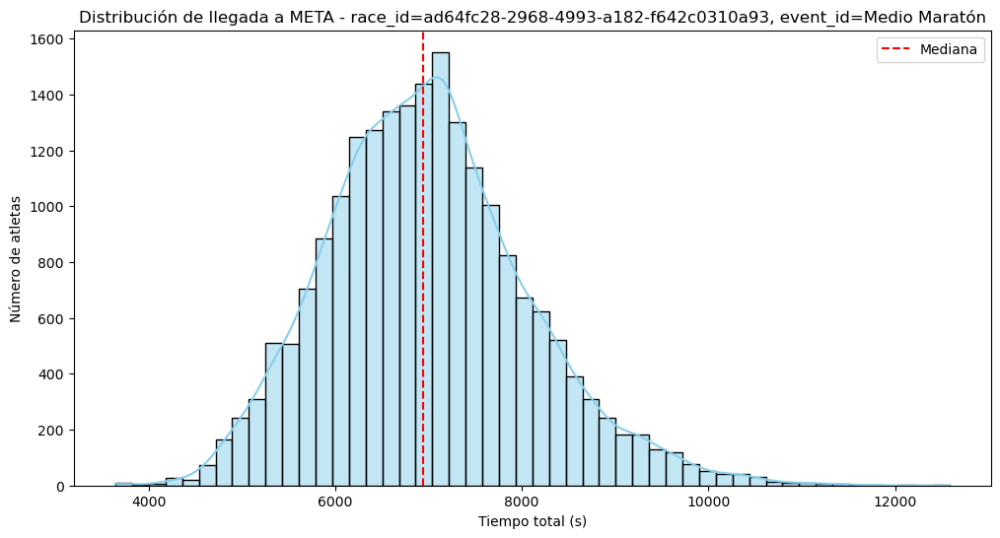

Mediana total a META: 6937.1 s
MAD: 691.5 s
Atletas outliers MAD: 1169 de 20751
Atletas outliers percentil 1: 207
Atletas outliers percentil 99: 207

Ejemplos de outliers MAD:


,athlete_id,average,averageNet,distance,event_id,incidence,isBackup,location,net,netTime,offset,order,originalTime,race_id,rawTime,raw_backupOffset,raw_chip,raw_created,raw_device,raw_id,raw_import,raw_importId,raw_isBackup,raw_location,raw_manual,raw_offset,raw_originalTime,raw_rawTime,raw_rewind,raw_rewindId,raw_time,raw_times_official,raw_times_rawTime,raw_times_real,raw_type,raw_valid,split,time,weight,event_std,netTime_td,originalTime_td,raw_backupOffset_td,raw_times_official_td,raw_times_real_td,time_td,startRawTime,total_time_sec
29776,1,0.18255,NaN,21097,Medio Maratón,NaN,NaN,,NaN,3849553.0,NaN,6,3851208.0,ad64fc28-2968-4993-a182-f642c0310a93,2025-04-06 08:19:11.708,NaN,50001,2025-04-06 08:19:15.307,TSONE 4,1,False,,NaN,Meta,NaN,0.0,2025-04-06 08:19:11.708,2025-04-06 08:19:11.708,False,,2025-04-06T08:19:11.708Z,3851208.0,2025-04-06 08:19:11.708,3851208.0,2.0,True,Meta,3851208,7.0,media,0 days 01:04:09.553000,0 days 01:04:11.208000,NaT,0 days 01:04:11.208000,0 days 01:04:11.208000,0 days 01:04:11.208000,2025-04-06 07:15:02.155,3849.553
29777,2,0.17891,NaN,21097,Medio Maratón,NaN,NaN,,NaN,3774464.0,NaN,6,3774464.0,ad64fc28-2968-4993-a182-f642c0310a93,2025-04-06 08:17:54.964,NaN,40002,2025-04-06 08:17:59.965,TS2P4 6,2,False,,NaN,Meta,NaN,0.0,2025-04-06 08:17:54.964,2025-04-06 08:17:54.964,False,,2025-04-06T08:17:54.964Z,3774464.0,2025-04-06 08:17:54.964,3774464.0,2.0,True,Meta,3774464,7.0,media,0 days 01:02:54.464000,0 days 01:02:54.464000,NaT,0 days 01:02:54.464000,0 days 01:02:54.464000,0 days 01:02:54.464000,2025-04-06 07:15:00.500,3774.464
29778,3,0.17368,NaN,21097,Medio Maratón,NaN,NaN,,NaN,3664133.0,NaN,6,3664133.0,ad64fc28-2968-4993-a182-f642c0310a93,2025-04-06 08:16:04.633,NaN,3,2025-04-06 08:16:07.537,TSONE 4,3,False,,NaN,Meta,NaN,0.0,2025-04-06 08:16:04.633,2025-04-06 08:16:04.633,False,,2025-04-06T08:16:04.633Z,3664133.0,2025-04-06 08:16:04.633,3664133.0,2.0,True,Meta,3664133,7.0,media,0 days 01:01:04.133000,0 days 01:01:04.133000,NaT,0 days 01:01:04.133000,0 days 01:01:04.133000,0 days 01:01:04.133000,2025-04-06 07:15:00.500,3664.133
29779,4,0.17439,NaN,21097,Medio Maratón,NaN,NaN,,NaN,3679134.0,NaN,6,3679134.0,ad64fc28-2968-4993-a182-f642c0310a93,2025-04-06 08:16:19.634,NaN,4,2025-04-06 08:16:24.009,TS2P4 6,4,False,,NaN,Meta,NaN,0.0,2025-04-06 08:16:19.634,2025-04-06 08:16:19.634,False,,2025-04-06T08:16:19.634Z,3679134.0,2025-04-06 08:16:19.634,3679134.0,2.0,True,Meta,3679134,7.0,media,0 days 01:01:19.134000,0 days 01:01:19.134000,NaT,0 days 01:01:19.134000,0 days 01:01:19.134000,0 days 01:01:19.134000,2025-04-06 07:15:00.500,3679.134
29780,5,0.17983,NaN,21097,Medio Maratón,NaN,NaN,,NaN,3791747.0,NaN,6,3793935.0,ad64fc28-2968-4993-a182-f642c0310a93,2025-04-06 08:18:14.435,NaN,40005,2025-04-06 08:18:20.233,TS2P4 6,5,False,,NaN,Meta,NaN,0.0,2025-04-06 08:18:14.435,2025-04-06 08:18:14.435,False,,2025-04-06T08:18:14.435Z,3793935.0,2025-04-06 08:18:14.435,3793935.0,2.0,True,Meta,3793935,7.0,media,0 days 01:03:11.747000,0 days 01:03:13.935000,NaT,0 days 01:03:13.935000,0 days 01:03:13.935000,0 days 01:03:13.935000,2025-04-06 07:15:02.688,3791.747
29781,6,0.17960,NaN,21097,Medio Maratón,NaN,NaN,,NaN,3787217.0,NaN,6,3789004.0,ad64fc28-2968-4993-a182-f642c0310a93,2025-04-06 08:18:09.504,NaN,6,2025-04-06 08:18:13.605,TS2P4 6,6,False,,NaN,Meta,NaN,0.0,2025-04-06 08:18:09.504,2025-04-06 08:18:09.504,False,,2025-04-06T08:18:09.504Z,3789004.0,2025-04-06 08:18:09.504,3789004.0,2.0,True,Meta,3789004,7.0,media,0 days 01:03:07.217000,0 days 01:03:09.004000,NaT,0 days 01:03:09.004000,0 days 01:03:09.004000,0 days 01:03:09.004000,2025-04-06 07:15:02.287,3787.217
29782,7,0.17278,NaN,21097,Medio Maratón,NaN,NaN,,NaN,3645227.0,NaN,6,3645227.0,ad64fc28-2968-4993-a182-f642c0310a93,2025-04-06 08:15:45.727,NaN,40007,2025-04-06 08:15:49.098,TSONE 4,7,False,,NaN,Meta,NaN,0.0,2025-04-06 08:15:45.727,2025-04-06 08:15:45.727,False,,2025-04-06T08:15:45.727Z,3645227.0,2025-04-06 08:15:45.727,3645227.0,2.0,True,Meta,3645227,7.0,media,0 days 01


Ejemplos de outliers percentiles:


,athlete_id,average,averageNet,distance,event_id,incidence,isBackup,location,net,netTime,offset,order,originalTime,race_id,rawTime,raw_backupOffset,raw_chip,raw_created,raw_device,raw_id,raw_import,raw_importId,raw_isBackup,raw_location,raw_manual,raw_offset,raw_originalTime,raw_rawTime,raw_rewind,raw_rewindId,raw_time,raw_times_official,raw_times_rawTime,raw_times_real,raw_type,raw_valid,split,time,weight,event_std,netTime_td,originalTime_td,raw_backupOffset_td,raw_times_official_td,raw_times_real_td,time_td,startRawTime,total_time_sec
29776,1,0.18255,NaN,21097,Medio Maratón,NaN,NaN,,NaN,3849553.0,NaN,6,3851208.0,ad64fc28-2968-4993-a182-f642c0310a93,2025-04-06 08:19:11.708,NaN,50001,2025-04-06 08:19:15.307,TSONE 4,1,False,,NaN,Meta,NaN,0.0,2025-04-06 08:19:11.708,2025-04-06 08:19:11.708,False,,2025-04-06T08:19:11.708Z,3851208.0,2025-04-06 08:19:11.708,3851208.0,2.0,True,Meta,3851208,7.0,media,0 days 01:04:09.553000,0 days 01:04:11.208000,NaT,0 days 01:04:11.208000,0 days 01:04:11.208000,0 days 01:04:11.208000,2025-04-06 07:15:02.155,3849.553
29777,2,0.17891,NaN,21097,Medio Maratón,NaN,NaN,,NaN,3774464.0,NaN,6,3774464.0,ad64fc28-2968-4993-a182-f642c0310a93,2025-04-06 08:17:54.964,NaN,40002,2025-04-06 08:17:59.965,TS2P4 6,2,False,,NaN,Meta,NaN,0.0,2025-04-06 08:17:54.964,2025-04-06 08:17:54.964,False,,2025-04-06T08:17:54.964Z,3774464.0,2025-04-06 08:17:54.964,3774464.0,2.0,True,Meta,3774464,7.0,media,0 days 01:02:54.464000,0 days 01:02:54.464000,NaT,0 days 01:02:54.464000,0 days 01:02:54.464000,0 days 01:02:54.464000,2025-04-06 07:15:00.500,3774.464
29778,3,0.17368,NaN,21097,Medio Maratón,NaN,NaN,,NaN,3664133.0,NaN,6,3664133.0,ad64fc28-2968-4993-a182-f642c0310a93,2025-04-06 08:16:04.633,NaN,3,2025-04-06 08:16:07.537,TSONE 4,3,False,,NaN,Meta,NaN,0.0,2025-04-06 08:16:04.633,2025-04-06 08:16:04.633,False,,2025-04-06T08:16:04.633Z,3664133.0,2025-04-06 08:16:04.633,3664133.0,2.0,True,Meta,3664133,7.0,media,0 days 01:01:04.133000,0 days 01:01:04.133000,NaT,0 days 01:01:04.133000,0 days 01:01:04.133000,0 days 01:01:04.133000,2025-04-06 07:15:00.500,3664.133
29779,4,0.17439,NaN,21097,Medio Maratón,NaN,NaN,,NaN,3679134.0,NaN,6,3679134.0,ad64fc28-2968-4993-a182-f642c0310a93,2025-04-06 08:16:19.634,NaN,4,2025-04-06 08:16:24.009,TS2P4 6,4,False,,NaN,Meta,NaN,0.0,2025-04-06 08:16:19.634,2025-04-06 08:16:19.634,False,,2025-04-06T08:16:19.634Z,3679134.0,2025-04-06 08:16:19.634,3679134.0,2.0,True,Meta,3679134,7.0,media,0 days 01:01:19.134000,0 days 01:01:19.134000,NaT,0 days 01:01:19.134000,0 days 01:01:19.134000,0 days 01:01:19.134000,2025-04-06 07:15:00.500,3679.134
29780,5,0.17983,NaN,21097,Medio Maratón,NaN,NaN,,NaN,3791747.0,NaN,6,3793935.0,ad64fc28-2968-4993-a182-f642c0310a93,2025-04-06 08:18:14.435,NaN,40005,2025-04-06 08:18:20.233,TS2P4 6,5,False,,NaN,Meta,NaN,0.0,2025-04-06 08:18:14.435,2025-04-06 08:18:14.435,False,,2025-04-06T08:18:14.435Z,3793935.0,2025-04-06 08:18:14.435,3793935.0,2.0,True,Meta,3793935,7.0,media,0 days 01:03:11.747000,0 days 01:03:13.935000,NaT,0 days 01:03:13.935000,0 days 01:03:13.935000,0 days 01:03:13.935000,2025-04-06 07:15:02.688,3791.747
29781,6,0.17960,NaN,21097,Medio Maratón,NaN,NaN,,NaN,3787217.0,NaN,6,3789004.0,ad64fc28-2968-4993-a182-f642c0310a93,2025-04-06 08:18:09.504,NaN,6,2025-04-06 08:18:13.605,TS2P4 6,6,False,,NaN,Meta,NaN,0.0,2025-04-06 08:18:09.504,2025-04-06 08:18:09.504,False,,2025-04-06T08:18:09.504Z,3789004.0,2025-04-06 08:18:09.504,3789004.0,2.0,True,Meta,3789004,7.0,media,0 days 01:03:07.217000,0 days 01:03:09.004000,NaT,0 days 01:03:09.004000,0 days 01:03:09.004000,0 days 01:03:09.004000,2025-04-06 07:15:02.287,3787.217
29782,7,0.17278,NaN,21097,Medio Maratón,NaN,NaN,,NaN,3645227.0,NaN,6,3645227.0,ad64fc28-2968-4993-a182-f642c0310a93,2025-04-06 08:15:45.727,NaN,40007,2025-04-06 08:15:49.098,TSONE 4,7,False,,NaN,Meta,NaN,0.0,2025-04-06 08:15:45.727,2025-04-06 08:15:45.727,False,,2025-04-06T08:15:45.727Z,3645227.0,2025-04-06 08:15:45.727,3645227.0,2.0,True,Meta,3645227,7.0,media,0 days 01


=== Análisis de META para race_id = ad64fc28-2968-4993-a182-f642c0310a93, event_id = Carrera Profuturo ===


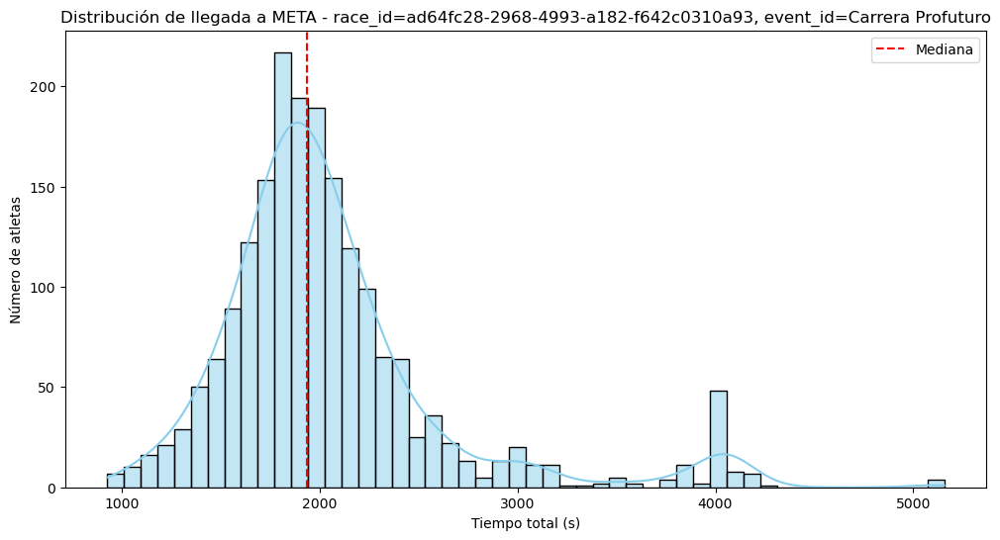

Mediana total a META: 1937.2 s
MAD: 231.8 s
Atletas outliers MAD: 239 de 2005
Atletas outliers percentil 1: 20
Atletas outliers percentil 99: 20

Ejemplos de outliers MAD:


,athlete_id,average,averageNet,distance,event_id,incidence,isBackup,location,net,netTime,offset,order,originalTime,race_id,rawTime,raw_backupOffset,raw_chip,raw_created,raw_device,raw_id,raw_import,raw_importId,raw_isBackup,raw_location,raw_manual,raw_offset,raw_originalTime,raw_rawTime,raw_rewind,raw_rewindId,raw_time,raw_times_official,raw_times_rawTime,raw_times_real,raw_type,raw_valid,split,time,weight,event_std,netTime_td,originalTime_td,raw_backupOffset_td,raw_times_official_td,raw_times_real_td,time_td,startRawTime,total_time_sec
50459,ba75953f-62fc-5238-aad6-0e5d4f882c47,0.23090,NaN,5100,Carrera Profuturo,NaN,NaN,,NaN,1174938.0,NaN,3,1177596.0,ad64fc28-2968-4993-a182-f642c0310a93,2025-04-06 07:34:39.083,NaN,29021,2025-04-06 07:34:42.140,TS2P8 87,ba75953f-62fc-5238-aad6-0e5d4f882c47,False,,NaN,Meta 5K,NaN,0.0,2025-04-06 07:34:39.083,2025-04-06 07:34:39.083,False,,2025-04-06T07:34:39.083Z,1177596.0,2025-04-06 07:34:39.083,1177596.0,2.0,True,Meta,1177596,4.0,maraton,0 days 00:19:34.938000,0 days 00:19:37.596000,NaT,0 days 00:19:37.596000,0 days 00:19:37.596000,0 days 00:19:37.596000,2025-04-06 07:15:04.145,1174.938
50470,89d6022f-b823-5d08-a7eb-cce2c093abf6,0.61764,NaN,5100,Carrera Profuturo,NaN,NaN,,NaN,2898290.0,NaN,3,3149980.0,ad64fc28-2968-4993-a182-f642c0310a93,2025-04-06 08:07:31.467,NaN,29469,2025-04-06 08:07:33.986,TS2P8 87,89d6022f-b823-5d08-a7eb-cce2c093abf6,False,,NaN,Meta 5K,NaN,0.0,2025-04-06 08:07:31.467,2025-04-06 08:07:31.467,False,,2025-04-06T08:07:31.467Z,3149980.0,2025-04-06 08:07:31.467,3149980.0,2.0,True,Meta,3149980,4.0,maraton,0 days 00:48:18.290000,0 days 00:52:29.980000,NaT,0 days 00:52:29.980000,0 days 00:52:29.980000,0 days 00:52:29.980000,2025-04-06 07:19:13.177,2898.290
50473,9a3dcba7-5a67-5ced-b926-1398c5823f15,0.56382,NaN,5100,Carrera Profuturo,NaN,NaN,,NaN,2721967.0,NaN,3,2875476.0,ad64fc28-2968-4993-a182-f642c0310a93,2025-04-06 08:02:56.963,NaN,28675,2025-04-06 08:02:59.819,TS2P8 87,9a3dcba7-5a67-5ced-b926-1398c5823f15,False,,NaN,Meta 5K,NaN,0.0,2025-04-06 08:02:56.963,2025-04-06 08:02:56.963,False,,2025-04-06T08:02:56.963Z,2875476.0,2025-04-06 08:02:56.963,2875476.0,2.0,True,Meta,2875476,4.0,maraton,0 days 00:45:21.967000,0 days 00:47:55.476000,NaT,0 days 00:47:55.476000,0 days 00:47:55.476000,0 days 00:47:55.476000,2025-04-06 07:17:34.996,2721.967
50477,2b8d7297-0e26-56ec-a2e9-f4c14acf791d,0.22048,NaN,5100,Carrera Profuturo,NaN,NaN,,NaN,1123454.0,NaN,3,1124454.0,ad64fc28-2968-4993-a182-f642c0310a93,2025-04-06 07:33:45.941,NaN,28460,2025-04-06 07:33:49.518,TS2P8 5,2b8d7297-0e26-56ec-a2e9-f4c14acf791d,False,,NaN,Meta 5K,NaN,0.0,2025-04-06 07:33:45.941,2025-04-06 07:33:45.941,False,,2025-04-06T07:33:45.941Z,1124454.0,2025-04-06 07:33:45.941,1124454.0,2.0,True,Meta,1124454,4.0,maraton,0 days 00:18:43.454000,0 days 00:18:44.454000,NaT,0 days 00:18:44.454000,0 days 00:18:44.454000,0 days 00:18:44.454000,2025-04-06 07:15:02.487,1123.454
50478,fd329c81-11d5-5219-98da-a2261a347f83,0.57263,NaN,5100,Carrera Profuturo,NaN,NaN,,NaN,2670309.0,NaN,3,2920409.0,ad64fc28-2968-4993-a182-f642c0310a93,2025-04-06 08:03:41.896,NaN,29463,2025-04-06 08:03:43.786,TS2P8 87,fd329c81-11d5-5219-98da-a2261a347f83,False,,NaN,Meta 5K,NaN,0.0,2025-04-06 08:03:41.896,2025-04-06 08:03:41.896,False,,2025-04-06T08:03:41.896Z,2920409.0,2025-04-06 08:03:41.896,2920409.0,2.0,True,Meta,2920409,4.0,maraton,0 days 00:44:30.309000,0 days 00:48:40.409000,NaT,0 days 00:48:40.409000,0 days 00:48:40.409000,0 days 00:48:40.409000,2025-04-06 07:19:11.587,2670.309
50481,60cd8cb7-c57d-5994-8916-aa83d641e75c,0.55195,NaN,5100,Carrera Profuturo,NaN,NaN,,NaN,2786269.0,NaN,3,2814944.0,ad64fc28-2968-4993-a182-f642c0310a93,2025-04-06 08:01:56.431,NaN,27073,2025-04-06 08:01:59.008,TS2P8 87,60cd8cb7-c57d-5994-8916-aa83d641e75c,False,,NaN,Meta 5K,NaN,0.0,2025-04-06 08:01:56.431,2025-04-06 08:01:56.431,False,,2025-04-06T08:01:56.431Z,2814944.0,2025-04-06 08:01:56.431,2814944.0,2.0,True,Meta,2814944,4.0,maraton,0 days 00:46:26.269000,0 days 00:46:54.9


Ejemplos de outliers percentiles:


,athlete_id,average,averageNet,distance,event_id,incidence,isBackup,location,net,netTime,offset,order,originalTime,race_id,rawTime,raw_backupOffset,raw_chip,raw_created,raw_device,raw_id,raw_import,raw_importId,raw_isBackup,raw_location,raw_manual,raw_offset,raw_originalTime,raw_rawTime,raw_rewind,raw_rewindId,raw_time,raw_times_official,raw_times_rawTime,raw_times_real,raw_type,raw_valid,split,time,weight,event_std,netTime_td,originalTime_td,raw_backupOffset_td,raw_times_official_td,raw_times_real_td,time_td,startRawTime,total_time_sec
50551,a3024e4e-b8fe-569b-b36b-a0d745972bfd,0.19375,NaN,5100,Carrera Profuturo,NaN,NaN,,NaN,987902.0,NaN,3,988144.0,ad64fc28-2968-4993-a182-f642c0310a93,2025-04-06 07:31:29.631,NaN,29300,2025-04-06 07:31:33.239,TS2P8 87,a3024e4e-b8fe-569b-b36b-a0d745972bfd,False,,NaN,Meta 5K,NaN,0.0,2025-04-06 07:31:29.631,2025-04-06 07:31:29.631,False,,2025-04-06T07:31:29.631Z,988144.0,2025-04-06 07:31:29.631,988144.0,2.0,True,Meta,988144,4.0,maraton,0 days 00:16:27.902000,0 days 00:16:28.144000,NaT,0 days 00:16:28.144000,0 days 00:16:28.144000,0 days 00:16:28.144000,2025-04-06 07:15:01.729,987.902
50572,e1da17d0-8898-5709-a15e-eae4ec7fb1a8,0.21701,NaN,5100,Carrera Profuturo,NaN,NaN,,NaN,1105221.0,NaN,3,1106772.0,ad64fc28-2968-4993-a182-f642c0310a93,2025-04-06 07:33:28.259,NaN,28516,2025-04-06 07:33:33.309,TS2P8 5,e1da17d0-8898-5709-a15e-eae4ec7fb1a8,False,,NaN,Meta 5K,NaN,0.0,2025-04-06 07:33:28.259,2025-04-06 07:33:28.259,False,,2025-04-06T07:33:28.259Z,1106772.0,2025-04-06 07:33:28.259,1106772.0,2.0,True,Meta,1106772,4.0,maraton,0 days 00:18:25.221000,0 days 00:18:26.772000,NaT,0 days 00:18:26.772000,0 days 00:18:26.772000,0 days 00:18:26.772000,2025-04-06 07:15:03.038,1105.221
50663,e35227a7-26c1-50d2-9b62-8bb72f3d209f,0.18193,NaN,5100,Carrera Profuturo,NaN,NaN,,NaN,927186.0,NaN,3,927842.0,ad64fc28-2968-4993-a182-f642c0310a93,2025-04-06 07:30:29.329,NaN,29351,2025-04-06 07:30:33.069,TS2P8 87,e35227a7-26c1-50d2-9b62-8bb72f3d209f,False,,NaN,Meta 5K,NaN,0.0,2025-04-06 07:30:29.329,2025-04-06 07:30:29.329,False,,2025-04-06T07:30:29.329Z,927842.0,2025-04-06 07:30:29.329,927842.0,2.0,True,Meta,927842,4.0,maraton,0 days 00:15:27.186000,0 days 00:15:27.842000,NaT,0 days 00:15:27.842000,0 days 00:15:27.842000,0 days 00:15:27.842000,2025-04-06 07:15:02.143,927.186
50771,5a29cad1-c3bb-5354-a200-99bb6f9712a7,0.19890,NaN,5100,Carrera Profuturo,NaN,NaN,,NaN,1013226.0,NaN,3,1014394.0,ad64fc28-2968-4993-a182-f642c0310a93,2025-04-06 07:31:55.881,NaN,28119,2025-04-06 07:31:59.218,TS2P8 87,5a29cad1-c3bb-5354-a200-99bb6f9712a7,False,,NaN,Meta 5K,NaN,0.0,2025-04-06 07:31:55.881,2025-04-06 07:31:55.881,False,,2025-04-06T07:31:55.881Z,1014394.0,2025-04-06 07:31:55.881,1014394.0,2.0,True,Meta,1014394,4.0,maraton,0 days 00:16:53.226000,0 days 00:16:54.394000,NaT,0 days 00:16:54.394000,0 days 00:16:54.394000,0 days 00:16:54.394000,2025-04-06 07:15:02.655,1013.226
50925,0cf84ed3-247a-564d-8393-0278e262a252,0.20502,NaN,5100,Carrera Profuturo,NaN,NaN,,NaN,1043158.0,NaN,3,1045606.0,ad64fc28-2968-4993-a182-f642c0310a93,2025-04-06 07:32:27.093,NaN,27348,2025-04-06 07:32:32.060,TS2P8 5,0cf84ed3-247a-564d-8393-0278e262a252,False,,NaN,Meta 5K,NaN,0.0,2025-04-06 07:32:27.093,2025-04-06 07:32:27.093,False,,2025-04-06T07:32:27.093Z,1045606.0,2025-04-06 07:32:27.093,1045606.0,2.0,True,Meta,1045606,4.0,maraton,0 days 00:17:23.158000,0 days 00:17:25.606000,NaT,0 days 00:17:25.606000,0 days 00:17:25.606000,0 days 00:17:25.606000,2025-04-06 07:15:03.935,1043.158
51018,85c0e87e-6c7c-52f2-8389-d43027fc6aa3,0.19459,NaN,5100,Carrera Profuturo,NaN,NaN,,NaN,992192.0,NaN,3,992384.0,ad64fc28-2968-4993-a182-f642c0310a93,2025-04-06 07:31:33.871,NaN,27282,2025-04-06 07:31:37.153,TS2P8 87,85c0e87e-6c7c-52f2-8389-d43027fc6aa3,False,,NaN,Meta 5K,NaN,0.0,2025-04-06 07:31:33.871,2025-04-06 07:31:33.871,False,,2025-04-06T07:31:33.871Z,992384.0,2025-04-06 07:31:33.871,992384.0,2.0,True,Meta,992384,4.0,maraton,0 days 00:16:32.192000,0 days 00:16:32.384000,NaT,0 days 0


=== Análisis de META para race_id = 331e7589-6440-4968-9b44-484ba589824e, event_id = Marato ===


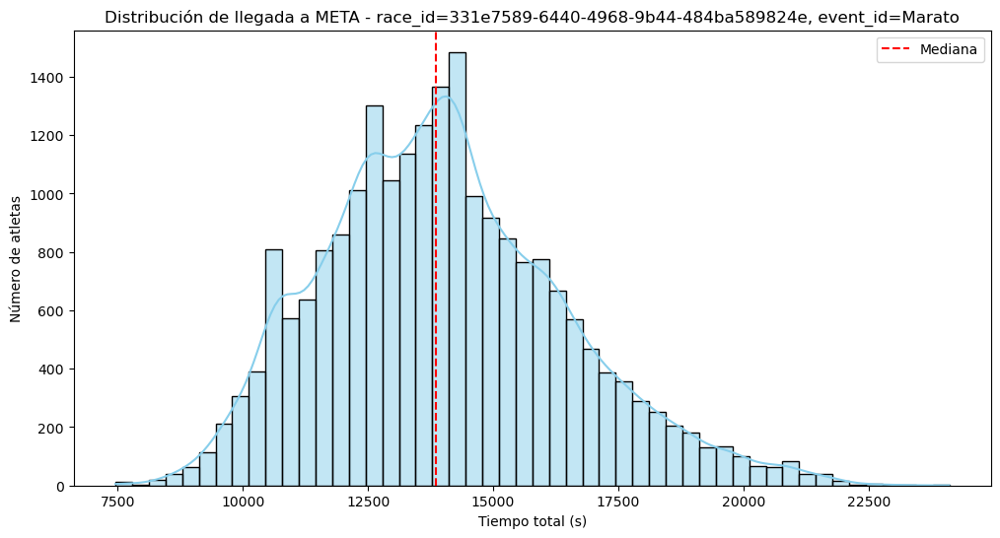

Mediana total a META: 13863.6 s
MAD: 1586.4 s
Atletas outliers MAD: 1097 de 22018
Atletas outliers percentil 1: 218
Atletas outliers percentil 99: 218

Ejemplos de outliers MAD:


,athlete_id,average,averageNet,distance,event_id,incidence,isBackup,location,net,netTime,offset,order,originalTime,race_id,rawTime,raw_backupOffset,raw_chip,raw_created,raw_device,raw_id,raw_import,raw_importId,raw_isBackup,raw_location,raw_manual,raw_offset,raw_originalTime,raw_rawTime,raw_rewind,raw_rewindId,raw_time,raw_times_official,raw_times_rawTime,raw_times_real,raw_type,raw_valid,split,time,weight,event_std,netTime_td,originalTime_td,raw_backupOffset_td,raw_times_official_td,raw_times_real_td,time_td,startRawTime,total_time_sec
52534,114500005,0.20975,NaN,42195,Marato,NaN,NaN,,NaN,8847421.0,NaN,11,8850545.0,331e7589-6440-4968-9b44-484ba589824e,2025-03-16 09:58:45.817,NaN,89,2025-03-16 09:58:48.620,TS2P8 5,114500005,False,,NaN,Meta,NaN,0.0,2025-03-16 09:58:45.817,2025-03-16 09:58:45.817,False,,2025-03-16T09:58:45.817Z,8850545.0,2025-03-16 09:58:45.817,8850545.0,2.0,True,Meta,8850545,11.999999,maraton,0 days 02:27:27.421000,0 days 02:27:30.545000,NaT,0 days 02:27:30.545000,0 days 02:27:30.545000,0 days 02:27:30.545000,2025-03-16 07:31:18.396,8847.421
52584,F413251A,0.49587,NaN,42195,Marato,NaN,NaN,,NaN,20747896.0,NaN,11,20923277.0,331e7589-6440-4968-9b44-484ba589824e,2025-03-16 14:13:57.289,NaN,27268,2025-03-16 14:14:00.457,TS2P8 5,F413251A,False,,NaN,Meta,NaN,0.0,2025-03-16 14:13:57.289,2025-03-16 14:13:57.289,False,,2025-03-16T14:13:57.289Z,20923277.0,2025-03-16 14:13:57.289,20923277.0,2.0,True,Meta,20923277,11.999998,maraton,0 days 05:45:47.896000,0 days 05:48:43.277000,NaT,0 days 05:48:43.277000,0 days 05:48:43.277000,0 days 05:48:43.277000,2025-03-16 08:28:09.393,20747.896
52645,9C3A86D7,0.50901,NaN,42195,Marato,NaN,NaN,,NaN,21348422.0,NaN,11,21477791.0,331e7589-6440-4968-9b44-484ba589824e,2025-03-16 14:23:11.803,NaN,25935,2025-03-16 14:23:14.913,TS2P8 5,9C3A86D7,False,,NaN,Meta,NaN,0.0,2025-03-16 14:23:11.803,2025-03-16 14:23:11.803,False,,2025-03-16T14:23:11.803Z,21477791.0,2025-03-16 14:23:11.803,21477791.0,2.0,True,Meta,21477791,11.999998,maraton,0 days 05:55:48.422000,0 days 05:57:57.791000,NaT,0 days 05:57:57.791000,0 days 05:57:57.791000,0 days 05:57:57.791000,2025-03-16 08:27:23.381,21348.422
52667,F7B42C9B,0.45656,NaN,42195,Marato,NaN,NaN,,NaN,19169022.0,NaN,11,19264420.0,331e7589-6440-4968-9b44-484ba589824e,2025-03-16 13:36:09.540,NaN,21039,2025-03-16 13:36:12.602,TS2P8 5,F7B42C9B,False,,NaN,Meta,NaN,0.0,2025-03-16 13:36:09.540,2025-03-16 13:36:09.540,False,,2025-03-16T13:36:09.540Z,19264420.0,2025-03-16 13:36:09.540,19264420.0,2.0,True,Meta,19264420,11.999998,maraton,0 days 05:19:29.022000,0 days 05:21:04.420000,NaT,0 days 05:21:04.420000,0 days 05:21:04.420000,0 days 05:21:04.420000,2025-03-16 08:16:40.518,19169.022
52836,493C7YC2,0.20787,NaN,42195,Marato,NaN,NaN,,NaN,8764535.0,NaN,11,8771180.0,331e7589-6440-4968-9b44-484ba589824e,2025-03-16 09:57:26.452,NaN,30357,2025-03-16 09:57:28.481,TS2P8 5,493C7YC2,False,,NaN,Meta,NaN,0.0,2025-03-16 09:57:26.452,2025-03-16 09:57:26.452,False,,2025-03-16T09:57:26.452Z,8771180.0,2025-03-16 09:57:26.452,8771180.0,2.0,True,Meta,8771180,11.999999,maraton,0 days 02:26:04.535000,0 days 02:26:11.180000,NaT,0 days 02:26:11.180000,0 days 02:26:11.180000,0 days 02:26:11.180000,2025-03-16 07:31:21.917,8764.535
52930,CD5589B3,0.50021,NaN,42195,Marato,NaN,NaN,,NaN,21079301.0,NaN,11,21106257.0,331e7589-6440-4968-9b44-484ba589824e,2025-03-16 14:17:00.269,NaN,27124,2025-03-16 14:17:02.549,TS2P8 5,CD5589B3,False,,NaN,Meta,NaN,0.0,2025-03-16 14:17:00.269,2025-03-16 14:17:00.269,False,,2025-03-16T14:17:00.269Z,21106257.0,2025-03-16 14:17:00.269,21106257.0,2.0,True,Meta,21106257,11.999998,maraton,0 days 05:51:19.301000,0 days 05:51:46.257000,NaT,0 days 05:51:46.257000,0 days 05:51:46.257000,0 days 05:51:46.257000,2025-03-16 08:25:40.968,21079.301
52937,Z819FY2B,0.21402,NaN,42195,Marato,NaN,NaN,,NaN,9026208.0,NaN,11,9030417.0,331e7589-6440-4968-9b44-484ba589824e,2025-03-16 10:01:45.689,NaN,432,2025-03-16 10:01:48.860,TS2P8 5,Z819FY2B,False,,NaN,Meta,NaN,0.0,2025-03-16 10:01:45.689,2025


Ejemplos de outliers percentiles:


,athlete_id,average,averageNet,distance,event_id,incidence,isBackup,location,net,netTime,offset,order,originalTime,race_id,rawTime,raw_backupOffset,raw_chip,raw_created,raw_device,raw_id,raw_import,raw_importId,raw_isBackup,raw_location,raw_manual,raw_offset,raw_originalTime,raw_rawTime,raw_rewind,raw_rewindId,raw_time,raw_times_official,raw_times_rawTime,raw_times_real,raw_type,raw_valid,split,time,weight,event_std,netTime_td,originalTime_td,raw_backupOffset_td,raw_times_official_td,raw_times_real_td,time_td,startRawTime,total_time_sec
52534,114500005,0.20975,NaN,42195,Marato,NaN,NaN,,NaN,8847421.0,NaN,11,8850545.0,331e7589-6440-4968-9b44-484ba589824e,2025-03-16 09:58:45.817,NaN,89,2025-03-16 09:58:48.620,TS2P8 5,114500005,False,,NaN,Meta,NaN,0.0,2025-03-16 09:58:45.817,2025-03-16 09:58:45.817,False,,2025-03-16T09:58:45.817Z,8850545.0,2025-03-16 09:58:45.817,8850545.0,2.0,True,Meta,8850545,11.999999,maraton,0 days 02:27:27.421000,0 days 02:27:30.545000,NaT,0 days 02:27:30.545000,0 days 02:27:30.545000,0 days 02:27:30.545000,2025-03-16 07:31:18.396,8847.421
52836,493C7YC2,0.20787,NaN,42195,Marato,NaN,NaN,,NaN,8764535.0,NaN,11,8771180.0,331e7589-6440-4968-9b44-484ba589824e,2025-03-16 09:57:26.452,NaN,30357,2025-03-16 09:57:28.481,TS2P8 5,493C7YC2,False,,NaN,Meta,NaN,0.0,2025-03-16 09:57:26.452,2025-03-16 09:57:26.452,False,,2025-03-16T09:57:26.452Z,8771180.0,2025-03-16 09:57:26.452,8771180.0,2.0,True,Meta,8771180,11.999999,maraton,0 days 02:26:04.535000,0 days 02:26:11.180000,NaT,0 days 02:26:11.180000,0 days 02:26:11.180000,0 days 02:26:11.180000,2025-03-16 07:31:21.917,8764.535
52869,YZ3YCCFZ,0.21751,NaN,42195,Marato,NaN,NaN,,NaN,9174822.0,NaN,11,9177968.0,331e7589-6440-4968-9b44-484ba589824e,2025-03-16 10:04:13.240,NaN,367,2025-03-16 10:04:16.650,TS2P8 5,YZ3YCCFZ,False,,NaN,Meta,NaN,0.0,2025-03-16 10:04:13.240,2025-03-16 10:04:13.240,False,,2025-03-16T10:04:13.240Z,9177968.0,2025-03-16 10:04:13.240,9177968.0,2.0,True,Meta,9177968,11.999999,maraton,0 days 02:32:54.822000,0 days 02:32:57.968000,NaT,0 days 02:32:57.968000,0 days 02:32:57.968000,0 days 02:32:57.968000,2025-03-16 07:31:18.418,9174.822
52903,BYBD3635,0.22072,NaN,42195,Marato,NaN,NaN,,NaN,9284751.0,NaN,11,9313169.0,331e7589-6440-4968-9b44-484ba589824e,2025-03-16 10:06:28.441,NaN,747,2025-03-16 10:06:31.564,TS2P8 5,BYBD3635,False,,NaN,Meta,NaN,0.0,2025-03-16 10:06:28.441,2025-03-16 10:06:28.441,False,,2025-03-16T10:06:28.441Z,9313169.0,2025-03-16 10:06:28.441,9313169.0,2.0,True,Meta,9313169,11.999999,maraton,0 days 02:34:44.751000,0 days 02:35:13.169000,NaT,0 days 02:35:13.169000,0 days 02:35:13.169000,0 days 02:35:13.169000,2025-03-16 07:31:43.690,9284.751
52937,Z819FY2B,0.21402,NaN,42195,Marato,NaN,NaN,,NaN,9026208.0,NaN,11,9030417.0,331e7589-6440-4968-9b44-484ba589824e,2025-03-16 10:01:45.689,NaN,432,2025-03-16 10:01:48.860,TS2P8 5,Z819FY2B,False,,NaN,Meta,NaN,0.0,2025-03-16 10:01:45.689,2025-03-16 10:01:45.689,False,,2025-03-16T10:01:45.689Z,9030417.0,2025-03-16 10:01:45.689,9030417.0,2.0,True,Meta,9030417,11.999999,maraton,0 days 02:30:26.208000,0 days 02:30:30.417000,NaT,0 days 02:30:30.417000,0 days 02:30:30.417000,0 days 02:30:30.417000,2025-03-16 07:31:19.481,9026.208
52946,852F2Z64,0.20712,NaN,42195,Marato,NaN,NaN,,NaN,8733308.0,NaN,11,8739393.0,331e7589-6440-4968-9b44-484ba589824e,2025-03-16 09:56:54.665,NaN,30467,2025-03-16 09:56:58.267,TS2P8 5,852F2Z64,False,,NaN,Meta,NaN,0.0,2025-03-16 09:56:54.665,2025-03-16 09:56:54.665,False,,2025-03-16T09:56:54.665Z,8739393.0,2025-03-16 09:56:54.665,8739393.0,2.0,True,Meta,8739393,11.999999,maraton,0 days 02:25:33.308000,0 days 02:25:39.393000,NaT,0 days 02:25:39.393000,0 days 02:25:39.393000,0 days 02:25:39.393000,2025-03-16 07:31:21.357,8733.308
52977,29FB888C,0.22227,NaN,42195,Marato,NaN,NaN,,NaN,9368853.0,NaN,11,9378812.0,331e7589-6440-4968-9b44-484ba589824e,2025-03-16 10:07:34.084,NaN,712,2025-03-16 10:07:37.288,TS2P8 5,29FB888C,False,,NaN,Meta,NaN,0.0,2025-03-16 10:07:34.084,2025-03-16 10:07:34.084,False,,202

In [26]:
# Filtramos solo la fila de META para cada atleta 
df_meta = athletes_time_df[athletes_time_df['split'] == 'Meta'].copy()

# Asegurarnos de tener startRawTime disponible (desde athletes_events_df)
df_meta = df_meta.merge(
    athletes_events_df[['athlete_id', 'event_id', 'race_id', 'startRawTime']],
    on=['athlete_id', 'event_id', 'race_id'],
    how='left'
)

# Calcular tiempo total en segundos desde salida hasta meta
df_meta['total_time_sec'] = (df_meta['rawTime'] - df_meta['startRawTime']).dt.total_seconds()

# --- Analizar por carrera y evento ---
min_atletas = 100  # restricción mínima

for race in df_meta['race_id'].unique():
    for event in df_meta[df_meta['race_id'] == race]['event_id'].unique():
        df_group = df_meta[(df_meta['race_id'] == race) & (df_meta['event_id'] == event)]
        
        # Saltar grupos con pocos atletas
        if len(df_group) < min_atletas:
            print(f"⚠️  Saltando race_id={race}, event_id={event}: menos de {min_atletas} atletas ({len(df_group)})")
            continue
        
        print(f"\n=== Análisis de META para race_id = {race}, event_id = {event} ===")
        
        # Histograma + KDE
        plt.figure(figsize=(12,6))
        sns.histplot(df_group['total_time_sec'], bins=50, kde=True, color='skyblue')
        plt.title(f"Distribución de llegada a META - race_id={race}, event_id={event}")
        plt.xlabel("Tiempo total (s)")
        plt.ylabel("Número de atletas")
        plt.axvline(df_group['total_time_sec'].median(), color='red', linestyle='--', label='Mediana')
        plt.legend()
        plt.show()
        
        # Estadísticas robustas
        median_time = np.median(df_group['total_time_sec'].dropna())
        mad_time = np.median(np.abs(df_group['total_time_sec'] - median_time).dropna())
        
        threshold_upper = median_time + 3 * mad_time
        threshold_lower = median_time - 3 * mad_time
        
        # Percentiles 1 y 99
        p1 = np.percentile(df_group['total_time_sec'].dropna(), 1)
        p99 = np.percentile(df_group['total_time_sec'].dropna(), 99)
        
        # Outliers según MAD
        outliers_mad = df_group[(df_group['total_time_sec'] > threshold_upper) |
                                (df_group['total_time_sec'] < threshold_lower)]
        
        # Outliers según percentiles
        outliers_p1 = df_group[df_group['total_time_sec'] < p1]
        outliers_p99 = df_group[df_group['total_time_sec'] > p99]
        
        print(f"Mediana total a META: {median_time:.1f} s")
        print(f"MAD: {mad_time:.1f} s")
        print(f"Atletas outliers MAD: {len(outliers_mad)} de {len(df_group)}")
        print(f"Atletas outliers percentil 1: {len(outliers_p1)}")
        print(f"Atletas outliers percentil 99: {len(outliers_p99)}")
        
        if len(outliers_mad) > 0:
            print("\nEjemplos de outliers MAD:")
            display(outliers_mad.head(10))
        
        if len(outliers_p1) > 0 or len(outliers_p99) > 0:
            print("\nEjemplos de outliers percentiles:")
            display(pd.concat([outliers_p1, outliers_p99]).head(10))

Análisis de status y realStatus por carrera

=== Carrera: 1a83229e-2547-42a3-b5b4-36c7425c4d8f ===
Casos incoherentes en estados: 0

=== Frecuencia de status por categoría ===


status,disqualified,finished,notstarted,retired
category,,,,
,0,18,6,11
F35,4,1044,205,20
F40,4,876,147,14
F45,10,720,128,11
F50,11,544,88,11
F55,6,312,39,9
F60,0,124,21,3
F65,2,23,4,2
F70,0,7,3,2



=== Frecuencia de realStatus por categoría ===


realStatus,finished,notstarted,running
category,,,
,18,6,11
F35,1048,205,20
F40,880,147,14
F45,730,128,11
F50,555,88,11
F55,318,39,9
F60,124,21,3
F65,25,4,2
F70,7,3,2


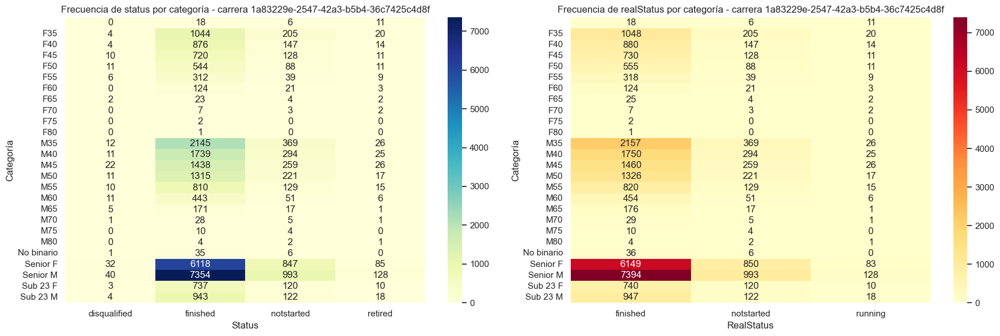


=== Carrera: cf6f71f2-1235-45e3-802e-02833b71ae8b ===
Casos incoherentes en estados: 0

=== Frecuencia de status por categoría ===


status,finished,notstarted,retired
category,,,
CORPORATE,83,6,1
ELITE,324,7,5
FEMALE DUO,48,0,0
FEMINA ELITE,171,15,6
FEMINA MASTER,80,4,0
MALE DUO,156,0,0
MASTER 40,648,30,12
MASTER 50,656,20,8
MASTER 60,314,1,3



=== Frecuencia de realStatus por categoría ===


realStatus,finished,notstarted,running
category,,,
CORPORATE,83,6,1
ELITE,324,7,5
FEMALE DUO,48,0,0
FEMINA ELITE,171,15,6
FEMINA MASTER,80,4,0
MALE DUO,156,0,0
MASTER 40,648,32,10
MASTER 50,656,21,7
MASTER 60,314,1,3


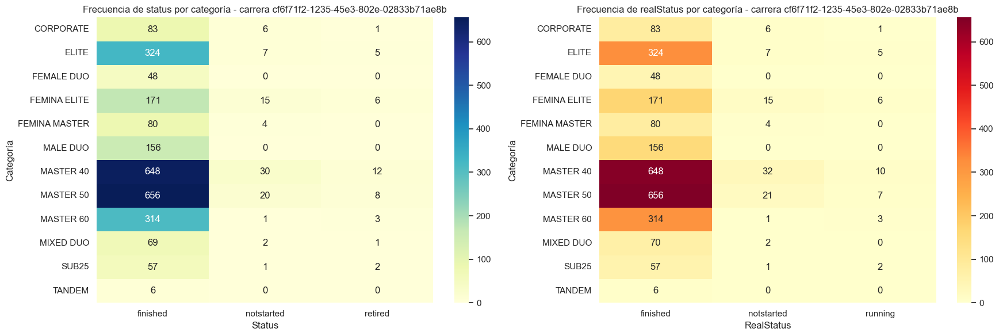


=== Carrera: 331e7589-6440-4968-9b44-484ba589824e ===
Casos incoherentes en estados: 0

=== Frecuencia de status por categoría ===


status,disqualified,finished,notstarted,quarantine,retired
category,,,,,
,3,18,1,0,6
F40,0,1,0,0,0
M35,20,2211,436,0,74
M40,26,2169,372,0,101
M45,38,1924,343,0,108
M50,38,1645,303,0,80
M55,20,928,175,0,45
M60,17,460,76,0,19
M65,5,170,39,0,12



=== Frecuencia de realStatus por categoría ===


realStatus,finished,notstarted,running
category,,,
,21,1,6
F40,1,0,0
M35,2231,436,74
M40,2195,372,101
M45,1962,343,108
M50,1683,303,80
M55,948,175,45
M60,477,76,19
M65,175,39,12


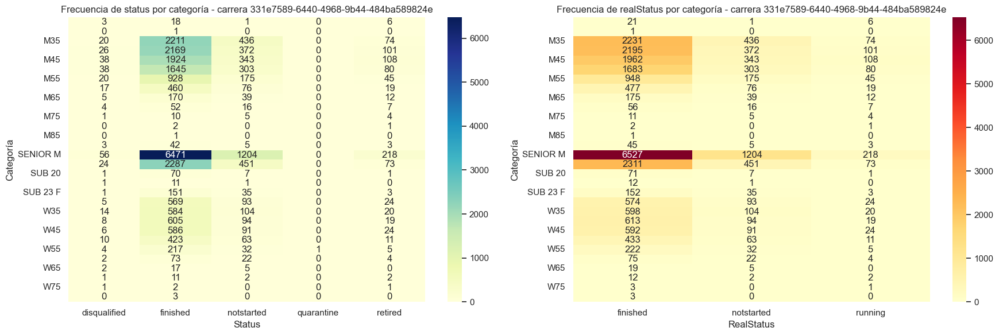

In [42]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

print("Análisis de status y realStatus por carrera")

# Filtramos atletas que llegaron a META
atletas_con_meta = athletes_time_df[athletes_time_df['split'] == 'Meta'][['athlete_id', 'event_id', 'race_id']]

# Iterar por cada carrera
for race in athletes_events_df['race_id'].unique():
    df_race = athletes_events_df[athletes_events_df['race_id'] == race].copy()
    print(f"\n=== Carrera: {race} ===")
    
    # Detectar casos incoherentes
    cond_finalizado_sin_meta = (
        (df_race['status'] == 'finished') & 
        (~df_race.set_index(['athlete_id','event_id','race_id']).index.isin(
            atletas_con_meta[atletas_con_meta['race_id'] == race]
            .set_index(['athlete_id','event_id','race_id']).index
        ))
    )
    
    cond_sin_salida_con_tiempo = (
        (df_race['status'] == 'notstarted') & 
        (df_race['startTime_td'].notna())
    )
    
    incoherentes = df_race[cond_finalizado_sin_meta | cond_sin_salida_con_tiempo]
    print(f"Casos incoherentes en estados: {len(incoherentes)}")
    if len(incoherentes) > 0:
        display(incoherentes[['athlete_id', 'event_id', 'status', 'realStatus', 'startTime_td']].head(10))
    
    # Resumen por categoría
    status_summary = df_race.groupby(['category', 'status']).size().unstack(fill_value=0)
    realstatus_summary = df_race.groupby(['category', 'realStatus']).size().unstack(fill_value=0)
    
    print("\n=== Frecuencia de status por categoría ===")
    display(status_summary)
    
    print("\n=== Frecuencia de realStatus por categoría ===")
    display(realstatus_summary)
    
    # Heatmaps por carrera
    fig, axes = plt.subplots(1, 2, figsize=(18, 6))
    
    sns.heatmap(status_summary, cmap="YlGnBu", ax=axes[0], annot=True, fmt="d")
    axes[0].set_title(f"Frecuencia de status por categoría - carrera {race}")
    axes[0].set_xlabel("Status")
    axes[0].set_ylabel("Categoría")
    
    sns.heatmap(realstatus_summary, cmap="YlOrRd", ax=axes[1], annot=True, fmt="d")
    axes[1].set_title(f"Frecuencia de realStatus por categoría - carrera {race}")
    axes[1].set_xlabel("RealStatus")
    axes[1].set_ylabel("Categoría")
    
    plt.tight_layout()
    plt.show()

status hace referencia al estado en carrera del atleta, y realstatus al estado automatico del mismo, sin intervención humana y sin que haya temrinado la carrera.

No se detectaron casos incoherentes, lo que indica que los registros de status y realStatus son consistentes con los tiempos de salida y meta neta. Al examinar la distribución por categoría, se observa que la mayoría de los atletas terminan la carrera (finished), mientras que una menor proporción corresponde a estados como notstarted, retired o disqualified. Los datos de realStatus reflejan un patrón muy similar, con predominancia de finished y algunos atletas en running o notstarted, confirmando la coherencia entre los registros oficiales y los observados. Esta consistencia sugiere que la gestión de resultados y la asignación de estados fue correcta y no se detectan anomalías significativas entre categorías ni géneros, incluyendo categorías especiales como Sub 23 y Senior.

Posiblemente campos como retired o disqualified estén bien mapeados en los issues, por lo que podemos buscar relaciones con los datos que ya tenemos para saber el porque de esas descalificaciones y retiros y observar como automatizarlos. 

- La mayoría de atletas completan la carrera en todas las categorías.

- Las retiradas y no iniciaciones aumentan ligeramente con la edad.

- Las descalificaciones son raras y distribuidas de forma homogénea.

- Las categorías con más participantes (Senior, M35-M55, F35-F50) concentran la mayor parte de los datos, pero siguen la misma tendencia.

In [44]:
import pandas as pd
import numpy as np

print("Análisis de atletas con startNetTime nulo o negativo y backup en el split de salida")

# Filtrar solo split 'Salida'
df_salida = athletes_time_df[athletes_time_df['split'] == 'Salida'].copy()

if 'startNetTime' not in athletes_events_df.columns:
    raise KeyError("No se encontró la columna 'startNetTime' en athletes_events_df.")

# Merge solo de startNetTime desde athletes_events_df
df_salida = df_salida.merge(
    athletes_events_df[['athlete_id', 'race_id', 'startNetTime']],
    on=['athlete_id', 'race_id'],
    how='left'
)

# Convertir startNetTime a segundos si es timedelta
if pd.api.types.is_timedelta64_dtype(df_salida['startNetTime']):
    df_salida['startNetTime_sec'] = df_salida['startNetTime'].dt.total_seconds()
else:
    df_salida['startNetTime_sec'] = pd.to_numeric(df_salida['startNetTime'], errors='coerce')

# Función de resumen por DataFrame
def resumen_startNetTime(df):
    cond_nulo_neg = df['startNetTime_sec'].isna() | (df['startNetTime_sec'] < 0)
    cond_backup = df['isBackup'] == True
    
    total = len(df)
    total_cond = cond_nulo_neg.sum()
    total_cond_backup = (cond_nulo_neg & cond_backup).sum()
    
    resumen = {
        'total_atletas': total,
        'n_nulo_neg': total_cond,
        'pct_nulo_neg': (total_cond / total * 100) if total > 0 else 0,
        'n_backup_dentro_cond': total_cond_backup,
        'pct_backup_dentro_cond': (total_cond_backup / total_cond * 100) if total_cond > 0 else 0,
        'pct_backup_sobre_total': (total_cond_backup / total * 100) if total > 0 else 0
    }
    
    ejemplos = df.loc[cond_nulo_neg & cond_backup,
                      ['athlete_id', 'race_id', 'split', 'startNetTime', 'startNetTime_sec', 'isBackup']]
    
    return resumen, ejemplos

# --- Por carrera ---
for race in df_salida['race_id'].unique():
    df_race = df_salida[df_salida['race_id'] == race]
    resumen_race, ejemplos_race = resumen_startNetTime(df_race)
    
    print(f"\n=== Carrera {race} ===")
    print(f"Total atletas en split 'Salida': {resumen_race['total_atletas']}")
    print(f"Atletas con startNetTime nulo o negativo: {resumen_race['n_nulo_neg']} ({resumen_race['pct_nulo_neg']:.2f}%)")
    print(f"De esos, con isBackup=True: {resumen_race['n_backup_dentro_cond']} ({resumen_race['pct_backup_dentro_cond']:.2f}% de los afectados)")
    print(f"En total, {resumen_race['pct_backup_sobre_total']:.2f}% del total de atletas tienen startNetTime nulo/negativo y backup activo en salida")
    
    if len(ejemplos_race) > 0:
        print("\nEjemplos:")
        display(ejemplos_race.head(10))

# --- Conjunto total ---
print("\n=== Conjunto total de carreras ===")
resumen_total, ejemplos_total = resumen_startNetTime(df_salida)
print(f"Total atletas en split 'Salida': {resumen_total['total_atletas']}")
print(f"Atletas con startNetTime nulo o negativo: {resumen_total['n_nulo_neg']} ({resumen_total['pct_nulo_neg']:.2f}%)")
print(f"De esos, con isBackup=True: {resumen_total['n_backup_dentro_cond']} ({resumen_total['pct_backup_dentro_cond']:.2f}% de los afectados)")
print(f"En total, {resumen_total['pct_backup_sobre_total']:.2f}% del total de atletas tienen startNetTime nulo/negativo y backup activo en salida")

if len(ejemplos_total) > 0:
    print("\nEjemplos:")
    display(ejemplos_total.head(10))

Análisis de atletas con startNetTime nulo o negativo y backup en el split de salida

=== Carrera 1a83229e-2547-42a3-b5b4-36c7425c4d8f ===
Total atletas en split 'Salida': 27462
Atletas con startNetTime nulo o negativo: 28 (0.10%)
De esos, con isBackup=True: 0 (0.00% de los afectados)
En total, 0.00% del total de atletas tienen startNetTime nulo/negativo y backup activo en salida

=== Carrera cf6f71f2-1235-45e3-802e-02833b71ae8b ===
Total atletas en split 'Salida': 15876
Atletas con startNetTime nulo o negativo: 2786 (17.55%)
De esos, con isBackup=True: 0 (0.00% de los afectados)
En total, 0.00% del total de atletas tienen startNetTime nulo/negativo y backup activo en salida

=== Carrera 331e7589-6440-4968-9b44-484ba589824e ===
Total atletas en split 'Salida': 22599
Atletas con startNetTime nulo o negativo: 60 (0.27%)
De esos, con isBackup=True: 0 (0.00% de los afectados)
En total, 0.00% del total de atletas tienen startNetTime nulo/negativo y backup activo en salida

=== Conjunto total

Esto nos invita a pensar en la necesidad de poder imputar o interpolar estos tiempos

In [45]:
import pandas as pd

print("Análisis de filas con rawTime nulo y flag de backup")

df = athletes_time_df.copy()

# Función de resumen por DataFrame
def resumen_rawTime(df):
    missing_raw = df['rawTime'].isna()
    total_missing = missing_raw.sum()
    
    backup_in_missing = df.loc[missing_raw, 'isBackup'] == True
    count_backup_true = backup_in_missing.sum()
    
    perc_backup = (count_backup_true / total_missing * 100) if total_missing > 0 else 0
    
    resumen = {
        'total_filas': len(df),
        'total_missing_rawTime': total_missing,
        'backup_true_en_missing': count_backup_true,
        'perc_backup_en_missing': perc_backup
    }
    
    ejemplos = df.loc[missing_raw & backup_in_missing]
    
    return resumen, ejemplos

# --- Por carrera ---
for race in df['race_id'].unique():
    df_race = df[df['race_id'] == race]
    resumen_race, ejemplos_race = resumen_rawTime(df_race)
    
    print(f"\n=== Carrera {race} ===")
    print(f"Total filas: {resumen_race['total_filas']}")
    print(f"Filas con rawTime nulo: {resumen_race['total_missing_rawTime']}")
    print(f"De esas, con isBackup=True: {resumen_race['backup_true_en_missing']}")
    print(f"Porcentaje de filas con rawTime nulo y backup activo: {resumen_race['perc_backup_en_missing']:.2f}%")
    
    if len(ejemplos_race) > 0:
        print("\nEjemplos:")
        display(ejemplos_race.head(10))

# --- Conjunto total ---
print("\n=== Conjunto total de carreras ===")
resumen_total, ejemplos_total = resumen_rawTime(df)
print(f"Total filas: {resumen_total['total_filas']}")
print(f"Filas con rawTime nulo: {resumen_total['total_missing_rawTime']}")
print(f"De esas, con isBackup=True: {resumen_total['backup_true_en_missing']}")
print(f"Porcentaje de filas con rawTime nulo y backup activo: {resumen_total['perc_backup_en_missing']:.2f}%")

if len(ejemplos_total) > 0:
    print("\nEjemplos:")
    display(ejemplos_total.head(10))

Análisis de filas con rawTime nulo y flag de backup

=== Carrera 1a83229e-2547-42a3-b5b4-36c7425c4d8f ===
Total filas: 162743
Filas con rawTime nulo: 0
De esas, con isBackup=True: 0
Porcentaje de filas con rawTime nulo y backup activo: 0.00%

=== Carrera cf6f71f2-1235-45e3-802e-02833b71ae8b ===
Total filas: 24571
Filas con rawTime nulo: 0
De esas, con isBackup=True: 0
Porcentaje de filas con rawTime nulo y backup activo: 0.00%

=== Carrera 331e7589-6440-4968-9b44-484ba589824e ===
Total filas: 244187
Filas con rawTime nulo: 0
De esas, con isBackup=True: 0
Porcentaje de filas con rawTime nulo y backup activo: 0.00%

=== Conjunto total de carreras ===
Total filas: 431501
Filas con rawTime nulo: 0
De esas, con isBackup=True: 0
Porcentaje de filas con rawTime nulo y backup activo: 0.00%


Todos los tiempos perdidos tienen un backup. 

Podemos ver como la mayoría de datos tienen un backup disponible, por lo que será más sencillo poder determinar los tiempos a través de interpolación.  

C:\Users\mario\AppData\Local\Temp\ipykernel_15860\2058094365.py:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


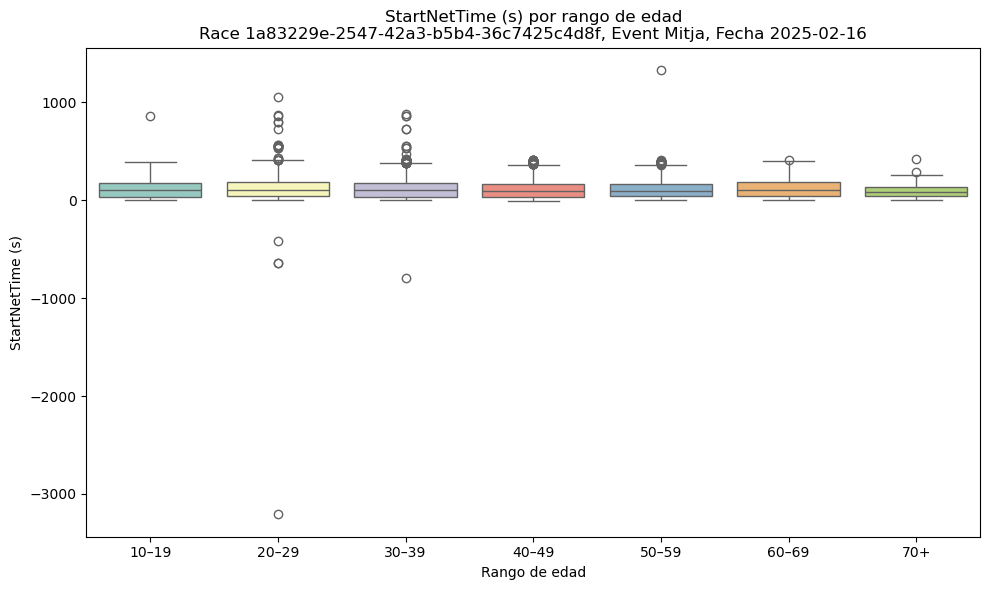

C:\Users\mario\AppData\Local\Temp\ipykernel_15860\2058094365.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


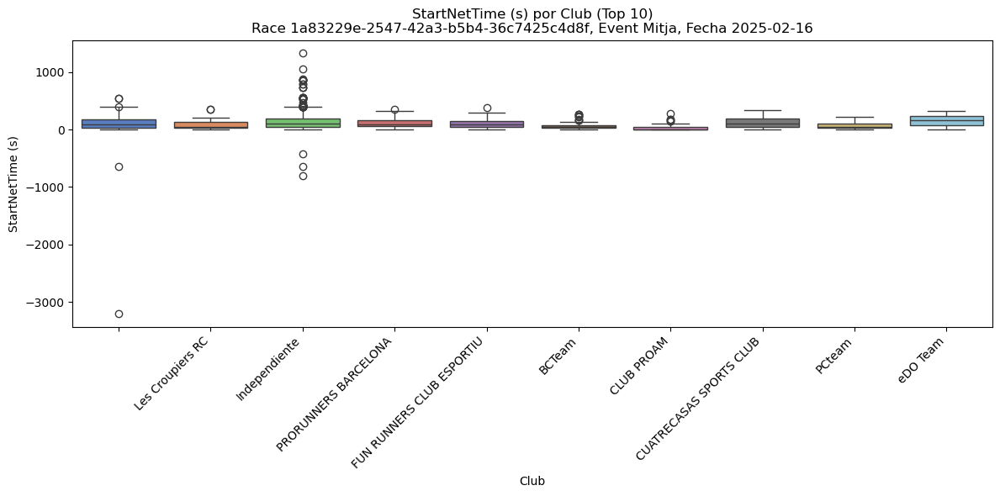

C:\Users\mario\AppData\Local\Temp\ipykernel_15860\2058094365.py:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


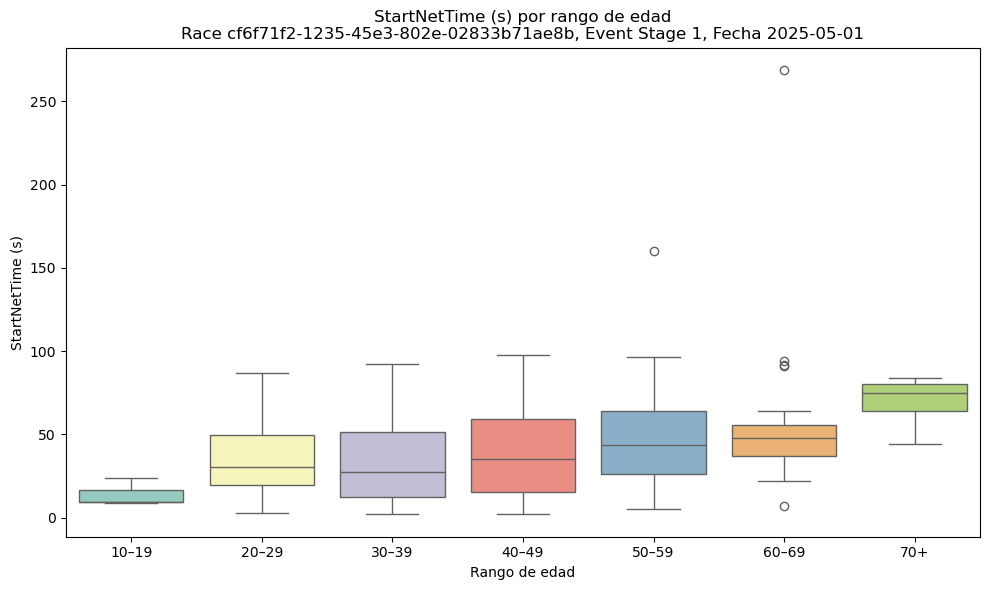

C:\Users\mario\AppData\Local\Temp\ipykernel_15860\2058094365.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


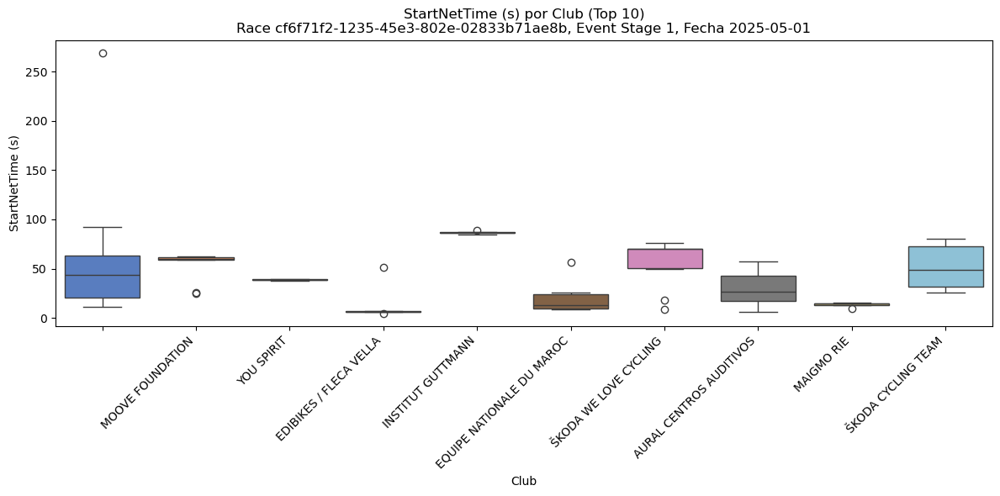

C:\Users\mario\AppData\Local\Temp\ipykernel_15860\2058094365.py:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


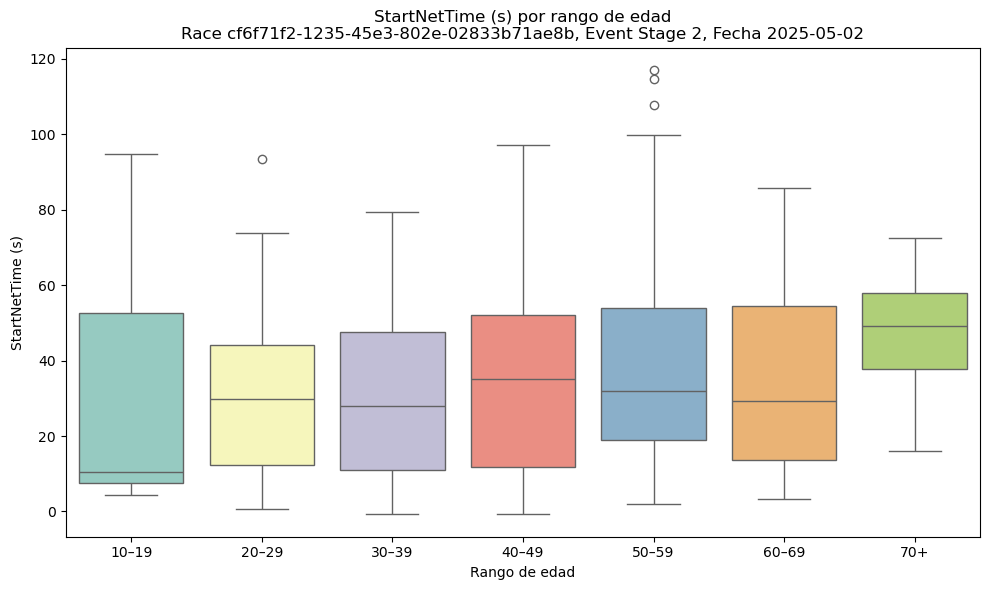

C:\Users\mario\AppData\Local\Temp\ipykernel_15860\2058094365.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


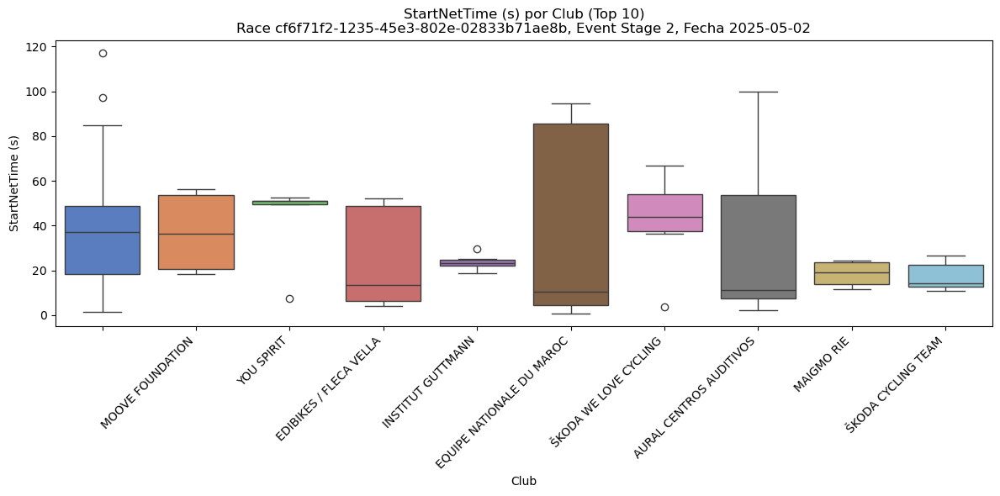

C:\Users\mario\AppData\Local\Temp\ipykernel_15860\2058094365.py:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


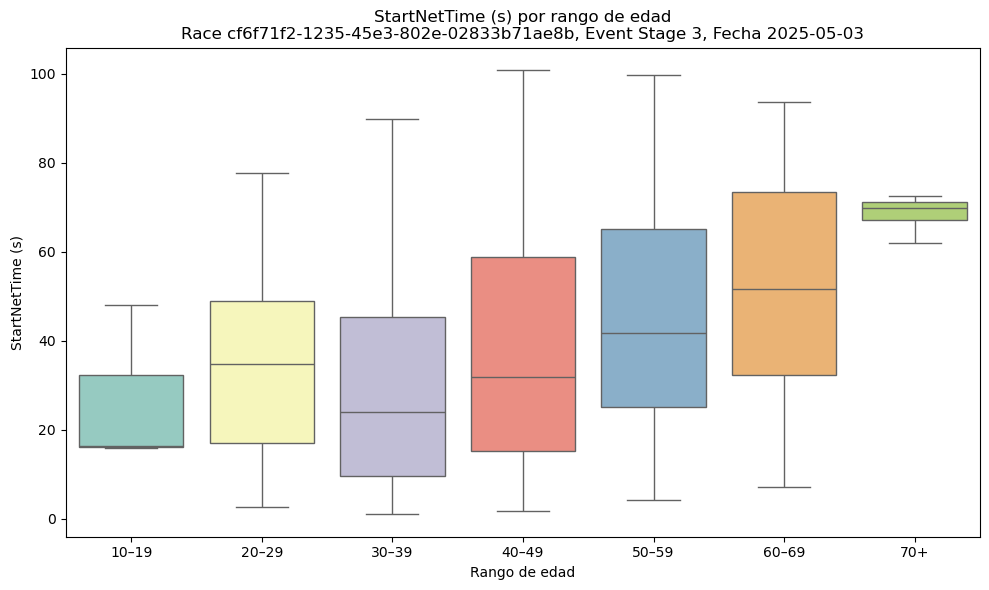

C:\Users\mario\AppData\Local\Temp\ipykernel_15860\2058094365.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


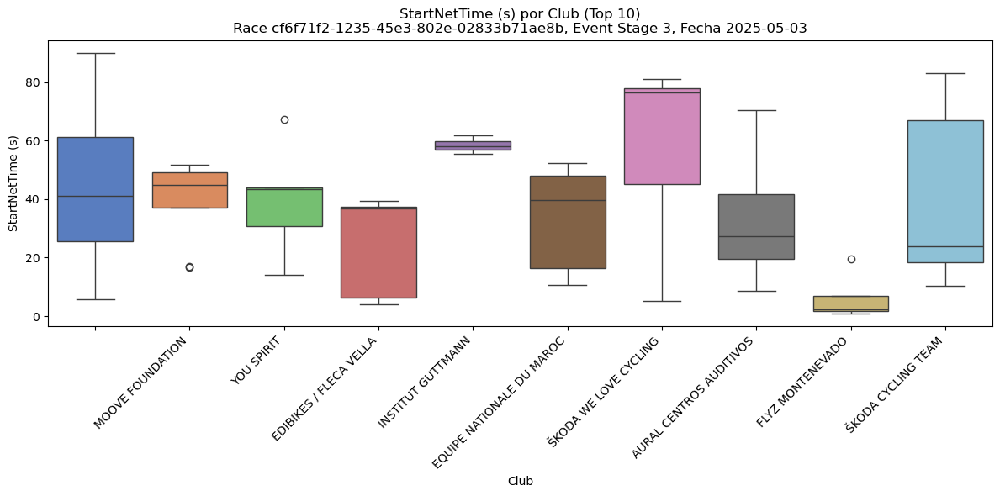

C:\Users\mario\AppData\Local\Temp\ipykernel_15860\2058094365.py:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


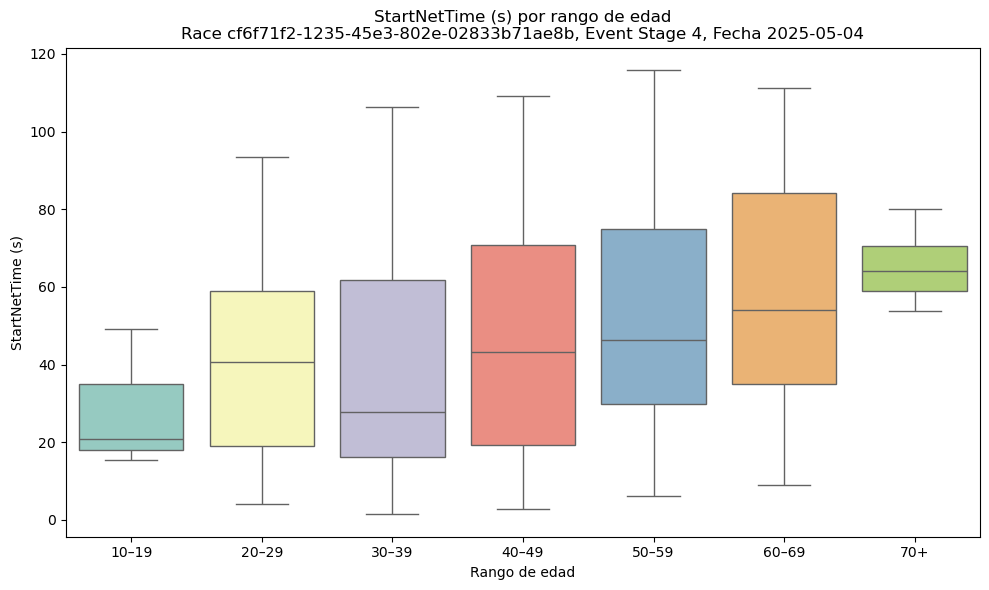

C:\Users\mario\AppData\Local\Temp\ipykernel_15860\2058094365.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


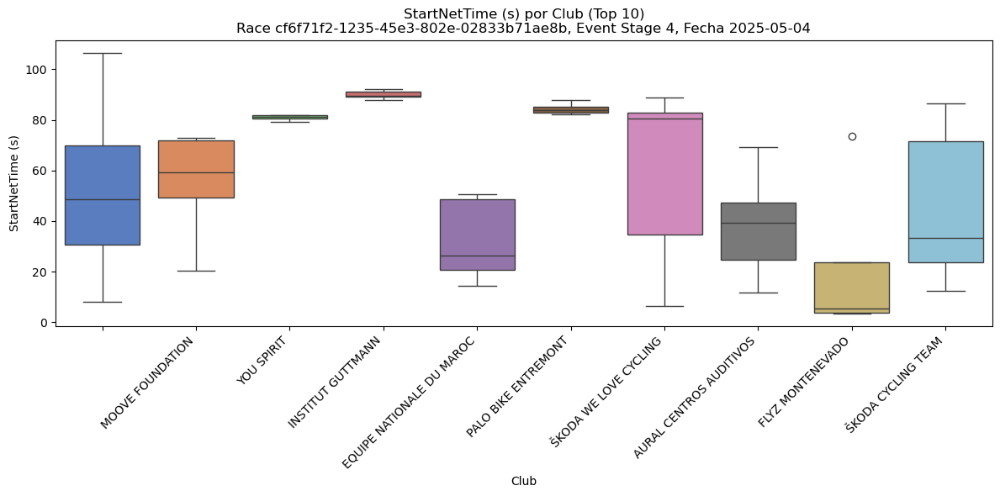

C:\Users\mario\AppData\Local\Temp\ipykernel_15860\2058094365.py:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


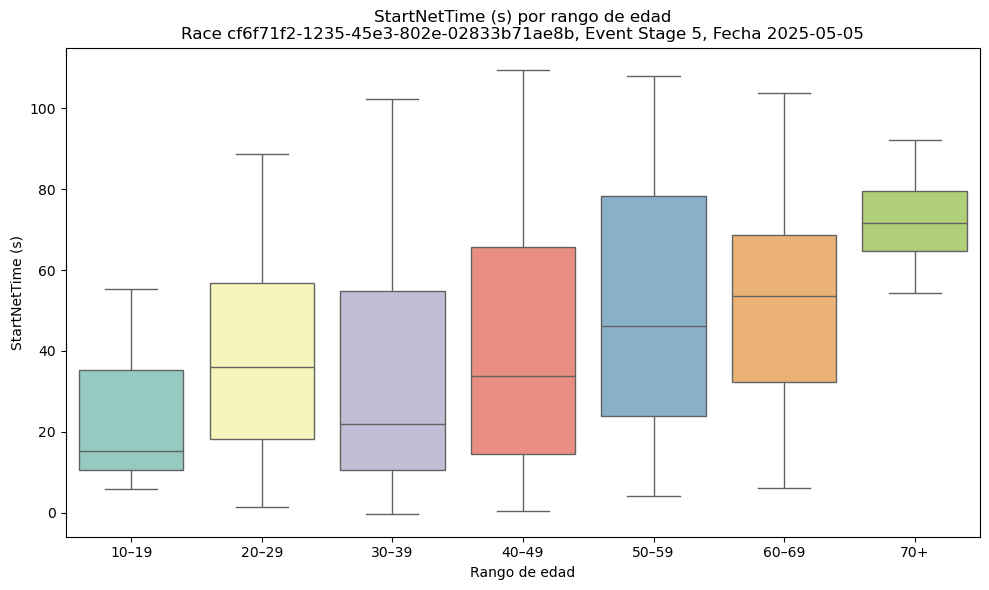

C:\Users\mario\AppData\Local\Temp\ipykernel_15860\2058094365.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


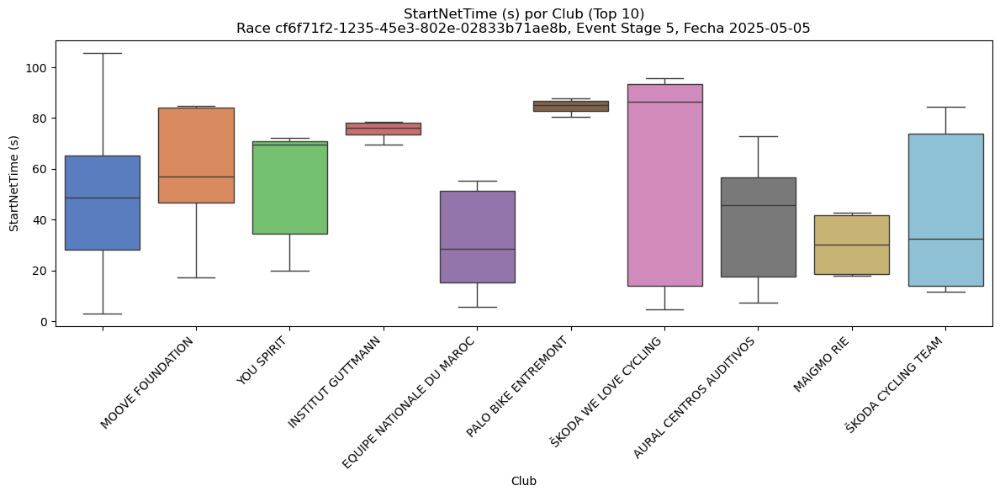

C:\Users\mario\AppData\Local\Temp\ipykernel_15860\2058094365.py:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


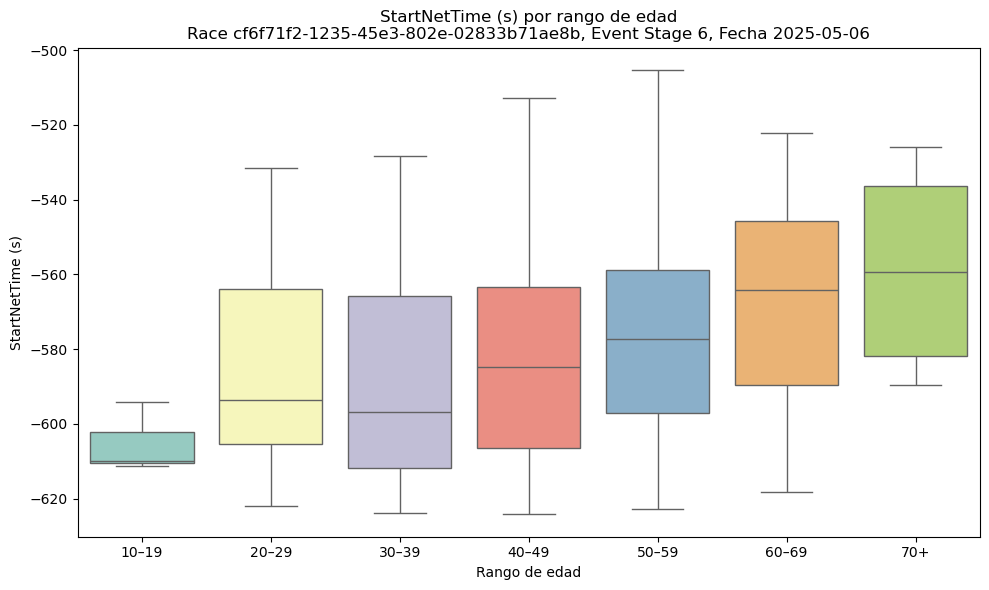

C:\Users\mario\AppData\Local\Temp\ipykernel_15860\2058094365.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


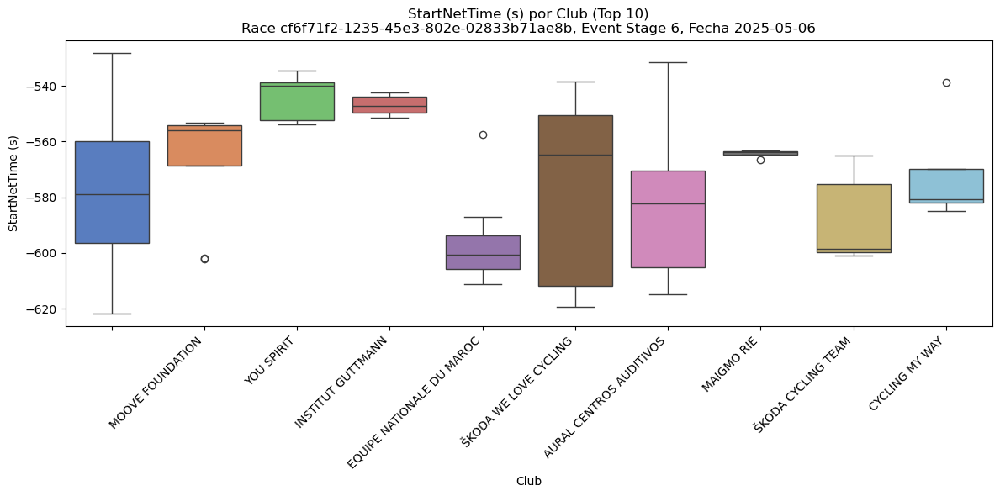

C:\Users\mario\AppData\Local\Temp\ipykernel_15860\2058094365.py:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


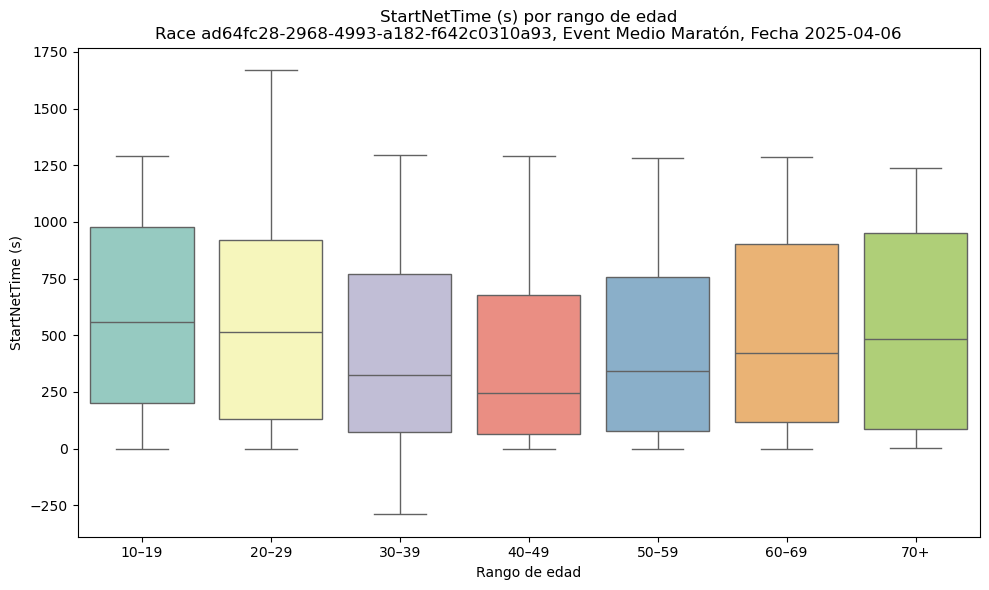

C:\Users\mario\AppData\Local\Temp\ipykernel_15860\2058094365.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


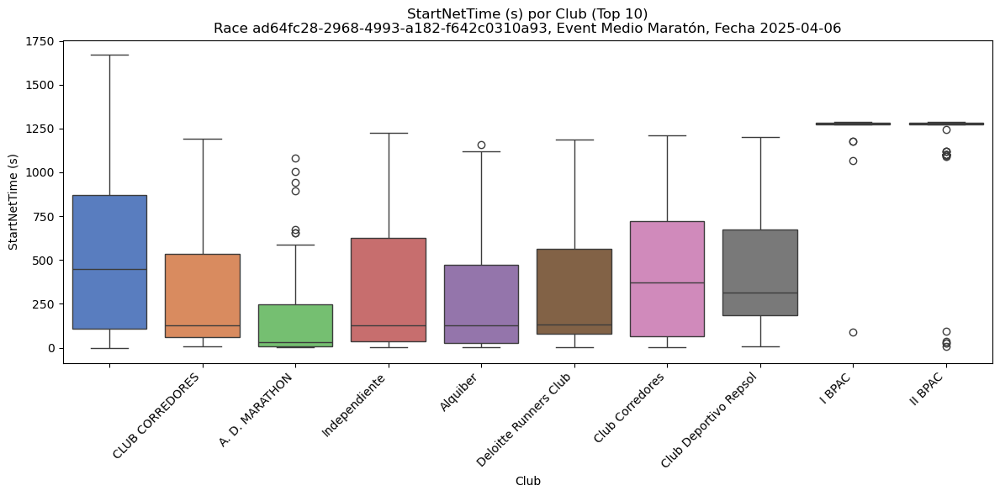

C:\Users\mario\AppData\Local\Temp\ipykernel_15860\2058094365.py:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


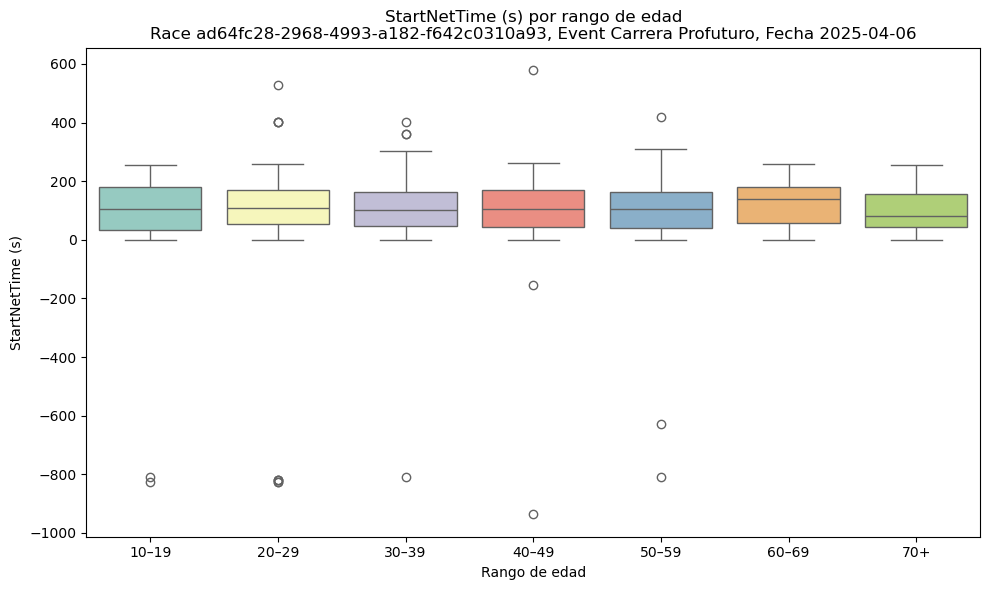

C:\Users\mario\AppData\Local\Temp\ipykernel_15860\2058094365.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


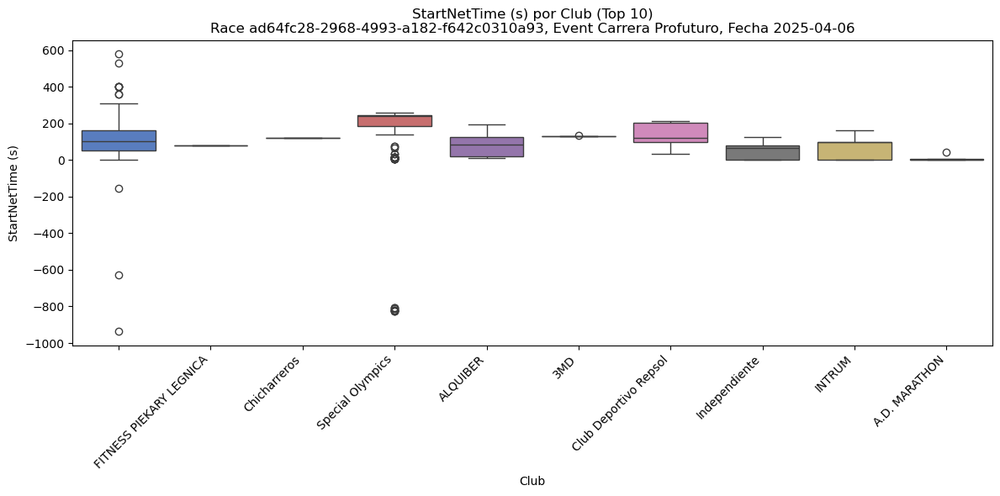

C:\Users\mario\AppData\Local\Temp\ipykernel_15860\2058094365.py:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


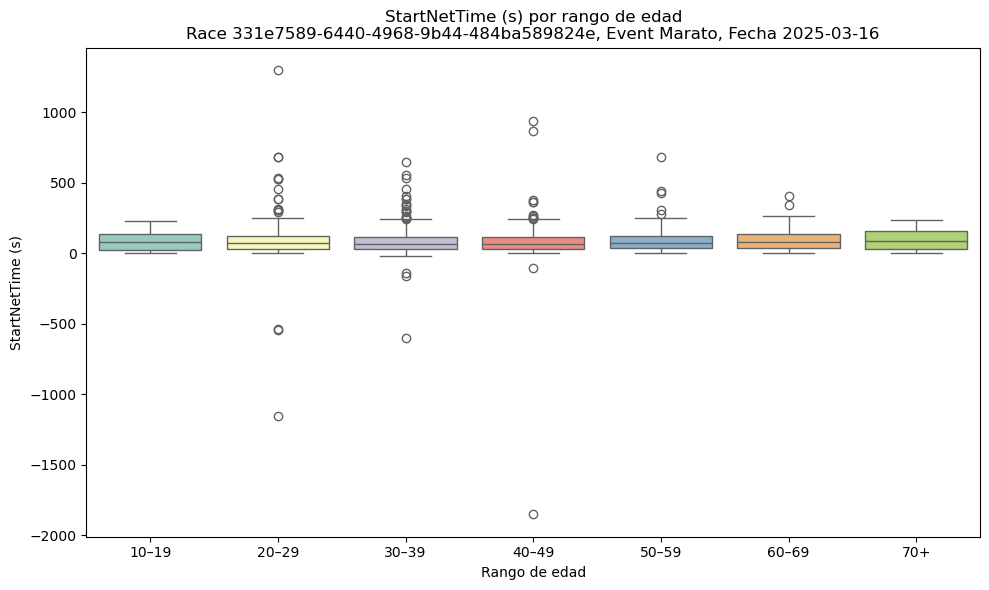

C:\Users\mario\AppData\Local\Temp\ipykernel_15860\2058094365.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


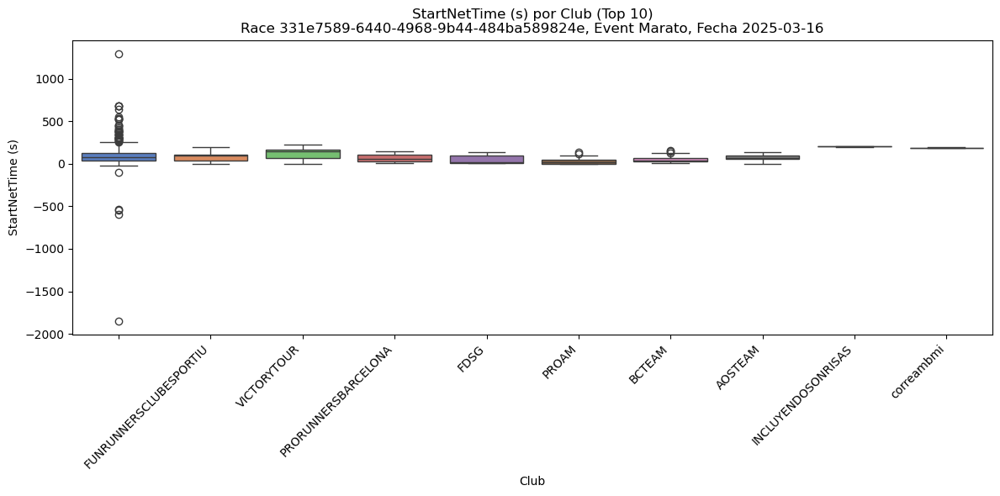

In [28]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# --- Preparación ---
merge_analisis = athletes_events_df.merge(
    athletes_df[['athlete_id', 'birthdate', 'club']],
    on='athlete_id',
    how='left'
).dropna(subset=['startRawTime', 'birthdate', 'club'])

# --- Análisis por carrera y evento ---
for race in merge_analisis['race_id'].unique():
    df_race = merge_analisis[merge_analisis['race_id'] == race]

    for event in df_race['event_id'].unique():
        df_group = df_race[df_race['event_id'] == event].copy()

        if len(df_group) < 100:
            print(f"⚠️ race_id={race}, event_id={event} tiene menos de 100 atletas. Saltando.")
            continue

        # Fecha de carrera: primer startRawTime disponible
        fecha_carrera = pd.to_datetime(df_group['startRawTime'].min().floor('D'))

        # Calcular edad según fecha de carrera
        df_group['edad'] = (fecha_carrera - df_group['birthdate']).dt.days / 365.25
        df_group['edad'] = df_group['edad'].where(df_group['edad'].between(10, 100)).round(0)

        # Convertir startNetTime a segundos
        if 'startNetTime_td' in df_group.columns:
            df_group['startNetTime_td_sec'] = df_group['startNetTime_td'].dt.total_seconds()
        elif 'startNetTime' in df_group.columns:
            df_group['startNetTime_td_sec'] = df_group['startNetTime'] / 1000
        else:
            raise KeyError("No se encontró columna de startNetTime para convertir a segundos.")

        # Categorizar edad
        edad_bins = [10, 20, 30, 40, 50, 60, 70, 100]
        edad_labels = ['10–19','20–29','30–39','40–49','50–59','60–69','70+']
        df_group['rango_edad'] = pd.cut(df_group['edad'], bins=edad_bins, labels=edad_labels)
        df_group = df_group.dropna(subset=['rango_edad', 'startNetTime_td_sec', 'club'])
        df_group['rango_edad'] = df_group['rango_edad'].astype(str)

        # --- Boxplot por rango de edad ---
        plt.figure(figsize=(10, 6))
        sns.boxplot(
            data=df_group,
            x='rango_edad',
            y='startNetTime_td_sec',
            palette='Set3',
            order=edad_labels
        )
        plt.title(f"StartNetTime (s) por rango de edad\nRace {race}, Event {event}, Fecha {fecha_carrera.date()}")
        plt.xlabel("Rango de edad")
        plt.ylabel("StartNetTime (s)")
        plt.tight_layout()
        plt.show()

        # --- Boxplot por club (Top 10) ---
        top_clubs = df_group['club'].value_counts().head(10).index
        plt.figure(figsize=(12, 6))
        sns.boxplot(
            data=df_group[df_group['club'].isin(top_clubs)],
            x='club',
            y='startNetTime_td_sec',
            palette='muted'
        )
        plt.title(f"StartNetTime (s) por Club (Top 10)\nRace {race}, Event {event}, Fecha {fecha_carrera.date()}")
        plt.xlabel("Club")
        plt.ylabel("StartNetTime (s)")
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.show()

En este gráfico podemos observar como si hay valores de algunos atletas con valores negativos en salida, lo cuál podría indicar problemas en la misma y una posible intervención del cronometrador. 

En el siguiente código veremos el conteo de missings


=== Análisis de splits missing – Carrera 1a83229e-2547-42a3-b5b4-36c7425c4d8f ===
Resumen descriptivo de missing splits:
       splitsMissing  maxConsecutiveSplitsMissing
count   31683.000000                 31683.000000
mean        0.046776                     0.044977
std         0.320416                     0.308892
min         0.000000                     0.000000
25%         0.000000                     0.000000
50%         0.000000                     0.000000
75%         0.000000                     0.000000
max         5.000000                     5.000000

Porcentaje de atletas por número de 'splitsMissing':
splitsMissing
0    96.97
1     2.21
2     0.34
3     0.22
4     0.17
5     0.09
Name: count, dtype: float64

Porcentaje de atletas por número de 'maxConsecutiveSplitsMissing':
maxConsecutiveSplitsMissing
0    96.97
1     2.30
2     0.31
3     0.17
4     0.16
5     0.09
Name: count, dtype: float64


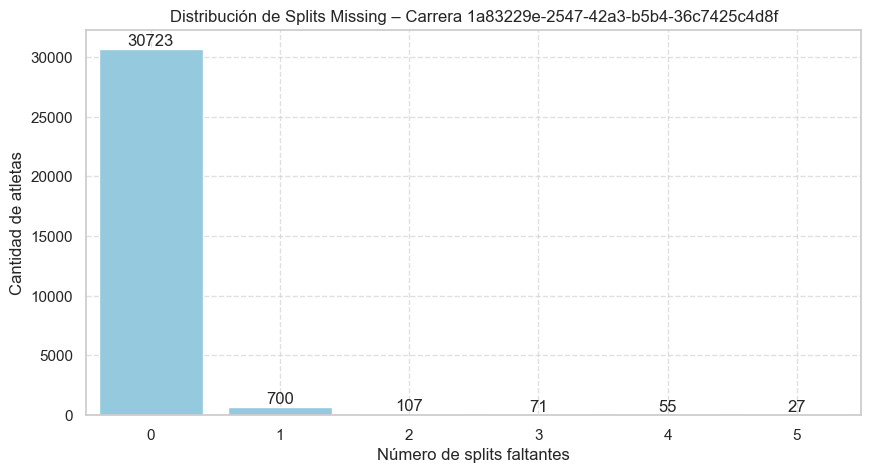

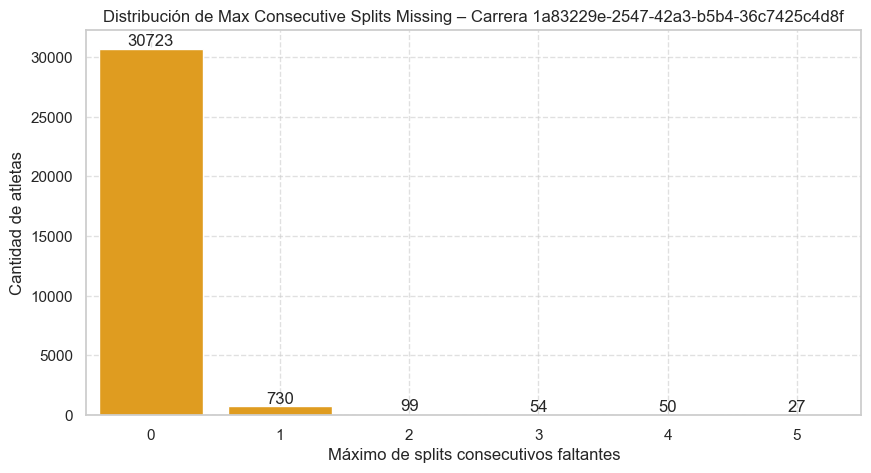

Número de atletas con seguimiento irregular (>3 splits faltantes): 82

=== Análisis de splits missing – Carrera cf6f71f2-1235-45e3-802e-02833b71ae8b ===
Resumen descriptivo de missing splits:
       splitsMissing  maxConsecutiveSplitsMissing
count    2736.000000                  2736.000000
mean        0.433480                     0.417398
std         0.546183                     0.511417
min         0.000000                     0.000000
25%         0.000000                     0.000000
50%         0.000000                     0.000000
75%         1.000000                     1.000000
max         7.000000                     7.000000

Porcentaje de atletas por número de 'splitsMissing':
splitsMissing
0    58.63
1    39.69
2     1.54
3     0.11
7     0.04
Name: count, dtype: float64

Porcentaje de atletas por número de 'maxConsecutiveSplitsMissing':
maxConsecutiveSplitsMissing
0    58.63
1    41.19
2     0.15
7     0.04
Name: count, dtype: float64


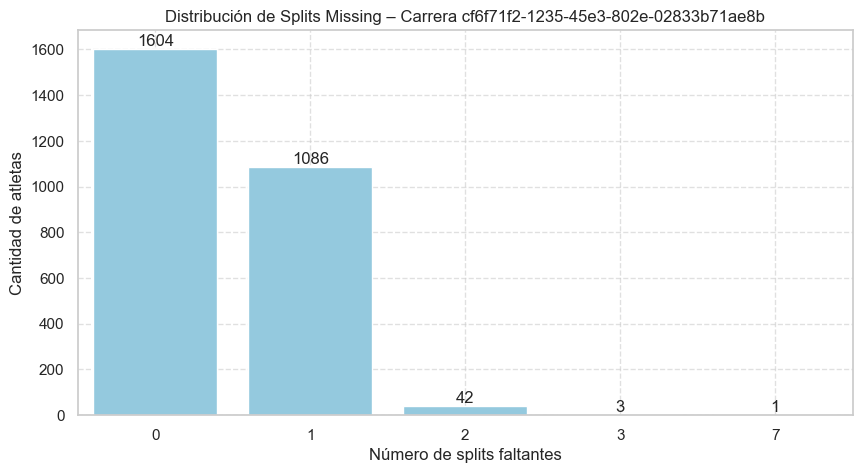

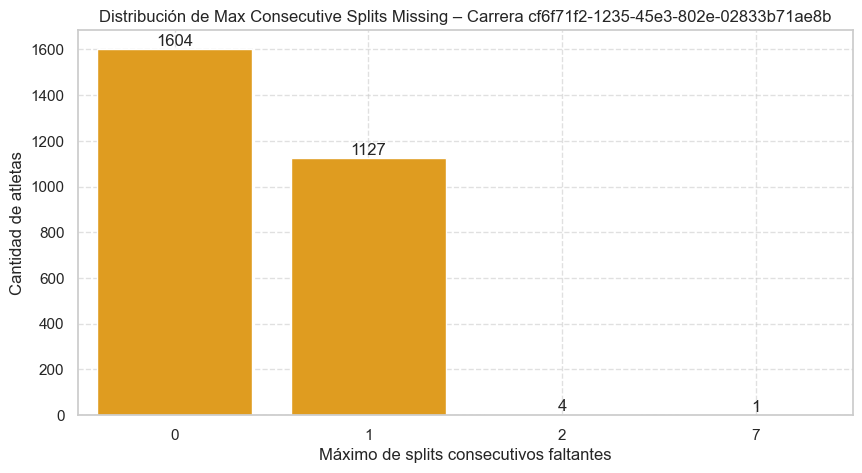

Número de atletas con seguimiento irregular (>3 splits faltantes): 1

=== Análisis de splits missing – Carrera 331e7589-6440-4968-9b44-484ba589824e ===
Resumen descriptivo de missing splits:
       splitsMissing  maxConsecutiveSplitsMissing
count   26865.000000                 26865.000000
mean        0.125851                     0.116843
std         0.740221                     0.695595
min         0.000000                     0.000000
25%         0.000000                     0.000000
50%         0.000000                     0.000000
75%         0.000000                     0.000000
max        10.000000                    10.000000

Porcentaje de atletas por número de 'splitsMissing':
splitsMissing
0     94.52
1      3.50
2      0.52
3      0.35
4      0.25
5      0.19
6      0.17
7      0.22
8      0.12
9      0.10
10     0.06
Name: count, dtype: float64

Porcentaje de atletas por número de 'maxConsecutiveSplitsMissing':
maxConsecutiveSplitsMissing
0     94.52
1      3.68
2      0.55

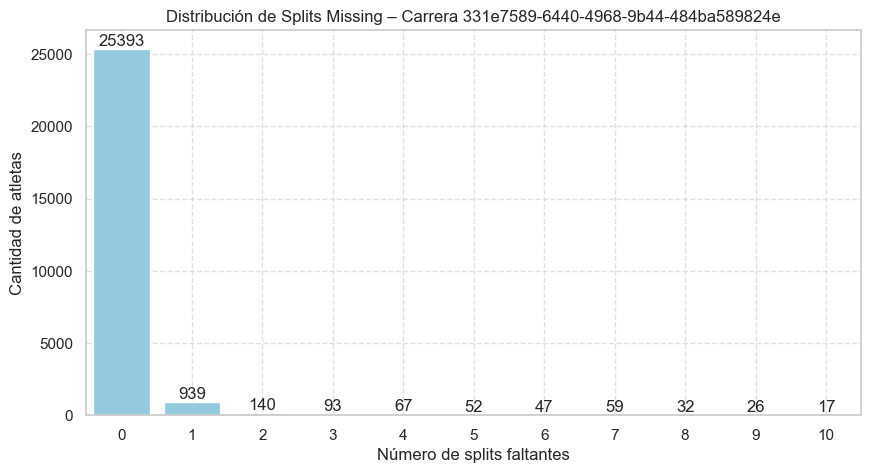

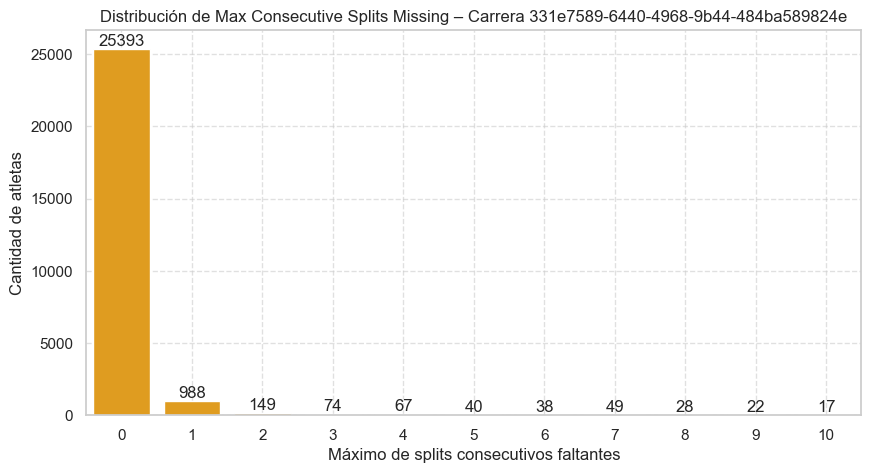

Número de atletas con seguimiento irregular (>3 splits faltantes): 300


In [48]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df = athletes_events_df.copy()

# Análisis por carrera
for race in df['race_id'].unique():
    df_race = df[df['race_id'] == race]
    print(f"\n=== Análisis de splits missing – Carrera {race} ===")
    
    # Resumen descriptivo
    summary = df_race[['splitsMissing', 'maxConsecutiveSplitsMissing']].describe()
    print("Resumen descriptivo de missing splits:")
    print(summary)
    
    # Conteo exacto
    count_splits = df_race['splitsMissing'].value_counts().sort_index()
    count_consecutive = df_race['maxConsecutiveSplitsMissing'].value_counts().sort_index()
    
    # Porcentaje (%)
    total = len(df_race)
    count_splits_pct = (count_splits / total * 100).round(2)
    count_consecutive_pct = (count_consecutive / total * 100).round(2)
    
    print("\nPorcentaje de atletas por número de 'splitsMissing':")
    print(count_splits_pct)
    
    print("\nPorcentaje de atletas por número de 'maxConsecutiveSplitsMissing':")
    print(count_consecutive_pct)
    
    # Gráficos
    plt.figure(figsize=(10,5))
    sns.barplot(x=count_splits.index, y=count_splits.values, color='skyblue')
    plt.title(f'Distribución de Splits Missing – Carrera {race}')
    plt.xlabel('Número de splits faltantes')
    plt.ylabel('Cantidad de atletas')
    plt.grid(True, linestyle='--', alpha=0.6)
    for i, v in enumerate(count_splits.values):
        plt.text(i, v + 0.5, str(v), ha='center', va='bottom')
    plt.show()
    
    plt.figure(figsize=(10,5))
    sns.barplot(x=count_consecutive.index, y=count_consecutive.values, color='orange')
    plt.title(f'Distribución de Max Consecutive Splits Missing – Carrera {race}')
    plt.xlabel('Máximo de splits consecutivos faltantes')
    plt.ylabel('Cantidad de atletas')
    plt.grid(True, linestyle='--', alpha=0.6)
    for i, v in enumerate(count_consecutive.values):
        plt.text(i, v + 0.5, str(v), ha='center', va='bottom')
    plt.show()
    
    # Seguimiento irregular (solo número)
    irregular_count = (df_race['splitsMissing'] > 3).sum()
    print(f"Número de atletas con seguimiento irregular (>3 splits faltantes): {irregular_count}")

Vemos como la mayoria de atletas no tienen muchos splits faltantes, de hecho más un 96% no tiene ninguno, esto es bastante bueno ya que vamos a poder tener datos completos de muchos atletas en todas las etapas de la carrera y nos van a servir para entender como se desarrollan los tiempos a muchos niveles. Por otro lado vemos como hay agunas personas con mas de 3 splits faltates que no han sido consecutivos, por lo que podriamos tener un precedente para analizar anomalias de falta de registros en carreras e identificar corredores a pone en cuarentena

### Nivel Atleta (Tiempos)

- Anomalías por reglas para las variables temporales más importantes. 
- Boxplots e histogramas de tiempos netos por split y velocidades medias por split
- Análisis de backups y datos válidos


=== Carrera 1a83229e-2547-42a3-b5b4-36c7425c4d8f ===


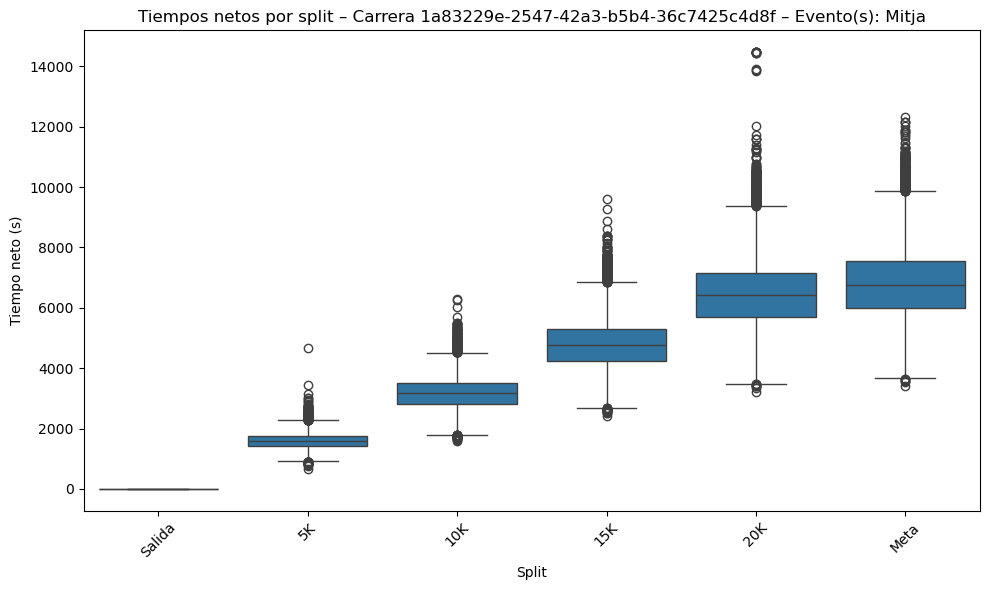


Número de anomalías por tipo:
anomaly_type
Outlier de tiempo    2920
Name: count, dtype: int64

Porcentaje de anomalías por split:
anomaly_type  Normal  Outlier de tiempo
split                                  
10K             98.0                2.0
15K             97.8                2.2
20K             97.7                2.3
5K              98.0                2.0
Meta            97.7                2.3
Salida         100.0                0.0

=== Carrera cf6f71f2-1235-45e3-802e-02833b71ae8b ===


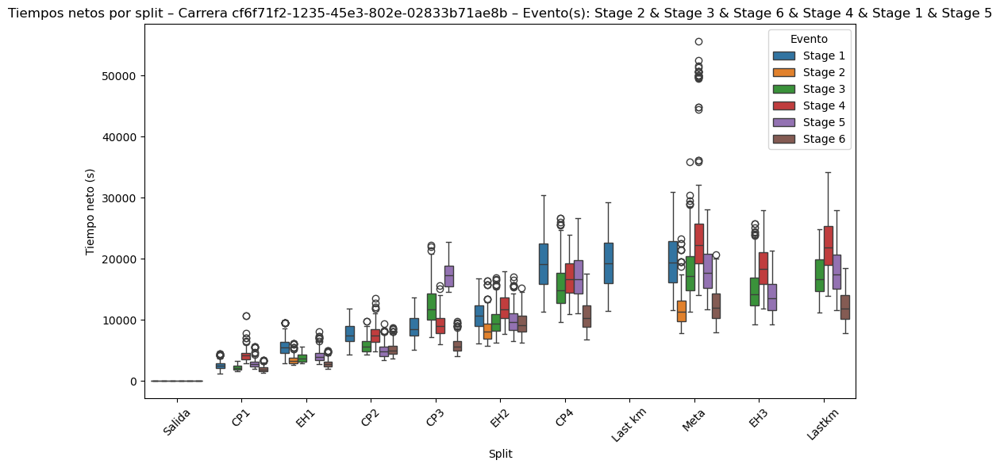


Número de anomalías por tipo:
anomaly_type
Velocidad imposible           1548
Outlier de tiempo              390
Ambas (velocidad y tiempo)     159
Name: count, dtype: int64

Porcentaje de anomalías por split:
anomaly_type  Ambas (velocidad y tiempo)  Normal  Outlier de tiempo  \
split                                                                 
CP1                                  0.6    80.8                2.9   
CP2                                  1.0    82.6                1.2   
CP3                                  1.0    87.6                2.7   
CP4                                  1.0    95.4                1.0   
EH1                                  1.0    77.0                4.1   
EH2                                  0.0    95.2                2.1   
EH3                                  1.0    96.0                1.9   
Last km                              1.1    96.4                1.1   
Lastkm                               0.8    95.9                1.4   
Meta    

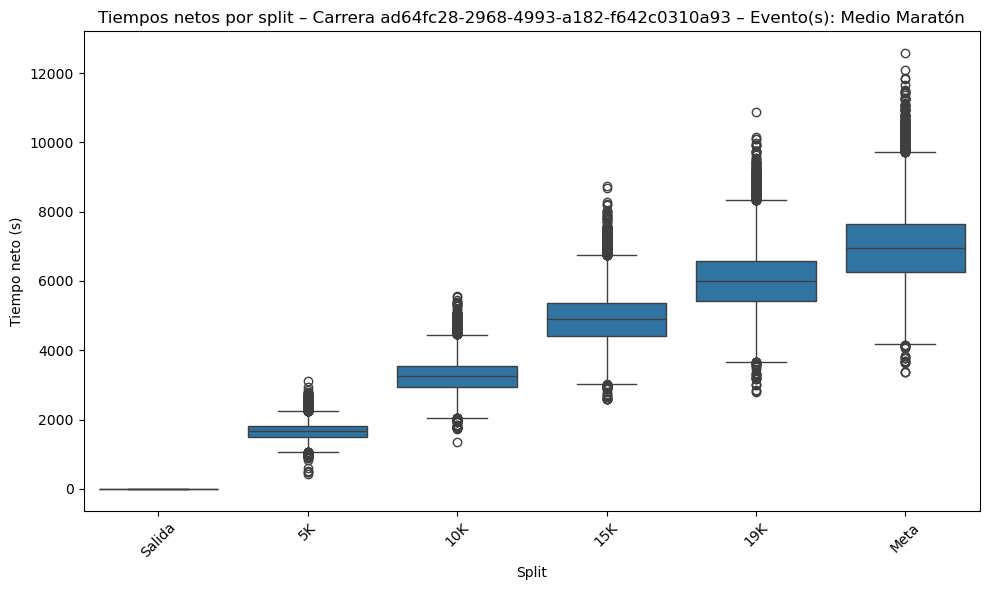

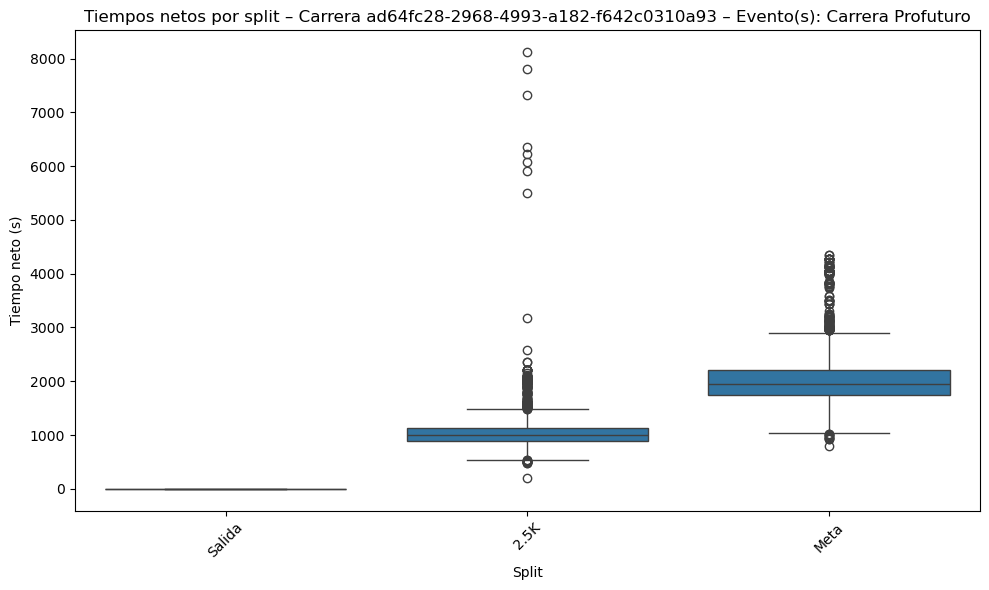


Número de anomalías por tipo:
anomaly_type
Outlier de tiempo    4275
Name: count, dtype: int64

Porcentaje de anomalías por split:
anomaly_type  Normal  Outlier de tiempo
split                                  
10K             97.6                2.4
15K             97.5                2.5
19K             97.5                2.5
2.5K            89.7               10.3
5K              97.6                2.4
Meta            90.5                9.5
Salida         100.0                0.0

=== Carrera 331e7589-6440-4968-9b44-484ba589824e ===


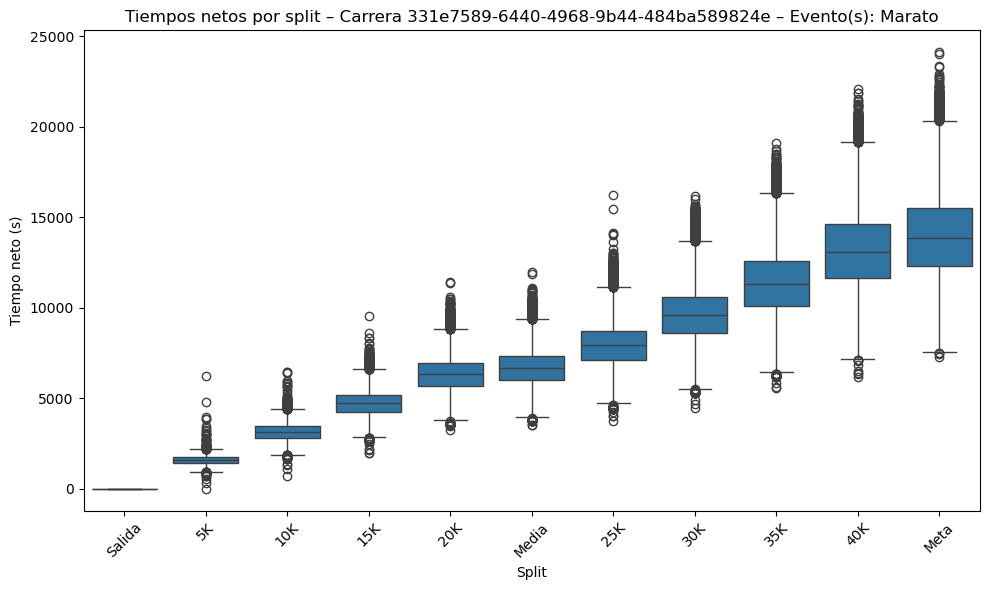


Número de anomalías por tipo:
anomaly_type
Outlier de tiempo    5118
Name: count, dtype: int64

Porcentaje de anomalías por split:
anomaly_type  Normal  Outlier de tiempo
split                                  
10K             97.9                2.1
15K             97.8                2.2
20K             97.6                2.4
25K             97.5                2.5
30K             97.5                2.5
35K             97.6                2.4
40K             97.7                2.3
5K              98.0                2.0
Media           97.5                2.5
Meta            97.7                2.3
Salida         100.0                0.0


In [29]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from collections import deque
from Levenshtein import distance as levenshtein_distance

# --- Copia de datos ---
df_times = athletes_time_df.copy()
df_times['netTime_sec'] = df_times['netTime_td'].dt.total_seconds()
df_times['time_sec'] = df_times['time_td'].dt.total_seconds()

# --- Cálculo de velocidad media ---
df_times['speed_m_per_s'] = np.where(df_times['average'] > 0, 1 / df_times['average'], np.nan)

# --- Función de detección de anomalías basada en IQR y percentiles 1-99 ---
def detect_anomalies_iqr(df):
    # Función auxiliar por split
    def outlier_iqr_percentiles(x):
        p1, q1, q3, p99 = np.nanpercentile(x, [1, 25, 75, 99])
        iqr = q3 - q1
        lower, upper = max(p1, q1 - 1.5 * iqr), min(p99, q3 + 1.5 * iqr)
        return (x < lower) | (x > upper)
    
    df['outlier_iqr'] = df.groupby('split')['netTime_sec'].transform(outlier_iqr_percentiles)
    df['speed_flag'] = df['speed_m_per_s'] > 7  # velocidad imposible ~2:23 min/km

    # Clasificación de anomalías
    df['anomaly_type'] = np.select(
        [
            df['speed_flag'] & df['outlier_iqr'],
            df['speed_flag'],
            df['outlier_iqr']
        ],
        [
            'Ambas (velocidad y tiempo)',
            'Velocidad imposible',
            'Outlier de tiempo'
        ],
        default='Normal'
    )
    
    return df

# --- Función para agrupar eventos similares por Levenshtein (transitivamente) ---
def group_events(event_list, max_dist=1):
    remaining = set(event_list)
    groups = []

    while remaining:
        start = remaining.pop()
        group = {start}
        queue = deque([start])
        while queue:
            current = queue.popleft()
            for other in list(remaining):
                if levenshtein_distance(current, other) <= max_dist:
                    group.add(other)
                    queue.append(other)
                    remaining.remove(other)
        groups.append(list(group))
    return groups

# --- Análisis por carrera ---
for race in df_times['race_id'].unique():
    print(f"\n=== Carrera {race} ===")
    df_race = df_times[df_times['race_id'] == race].copy()
    df_race = detect_anomalies_iqr(df_race)

    # Agrupar eventos similares
    eventos = df_race['event_id'].unique().tolist()
    grupos_eventos = group_events(eventos, max_dist=1)

    for grupo in grupos_eventos:
        df_plot = df_race[df_race['event_id'].isin(grupo)].copy()
        nombre_comun = " & ".join(grupo)
        df_plot['event_group'] = nombre_comun

        plt.figure(figsize=(10,6))
        if len(grupo) > 1:
            sns.boxplot(data=df_plot, x='split', y='netTime_sec', hue='event_id')
            plt.legend(title='Evento')
        else:
            sns.boxplot(data=df_plot, x='split', y='netTime_sec')
            plt.legend([], [], frameon=False)

        plt.title(f"Tiempos netos por split – Carrera {race} – Evento(s): {nombre_comun}")
        plt.xlabel("Split")
        plt.ylabel("Tiempo neto (s)")
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

    # Subconjunto de anomalías
    df_anomalies = df_race[df_race['anomaly_type'] != 'Normal']

    # Número de casos por tipo
    counts = df_anomalies['anomaly_type'].value_counts()
    print("\nNúmero de anomalías por tipo:")
    print(counts)

    # Porcentaje de anomalías por split
    summary_pct = (
        df_race.groupby('split')['anomaly_type']
        .value_counts(normalize=True)
        .unstack(fill_value=0)
        .round(3) * 100
    )
    print("\nPorcentaje de anomalías por split:")
    print(summary_pct)

Podemos ver como e tiempo se ve incrementado con respecto van pasando las etapas del evento, como es normal por otro lado. 

In [30]:
import pandas as pd
import numpy as np

# Copiar DataFrame
df = athletes_time_df.copy()

# Convertir netTime a segundos
df['netTime_sec'] = df['netTime_td'].dt.total_seconds()

# Inicializar columna
df['time_split_sec'] = 0.0

# Crear columna con netTime del split anterior dentro de cada grupo
df['prev_netTime'] = df.groupby(['athlete_id', 'race_id', 'event_id'])['netTime_sec'].shift(1)

# Marcar primer split de cada grupo
df['first_split'] = df.groupby(['athlete_id', 'race_id', 'event_id']).cumcount() == 0

# Asignar time_split_sec
# 1️⃣ Salida siempre = 0
df.loc[df['split'] == 'Salida', 'time_split_sec'] = 0.0

# 2️⃣ Primer split tras salida o primer split si no hay Salida
mask_first = df['first_split'] & (df['split'] != 'Salida')
df.loc[mask_first, 'time_split_sec'] = df.loc[mask_first, 'netTime_sec']

# 3️⃣ Resto de splits (netTime - prev_netTime)
mask_rest = ~df['first_split'] & (df['split'] != 'Salida')
df.loc[mask_rest, 'time_split_sec'] = df.loc[mask_rest, 'netTime_sec'] - df.loc[mask_rest, 'prev_netTime']

# Guardar en el DataFrame original
athletes_time_df['time_split_sec'] = df['time_split_sec']

# Limpiar columnas auxiliares
df.drop(columns=['prev_netTime','first_split'], inplace=True)

# Mostrar ejemplo
display(athletes_time_df[['athlete_id','race_id','event_id','split','netTime_td','time_split_sec']].head(20))


,athlete_id,race_id,event_id,split,netTime_td,time_split_sec
0,31,1a83229e-2547-42a3-b5b4-36c7425c4d8f,Mitja,Salida,0 days 00:00:00,0.000
1,31,1a83229e-2547-42a3-b5b4-36c7425c4d8f,Mitja,5K,0 days 00:14:51.230000,891.230
2,159,1a83229e-2547-42a3-b5b4-36c7425c4d8f,Mitja,Salida,0 days 00:00:00,0.000
3,159,1a83229e-2547-42a3-b5b4-36c7425c4d8f,Mitja,5K,0 days 00:18:01.165000,1081.165
4,159,1a83229e-2547-42a3-b5b4-36c7425c4d8f,Mitja,10K,0 days 00:35:56.349000,1075.184
5,159,1a83229e-2547-42a3-b5b4-36c7425c4d8f,Mitja,15K,0 days 00:53:51.805000,1075.456
6,159,1a83229e-2547-42a3-b5b4-36c7425c4d8f,Mitja,20K,0 days 01:11:59.789000,1087.984
7,159,1a83229e-2547-42a3-b5b4-36c7425c4d8f,Mitja,Meta,0 days 01:15:43.889000,224.100
8,160,1a83229e-2547-42a3-b5b4-36c7425c4d8f,Mitja,Salida,0 days 00:00:00,0.000
9,160,1a83229e-2547-42a3-b5b4-36c7425c4d8f,Mitja,5K,0 days 00:17:03.834000,1023.834



=== Distribución de tiempos por split – Carrera cf6f71f2-1235-45e3-802e-02833b71ae8b, Evento Stage 1 ===


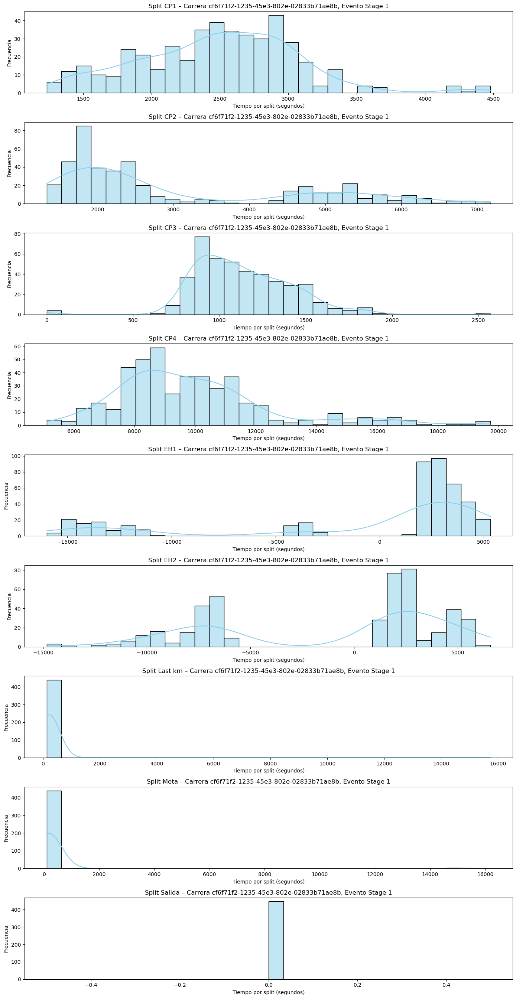


=== Distribución de tiempos por split – Carrera cf6f71f2-1235-45e3-802e-02833b71ae8b, Evento Stage 2 ===


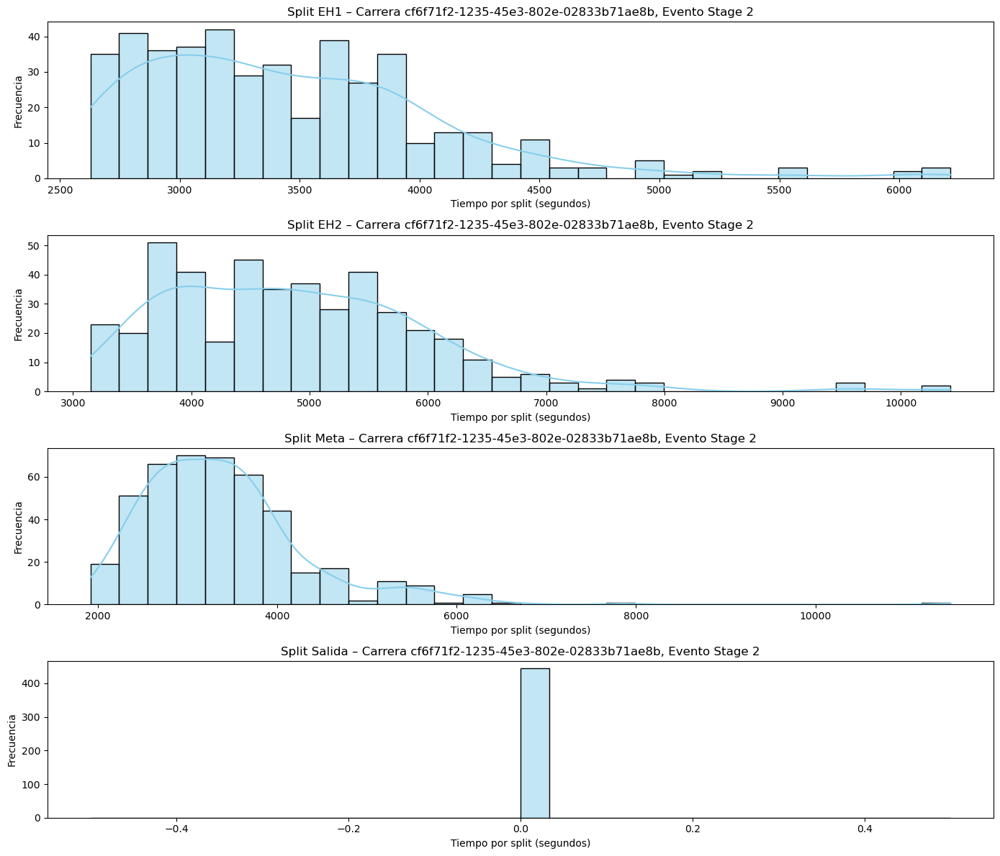


=== Distribución de tiempos por split – Carrera cf6f71f2-1235-45e3-802e-02833b71ae8b, Evento Stage 3 ===


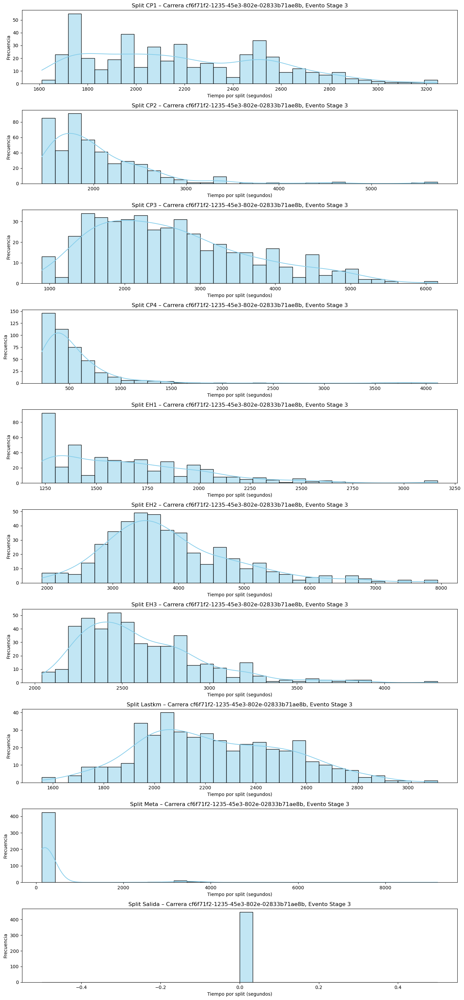


=== Distribución de tiempos por split – Carrera cf6f71f2-1235-45e3-802e-02833b71ae8b, Evento Stage 4 ===


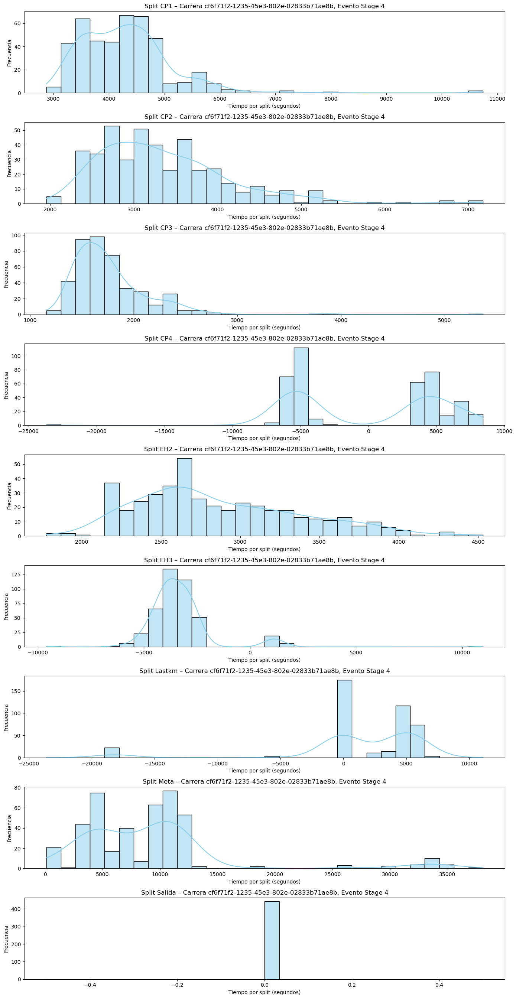


=== Distribución de tiempos por split – Carrera cf6f71f2-1235-45e3-802e-02833b71ae8b, Evento Stage 5 ===


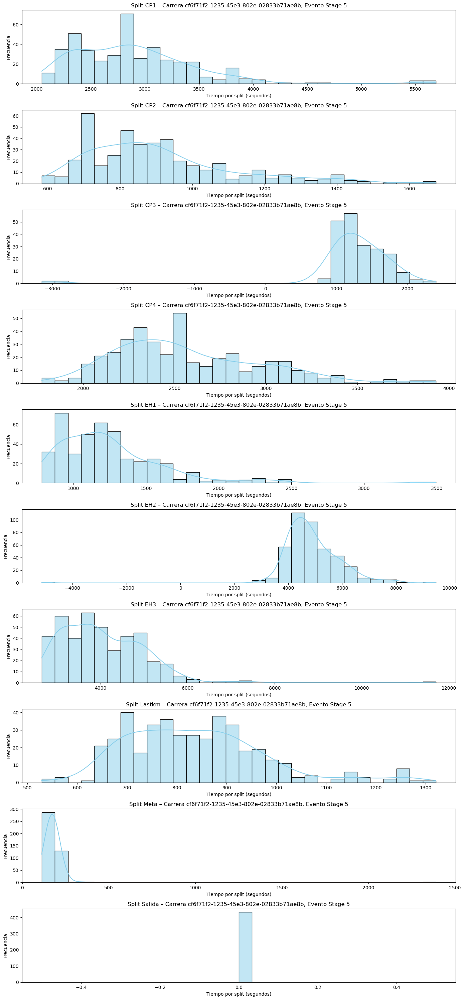


=== Distribución de tiempos por split – Carrera cf6f71f2-1235-45e3-802e-02833b71ae8b, Evento Stage 6 ===


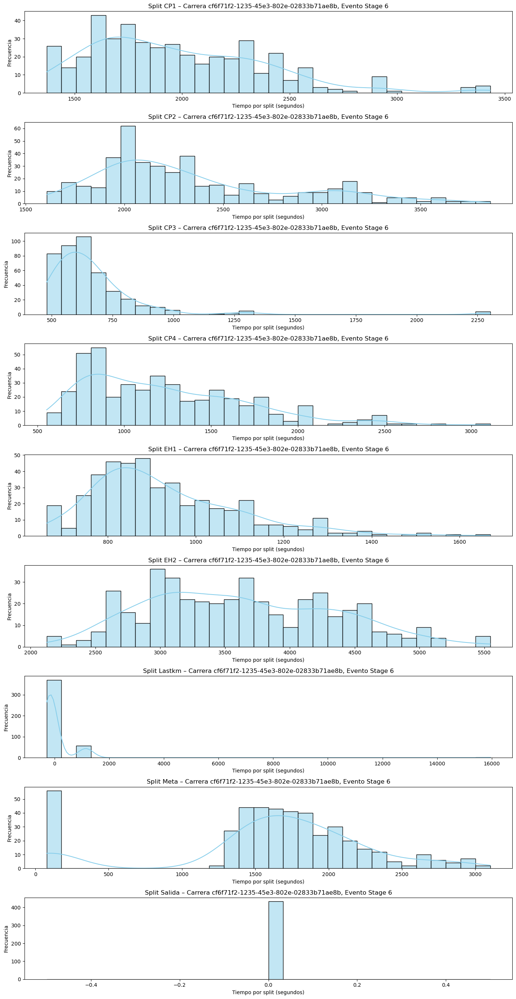


=== Distribución de tiempos por split – Carrera ad64fc28-2968-4993-a182-f642c0310a93, Evento Carrera Profuturo ===


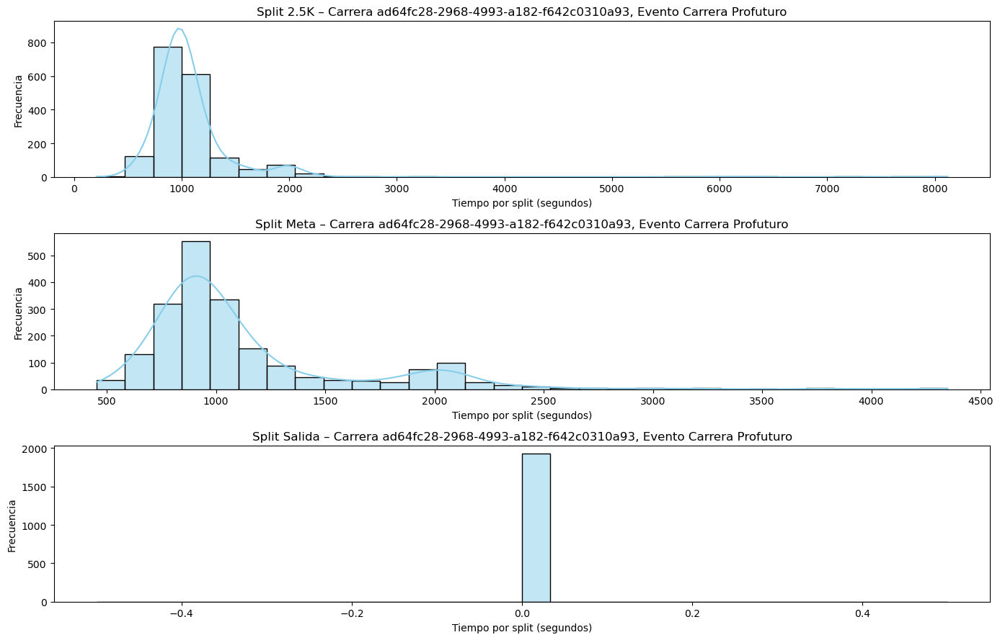


=== Distribución de tiempos por split – Carrera ad64fc28-2968-4993-a182-f642c0310a93, Evento Medio Maratón ===


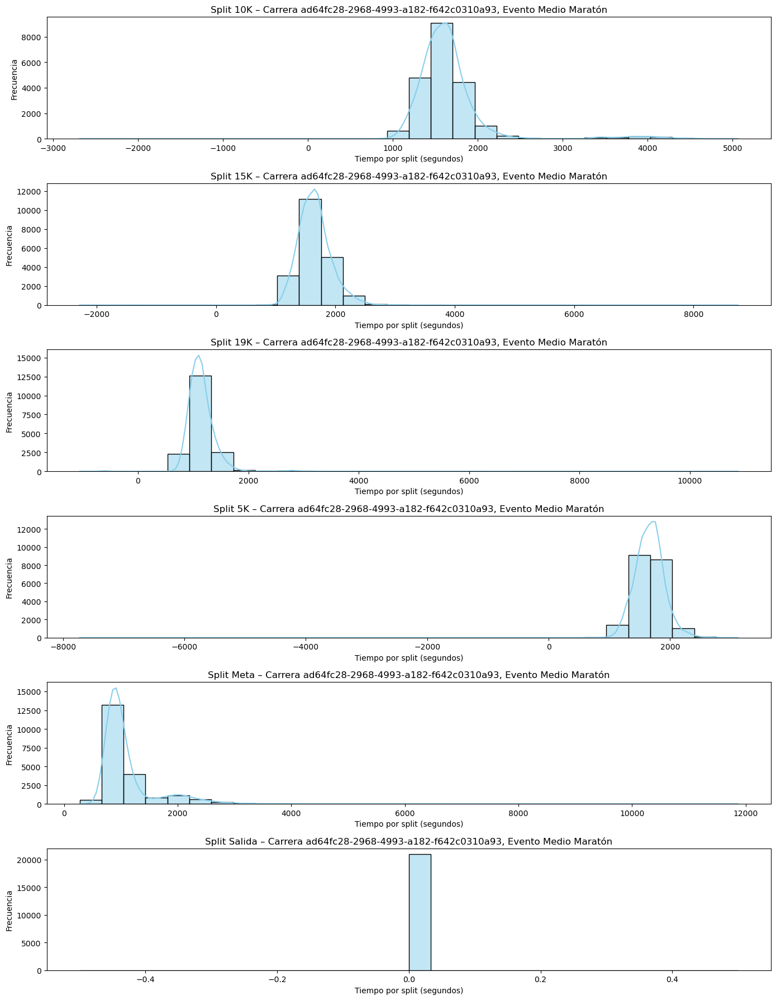


=== Distribución de tiempos por split – Carrera 1a83229e-2547-42a3-b5b4-36c7425c4d8f, Evento Mitja ===


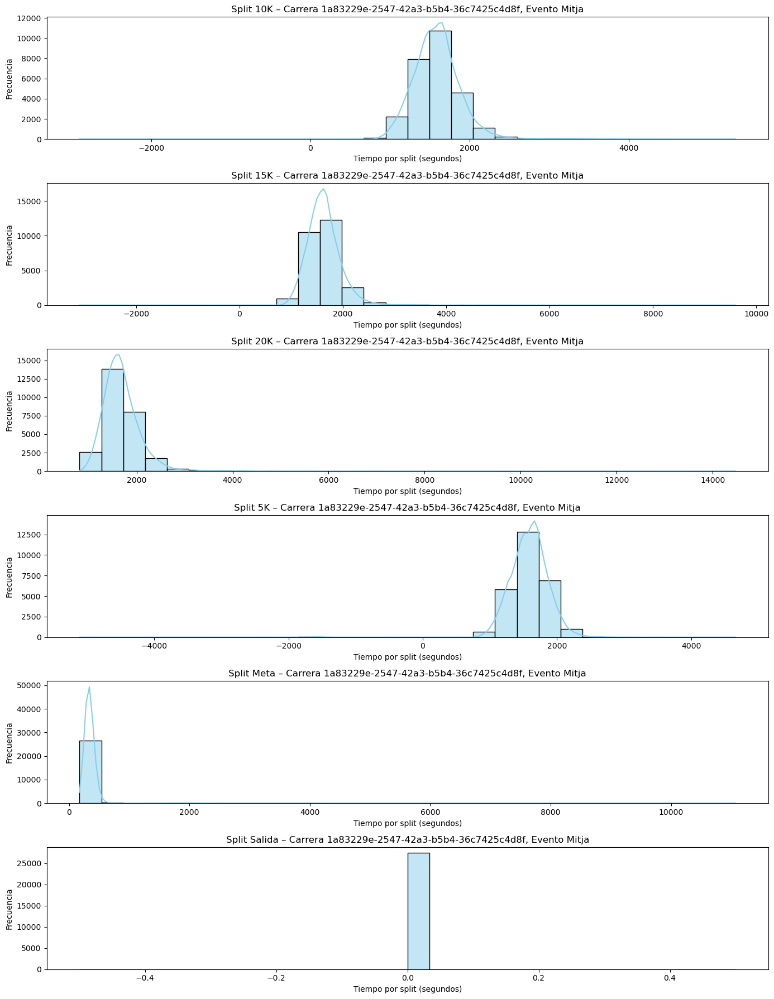


=== Distribución de tiempos por split – Carrera 331e7589-6440-4968-9b44-484ba589824e, Evento Marato ===


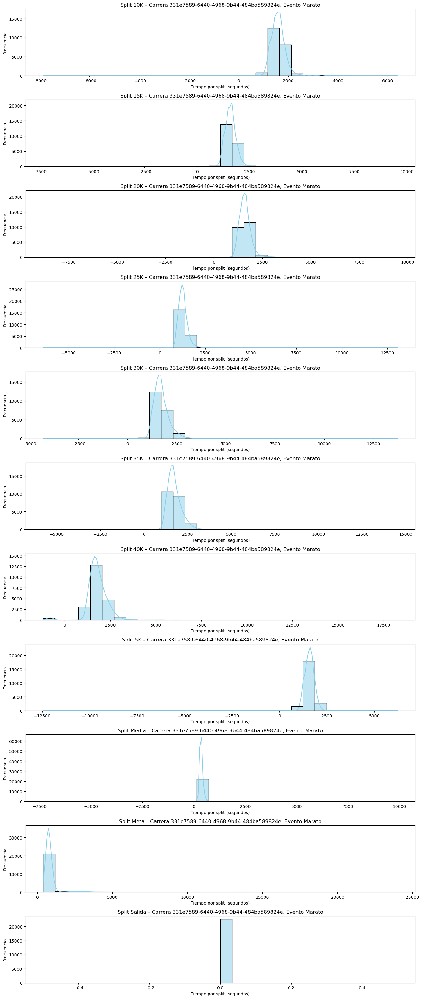

In [31]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Copiar dataframe original
df = athletes_time_df.copy()

# Asegurarnos de tener la columna netTime en segundos
if 'netTime_td' not in df.columns:
    raise KeyError("No existe la columna 'netTime_td' en athletes_time_df.")
df['netTime_sec'] = df['netTime_td'].dt.total_seconds()

# Ordenar por atleta, carrera, evento y split
df = df.sort_values(['athlete_id', 'race_id', 'event_id', 'split'])

# --- Ya tenemos time_split_sec calculado, solo vamos a usarlo ---
# Verificamos que exista
if 'time_split_sec' not in df.columns:
    raise KeyError("No existe la columna 'time_split_sec'. Debe calcularse antes.")

# --- Generar histogramas por carrera, evento y split ---
for race in df['race_id'].unique():
    df_race = df[df['race_id'] == race]
    
    for event in df_race['event_id'].unique():
        df_event = df_race[df_race['event_id'] == event]
        splits = sorted(df_event['split'].unique())
        n_splits = len(splits)
        
        print(f"\n=== Distribución de tiempos por split – Carrera {race}, Evento {event} ===")
        plt.figure(figsize=(14, 3 * n_splits))
        
        for i, sp in enumerate(splits):
            plt.subplot(n_splits, 1, i + 1)
            sns.histplot(df_event[df_event['split'] == sp]['time_split_sec'], bins=30, kde=True, color='skyblue')
            plt.title(f'Split {sp} – Carrera {race}, Evento {event}')
            plt.xlabel('Tiempo por split (segundos)')
            plt.ylabel('Frecuencia')
        
        plt.tight_layout()
        plt.show()


=== Carrera 1a83229e-2547-42a3-b5b4-36c7425c4d8f ===


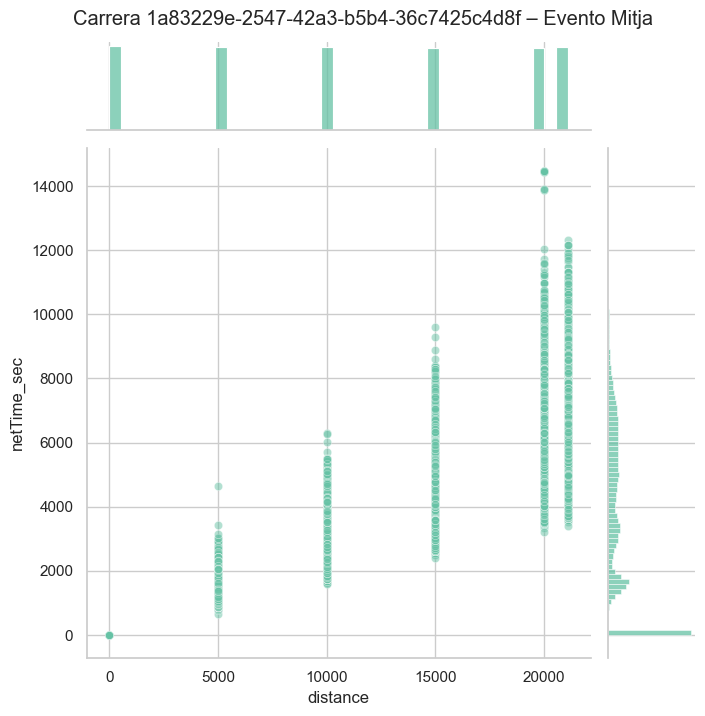


Evento: Mitja
Total filas en el evento: 162743
Filas anómalas: 639
Resumen de atletas anómalos (primeras 10 filas):


,athlete_id,split,avg_time,mediana_split,z_max,z_min,count
0,0125248f-fead-4695-ba34-d835ce861328,20K,14470.973,6425.4700,6.980272,6.980272,1
1,0e069610-fb61-4088-a570-78b8444be44e,20K,14471.049,6425.4700,6.980338,6.980338,1
2,1228964D,10K,5706.560,3176.5900,4.764716,4.764716,1
3,1228964D,5K,2726.805,1597.0120,4.286889,4.286889,1
4,12ZDA656,10K,4934.146,3176.5900,3.310021,3.310021,1
5,12ZDA656,15K,7741.939,4781.8305,3.615449,3.615449,1
6,1343Z94B,5K,2570.534,1597.0120,3.693934,3.693934,1
7,13C1CY24,20K,9981.067,6425.4700,3.084833,3.084833,1
8,13C1CY24,Meta,10627.016,6756.5145,3.222190,3.222190,1
9,1441981A,10K,5477.137,3176.5900,4.332641,4.332641,1


C:\Users\mario\AppData\Local\Temp\ipykernel_10780\3257255007.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_event, x='split', y='netTime_sec', palette='Set2')


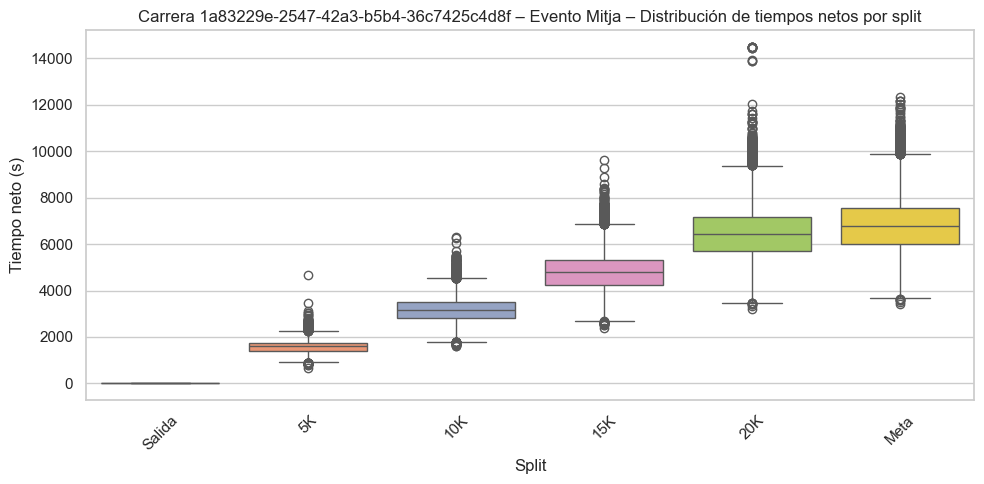


=== Carrera cf6f71f2-1235-45e3-802e-02833b71ae8b ===


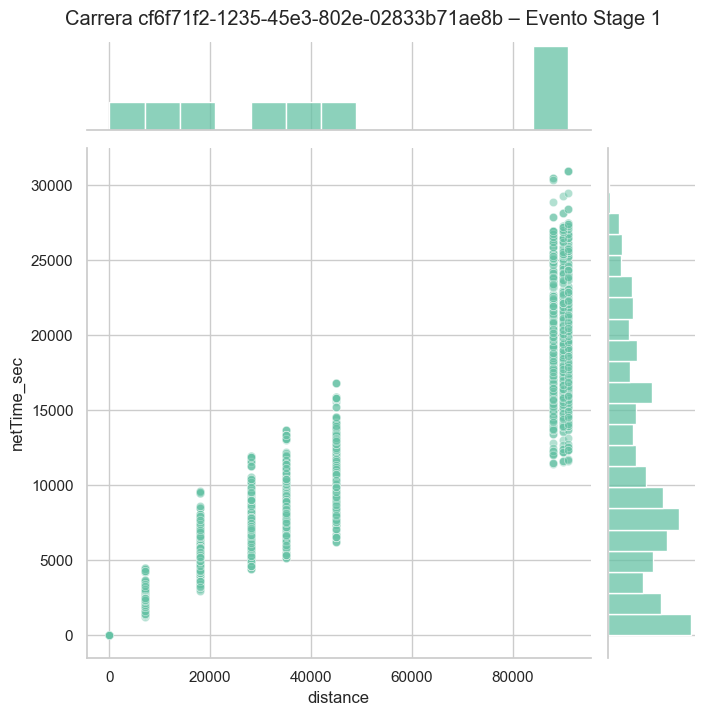


Evento: Stage 1
Total filas en el evento: 4000
Filas anómalas: 14
Resumen de atletas anómalos (primeras 10 filas):


,athlete_id,split,avg_time,mediana_split,z_max,z_min,count
0,0f6bf316-df6a-5246-88b1-ad44f4b7a0cb,EH1,9558.742,5460.599,3.153264,3.153264,1
1,26d88625-694b-5087-8cda-7a0645b3be29,EH1,9492.174,5460.599,3.102044,3.102044,1
2,60f9f643-db20-525b-b805-ea6464c403f7,CP1,4278.945,2511.080,3.012005,3.012005,1
3,60f9f643-db20-525b-b805-ea6464c403f7,EH1,9502.622,5460.599,3.110083,3.110083,1
4,628d8260-0f0b-5b1a-b234-fe48c5ff3246,CP1,4478.445,2511.080,3.351904,3.351904,1
5,628d8260-0f0b-5b1a-b234-fe48c5ff3246,EH1,9507.270,5460.599,3.113659,3.113659,1
6,6ebf9a41-86ab-5447-9f63-3b6a47f6e720,CP1,4384.996,2511.080,3.192690,3.192690,1
7,6ebf9a41-86ab-5447-9f63-3b6a47f6e720,EH1,9600.003,5460.599,3.185011,3.185011,1
8,6feade42-64ad-5daf-891a-9a3d30b043e5,EH1,9503.763,5460.599,3.110961,3.110961,1
9,a052d5cd-51ca-5d63-ad06-ebfa720f6ddd,EH1,9561.876,5460.599,3.155675,3.155675,1


C:\Users\mario\AppData\Local\Temp\ipykernel_10780\3257255007.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_event, x='split', y='netTime_sec', palette='Set2')


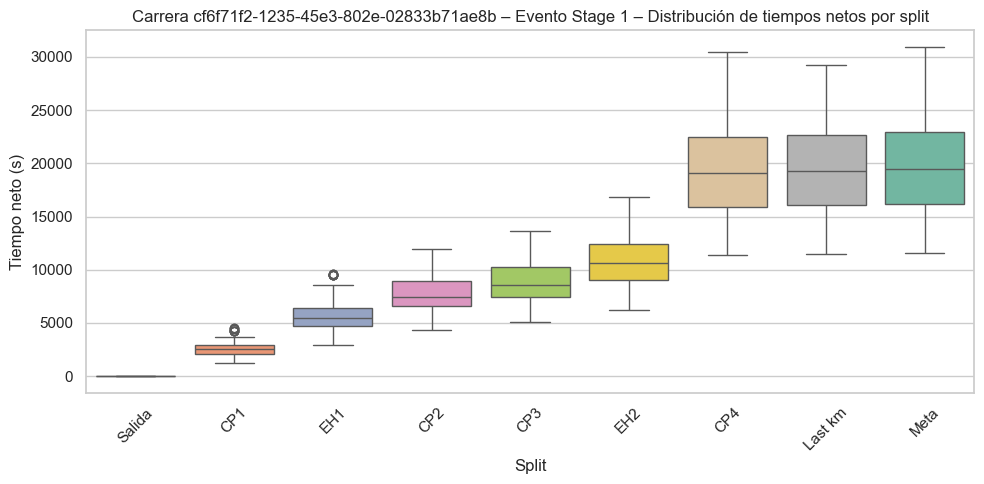

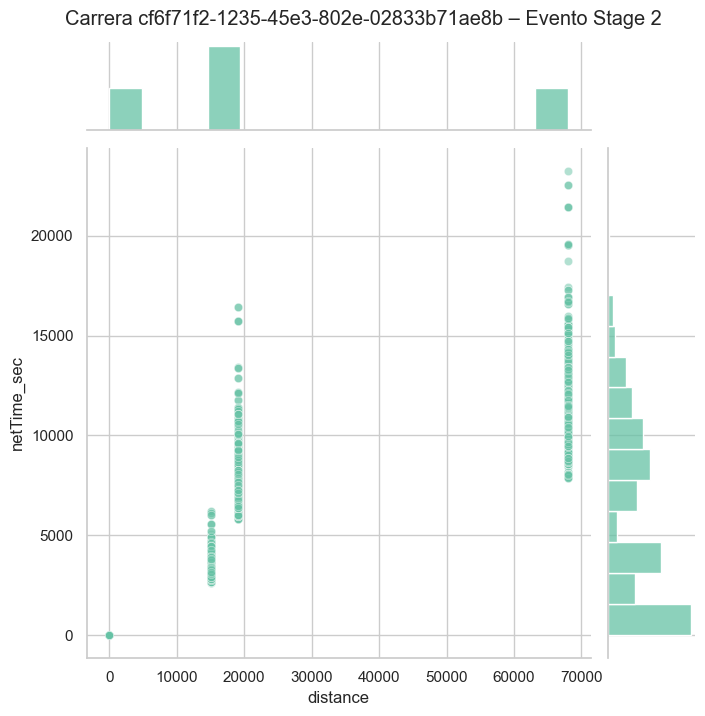


Evento: Stage 2
Total filas en el evento: 1772
Filas anómalas: 26
Resumen de atletas anómalos (primeras 10 filas):


,athlete_id,split,avg_time,mediana_split,z_max,z_min,count
0,01f3ab93-17f9-5414-9023-93832a5e40f9,Meta,19571.308,11371.660,3.141982,3.141982,1
1,15dde7fc-54de-5aa0-8a4e-464aea30342d,EH1,6007.330,3349.113,4.134821,4.134821,1
2,15dde7fc-54de-5aa0-8a4e-464aea30342d,EH2,16426.586,8085.558,4.747193,4.747193,1
3,15dde7fc-54de-5aa0-8a4e-464aea30342d,Meta,22542.334,11371.660,4.280434,4.280434,1
4,23e386ac-b354-5d95-8a18-67cd7cd83148,EH1,6213.931,3349.113,4.456186,4.456186,1
5,23e386ac-b354-5d95-8a18-67cd7cd83148,EH2,15752.813,8085.558,4.363723,4.363723,1
6,23e386ac-b354-5d95-8a18-67cd7cd83148,Meta,21457.755,11371.660,3.864840,3.864840,1
7,2f96ded9-1db9-55dd-ad34-45039f6302d0,Meta,23262.349,11371.660,4.556333,4.556333,1
8,3304619f-941a-58cb-8d8f-ed03b6665ae7,EH1,5551.368,3349.113,3.425578,3.425578,1
9,3304619f-941a-58cb-8d8f-ed03b6665ae7,EH2,13396.068,8085.558,3.022411,3.022411,1


C:\Users\mario\AppData\Local\Temp\ipykernel_10780\3257255007.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_event, x='split', y='netTime_sec', palette='Set2')


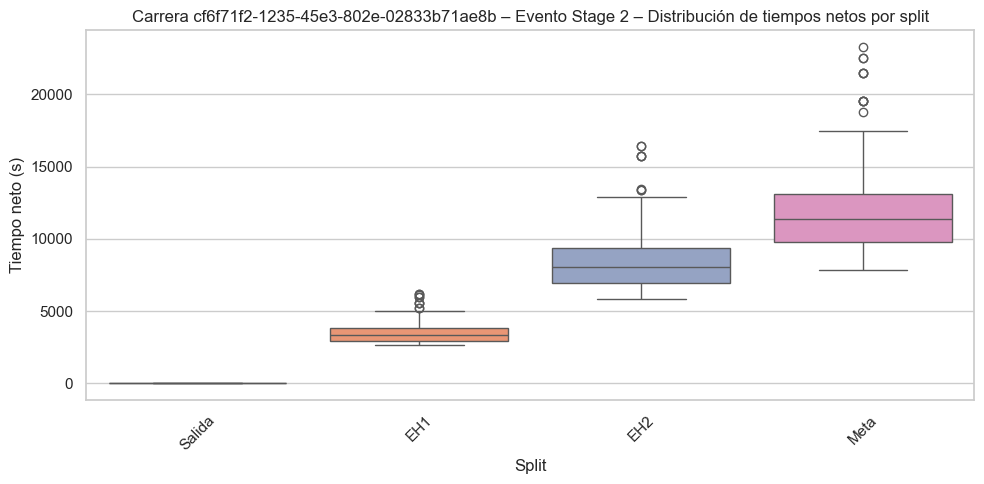

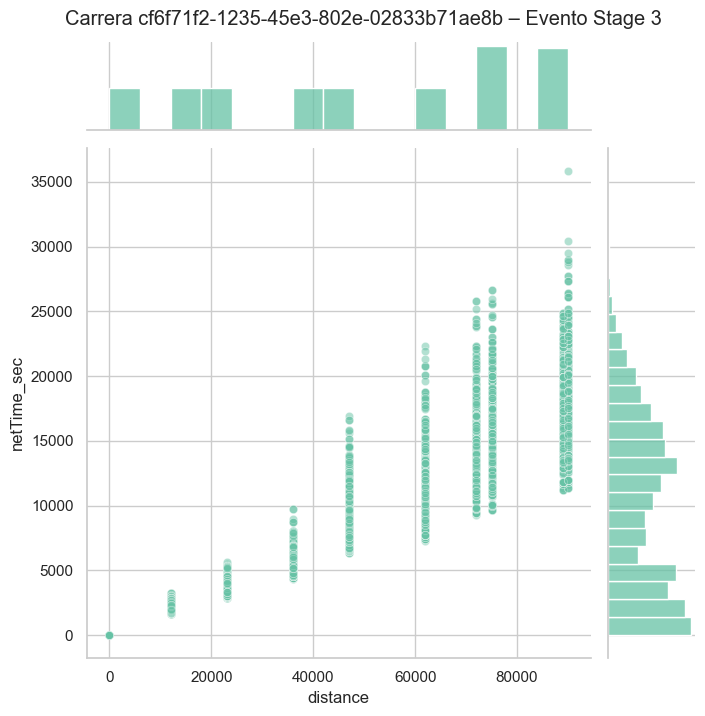


Evento: Stage 3
Total filas en el evento: 4430
Filas anómalas: 32
Resumen de atletas anómalos (primeras 10 filas):


,athlete_id,split,avg_time,mediana_split,z_max,z_min,count
0,15dde7fc-54de-5aa0-8a4e-464aea30342d,CP2,9740.989,5661.5870,3.660865,3.660865,1
1,15dde7fc-54de-5aa0-8a4e-464aea30342d,EH2,16625.354,9366.0630,3.515923,3.515923,1
2,23e386ac-b354-5d95-8a18-67cd7cd83148,CP3,22322.290,11759.0795,3.529878,3.529878,1
3,23e386ac-b354-5d95-8a18-67cd7cd83148,CP4,26657.438,14870.9025,3.359170,3.359170,1
4,23e386ac-b354-5d95-8a18-67cd7cd83148,EH2,16944.913,9366.0630,3.670696,3.670696,1
5,23e386ac-b354-5d95-8a18-67cd7cd83148,EH3,25783.220,14278.8750,3.486007,3.486007,1
6,23e386ac-b354-5d95-8a18-67cd7cd83148,Meta,30449.670,17197.2680,3.389653,3.389653,1
7,32c70449-f036-5c7d-b886-c62e889004c9,CP3,21333.703,11759.0795,3.199524,3.199524,1
8,32c70449-f036-5c7d-b886-c62e889004c9,CP4,25971.287,14870.9025,3.163617,3.163617,1
9,32c70449-f036-5c7d-b886-c62e889004c9,EH2,15816.975,9366.0630,3.124397,3.124397,1


C:\Users\mario\AppData\Local\Temp\ipykernel_10780\3257255007.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_event, x='split', y='netTime_sec', palette='Set2')


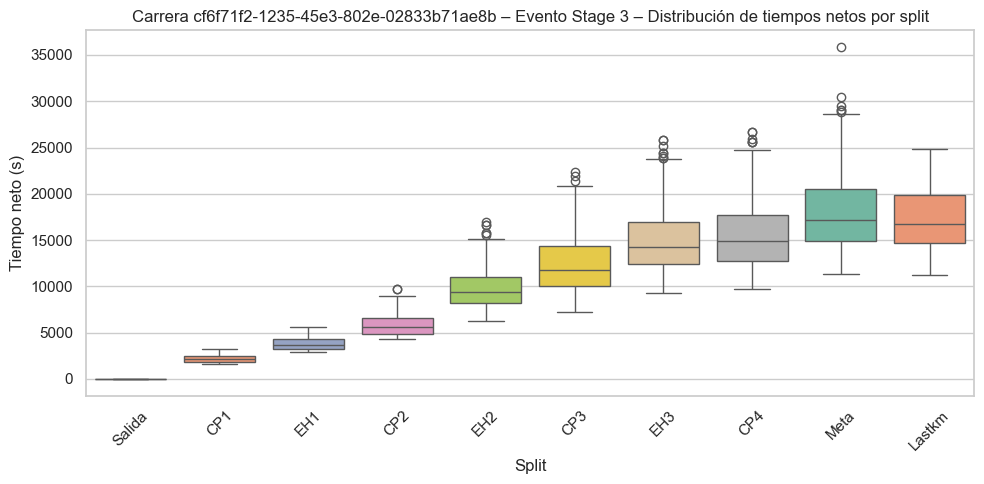

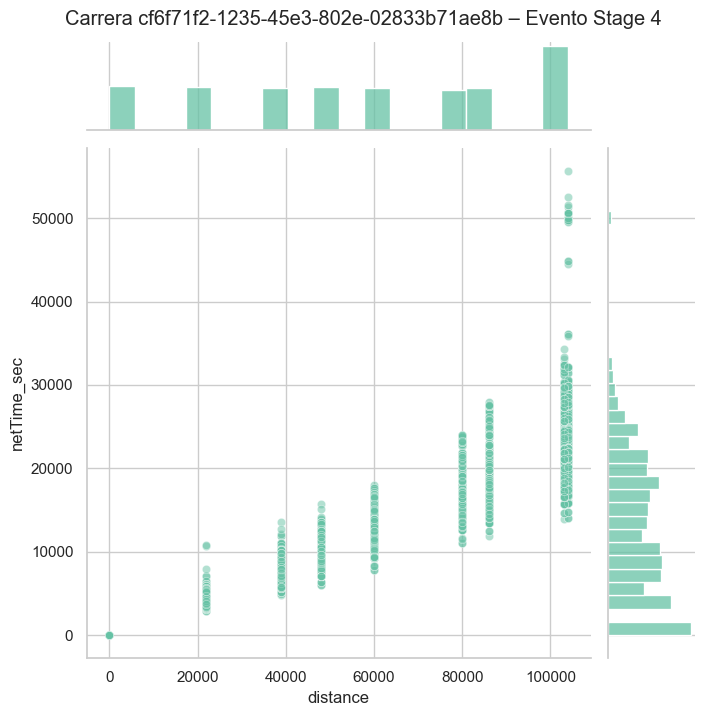


Evento: Stage 4
Total filas en el evento: 3839
Filas anómalas: 33
Resumen de atletas anómalos (primeras 10 filas):


,athlete_id,split,avg_time,mediana_split,z_max,z_min,count
0,0a6e3323-3dac-5f3e-8fd0-1bd50da1b34f,Meta,49737.868,22301.2955,3.710209,3.710209,1
1,0cb4c284-fd60-51b4-b1a2-5fc0ea4cb2c8,Meta,50072.286,22301.2955,3.755432,3.755432,1
2,108c6543-d171-5c31-b66f-b347efcd3e69,CP1,10734.598,4251.1810,7.540757,7.540757,1
3,1a6117fa-a1d6-5187-8a4e-34c945bc47c0,CP1,7884.766,4251.1810,4.226164,4.226164,1
4,1a6117fa-a1d6-5187-8a4e-34c945bc47c0,CP2,12103.230,7461.2360,3.163613,3.163613,1
5,1a6117fa-a1d6-5187-8a4e-34c945bc47c0,Meta,55672.813,22301.2955,4.512783,4.512783,1
6,1bb9d1a9-95b8-5d44-a527-c665106f1ee2,CP1,7117.984,4251.1810,3.334332,3.334332,1
7,23ad916a-c728-587c-84a8-5e0c080174fa,CP3,15661.209,9071.8500,3.795459,3.795459,1
8,23e386ac-b354-5d95-8a18-67cd7cd83148,Meta,50675.846,22301.2955,3.837050,3.837050,1
9,286fee3f-838c-578e-93aa-46ddc1bc884b,Meta,44819.070,22301.2955,3.045047,3.045047,1


C:\Users\mario\AppData\Local\Temp\ipykernel_10780\3257255007.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_event, x='split', y='netTime_sec', palette='Set2')


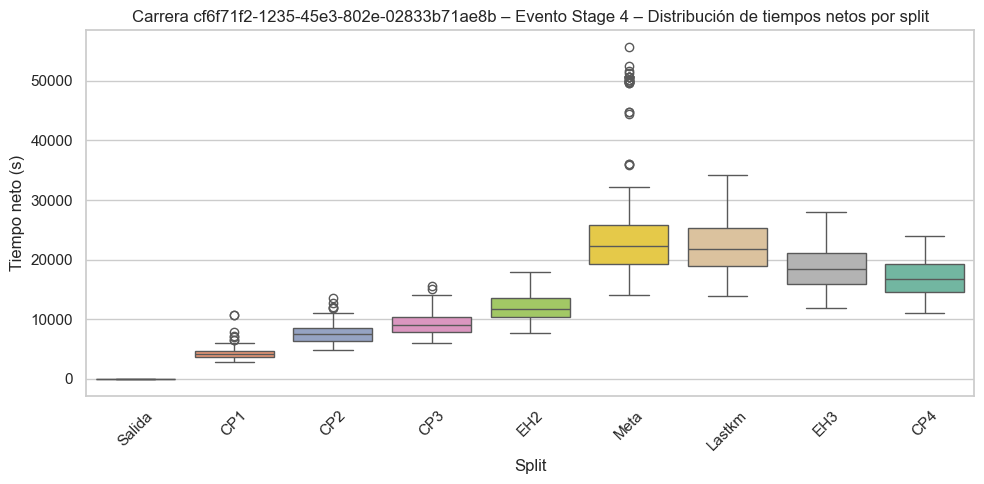

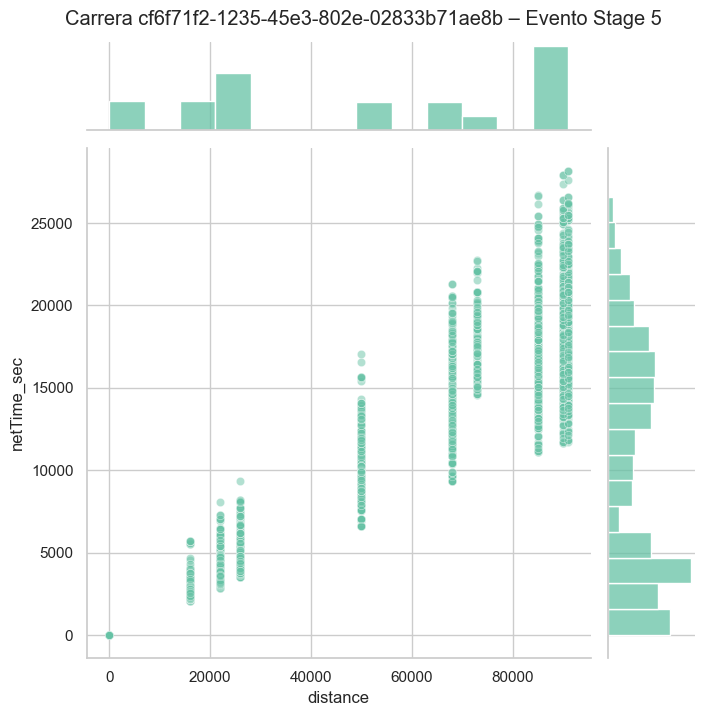


Evento: Stage 5
Total filas en el evento: 4030
Filas anómalas: 30
Resumen de atletas anómalos (primeras 10 filas):


,athlete_id,split,avg_time,mediana_split,z_max,z_min,count
0,23e386ac-b354-5d95-8a18-67cd7cd83148,EH2,15578.599,9614.6610,3.185302,3.185302,1
1,23e386ac-b354-5d95-8a18-67cd7cd83148,Lastkm,27914.502,17528.4110,3.005770,3.005770,1
2,3304619f-941a-58cb-8d8f-ed03b6665ae7,EH2,15643.193,9614.6610,3.219801,3.219801,1
3,8b3763fa-0cda-50f1-8449-69496d83a314,CP1,5689.788,2840.2735,4.917779,4.917779,1
4,8b3763fa-0cda-50f1-8449-69496d83a314,CP2,8102.716,4912.9800,3.111391,3.111391,1
5,8b3763fa-0cda-50f1-8449-69496d83a314,EH1,7072.046,4012.3090,3.514792,3.514792,1
6,a5dc12b3-8827-5cca-bbfa-e68325c2c949,EH2,15644.574,9614.6610,3.220539,3.220539,1
7,ad9b3031-1b8b-539f-9af1-7a90ab51f8bf,CP1,5559.960,2840.2735,4.693718,4.693718,1
8,ad9b3031-1b8b-539f-9af1-7a90ab51f8bf,CP2,8207.833,4912.9800,3.213927,3.213927,1
9,ad9b3031-1b8b-539f-9af1-7a90ab51f8bf,EH1,6947.238,4012.3090,3.371422,3.371422,1


C:\Users\mario\AppData\Local\Temp\ipykernel_10780\3257255007.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_event, x='split', y='netTime_sec', palette='Set2')


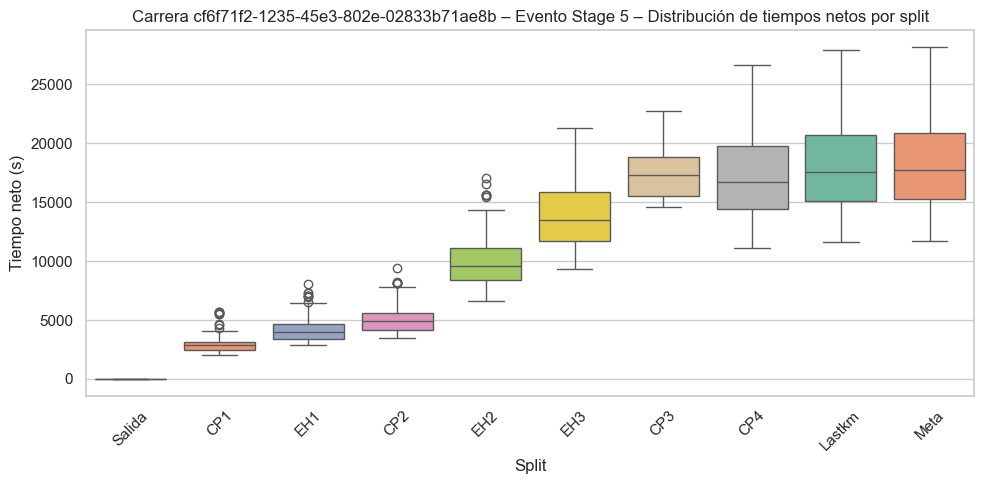

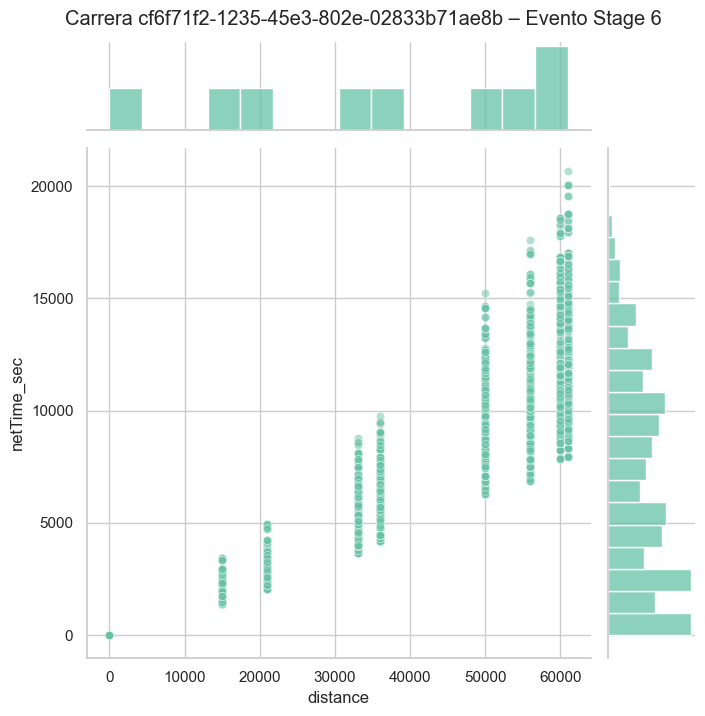


Evento: Stage 6
Total filas en el evento: 3887
Filas anómalas: 26
Resumen de atletas anómalos (primeras 10 filas):


,athlete_id,split,avg_time,mediana_split,z_max,z_min,count
0,23e386ac-b354-5d95-8a18-67cd7cd83148,CP1,3374.170,1906.6100,3.575068,3.575068,1
1,23e386ac-b354-5d95-8a18-67cd7cd83148,CP2,8779.672,5051.8470,3.559877,3.559877,1
2,23e386ac-b354-5d95-8a18-67cd7cd83148,CP3,9755.293,5633.9760,3.553424,3.553424,1
3,23e386ac-b354-5d95-8a18-67cd7cd83148,CP4,17577.168,10351.5580,3.193095,3.193095,1
4,23e386ac-b354-5d95-8a18-67cd7cd83148,EH1,4961.230,2789.5500,3.832696,3.832696,1
5,23e386ac-b354-5d95-8a18-67cd7cd83148,EH2,15219.951,9179.7135,3.274776,3.274776,1
6,23e386ac-b354-5d95-8a18-67cd7cd83148,Meta,20679.427,12052.2480,3.241231,3.241231,1
7,32c70449-f036-5c7d-b886-c62e889004c9,CP1,3359.170,1906.6100,3.538527,3.538527,1
8,32c70449-f036-5c7d-b886-c62e889004c9,EH1,4748.960,2789.5500,3.458071,3.458071,1
9,3b31dd33-621c-52a2-8dfd-fb818e5c66eb,CP1,3432.500,1906.6100,3.717164,3.717164,1


C:\Users\mario\AppData\Local\Temp\ipykernel_10780\3257255007.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_event, x='split', y='netTime_sec', palette='Set2')


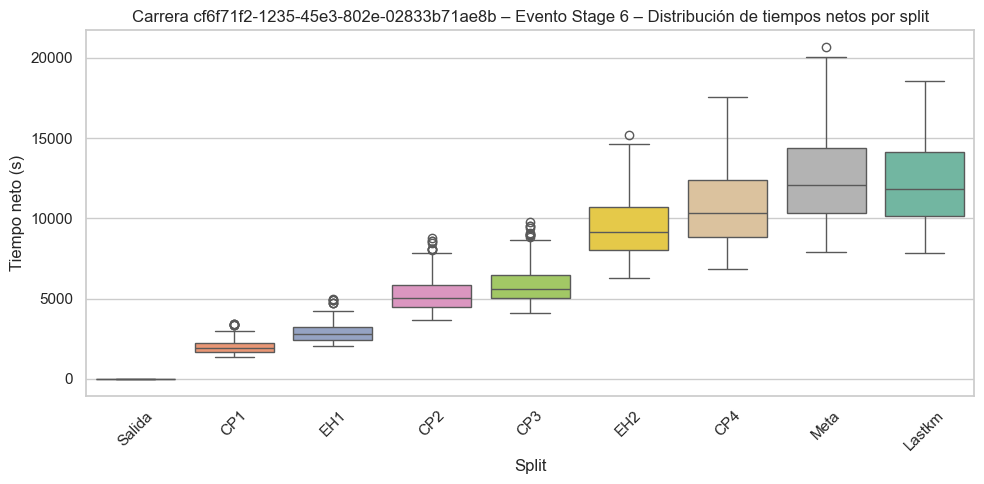


=== Carrera 331e7589-6440-4968-9b44-484ba589824e ===


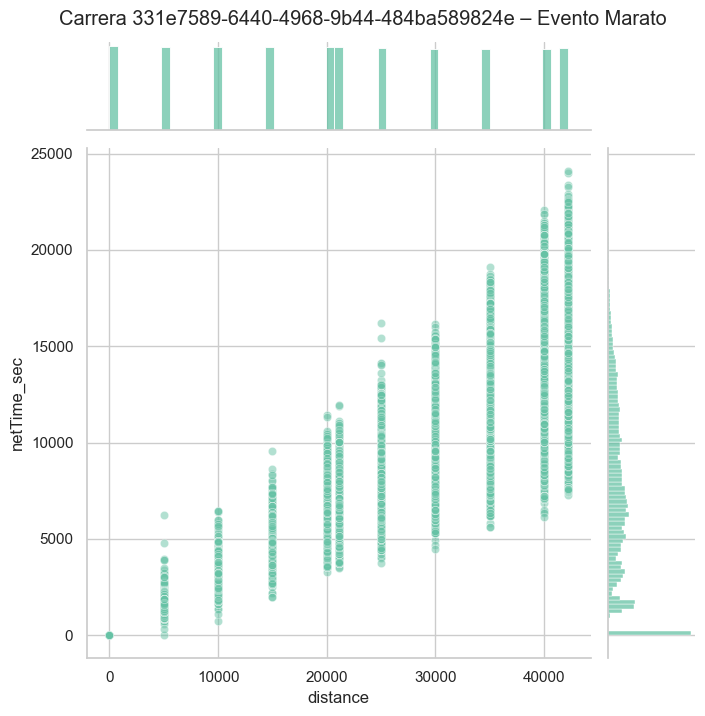


Evento: Marato
Total filas en el evento: 244111
Filas anómalas: 1112
Resumen de atletas anómalos (primeras 10 filas):


,athlete_id,split,avg_time,mediana_split,z_max,z_min,count
0,01eca658-9206-509d-b977-10aa8c33dcb9,40K,20002.414,13091.1340,3.015818,3.015818,1
1,11BY2756,15K,7040.686,4752.4950,3.100450,3.100450,1
2,12A1D3YZ,15K,7004.922,4752.4950,3.051990,3.051990,1
3,12A1D3YZ,20K,9358.090,6338.9360,3.021706,3.021706,1
4,12A1D3YZ,25K,11883.865,7937.9185,3.068208,3.068208,1
5,12A1D3YZ,30K,14473.565,9612.8420,3.036418,3.036418,1
6,12A1D3YZ,Media,9978.346,6690.5875,3.090640,3.090640,1
7,12B92298,30K,14480.669,9612.8420,3.040856,3.040856,1
8,12B92298,35K,17498.938,11313.4670,3.205988,3.205988,1
9,12B92298,40K,20550.835,13091.1340,3.255127,3.255127,1


C:\Users\mario\AppData\Local\Temp\ipykernel_10780\3257255007.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_event, x='split', y='netTime_sec', palette='Set2')


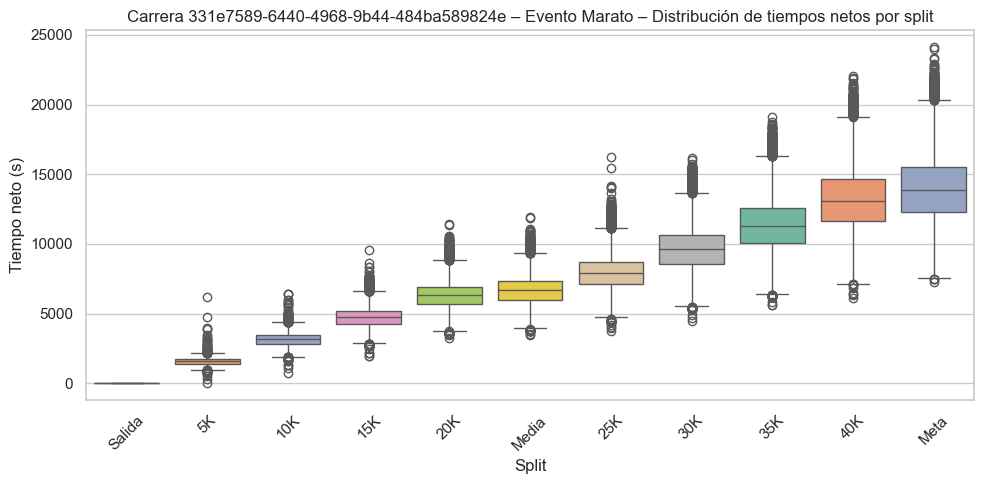

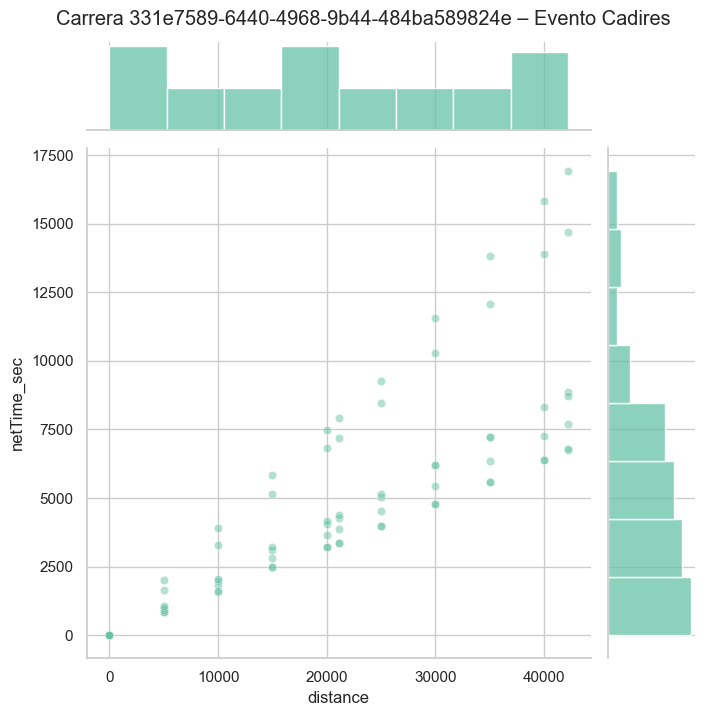


Evento: Cadires
Total filas en el evento: 76
Filas anómalas: 0
Resumen de atletas anómalos (primeras 10 filas):


,athlete_id,split,avg_time,mediana_split,z_max,z_min,count


C:\Users\mario\AppData\Local\Temp\ipykernel_10780\3257255007.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_event, x='split', y='netTime_sec', palette='Set2')


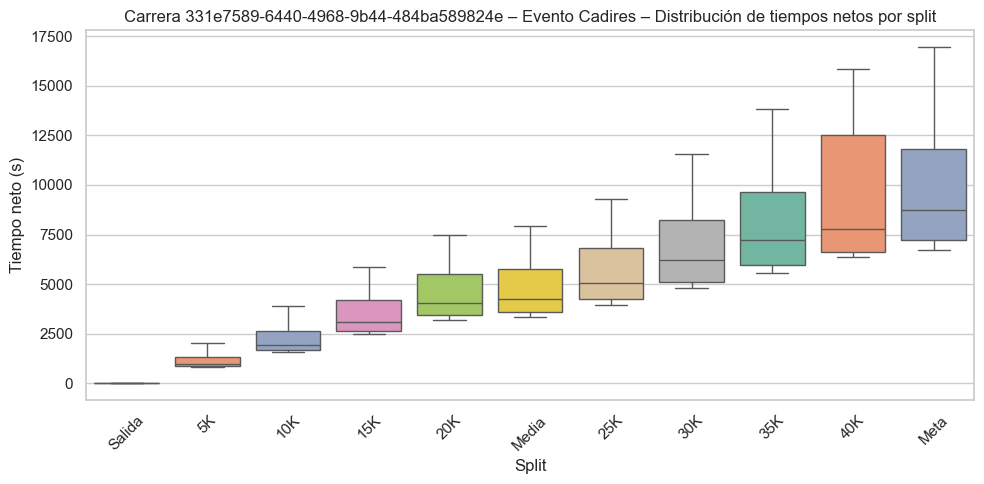

In [61]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Copiar dataframe y calcular netTime en segundos
df = athletes_time_df.copy()
df['netTime_sec'] = df['netTime_td'].dt.total_seconds()

# Iterar por cada carrera
for race in df['race_id'].unique():
    df_race = df[df['race_id'] == race]
    print(f"\n=== Carrera {race} ===")

    # Iterar por cada evento dentro de la carrera, ignorando eventos que contengan "General"
    for event in df_race['event_id'].unique():
        if "General" in event:
            continue  # saltar este evento

        df_event = df_race[df_race['event_id'] == event]

        # --- Gráfico de dispersión netTime vs distance ---
        sns.jointplot(
            data=df_event,
            x='distance', 
            y='netTime_sec', 
            kind='scatter', 
            alpha=0.5,
            height=7
        )
        plt.suptitle(f'Carrera {race} – Evento {event}', y=1.02)
        plt.show()

        # --- Estadísticas por split dentro del evento ---
        split_stats = df_event.groupby('split')['netTime_sec'].agg(['median', 'std']).rename(
            columns={'median': 'mediana_split', 'std': 'std_split'}
        )
        df_event = df_event.merge(split_stats, on='split', how='left')

        # --- Calcular z-score por split dentro del evento ---
        df_event['z_time'] = (df_event['netTime_sec'] - df_event['mediana_split']) / df_event['std_split']

        # --- Detectar anomalías ---
        anomalos = df_event[df_event['z_time'].abs() > 3]

        # --- Resumen de anomalías por atleta y split ---
        resumen_anomalos = (
            anomalos.groupby(['athlete_id', 'split'])
            .agg(
                avg_time=('netTime_sec', 'mean'),
                mediana_split=('mediana_split', 'mean'),
                z_max=('z_time', 'max'),
                z_min=('z_time', 'min'),
                count=('netTime_sec', 'count')
            )
            .reset_index()
        )

        print(f"\nEvento: {event}")
        print(f"Total filas en el evento: {len(df_event)}")
        print(f"Filas anómalas: {len(anomalos)}")
        print("Resumen de atletas anómalos (primeras 10 filas):")
        display(resumen_anomalos.head(10))

        # --- Boxplot por split ---
        plt.figure(figsize=(10,5))
        sns.boxplot(data=df_event, x='split', y='netTime_sec', palette='Set2')
        plt.title(f'Carrera {race} – Evento {event} – Distribución de tiempos netos por split')
        plt.xlabel('Split')
        plt.ylabel('Tiempo neto (s)')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

### Velocidad


--- Detección de anomalías en 1/average (m/s) por carrera y evento ---

=== Carrera 1a83229e-2547-42a3-b5b4-36c7425c4d8f ===

--- Evento Mitja ---
Total filas en evento: 162743
Filas anómalas: 1547
Ejemplos de anomalías (primeras 10 filas):


c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(


,athlete_id,split,speed_from_average,z_score_speed
1,31,5K,5.594093,4.356981
9,160,5K,4.860976,3.113950
10,160,10K,4.883766,3.028314
15,191,5K,5.618925,4.399085
16,191,10K,5.634438,4.326115
17,191,15K,5.532810,4.129108
18,191,20K,5.463585,3.980422
19,191,Meta,5.474652,3.977901
21,192,5K,5.476451,4.157515
22,192,10K,5.444251,3.997310



Porcentaje de anomalías de velocidad por split:
split
10K       1.2
15K       1.1
20K       1.1
5K        1.3
Meta      1.0
Salida    0.0
Name: outlier_speed_flag, dtype: float64


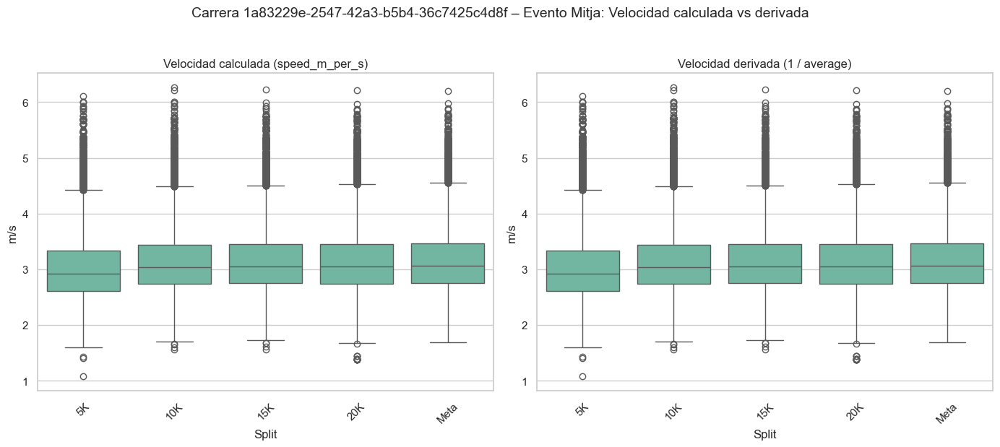

Correlación entre speed_m_per_s y 1/average: 1.000000
Diferencia media absoluta: 0.000000 m/s


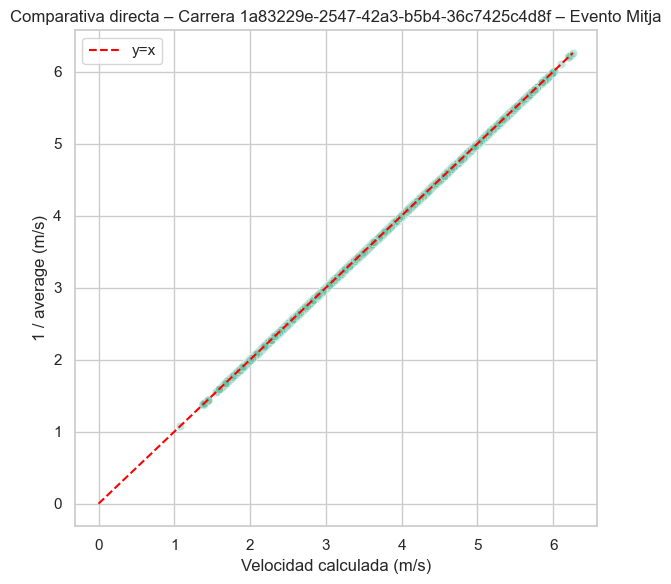


=== Carrera cf6f71f2-1235-45e3-802e-02833b71ae8b ===

--- Evento Stage 1 ---
Total filas en evento: 4000
Filas anómalas: 11
Ejemplos de anomalías (primeras 10 filas):


c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(


,athlete_id,split,speed_from_average,z_score_speed
168289,35b3cb57-c982-559f-9b1b-4411975ea175,CP1,5.550314,3.279005
168290,35b3cb57-c982-559f-9b1b-4411975ea175,EH1,5.912262,3.116279
168291,35b3cb57-c982-559f-9b1b-4411975ea175,CP2,6.400410,3.121874
168292,35b3cb57-c982-559f-9b1b-4411975ea175,CP3,6.849784,3.083277
168293,35b3cb57-c982-559f-9b1b-4411975ea175,EH2,7.221781,3.054259
168568,c690c665-7cf0-5934-86a1-c9703823df0b,CP1,5.660271,3.417445
170266,b09f286b-d893-5548-8bdc-64ba245e9604,CP1,5.565759,3.298452
170267,b09f286b-d893-5548-8bdc-64ba245e9604,EH1,6.142506,3.398082
170268,b09f286b-d893-5548-8bdc-64ba245e9604,CP2,6.398771,3.119915
170269,b09f286b-d893-5548-8bdc-64ba245e9604,CP3,6.852601,3.086469



Porcentaje de anomalías de velocidad por split:
split
CP1        0.7
CP2        0.4
CP3        0.5
CP4        0.0
EH1        0.5
EH2        0.4
Last km    0.0
Meta       0.0
Salida     0.0
Name: outlier_speed_flag, dtype: float64


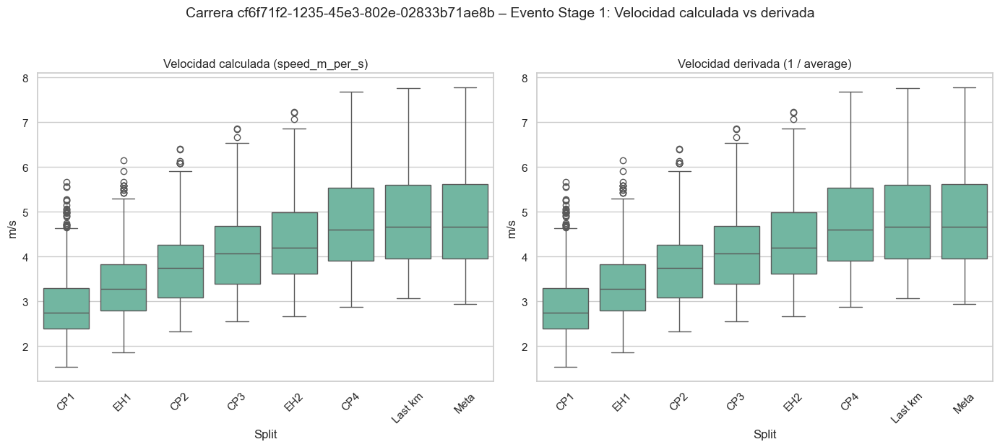

Correlación entre speed_m_per_s y 1/average: 1.000000
Diferencia media absoluta: 0.000000 m/s


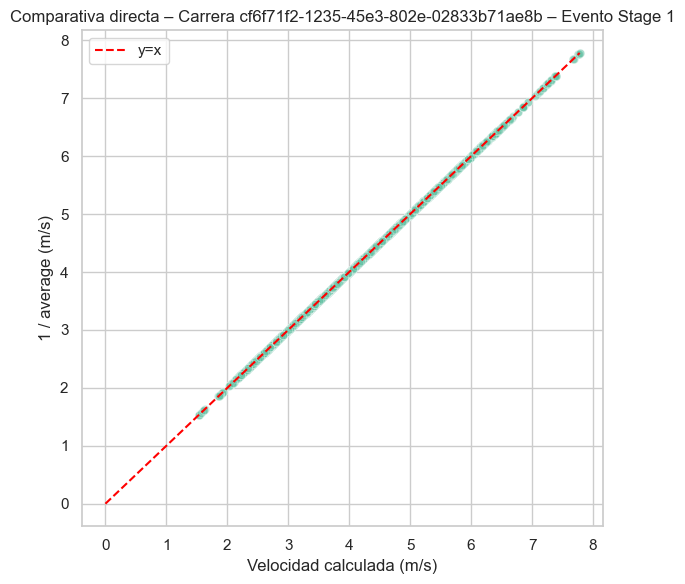


--- Evento Stage 2 ---
Total filas en evento: 1772
Filas anómalas: 0

Porcentaje de anomalías de velocidad por split:
split
EH1       0.0
EH2       0.0
Meta      0.0
Salida    0.0
Name: outlier_speed_flag, dtype: float64


c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(


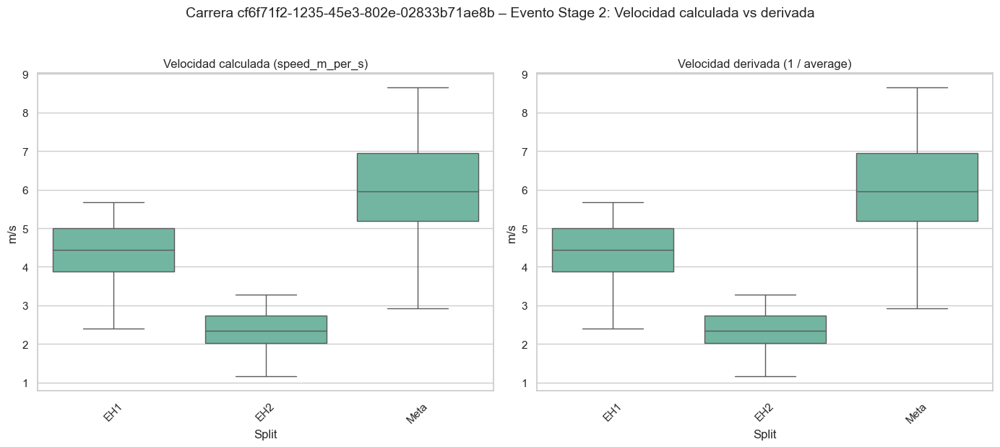

Correlación entre speed_m_per_s y 1/average: 1.000000
Diferencia media absoluta: 0.000000 m/s


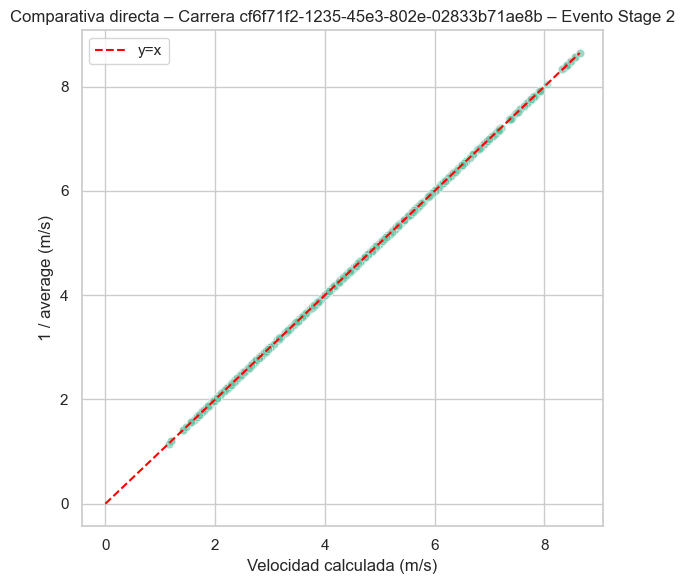


--- Evento Stage 3 ---
Total filas en evento: 4430
Filas anómalas: 0

Porcentaje de anomalías de velocidad por split:
split
CP1       0.0
CP2       0.0
CP3       0.0
CP4       0.0
EH1       0.0
EH2       0.0
EH3       0.0
Lastkm    0.0
Meta      0.0
Salida    0.0
Name: outlier_speed_flag, dtype: float64


c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(


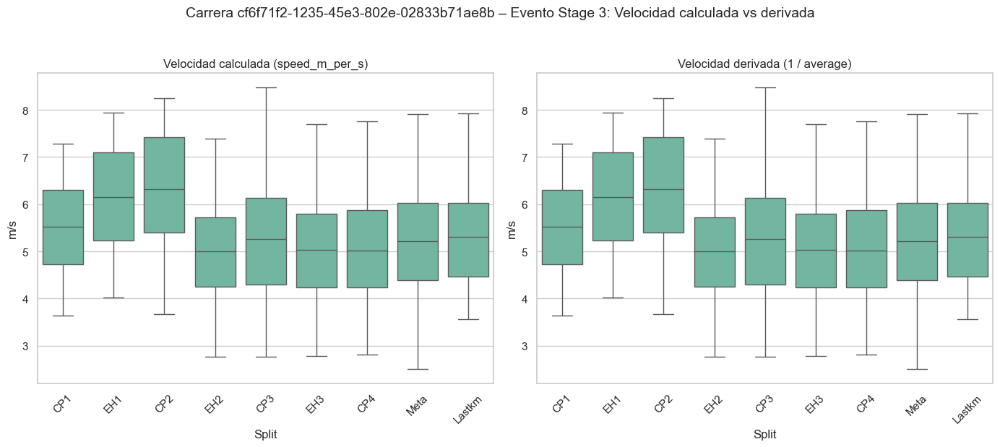

Correlación entre speed_m_per_s y 1/average: 1.000000
Diferencia media absoluta: 0.000000 m/s


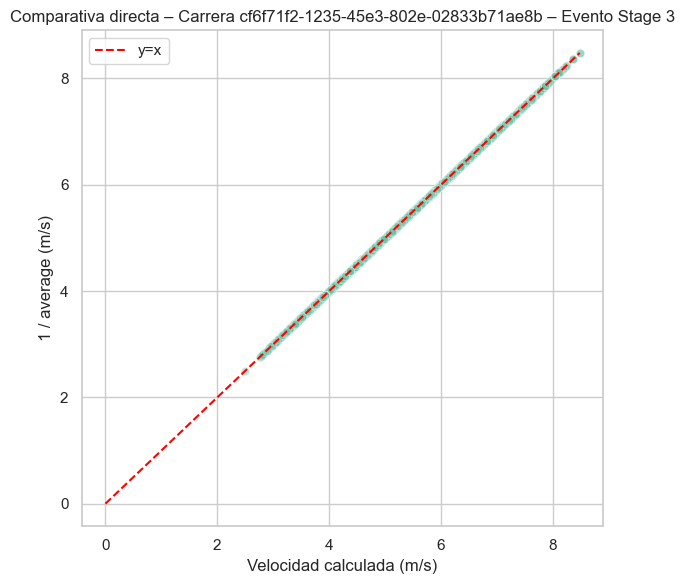


--- Evento Stage 4 ---
Total filas en evento: 3839
Filas anómalas: 2
Ejemplos de anomalías (primeras 10 filas):


c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(


,athlete_id,split,speed_from_average,z_score_speed
168181,108c6543-d171-5c31-b66f-b347efcd3e69,CP1,2.038445,-3.55029
169595,eec489f3-7754-5def-a90f-548a1badc060,CP1,2.047209,-3.54057



Porcentaje de anomalías de velocidad por split:
split
CP1       0.5
CP2       0.0
CP3       0.0
CP4       0.0
EH2       0.0
EH3       0.0
Lastkm    0.0
Meta      0.0
Salida    0.0
Name: outlier_speed_flag, dtype: float64


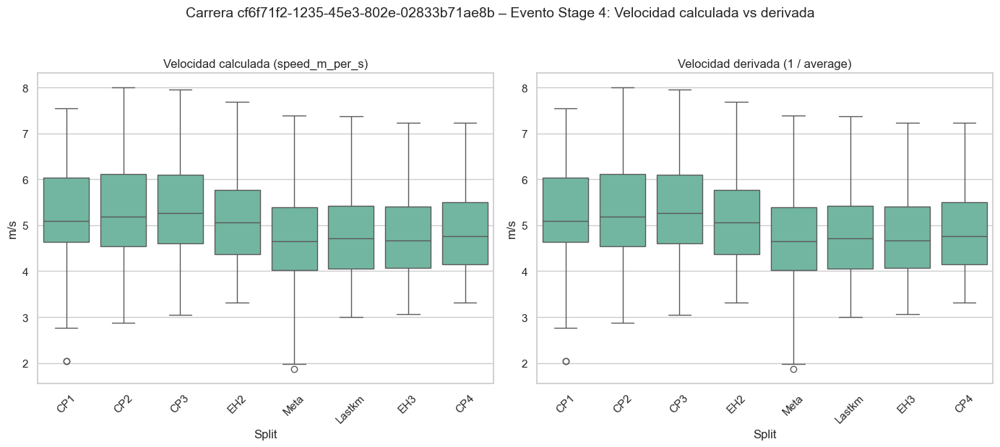

Correlación entre speed_m_per_s y 1/average: 1.000000
Diferencia media absoluta: 0.000000 m/s


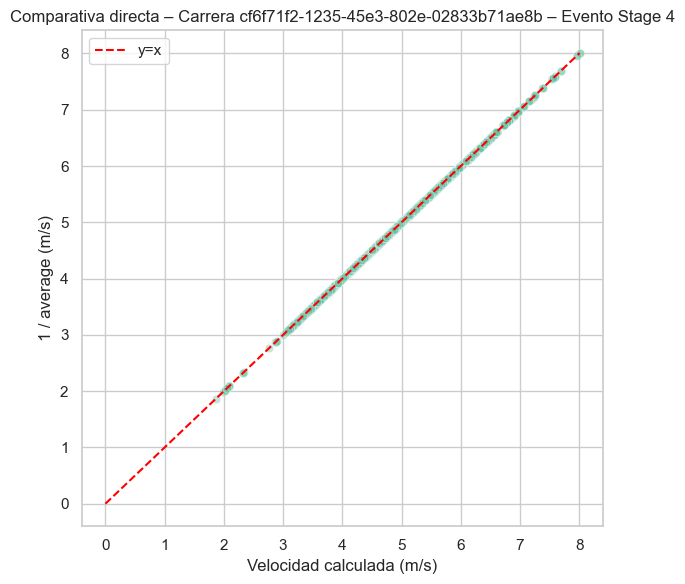


--- Evento Stage 5 ---
Total filas en evento: 4030
Filas anómalas: 0

Porcentaje de anomalías de velocidad por split:
split
CP1       0.0
CP2       0.0
CP3       0.0
CP4       0.0
EH1       0.0
EH2       0.0
EH3       0.0
Lastkm    0.0
Meta      0.0
Salida    0.0
Name: outlier_speed_flag, dtype: float64


c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(


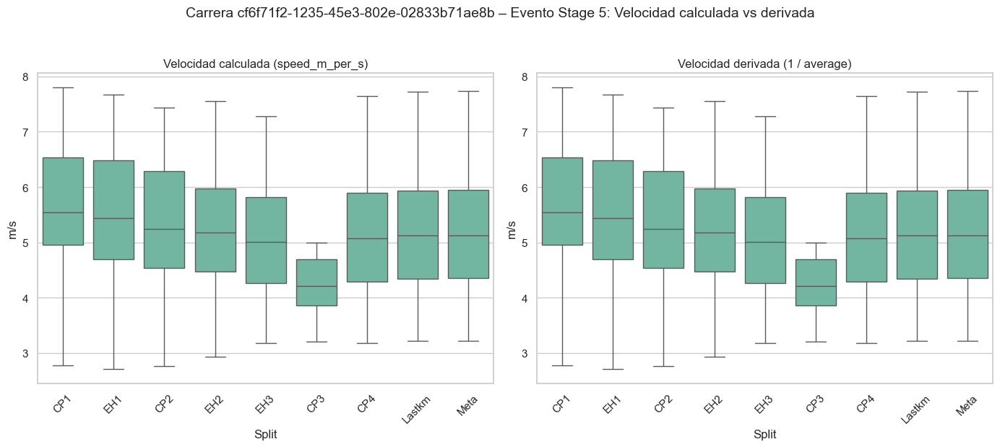

Correlación entre speed_m_per_s y 1/average: 1.000000
Diferencia media absoluta: 0.000000 m/s


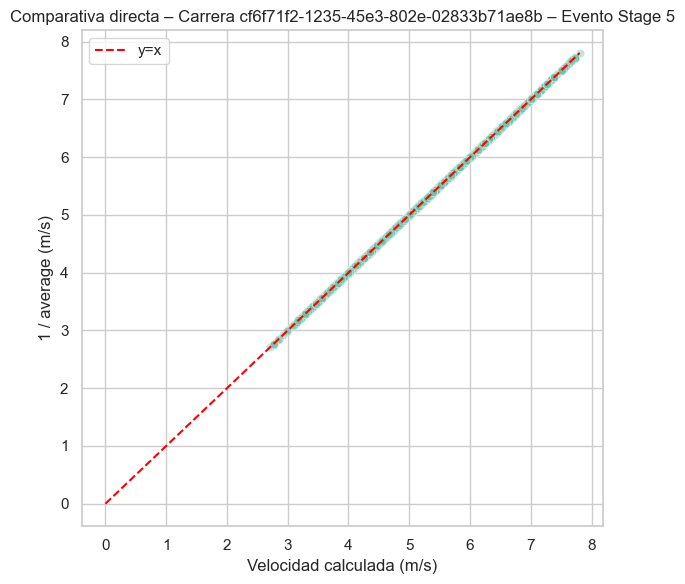


--- Evento Stage 6 ---
Total filas en evento: 3887
Filas anómalas: 0

Porcentaje de anomalías de velocidad por split:
split
CP1       0.0
CP2       0.0
CP3       0.0
CP4       0.0
EH1       0.0
EH2       0.0
Lastkm    0.0
Meta      0.0
Salida    0.0
Name: outlier_speed_flag, dtype: float64


c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(


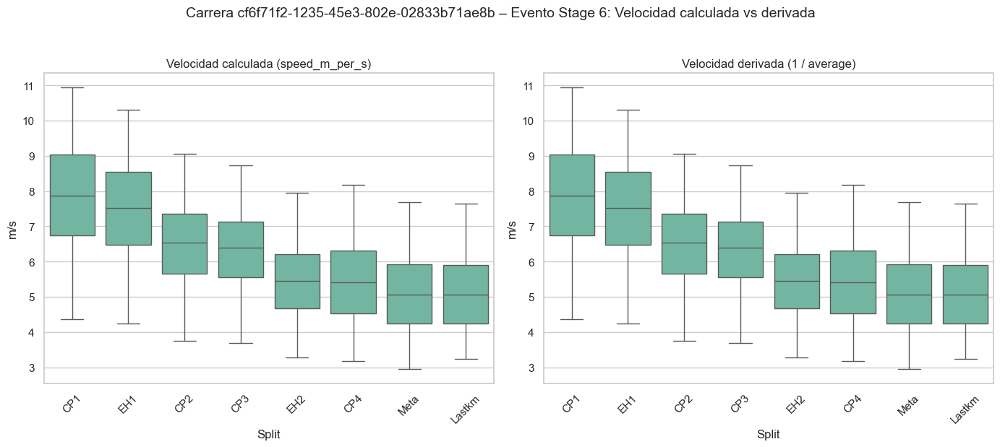

Correlación entre speed_m_per_s y 1/average: 1.000000
Diferencia media absoluta: 0.000000 m/s


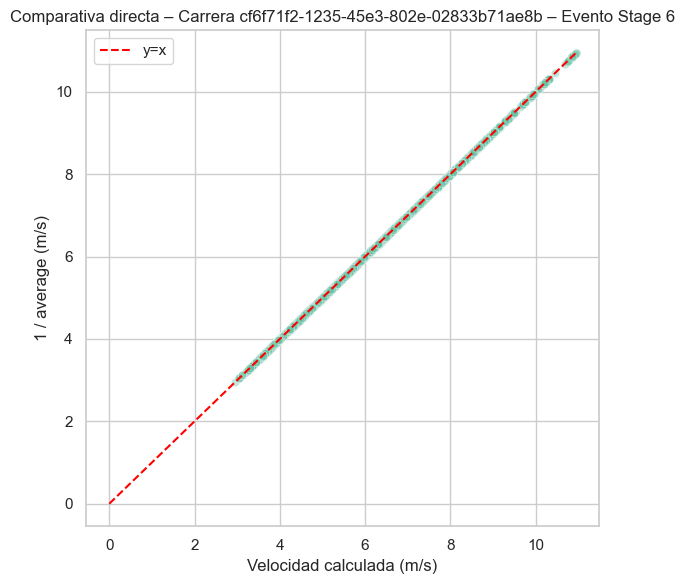


=== Carrera 331e7589-6440-4968-9b44-484ba589824e ===

--- Evento Marato ---
Total filas en evento: 244111
Filas anómalas: 1408
Ejemplos de anomalías (primeras 10 filas):


c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(


,athlete_id,split,speed_from_average,z_score_speed
187329,114500003,5K,4.902441,3.425001
187330,114500003,10K,4.906049,3.320389
187331,114500003,15K,4.907253,3.338089
187332,114500003,20K,4.914971,3.318218
187333,114500003,Media,4.915213,3.308576
187334,114500003,25K,4.916421,3.287942
187335,114500003,30K,4.913763,3.291220
187342,114500005,5K,4.712091,3.065231
187349,114500005,35K,4.749466,3.015434
187350,114500005,40K,4.756695,3.058564



Porcentaje de anomalías de velocidad por split:
split
10K       0.8
15K       0.7
20K       0.6
25K       0.6
30K       0.6
35K       0.6
40K       0.5
5K        0.9
Media     0.6
Meta      0.5
Salida    0.0
Name: outlier_speed_flag, dtype: float64


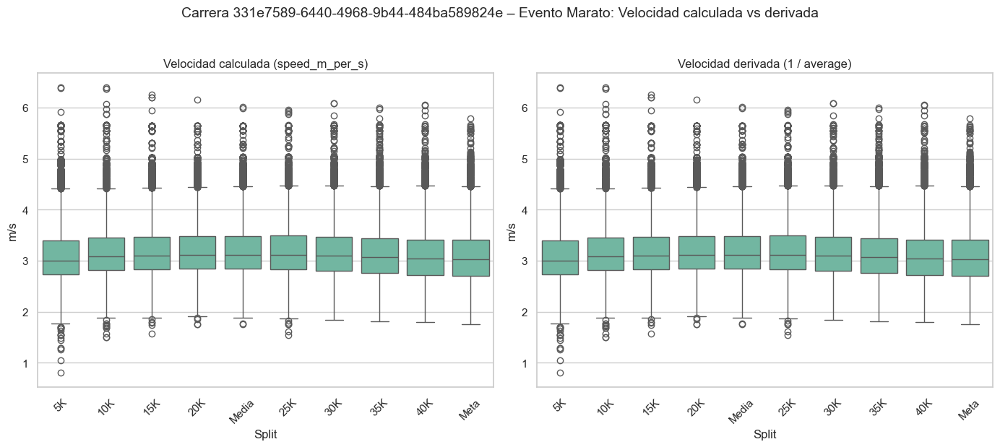

Correlación entre speed_m_per_s y 1/average: 1.000000
Diferencia media absoluta: 0.000000 m/s


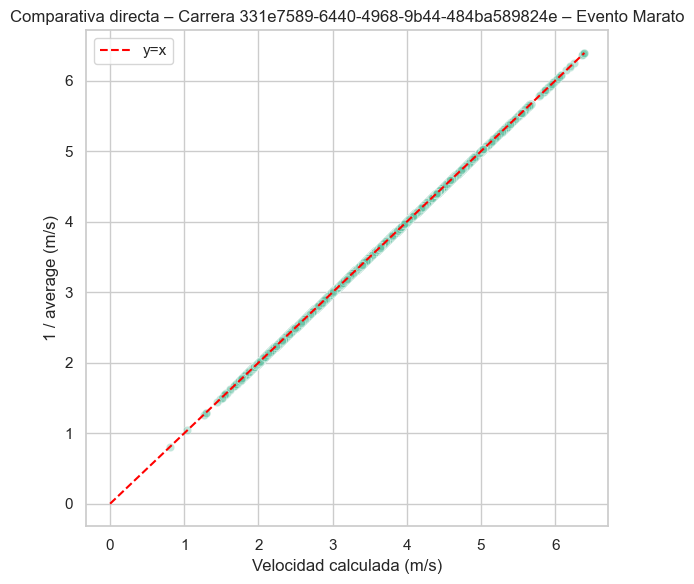


--- Evento Cadires ---
Total filas en evento: 76
Filas anómalas: 0

Porcentaje de anomalías de velocidad por split:
split
10K       0.0
15K       0.0
20K       0.0
25K       0.0
30K       0.0
35K       0.0
40K       0.0
5K        0.0
Media     0.0
Meta      0.0
Salida    0.0
Name: outlier_speed_flag, dtype: float64


c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(


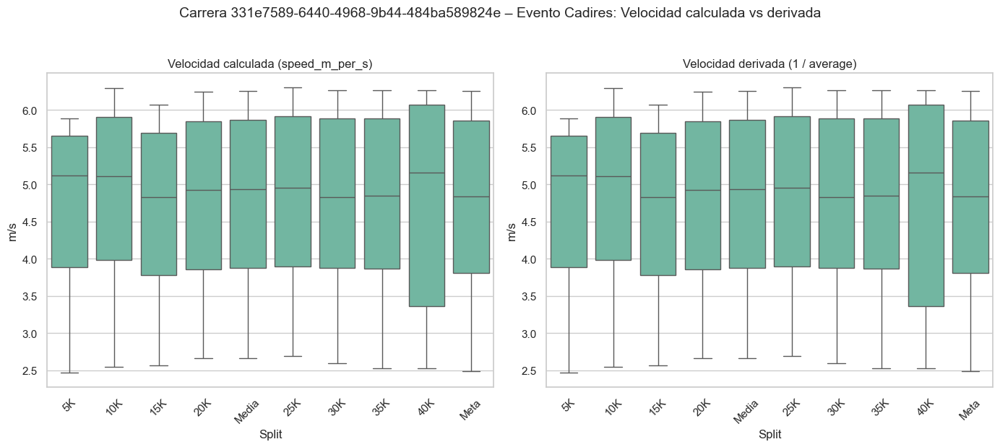

Correlación entre speed_m_per_s y 1/average: 1.000000
Diferencia media absoluta: 0.000000 m/s


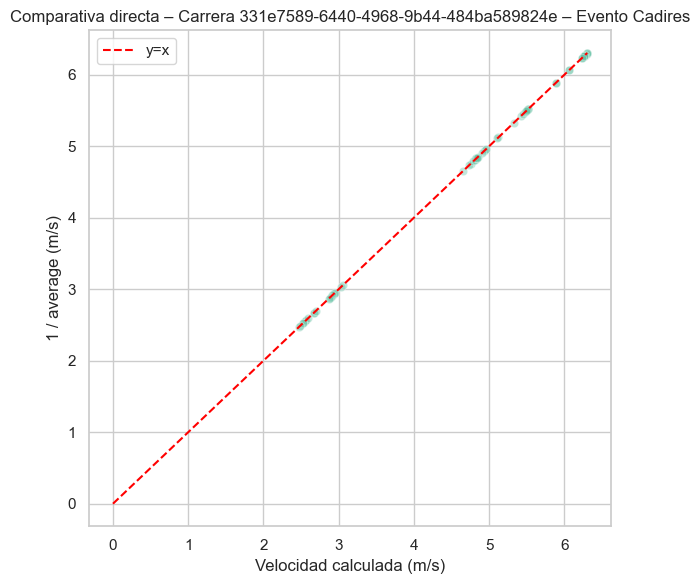

In [63]:
import pandas as pd
import numpy as np
from scipy.stats import zscore
import seaborn as sns
import matplotlib.pyplot as plt

print("\n--- Detección de anomalías en 1/average (m/s) por carrera y evento ---")

# Copiar dataframe y asegurarse de que existan las columnas de velocidad
df_times = athletes_time_df.copy()
if 'speed_m_per_s' not in df_times.columns:
    df_times['speed_m_per_s'] = np.where(df_times['average'] > 0, 1 / df_times['average'], np.nan)
df_times['speed_from_average'] = np.where(df_times['average'] > 0, 1 / df_times['average'], np.nan)

# Iterar por cada carrera
for race in df_times['race_id'].unique():
    df_race = df_times[df_times['race_id'] == race]
    print(f"\n=== Carrera {race} ===")

    # Iterar por cada evento dentro de la carrera
    for event in df_race['event_id'].unique():
        if "General" in event:
            continue  # Saltar eventos que contengan "General"

        df_event = df_race[df_race['event_id'] == event].copy()
        print(f"\n--- Evento {event} ---")

        # --- Z-score y detección de outliers por split ---
        df_event['z_score_speed'] = df_event.groupby('split')['speed_from_average'].transform(
            lambda x: zscore(x, nan_policy='omit')
        )
        df_event['outlier_z_speed'] = df_event['z_score_speed'].abs() > 3

        def outlier_iqr_speed(x):
            q1, q3 = np.nanpercentile(x, [25, 75])
            iqr = q3 - q1
            lower, upper = q1 - 1.5 * iqr, q3 + 1.5 * iqr
            return (x < lower) | (x > upper)

        df_event['outlier_iqr_speed'] = df_event.groupby('split')['speed_from_average'].transform(outlier_iqr_speed)
        df_event['outlier_speed_flag'] = df_event['outlier_z_speed'] & df_event['outlier_iqr_speed']

        # --- Filas anómalas ---
        df_speed_anomalies = df_event[df_event['outlier_speed_flag']].copy()

        # --- Resultados ---
        print(f"Total filas en evento: {len(df_event)}")
        print(f"Filas anómalas: {len(df_speed_anomalies)}")
        if not df_speed_anomalies.empty:
            print("Ejemplos de anomalías (primeras 10 filas):")
            display(df_speed_anomalies[['athlete_id', 'split', 'speed_from_average', 'z_score_speed']].head(10))

        # --- Porcentaje de anomalías por split ---
        summary_speed = (
            df_event.groupby('split')['outlier_speed_flag']
            .mean()
            .round(3) * 100
        )
        print("\nPorcentaje de anomalías de velocidad por split:")
        print(summary_speed)

        # --- Comparativa gráfica ---
        df_comp = df_event.dropna(subset=['speed_m_per_s', 'speed_from_average']).copy()

        fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharex=True)
        sns.boxplot(data=df_comp, x='split', y='speed_m_per_s', ax=axes[0])
        axes[0].set_title("Velocidad calculada (speed_m_per_s)")
        axes[0].set_xlabel("Split")
        axes[0].set_ylabel("m/s")
        axes[0].tick_params(axis='x', rotation=45)

        sns.boxplot(data=df_comp, x='split', y='speed_from_average', ax=axes[1])
        axes[1].set_title("Velocidad derivada (1 / average)")
        axes[1].set_xlabel("Split")
        axes[1].set_ylabel("m/s")
        axes[1].tick_params(axis='x', rotation=45)

        plt.suptitle(f"Carrera {race} – Evento {event}: Velocidad calculada vs derivada", fontsize=14, y=1.03)
        plt.tight_layout()
        plt.show()

        # --- Comparativa directa scatter ---
        corr = df_comp[['speed_m_per_s', 'speed_from_average']].corr().iloc[0, 1]
        diff = (df_comp['speed_m_per_s'] - df_comp['speed_from_average']).abs().mean()

        print(f"Correlación entre speed_m_per_s y 1/average: {corr:.6f}")
        print(f"Diferencia media absoluta: {diff:.6f} m/s")

        plt.figure(figsize=(6,6))
        sns.scatterplot(
            data=df_comp, 
            x='speed_m_per_s', 
            y='speed_from_average', 
            alpha=0.4
        )
        max_val = df_comp[['speed_m_per_s','speed_from_average']].max().max()
        plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', label='y=x')
        plt.title(f"Comparativa directa – Carrera {race} – Evento {event}")
        plt.xlabel("Velocidad calculada (m/s)")
        plt.ylabel("1 / average (m/s)")
        plt.legend()
        plt.tight_layout()
        plt.show()

Podemos ver que la velocidad se mantiene algo constante, no baja tanto como subia el tiempo, y suele estar sobre los 3 o 4 metros por segundo. Tambien vemos atletas con un tiempo alto desporporcionado que podrian estar ligados a errores de cálculo o de obtencion. 

c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(


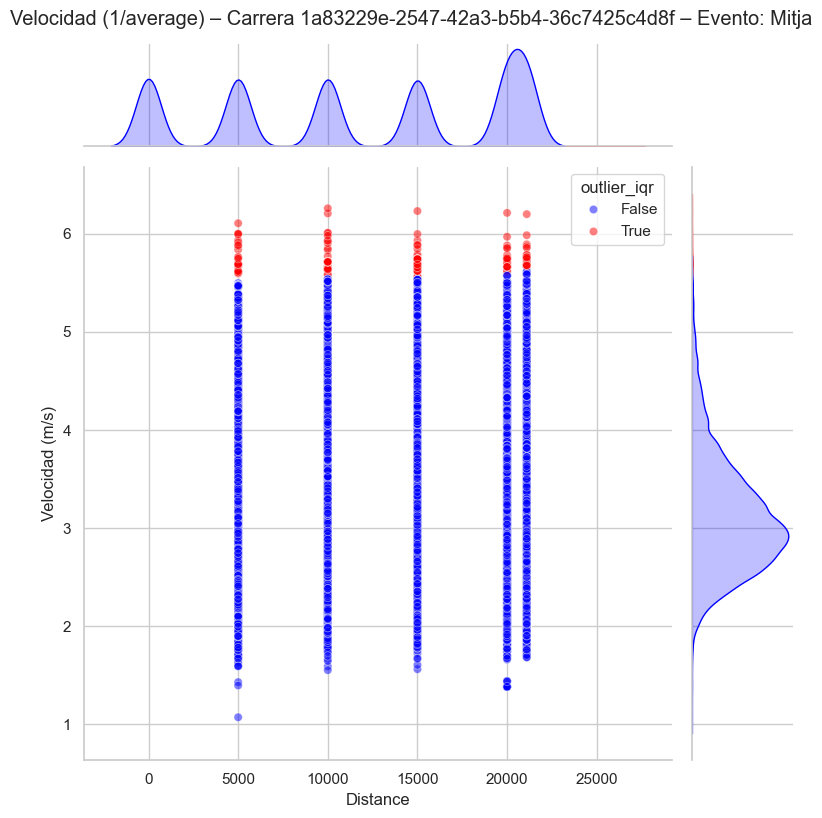


Carrera 1a83229e-2547-42a3-b5b4-36c7425c4d8f – Evento Mitja
Total filas en evento: 162743
Filas anomalas (IQR): 161


,athlete_id,split,speed_from_average
1,31,5K,5.594093
15,191,5K,5.618925
16,191,10K,5.634438
2667,CD12D9ZZ,5K,5.998800
2668,CD12D9ZZ,10K,6.008171
2669,CD12D9ZZ,15K,5.930846
2670,CD12D9ZZ,20K,5.880278
2671,CD12D9ZZ,Meta,5.892405
4410,96CB3A7A,5K,5.619872
4411,96CB3A7A,10K,5.631265


c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(


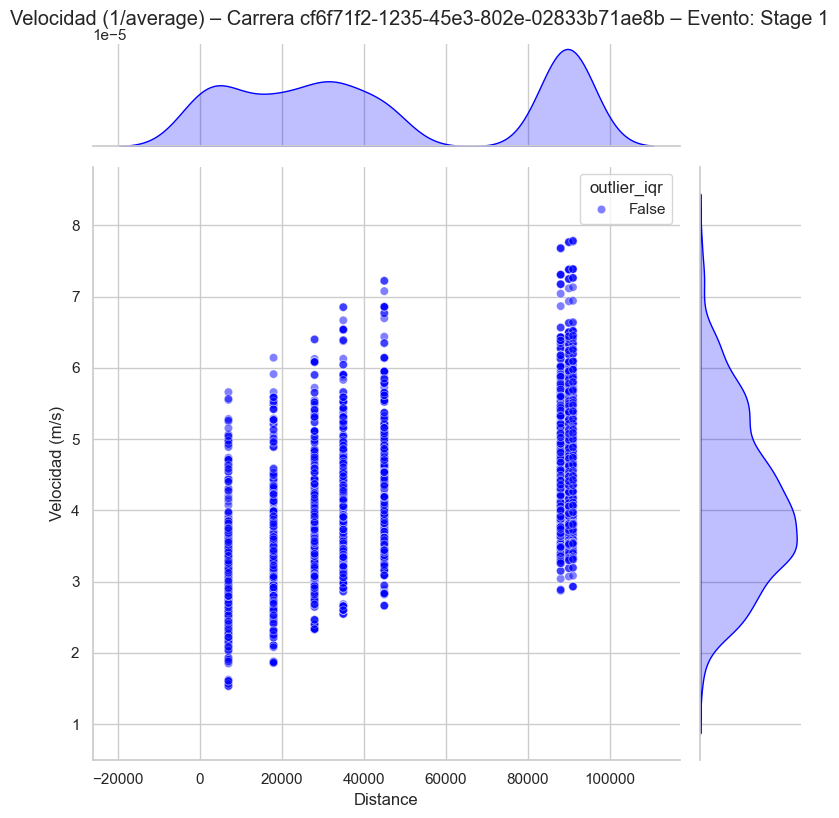


Carrera cf6f71f2-1235-45e3-802e-02833b71ae8b – Evento Stage 1
Total filas en evento: 4000
Filas anomalas (IQR): 0


c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(


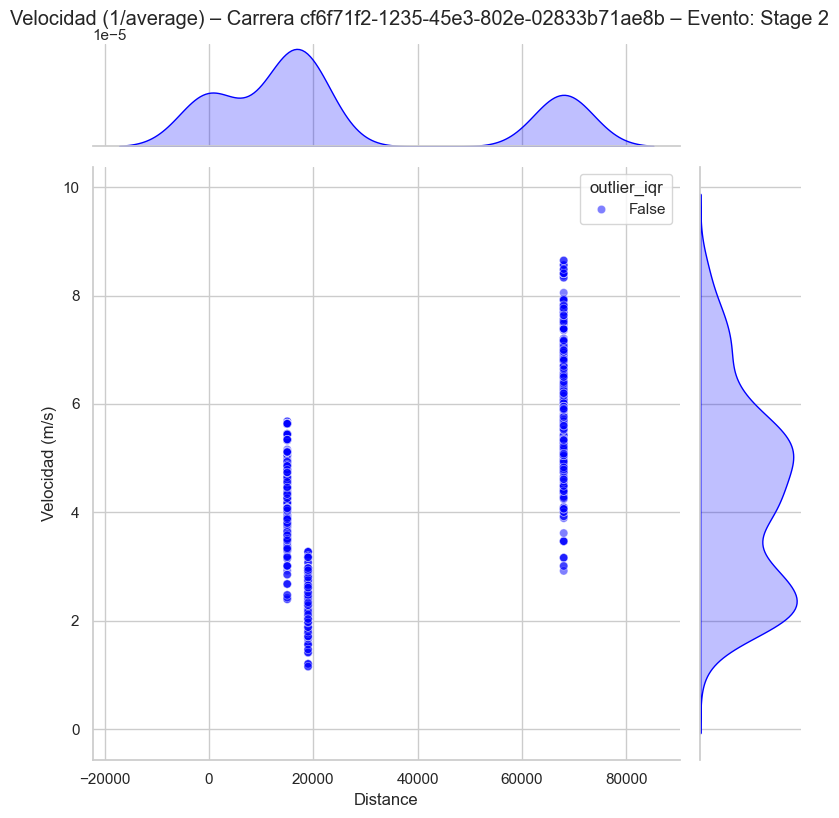


Carrera cf6f71f2-1235-45e3-802e-02833b71ae8b – Evento Stage 2
Total filas en evento: 1772
Filas anomalas (IQR): 0


c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(


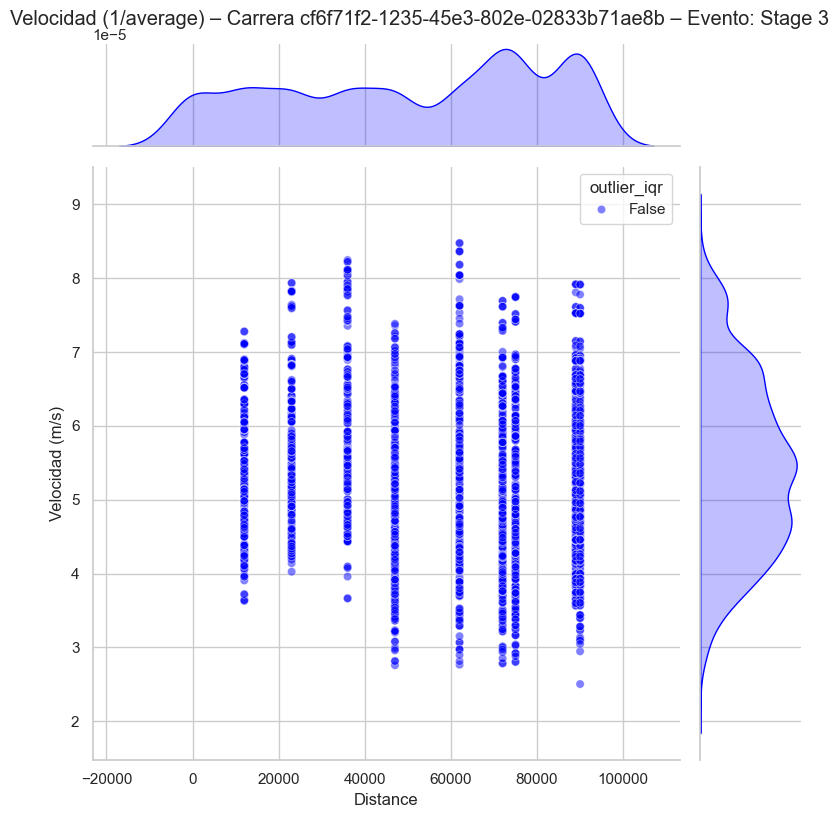


Carrera cf6f71f2-1235-45e3-802e-02833b71ae8b – Evento Stage 3
Total filas en evento: 4430
Filas anomalas (IQR): 0


c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(


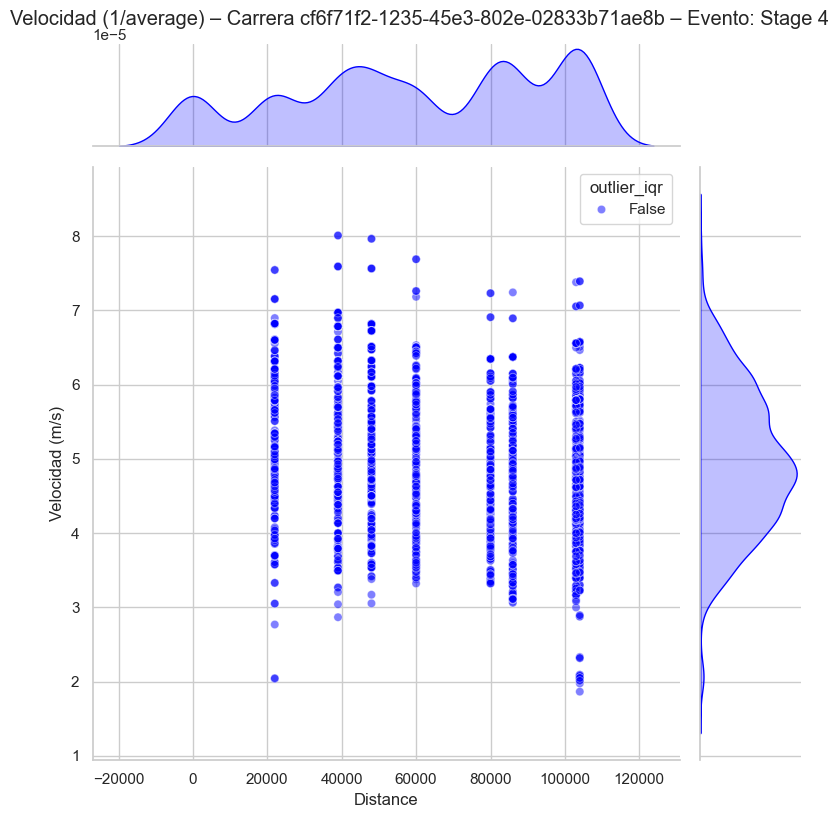


Carrera cf6f71f2-1235-45e3-802e-02833b71ae8b – Evento Stage 4
Total filas en evento: 3839
Filas anomalas (IQR): 0


c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(


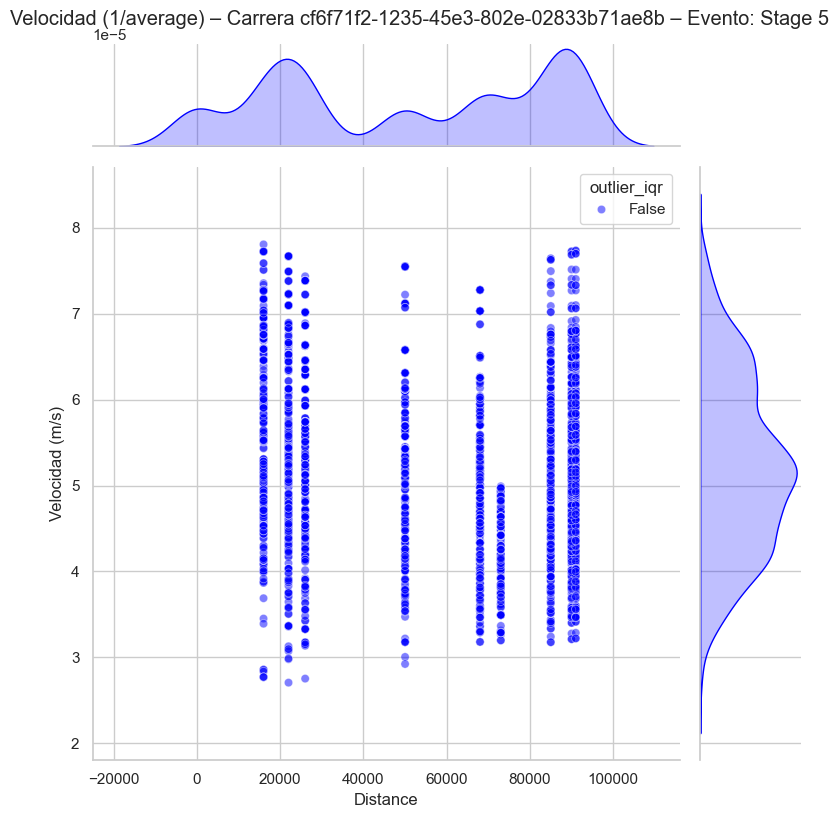


Carrera cf6f71f2-1235-45e3-802e-02833b71ae8b – Evento Stage 5
Total filas en evento: 4030
Filas anomalas (IQR): 0


c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(


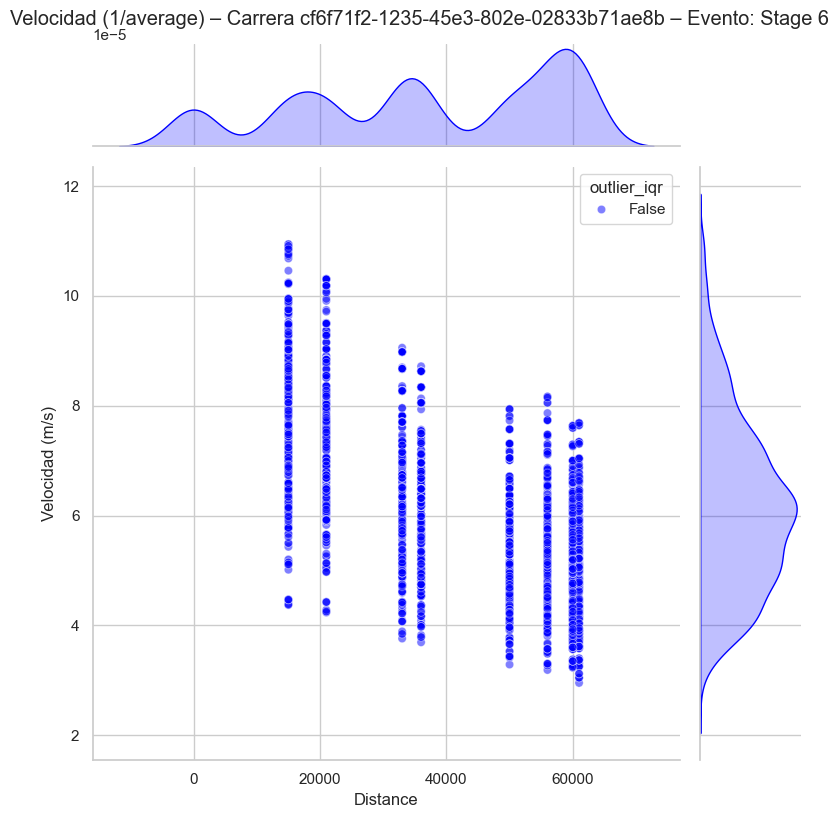


Carrera cf6f71f2-1235-45e3-802e-02833b71ae8b – Evento Stage 6
Total filas en evento: 3887
Filas anomalas (IQR): 0


c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(


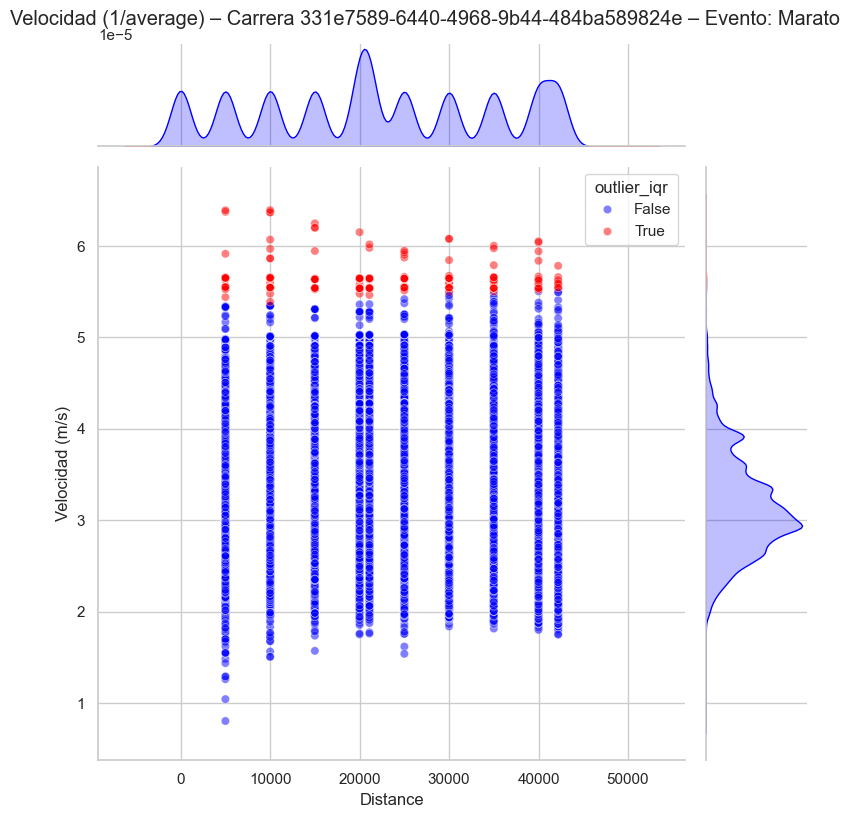


Carrera 331e7589-6440-4968-9b44-484ba589824e – Evento Marato
Total filas en evento: 244111
Filas anomalas (IQR): 231


,athlete_id,split,speed_from_average
193828,D48B9B97,35K,6.003842
193829,D48B9B97,40K,5.839416
193830,D48B9B97,Meta,5.784025
196744,63ef4533-5906-55a5-b977-435d194aaac1,5K,5.654509
196745,63ef4533-5906-55a5-b977-435d194aaac1,10K,5.656749
196746,63ef4533-5906-55a5-b977-435d194aaac1,15K,5.638250
196747,63ef4533-5906-55a5-b977-435d194aaac1,20K,5.645252
196748,63ef4533-5906-55a5-b977-435d194aaac1,Media,5.645890
196749,63ef4533-5906-55a5-b977-435d194aaac1,25K,5.645890
196750,63ef4533-5906-55a5-b977-435d194aaac1,30K,5.599104


c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(


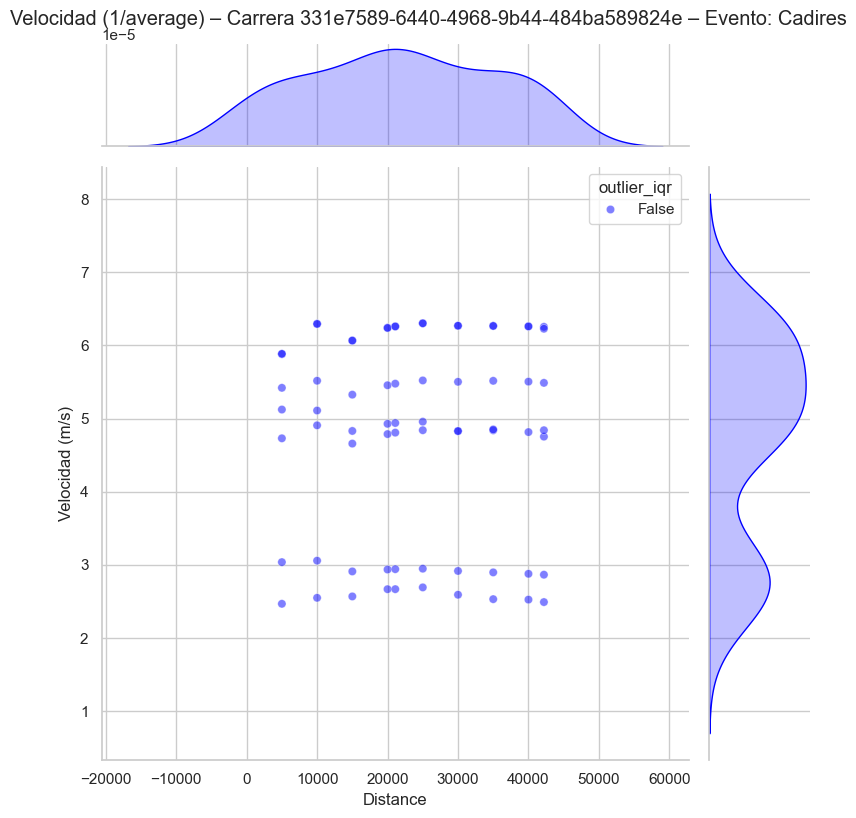


Carrera 331e7589-6440-4968-9b44-484ba589824e – Evento Cadires
Total filas en evento: 76
Filas anomalas (IQR): 0


In [68]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Copiar dataframe
df = athletes_time_df.copy()

# Calcular velocidad como 1 / average
df['speed_from_average'] = np.where(df['average'] > 0, 1 / df['average'], np.nan)

# Función para detectar outliers por IQR
def outlier_iqr_speed(x):
    q1, q3 = np.nanpercentile(x, [25, 75])
    iqr = q3 - q1
    lower, upper = q1 - 3 * iqr, q3 + 3 * iqr
    return (x < lower) | (x > upper)

# Iterar por cada carrera
for race in df['race_id'].unique():
    df_race = df[df['race_id'] == race].copy()
    
    # Iterar por cada evento
    for event in df_race['event_id'].unique():
        if "General" in event:
            continue  # saltar eventos con "General"
        
        df_event = df_race[df_race['event_id'] == event].copy()
        
        # Detectar outliers por IQR dentro del evento
        df_event['outlier_iqr'] = df_event.groupby('split')['speed_from_average'].transform(outlier_iqr_speed)
        
        # --- Jointplot ---
        g = sns.jointplot(
            data=df_event,
            x='distance',
            y='speed_from_average',
            hue='outlier_iqr',
            palette={True:'red', False:'blue'},
            alpha=0.5,
            height=8
        )
        g.fig.suptitle(f"Velocidad (1/average) – Carrera {race} – Evento: {event}", y=1.02)
        g.set_axis_labels("Distance", "Velocidad (m/s)")
        plt.show()
        
        # --- Mostrar resumen de anomalías ---
        anomalos = df_event[df_event['outlier_iqr']].copy()
        print(f"\nCarrera {race} – Evento {event}")
        print(f"Total filas en evento: {len(df_event)}")
        print(f"Filas anomalas (IQR): {len(anomalos)}")
        if len(anomalos) > 0:
            display(anomalos[['athlete_id','split','speed_from_average']].head(10))

In [67]:
import pandas as pd

def analyze_raw_quality(df: pd.DataFrame):
    """
    Analiza la calidad de los datos en función de los flags:
    - raw_manual
    - raw_valid
    - incidence
    Muestra conteos y porcentajes de True por split/event/race.
    """

    # Verificamos las columnas relevantes
    quality_cols = [col for col in ['raw_manual', 'raw_valid', 'incidence'] if col in df.columns]
    if not quality_cols:
        print("No se encontraron columnas de calidad ('raw_manual', 'raw_valid', 'incidence').")
        return

    # Convertir a booleanas si no lo son
    for col in quality_cols:
        df[col] = df[col].astype('bool', errors='ignore')

    # Agrupamos por carrera, evento y split
    summary = (
        df.groupby(['race_id', 'event_id', 'split'])
        .agg(
            total_registros=('athlete_id', 'count'),
            **{f"{col}_true": (col, lambda x: x.fillna(False).sum()) for col in quality_cols}
        )
        .reset_index()
    )

    # Porcentajes
    for col in quality_cols:
        summary[f"pct_{col}_true"] = summary[f"{col}_true"] / summary['total_registros'] * 100

    # Totales generales
    total_registros = len(df)
    print(f"=== Total registros analizados: {total_registros} ===")
    for col in quality_cols:
        total_true = df[col].fillna(False).sum()
        pct = total_true / total_registros * 100
        print(f"{col}: {total_true} ({pct:.2f}%) filas con True")

    # Mostrar las primeras filas del resumen
    print("\n=== Resumen por race/event/split ===")
    cols_to_show = ['race_id', 'event_id', 'split'] + [f"pct_{col}_true" for col in quality_cols]
    print(summary[cols_to_show].head(10))

    return summary

# Ejecutar análisis
analyze_raw_quality(athletes_time_df)

=== Total registros analizados: 162743 ===
raw_manual: 162638 (99.94%) filas con True
raw_valid: 162743 (100.00%) filas con True
incidence: 162743 (100.00%) filas con True

=== Resumen por race/event/split ===
                                race_id event_id   split  pct_raw_manual_true  \
0  1a83229e-2547-42a3-b5b4-36c7425c4d8f    Mitja     10K            99.974288   
1  1a83229e-2547-42a3-b5b4-36c7425c4d8f    Mitja     15K            99.966445   
2  1a83229e-2547-42a3-b5b4-36c7425c4d8f    Mitja     20K            99.966480   
3  1a83229e-2547-42a3-b5b4-36c7425c4d8f    Mitja      5K            99.985307   
4  1a83229e-2547-42a3-b5b4-36c7425c4d8f    Mitja    Meta            99.878498   
5  1a83229e-2547-42a3-b5b4-36c7425c4d8f    Mitja  Salida            99.843420   

   pct_raw_valid_true  pct_incidence_true  
0               100.0               100.0  
1               100.0               100.0  
2               100.0               100.0  
3               100.0               100.0  
4 

,race_id,event_id,split,total_registros,raw_manual_true,raw_valid_true,incidence_true,pct_raw_manual_true,pct_raw_valid_true,pct_incidence_true
0,1a83229e-2547-42a3-b5b4-36c7425c4d8f,Mitja,10K,27225,27218,27225,27225,99.974288,100.0,100.0
1,1a83229e-2547-42a3-b5b4-36c7425c4d8f,Mitja,15K,26822,26813,26822,26822,99.966445,100.0,100.0
2,1a83229e-2547-42a3-b5b4-36c7425c4d8f,Mitja,20K,26850,26841,26850,26850,99.966480,100.0,100.0
3,1a83229e-2547-42a3-b5b4-36c7425c4d8f,Mitja,5K,27224,27220,27224,27224,99.985307,100.0,100.0
4,1a83229e-2547-42a3-b5b4-36c7425c4d8f,Mitja,Meta,27160,27127,27160,27160,99.878498,100.0,100.0
5,1a83229e-2547-42a3-b5b4-36c7425c4d8f,Mitja,Salida,27462,27419,27462,27462,99.843420,100.0,100.0


El análisis de calidad de los registros muestra que prácticamente todos los registros cuentan con un backup presente (100%), lo que indica que el sistema genera copias de seguridad de manera consistente para cada punto de control. Sin embargo, solo un número muy reducido de estos backups ha sido realmente utilizado para reemplazar tiempos faltantes o corregidos (92 de 162743), lo que evidencia que la mayoría de los registros originales fueron válidos y no requirieron intervención. Por otro lado, casi todos los registros se marcaron como manuales (≈99,8%), mientras que no se detectaron registros inválidos (CONSULTAR). En resumen, el sistema dispone de abundantes recursos de respaldo, aunque su uso real es mínimo, y los datos originales presentan una calidad elevada, con muy pocas correcciones necesarias.

In [70]:
import pandas as pd

def summarize_incidence(df: pd.DataFrame):
    # Trabajar sobre copia para no modificar df original
    df = df.copy()
    
    # Crear columnas binarias según las condiciones
    df['incidencia_fila'] = df['incidence'].notna().astype(int)  
    df['backup_usado_fila'] = (df['isBackup'] == True).astype(int)
    df['manual_fila'] = (df['raw_manual'] == True).astype(int)
    df['backup_resuelve_incidencia'] = ((df['isBackup'] == True) & df['incidence'].notna()).astype(int)
    
    # Resumen agregando por carrera, evento y split
    summary = (
        df.groupby(['race_id', 'event_id', 'split'])
        .agg(
            total_filas=('athlete_id', 'count'),  
            filas_con_incidencia=('incidencia_fila', 'sum'),
            total_backups_usados=('backup_usado_fila', 'sum'),
            total_manuales=('manual_fila', 'sum'),
            total_backups_resuelven=('backup_resuelve_incidencia', 'sum')
        )
        .reset_index()
    )
    
    # Calcular porcentajes
    summary['pct_incidencias'] = summary['filas_con_incidencia'] / summary['total_filas'] * 100
    summary['pct_backups_usados'] = summary['total_backups_usados'] / summary['total_filas'] * 100
    summary['pct_manuales'] = summary['total_manuales'] / summary['total_filas'] * 100
    summary['pct_backups_resuelven'] = summary['total_backups_resuelven'] / summary['total_filas'] * 100
    
    # Mostrar un resumen inicial
    print("Resumen de incidencias por split/event/race (primeras 10 filas):")
    print(summary)
    
    return summary

# Aplicar función a todo el dataset
incidence_summary = summarize_incidence(athletes_time_df)



Resumen de incidencias por split/event/race (primeras 10 filas):
                                 race_id         event_id    split  \
0   1a83229e-2547-42a3-b5b4-36c7425c4d8f            Mitja      10K   
1   1a83229e-2547-42a3-b5b4-36c7425c4d8f            Mitja      15K   
2   1a83229e-2547-42a3-b5b4-36c7425c4d8f            Mitja      20K   
3   1a83229e-2547-42a3-b5b4-36c7425c4d8f            Mitja       5K   
4   1a83229e-2547-42a3-b5b4-36c7425c4d8f            Mitja     Meta   
5   1a83229e-2547-42a3-b5b4-36c7425c4d8f            Mitja   Salida   
6   331e7589-6440-4968-9b44-484ba589824e          Cadires      10K   
7   331e7589-6440-4968-9b44-484ba589824e          Cadires      15K   
8   331e7589-6440-4968-9b44-484ba589824e          Cadires      20K   
9   331e7589-6440-4968-9b44-484ba589824e          Cadires      25K   
10  331e7589-6440-4968-9b44-484ba589824e          Cadires      30K   
11  331e7589-6440-4968-9b44-484ba589824e          Cadires      35K   
12  331e7589-6440-4968-9b

## como hago para comparar la normalidad intra atleta y inter atleta

Total registros: 162743: cantidad de filas analizadas en todos los atletas y splits.

Registros anómalos detectados: 6258: tiempos que se consideran significativamente distintos de la combinación de histórico propio y distribución global.

Atletas con <3 registros totales: 473: atletas con historial muy limitado. Su detección de anomalías es menos confiable, pero se incluyen gracias a la ponderación con la distribución global.

En la tabla de anomalías se observan:

Atletas con un Z-score combinado muy alto, lo que indica un rendimiento atípico respecto a su historial y al promedio global del split.

La columna low_history permite identificar atletas con pocos registros históricos.

La columna reason explica por qué se considera el registro como anómalo (“Z-score combinado alto”).

Esta estrategia permite:

Detectar anomalías incluso en atletas con historial limitado.

Combinar información individual y colectiva para mejorar la sensibilidad de la detección.

Tener un criterio objetivo y reproducible basado en estadística, sin depender de reglas arbitrarias.

## Nivel issues 

Para los issues vamos a hacer transformaciones necesarias a los datos, pasando por crear columnas nuevas para identificar cuando ha sido el issue. Para ello pondremos el límite en 3 horas para la media maratón. 

In [ ]:
import pandas as pd
import numpy as np

# --- Copiar dataframes ---
df = athletes_time_df.copy()      # split/raw times por atleta
events = athletes_events_df.copy()  # gunTime por atleta
issues = issues_df.copy()         # incidencias

# --- Normalizar a tz-naive ---
df['rawTime'] = pd.to_datetime(df['rawTime'], errors='coerce').dt.tz_localize(None)
events['gunTime'] = pd.to_datetime(events['gunTime'], errors='coerce').dt.tz_localize(None)
issues['time'] = pd.to_datetime(issues['time'], errors='coerce').dt.tz_localize(None)

# --- Calcular hora de inicio por carrera y evento ---
race_event_start = (
    events.groupby(['race_id','event_id'])['gunTime']
    .min()
    .rename('official_start')
    .reset_index()
)

# --- Calcular hora de fin por carrera y evento ---
# 1️⃣ Filtrar split Meta
meta_split = df[df['split'] == 'Meta'].copy()

# 2️⃣ Unir gunTime desde events
meta_split = meta_split.merge(
    events[['race_id','event_id','athlete_id','gunTime']],
    on=['race_id','event_id','athlete_id'],
    how='left'
)

# 3️⃣ Tiempo transcurrido hasta Meta
meta_split['time_to_meta'] = (meta_split['rawTime'] - meta_split['gunTime']).dt.total_seconds()

# 4️⃣ Oficial end = máximo tiempo hasta Meta por carrera y evento
race_event_end = (
    meta_split.groupby(['race_id','event_id'])['time_to_meta']
    .max()
    .rename('official_end_seconds')
    .reset_index()
)

# 5️⃣ Convertir official_end_seconds a timestamp absoluto
race_event_end = race_event_end.merge(
    race_event_start, on=['race_id','event_id'], how='left'
)
race_event_end['official_end'] = race_event_end['official_start'] + pd.to_timedelta(race_event_end['official_end_seconds'], unit='s')

# --- Combinar inicio y fin ---
race_bounds = race_event_start.merge(
    race_event_end[['race_id','event_id','official_end']], 
    on=['race_id','event_id'], 
    how='left'
)

# --- Combinar inicio y fin con issues ---
# Verifica qué columnas hay en race_bounds
print("Columnas en race_bounds:", race_bounds.columns.tolist())

# Merge seguro con issues
issues = issues.merge(
    race_bounds[['race_id','event_index','official_start','official_end']],
    on=['race_id','event_id'],
    how='left'
)

# --- Debug: verificar filas sin official_start ---
missing_start = issues[issues['official_start'].isna()]
print(f"⚠️ Filas sin official_start: {len(missing_start)}")
if len(missing_start) > 0:
    print(missing_start[['race_id','event_id']].drop_duplicates())

# --- Clasificación de fase temporal ---
def clasificar_fase(row):
    t = row['time']
    start = row['official_start']
    end = row['official_end']
    if pd.isna(t) or pd.isna(start) or pd.isna(end):
        return "desconocido"
    elif t < start:
        return "pre-carrera"
    elif start <= t <= end:
        return "en carrera"
    else:
        return "post-carrera"

issues['fase_temporal'] = issues.apply(clasificar_fase, axis=1)

# --- Comprobar resultado ---
print(issues[['race_id','event_id','time','fase_temporal']].head(10))

Columnas en race_bounds: ['race_id', 'event_id', 'official_start', 'official_end']


MemoryError: Unable to allocate 27.9 GiB for an array with shape (3749124564,) and data type int64

In [15]:
issues_events_df.columns

Index(['athlete_id', 'data_events_attributes_ADVENTURE',
       'data_events_attributes_D. Fisico/Intelectual',
       'data_events_attributes_Discapacitado intelectual',
       'data_events_attributes_Discapacitado visual',
       'data_events_attributes_Españoles',
       'data_events_attributes_Fed. AD Maratón',
       'data_events_attributes_Sillas', 'data_events_auto_category',
       'data_events_auto_chip', 'data_events_category', 'data_events_dorsal',
       'data_events_gunTime', 'data_events_gunTimeMode',
       'data_events_gunTimeModeConfig_wave', 'data_events_status',
       'data_events_team', 'data_events_times_10K_time',
       'data_events_times_15K_time', 'data_events_times_19K_time',
       'data_events_times_20K_time', 'data_events_times_5K_time',
       'data_events_times_CP3_time', 'data_events_times_CP4_time',
       'data_events_times_EH2_time', 'data_events_times_Meta_time',
       'data_events_times_Salida_time', 'event_index', 'issue_id', 'race_id'],
      dt

📊 Distribución total de tipos de incidencias:
type
changeRanking     228936
importAthletes    123862
changeStatus        1336
importSwap           562
athleteTime          289
athleteSwap          136
Name: count, dtype: int64

📊 Distribución de tipos – Carrera 1a83229e-2547-42a3-b5b4-36c7425c4d8f:
type
changeRanking     111979
importAthletes     61931
changeStatus         645
importSwap           281
athleteTime          116
athleteSwap           59
Name: count, dtype: int64


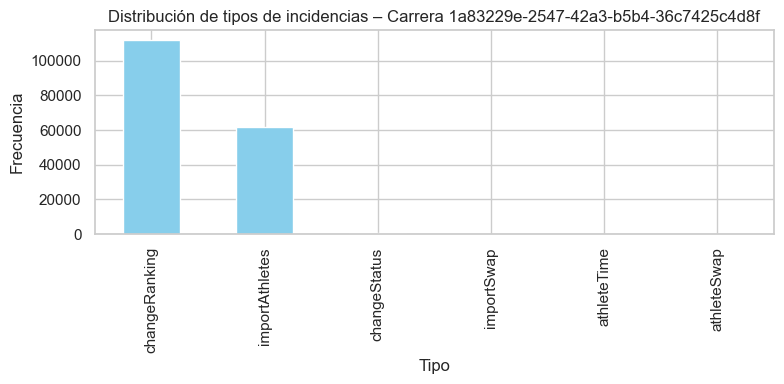

📅 Conteo diario – Carrera 1a83229e-2547-42a3-b5b4-36c7425c4d8f:
datetime
2025-02-11    36596
2025-02-12        0
2025-02-13        4
2025-02-14       15
2025-02-15    62271
2025-02-16    75511
2025-02-17       35
2025-02-18      140
2025-02-19       43
2025-02-20        6
2025-02-21        1
2025-02-22        0
2025-02-23        0
2025-02-24        0
2025-02-25        1
2025-02-26        0
2025-02-27        0
2025-02-28      105
2025-03-01        0
2025-03-02        1
2025-03-03        0
2025-03-04      183
2025-03-05        0
2025-03-06        0
2025-03-07        0
2025-03-08        0
2025-03-09        0
2025-03-10        0
2025-03-11       81
2025-03-12        0
2025-03-13       17
2025-03-14        0
2025-03-15        0
2025-03-16        0
2025-03-17        0
2025-03-18        0
2025-03-19        0
2025-03-20        0
2025-03-21        0
2025-03-22        0
2025-03-23        0
2025-03-24        0
2025-03-25        0
2025-03-26        0
2025-03-27        0
2025-03-28        0
2025-03

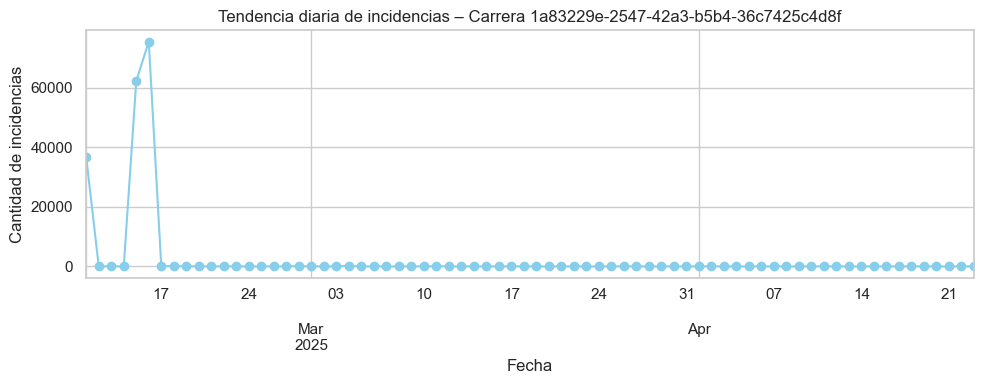


📊 Distribución de tipos – Carrera cf6f71f2-1235-45e3-802e-02833b71ae8b:
type
changeRanking    4978
athleteTime        57
changeStatus       46
athleteSwap        18
Name: count, dtype: int64


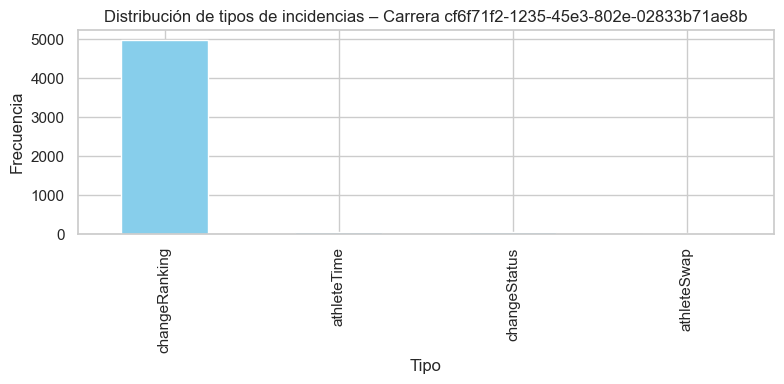

📅 Conteo diario – Carrera cf6f71f2-1235-45e3-802e-02833b71ae8b:
datetime
2025-04-25       4
2025-04-26       0
2025-04-27       0
2025-04-28     647
2025-04-29     268
2025-04-30      59
2025-05-01     648
2025-05-02    1052
2025-05-03     499
2025-05-04     514
2025-05-05     492
2025-05-06     916
Freq: D, Name: id, dtype: int64


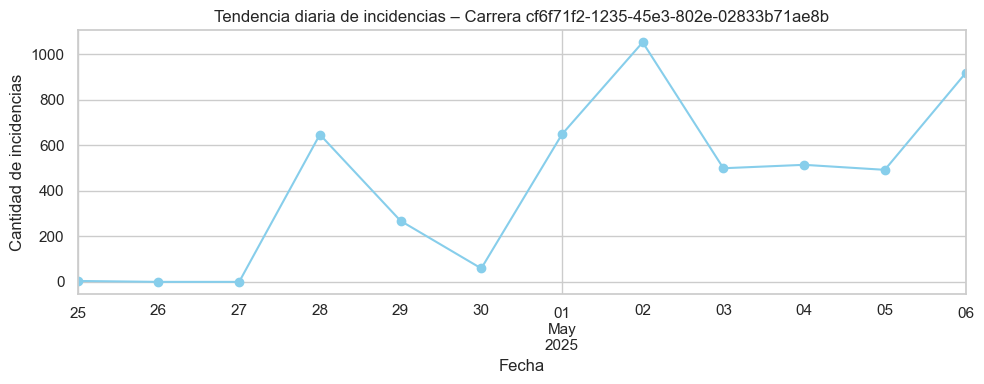


📊 Distribución de tipos – Carrera 331e7589-6440-4968-9b44-484ba589824e:
type
changeRanking     111979
importAthletes     61931
changeStatus         645
importSwap           281
athleteTime          116
athleteSwap           59
Name: count, dtype: int64


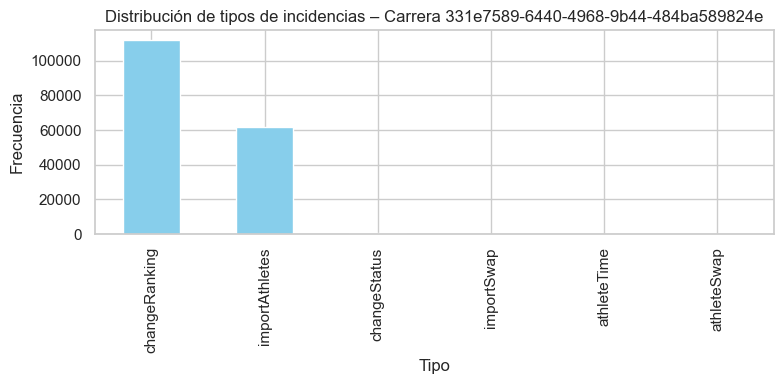

📅 Conteo diario – Carrera 331e7589-6440-4968-9b44-484ba589824e:
datetime
2025-02-11    36596
2025-02-12        0
2025-02-13        4
2025-02-14       15
2025-02-15    62271
2025-02-16    75511
2025-02-17       35
2025-02-18      140
2025-02-19       43
2025-02-20        6
2025-02-21        1
2025-02-22        0
2025-02-23        0
2025-02-24        0
2025-02-25        1
2025-02-26        0
2025-02-27        0
2025-02-28      105
2025-03-01        0
2025-03-02        1
2025-03-03        0
2025-03-04      183
2025-03-05        0
2025-03-06        0
2025-03-07        0
2025-03-08        0
2025-03-09        0
2025-03-10        0
2025-03-11       81
2025-03-12        0
2025-03-13       17
2025-03-14        0
2025-03-15        0
2025-03-16        0
2025-03-17        0
2025-03-18        0
2025-03-19        0
2025-03-20        0
2025-03-21        0
2025-03-22        0
2025-03-23        0
2025-03-24        0
2025-03-25        0
2025-03-26        0
2025-03-27        0
2025-03-28        0
2025-03

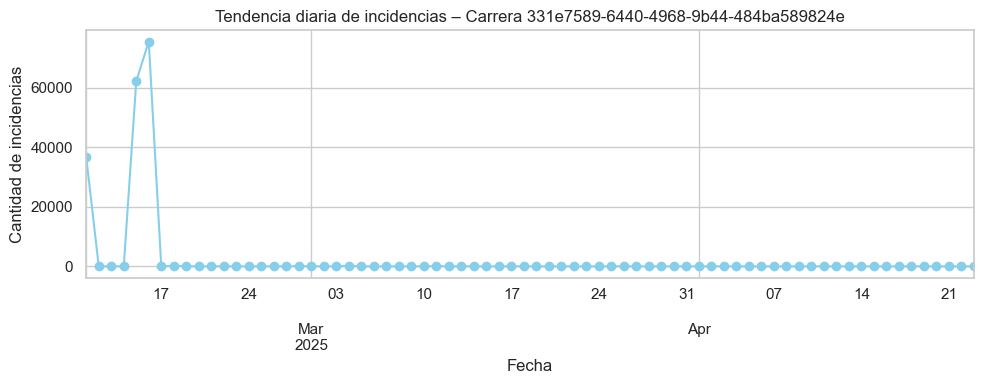

In [79]:
# --- Conteo total de tipos (solo tabla, no gráfico) ---
type_counts_total = issues_df['type'].value_counts().sort_values(ascending=False)
print("📊 Distribución total de tipos de incidencias:")
print(type_counts_total)

# --- Distribución y tendencia por carrera ---
for race in issues_df['race_id'].unique():
    df_race = issues_df[issues_df['race_id'] == race]
    
    # Tipos de incidencias
    type_counts = df_race['type'].value_counts().sort_values(ascending=False)
    print(f"\n📊 Distribución de tipos – Carrera {race}:")
    print(type_counts)
    
    plt.figure(figsize=(8,4))
    type_counts.plot(kind='bar', color='skyblue')
    plt.title(f"Distribución de tipos de incidencias – Carrera {race}")
    plt.xlabel("Tipo")
    plt.ylabel("Frecuencia")
    plt.tight_layout()
    plt.show()
    
    # Conteo diario
    incidencias_diarias = df_race.set_index('datetime')['id'].resample('1D').count()
    print(f"📅 Conteo diario – Carrera {race}:")
    print(incidencias_diarias)
    
    plt.figure(figsize=(10,4))
    incidencias_diarias.plot(marker='o', color='skyblue')
    plt.title(f"Tendencia diaria de incidencias – Carrera {race}")
    plt.xlabel("Fecha")
    plt.ylabel("Cantidad de incidencias")
    plt.tight_layout()
    plt.show()

Podemos ver de forma sencilla la mayoría de incidencias se realizan los dias previos y el dia de carrera, y por otro lado los días posteriores a la misma se arreglan errores muy esporádicos pero muy extendidos en el tiempo. El último día que se arregla un error es el 23 de abril, casi 1 mes y medio después de haber terminado la carrera.

Por otro lado vemos que la mayoría de los errores que se cometen son de lña categoría changeRanking e importathletes, lógico al ser una de las categorías más generales, al igual que importathletes en al que se importan los datos de los atletas. 

In [105]:
import pandas as pd

# --- Filtrar incidencias de tipo 'athleteSwap' ---
swap_issues = issues_df[issues_df["type"].str.lower() == "athleteswap"].copy()

print(f"🔄 Total de incidencias 'athleteSwap': {len(swap_issues)}\n")

# --- Asegurar columna datetime ---
if "datetime" not in swap_issues.columns and "time" in swap_issues.columns:
    swap_issues["datetime"] = pd.to_datetime(
        swap_issues["time"], unit="ms", errors="coerce"
    )

# --- Mostrar ejemplos ---
cols_presentes = [c for c in ["id", "race_id", "event_id", "athlete_id", "time", "datetime", "fase_temporal"] if c in swap_issues.columns]

if len(swap_issues) > 0:
    print("🕒 Ejemplos de incidencias 'athleteSwap' con tiempos y fase temporal:\n")
    print(
        swap_issues[cols_presentes]
        .sort_values("datetime")
        .head(15)
        .to_string(index=False)
    )
else:
    print("⚠️ No se encontraron incidencias de tipo 'athleteSwap'.")

🔄 Total de incidencias 'athleteSwap': 226

🕒 Ejemplos de incidencias 'athleteSwap' con tiempos y fase temporal:

                                  id                              race_id event_id athlete_id                    time                datetime fase_temporal
5d669e60-ea34-11ef-bfc8-cd113cc67c17 331e7589-6440-4968-9b44-484ba589824e      NaN   52Z378F9 2025-02-13 18:00:09.798 2025-02-13 18:00:09.798  post-carrera
5d669e60-ea34-11ef-bfc8-cd113cc67c17 1a83229e-2547-42a3-b5b4-36c7425c4d8f    Mitja   52Z378F9 2025-02-13 18:00:09.798 2025-02-13 18:00:09.798  post-carrera
b3828130-ea37-11ef-97cd-25151eb901c3 331e7589-6440-4968-9b44-484ba589824e      NaN   1FY32A92 2025-02-13 18:24:02.755 2025-02-13 18:24:02.755  post-carrera
b3828130-ea37-11ef-97cd-25151eb901c3 1a83229e-2547-42a3-b5b4-36c7425c4d8f    Mitja   1FY32A92 2025-02-13 18:24:02.755 2025-02-13 18:24:02.755  post-carrera
7b6e1930-eac3-11ef-8afb-cbbb7b07f27b 1a83229e-2547-42a3-b5b4-36c7425c4d8f    Mitja   536Z51Y9 2025-02-14 11


📊 Distribución global de incidencias por fase temporal:
fase_temporal
en carrera       73216
post-carrera    307400
Name: count, dtype: int64


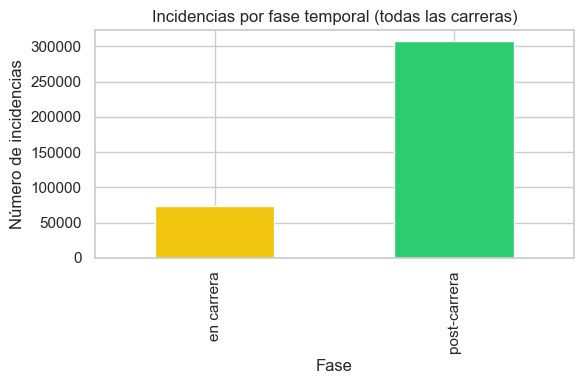


🏁 Carrera 1a83229e-2547-42a3-b5b4-36c7425c4d8f | Evento Mitja
  fase_temporal   count
0    en carrera   36589
1  post-carrera  138390


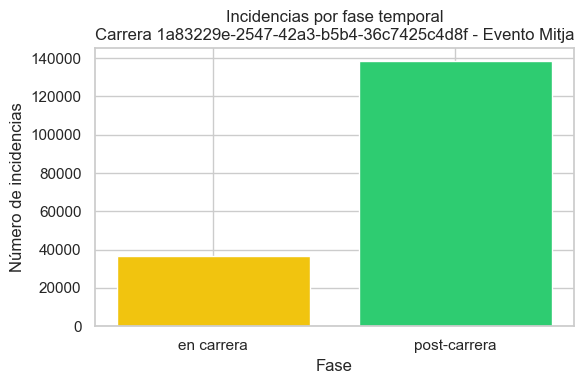


🏁 Carrera 1a83229e-2547-42a3-b5b4-36c7425c4d8f | Evento Mitja cadires
  fase_temporal  count
2    en carrera      7
3  post-carrera     25


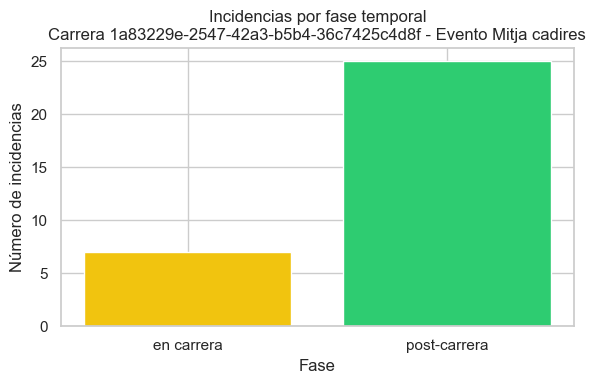


🏁 Carrera cf6f71f2-1235-45e3-802e-02833b71ae8b | Evento Stage 1
  fase_temporal  count
4    en carrera      4
5  post-carrera   5095


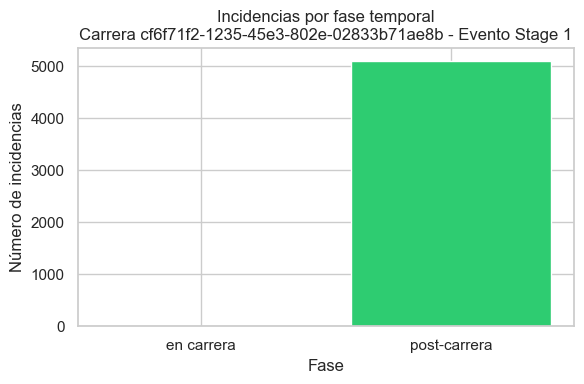


🏁 Carrera cf6f71f2-1235-45e3-802e-02833b71ae8b | Evento Stage 2
  fase_temporal  count
6    en carrera      4
7  post-carrera   5095


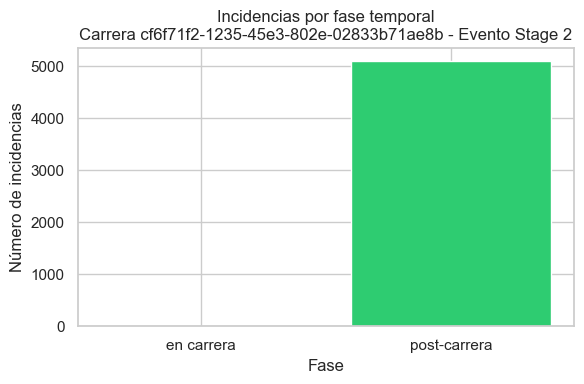


🏁 Carrera cf6f71f2-1235-45e3-802e-02833b71ae8b | Evento Stage 3
  fase_temporal  count
8    en carrera      4
9  post-carrera   5095


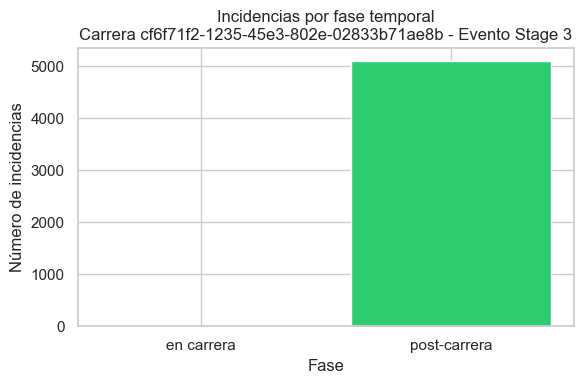


🏁 Carrera cf6f71f2-1235-45e3-802e-02833b71ae8b | Evento Stage 4
   fase_temporal  count
10    en carrera      4
11  post-carrera   5095


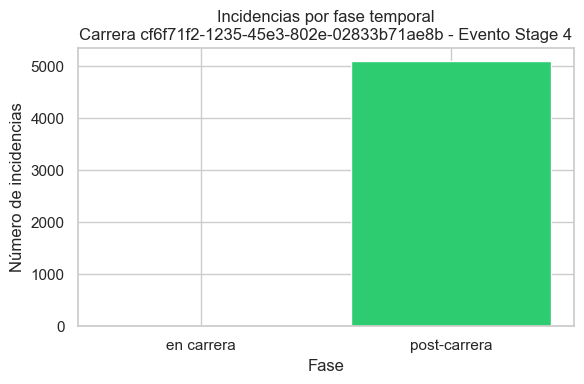


🏁 Carrera cf6f71f2-1235-45e3-802e-02833b71ae8b | Evento Stage 5
   fase_temporal  count
12    en carrera      4
13  post-carrera   5095


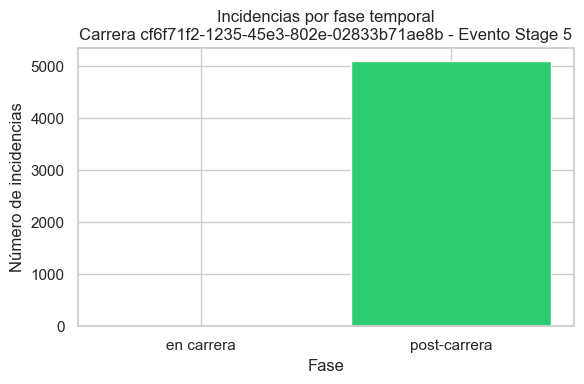


🏁 Carrera cf6f71f2-1235-45e3-802e-02833b71ae8b | Evento Stage 6
   fase_temporal  count
14    en carrera      4
15  post-carrera   5095


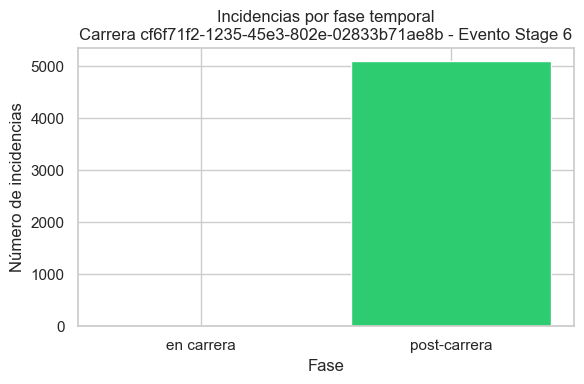

In [89]:
import pandas as pd
import matplotlib.pyplot as plt

# --- Asegurar que datetime existe ---
if "datetime" not in issues_df.columns and "time" in issues_df.columns:
    issues_df["datetime"] = pd.to_datetime(issues_df["time"], unit="ms", errors="coerce")

# --- Añadir event_id a issues_df desde athletes_events_df ---
if "event_id" not in issues_df.columns:
    issues_df = issues_df.merge(
        athletes_events_df[["athlete_id", "race_id", "event_id"]],
        on=["athlete_id", "race_id"],
        how="left"
    )

# --- Distribución global ---
fase_counts_total = issues_df["fase_temporal"].value_counts().sort_index()
print("\n📊 Distribución global de incidencias por fase temporal:")
print(fase_counts_total)

plt.figure(figsize=(6, 4))
fase_counts_total.plot(kind="bar", color=["#F1C40F", "#2ECC71", "#E74C3C"])
plt.title("Incidencias por fase temporal (todas las carreras)")
plt.xlabel("Fase")
plt.ylabel("Número de incidencias")
plt.tight_layout()
plt.show()

# --- Agrupación por carrera y evento ---
fase_counts_race_event = (
    issues_df.groupby(["race_id", "event_id", "fase_temporal"])["id"]
    .count()
    .reset_index(name="count")
)

# --- Visualización ---
for (race, event), subdf in fase_counts_race_event.groupby(["race_id", "event_id"]):
    print(f"\n🏁 Carrera {race} | Evento {event}")
    print(subdf[["fase_temporal", "count"]])

    plt.figure(figsize=(6, 4))
    plt.bar(
        subdf["fase_temporal"],
        subdf["count"],
        color=["#F1C40F", "#2ECC71", "#E74C3C"]
    )
    plt.title(f"Incidencias por fase temporal\nCarrera {race} - Evento {event}")
    plt.xlabel("Fase")
    plt.ylabel("Número de incidencias")
    plt.tight_layout()
    plt.show()

La mayoría de incidencias se realizan pre-carrera, en la que el cronometrador se encarga de arreglar pequeños detalles de todos los atletas para ajustar como se va a cronometrar la carrera y la informacion y se importan los datos de los atletas. 

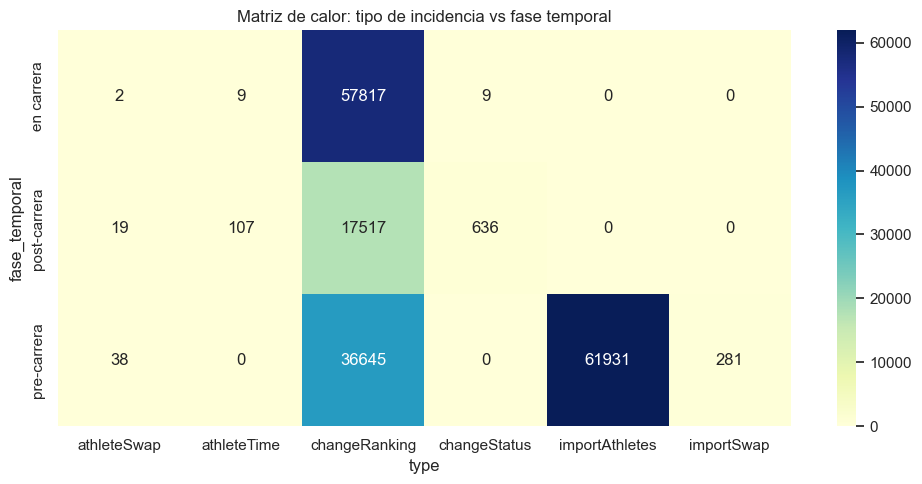

In [19]:
pivot = pd.crosstab(issues_df["fase_temporal"], issues_df["type"])
plt.figure(figsize=(10,5))
sns.heatmap(pivot, annot=True, fmt="d", cmap="YlGnBu")
plt.title("Matriz de calor: tipo de incidencia vs fase temporal")
plt.tight_layout()
plt.show()

In [ ]:
duplicados = issues_df['id'].value_counts()
duplicados = duplicados[duplicados > 1]

print(duplicados)

id
3927efd0-ec42-11ef-a9ce-21a37501454e    7562
17922da0-ec41-11ef-a9ce-21a37501454e    5349
f27fab50-ec40-11ef-a9ce-21a37501454e    5349
137e4220-ec38-11ef-9ec6-616957f1a263    5175
c7ec4a30-ebee-11ef-94fe-1bab35233bd7    5147
                                        ... 
471e67a0-ebce-11ef-90f3-7fb351d97b78       2
acdbecb0-ebca-11ef-9447-45909889f692       2
7f598520-eb7c-11ef-84aa-b74ff1cca6c7       2
385725d0-eb93-11ef-9b57-a1ba2d2bc810       2
ca420920-ec32-11ef-a9ce-21a37501454e       2
Name: count, Length: 261, dtype: int64


Un issue se puede repetir en muchos atletas, por lo que conviene simplificar los datos. 

In [ ]:
import json
import os
import glob

def get_issues_by_id(duplicated_id, data_dir):
    
    issues_files = glob.glob(os.path.join(data_dir, "*.issues.json"))
    if not issues_files:
        raise FileNotFoundError("No se encontró ningún archivo de issues en el directorio.")

    matched_issues = []

    def issue_contains_id(issue, target_id):
        if isinstance(issue, dict):
            if issue.get("id") == target_id:
                return True
            return any(issue_contains_id(v, target_id) for v in issue.values())
        elif isinstance(issue, list):
            return any(issue_contains_id(v, target_id) for v in issue)
        return False

    for fpath in issues_files:
        with open(fpath, "r", encoding="utf-8") as f:
            data = json.load(f)
        
        flat_issues = []
        for sublist in data:
            if isinstance(sublist, list):
                flat_issues.extend(sublist)
            elif isinstance(sublist, dict):
                flat_issues.append(sublist)

        for issue in flat_issues:
            if issue_contains_id(issue, duplicated_id):
                matched_issues.append(issue)

    return matched_issues

data_dir = r"C:\Users\mario\Desktop\MasterCienciadeDatos\TFM\TFM_MarioSoto\raiz\datos\historicos\datos"
duplicated_id = "af4215f0-e856-11ef-aee0-f3683f511a40"

issues_json = get_issues_by_id(duplicated_id, data_dir)

# Guardar resultado en JSON
output_file = os.path.join(data_dir, f"issues_{duplicated_id}.json")
with open(output_file, "w", encoding="utf-8") as f:
    json.dump(issues_json, f, ensure_ascii=False, indent=4)

print(f"✅ Se guardaron {len(issues_json)} issues con id {duplicated_id} en {output_file}")

✅ Se guardaron 4288 issues con id af4215f0-e856-11ef-aee0-f3683f511a40 en C:\Users\mario\Desktop\MasterCienciadeDatos\TFM\TFM_MarioSoto\raiz\datos\historicos\datos\issues_af4215f0-e856-11ef-aee0-f3683f511a40.json


Vemos que todos los issues con el mismo id han sido el mismo cambio pero para distintos atletas, estos nos va a servir para saber que cantidad de probloemas reales ha habido en la carrera como tal. 

In [69]:
import pandas as pd

# Suponiendo que ya tienes issues_df cargado
num_ids_unicos = issues_df['id'].nunique()
total_ids = len(issues_df)

print(f"Total de filas en issues_df: {total_ids}")
print(f"Número de ids únicos: {num_ids_unicos}")

# Opcional: mostrar cuántos ids están duplicados
num_duplicados = total_ids - num_ids_unicos
print(f"Número de ids duplicados: {num_duplicados}")

Total de filas en issues_df: 175011
Número de ids únicos: 402
Número de ids duplicados: 174609


Vemos como la mayoría de ids son duplicados y solo hay 402 errores en total, esto nos va a servir para poder hacer un análisis mucho más limpio y definido, por lo que vamos a pasar a agrupar los datos. 

In [81]:
import pandas as pd

def agrupar_issues_por_id_data_completo(
    issues_df, issues_data_df, issues_events_df,
    issues_times_df, issues_attributes_df, issues_chips_df,
    umbral_lista=10
):

    data_cols = [col for col in issues_data_df.columns if col.startswith("data_")]
    events_cols = [col for col in issues_events_df.columns if col.startswith("data_")]
    selected_cols = list(set(data_cols + events_cols))

    grouped = issues_df.groupby('id').agg({
        'type': 'first',
        'datetime': 'first',
        'fase_temporal': 'first',
        'priority': 'first',
        'race_id': 'first',
        'collection': 'first',
        'athlete_id': lambda x: list(x.dropna().unique()) 
    }).reset_index()

    grouped = grouped.rename(columns={'athlete_id': 'athletes_afectados'})

    total_athletes = issues_df['athlete_id'].nunique()

    def generar_afectacion(ids):
        num_afectados = len(ids)
        pct_afectados = num_afectados / total_athletes if total_athletes > 0 else 0
        return pct_afectados, num_afectados

    afectados_data = grouped['athletes_afectados'].apply(generar_afectacion)
    grouped['afectados'] = afectados_data.apply(lambda x: x[0])       
    grouped['num_afectados'] = afectados_data.apply(lambda x: x[1])   

    for col in selected_cols:
        if col in issues_data_df.columns:
            grouped[col] = issues_data_df.groupby('issue_id')[col].first().reindex(grouped['id']).values
        elif col in issues_events_df.columns:
            grouped[col] = issues_events_df.groupby('issue_id')[col].first().reindex(grouped['id']).values

    def map_afectacion(df):
        df_2 = df.copy()
        df_2 = df_2.merge(
            grouped[['id','afectados','num_afectados']], 
            left_on='issue_id', right_on='id', how='left'
        )
        return df_2

    issues_df_2 = map_afectacion(issues_df)
    issues_data_df_2 = map_afectacion(issues_data_df)
    issues_events_df_2 = map_afectacion(issues_events_df)
    issues_times_df_2 = map_afectacion(issues_times_df)
    issues_attributes_df_2 = map_afectacion(issues_attributes_df)
    issues_chips_df_2 = map_afectacion(issues_chips_df)

    return {
        'issues_agrupados': grouped,
        'issues_df_2': issues_df_2,
        'issues_data_df_2': issues_data_df_2,
        'issues_events_df_2': issues_events_df_2,
        'issues_times_df_2': issues_times_df_2,
        'issues_attributes_df_2': issues_attributes_df_2,
        'issues_chips_df_2': issues_chips_df_2
    }

# --- Uso ---
resultados = agrupar_issues_por_id_data_completo(
    issues_df,
    issues_data_df,
    issues_events_df,
    issues_times_df,
    issues_attributes_df,
    issues_chips_df
)

print(resultados['issues_agrupados'].columns.tolist())

['id', 'type', 'datetime', 'fase_temporal', 'priority', 'race_id', 'collection', 'athletes_afectados', 'afectados', 'num_afectados', 'data_club', 'data_events_gunTime', 'data_events_times_Meta_time', 'data_events_times_20K_time', 'data_events_times_5K_time', 'data_events_gunTimeModeConfig_wave', 'data_events_times_15K_time', 'data_events_attributes_Sillas', 'data_gender', 'data_events_times_10K_time', 'data_statusNote', 'data_name', 'data_document', 'data_events_category', 'data_events_status', 'data_nationality', 'data_TIEMPO ESTIMADO', 'data_events_auto_chip', 'data_events_auto_category', 'data_events_times_Salida_time', 'data_birthdate', 'data_Licencia', 'data_events_attributes_Discapacitado intelectual', 'data_surname', 'data_events_attributes_Discapacitado visual', 'data_events_dorsal']


In [82]:
IA = resultados['issues_agrupados']

# Opción 1: usando .shape
print("Número de filas:", IA.shape[0])
print("Número de columnas:", IA.shape[1])

Número de filas: 402
Número de columnas: 36


In [83]:
IA.columns

Index(['id', 'type', 'datetime', 'fase_temporal', 'priority', 'race_id',
       'collection', 'athletes_afectados', 'afectados', 'num_afectados',
       'data_club', 'data_events_gunTime', 'data_events_times_Meta_time',
       'data_events_times_20K_time', 'data_events_times_5K_time',
       'data_events_gunTimeModeConfig_wave', 'data_events_times_15K_time',
       'data_events_attributes_Sillas', 'data_gender',
       'data_events_times_10K_time', 'data_statusNote', 'data_name',
       'data_document', 'data_events_category', 'data_events_status',
       'data_nationality', 'data_TIEMPO ESTIMADO', 'data_events_auto_chip',
       'data_events_auto_category', 'data_events_times_Salida_time',
       'data_birthdate', 'data_Licencia',
       'data_events_attributes_Discapacitado intelectual', 'data_surname',
       'data_events_attributes_Discapacitado visual', 'data_events_dorsal'],
      dtype='object')

Ahora tenemos todos los issues en un solo dataframe que estudiaremos a nuestro antojo. 

In [84]:
IA.groupby('type')['num_afectados'].agg(['mean','max'])

,mean,max
type,,
athleteSwap,1.114286,2
athleteTime,1.468354,38
changeRanking,437.316406,7562
changeStatus,37.941176,423
importAthletes,4129.200000,4991


Vemos como hay tipos de errores que se aplican de forma masiva, y otros que no tanto, dando un poco de contexto de su utilidad. 

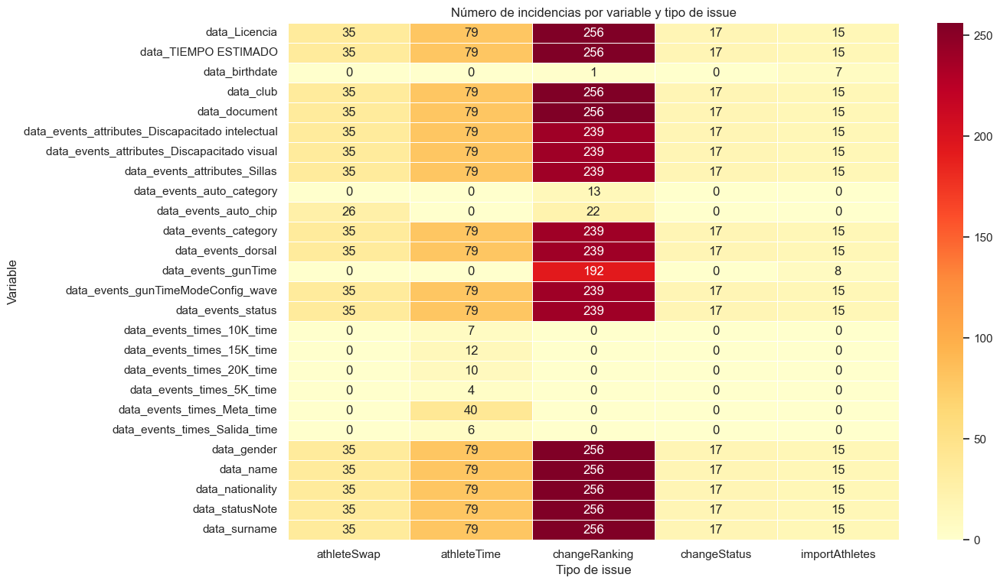

In [88]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Filtrar columnas relevantes
cols_data = [c for c in IA.columns if c.startswith('data_') or c.startswith('data_events_')]

# Crear lista para almacenar los resultados
records = []

for col in cols_data:
    summary = IA.groupby('type')[col].apply(lambda x: x.notna().sum())
    for issue_type, count in summary.items():
        records.append({'variable': col, 'type': issue_type, 'count': count})

# Convertir a DataFrame
df_summary = pd.DataFrame(records)

# Pivot para heatmap
heatmap_data = df_summary.pivot(index='variable', columns='type', values='count').fillna(0)

# --- Heatmap ---
plt.figure(figsize=(14, max(6, len(heatmap_data)*0.3)))  # ajustar altura según número de variables
sns.heatmap(
    heatmap_data, 
    annot=True, 
    fmt=".0f", 
    cmap="YlOrRd", 
    linewidths=0.5
)
plt.title("Número de incidencias por variable y tipo de issue")
plt.ylabel("Variable")
plt.xlabel("Tipo de issue")
plt.tight_layout()
plt.show()

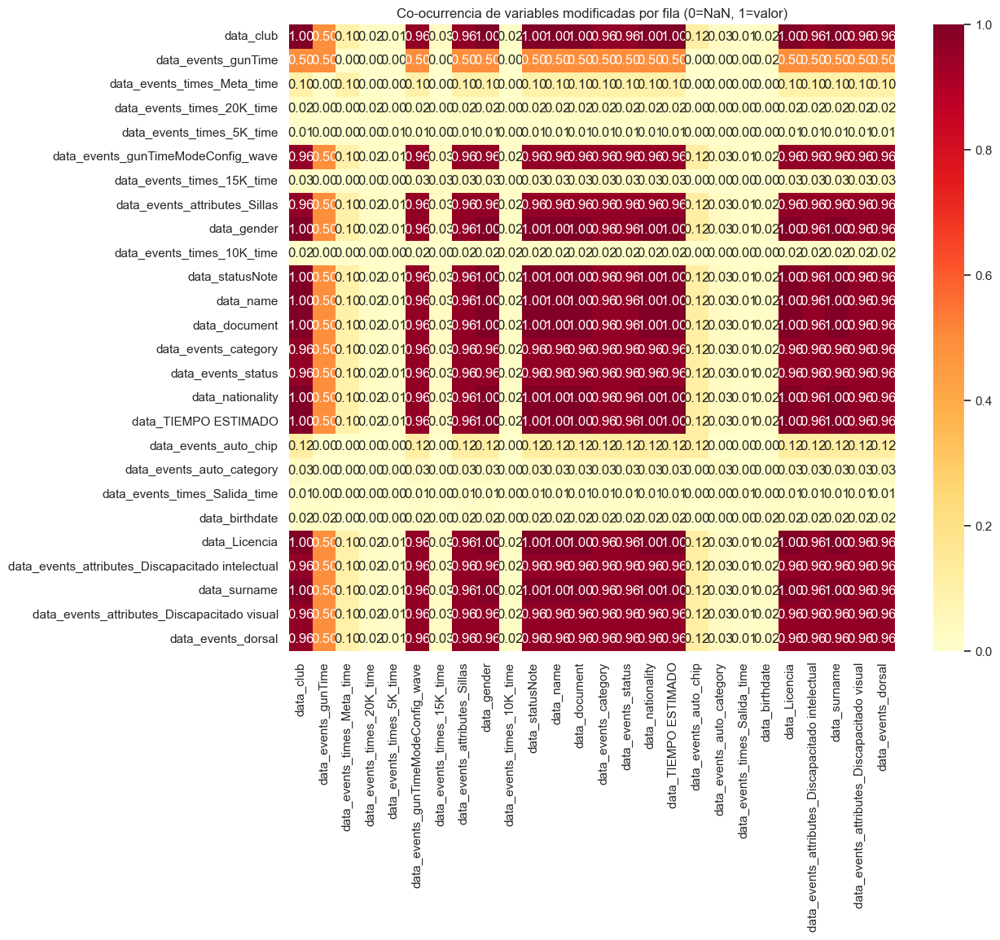

In [91]:
# 1️⃣ Crear matriz binaria: 1 si hay valor, 0 si NaN
df_binary = IA[cols_data].notna().astype(int)

# 2️⃣ Matriz de co-ocurrencia (cuántas veces se modifican juntas)
cooccurrence = df_binary.T.dot(df_binary)

# 3️⃣ Normalizar opcionalmente por número de incidencias para que sea % de co-ocurrencia
cooccurrence_pct = cooccurrence / len(IA)

# 4️⃣ Heatmap
plt.figure(figsize=(12,10))
sns.heatmap(cooccurrence_pct, cmap='YlOrRd', annot=True, fmt=".2f")
plt.title("Co-ocurrencia de variables modificadas por fila (0=NaN, 1=valor)")
plt.show()

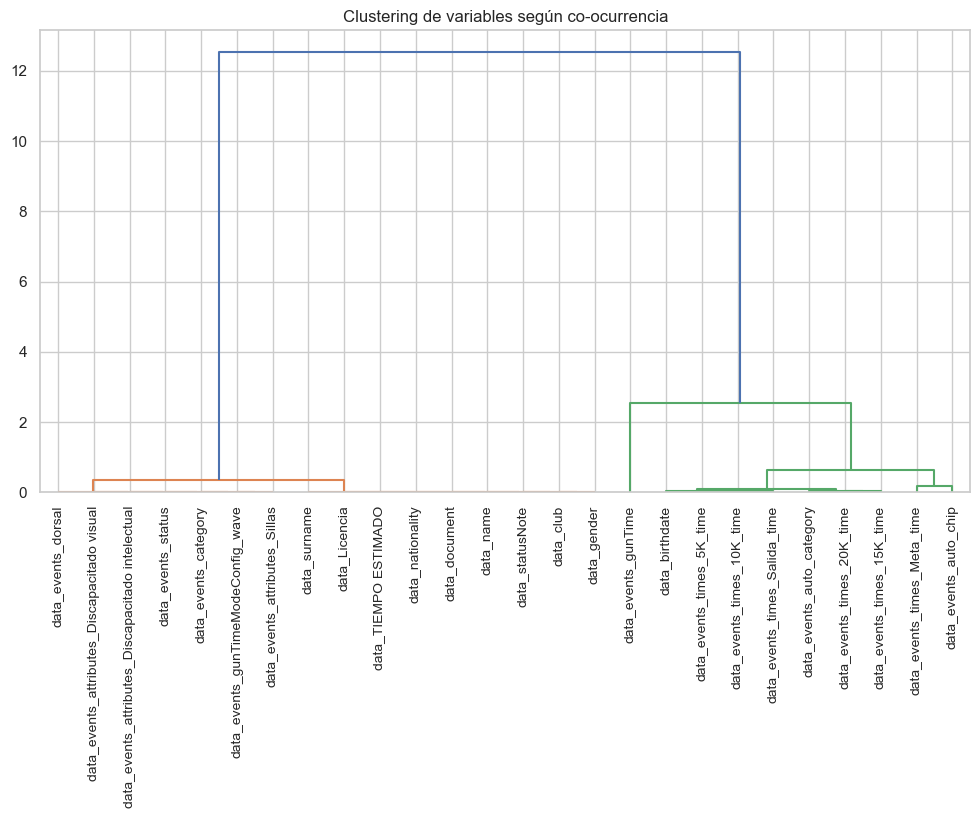

In [92]:
from scipy.cluster.hierarchy import linkage, dendrogram

# 1️⃣ Matriz binaria: 1 si hay valor, 0 si NaN
df_binary = IA[cols_data].notna().astype(int)

# 2️⃣ Matriz de co-ocurrencia normalizada
cooccurrence = df_binary.T.dot(df_binary) / len(df_binary)

# 3️⃣ Convertir a distancia
dist_matrix = 1 - cooccurrence

# 4️⃣ Clustering jerárquico
linked = linkage(dist_matrix, method='ward')

# 5️⃣ Dendrograma
plt.figure(figsize=(12,6))
dendrogram(linked, labels=cooccurrence.columns, leaf_rotation=90)
plt.title("Clustering de variables según co-ocurrencia")
plt.show()

In [117]:
from itertools import combinations
from collections import Counter

combinations_by_type = {}

for tipo in df_changes['type'].unique():
    df_tipo = df_changes[df_changes['type'] == tipo]
    
    # Agrupamos por instante y issue, obtenemos lista de variables modificadas
    grouped = df_tipo.groupby(['id', 'datetime'])['variable'].apply(list)
    
    # Contamos combinaciones de 2 variables (puedes aumentar n)
    comb_counter = Counter()
    for vars_list in grouped:
        comb_counter.update(combinations(sorted(vars_list), 2))
    
    combinations_by_type[tipo] = comb_counter.most_common(10)  # top 10 combinaciones

# Mostrar resultados
for tipo, combs in combinations_by_type.items():
    print(f"\nTipo: {tipo}\nTop combinaciones de variables cambiadas:")
    for combo, count in combs:
        print(f"{combo}: {count}")


Tipo: importAthletes
Top combinaciones de variables cambiadas:
('data_birthdate', 'data_document'): 7
('data_birthdate', 'data_events_gunTime'): 7
('data_birthdate', 'data_nationality'): 7
('data_document', 'data_events_gunTime'): 7
('data_document', 'data_nationality'): 7
('data_events_gunTime', 'data_nationality'): 7
('data_events_gunTime', 'data_events_gunTimeModeConfig_wave'): 6
('data_birthdate', 'data_events_gunTimeModeConfig_wave'): 5
('data_document', 'data_events_gunTimeModeConfig_wave'): 5
('data_events_gunTimeModeConfig_wave', 'data_nationality'): 5

Tipo: changeRanking
Top combinaciones de variables cambiadas:
('data_events_gunTime', 'data_events_gunTimeModeConfig_wave'): 179
('data_events_auto_category', 'data_events_category'): 11
('data_name', 'data_surname'): 4
('data_events_auto_category', 'data_statusNote'): 2
('data_events_gunTime', 'data_gender'): 1
('data_events_gunTimeModeConfig_wave', 'data_gender'): 1
('data_events_auto_chip', 'data_events_dorsal'): 1

Tipo: at

In [99]:
# Filtramos cambios reales (solo valores no nulos ni vacíos)
value_cols = [c for c in IA.columns if c.startswith('data_') or c.startswith('data_events_')]

df_changes = IA.melt(
    id_vars=['id', 'type', 'datetime', 'fase_temporal', 'afectados', 'athletes_afectados', 'num_afectados'],
    value_vars=value_cols,
    var_name='variable',
    value_name='valor'
)

# Filtrar valores válidos: no nulos, no vacíos ni NaT
df_changes = df_changes[df_changes['valor'].notna() & (df_changes['valor'] != "")]

# Convertimos datetime si no lo está
df_changes['datetime'] = pd.to_datetime(df_changes['datetime'])

In [103]:
# Calcular porcentaje de atletas afectados
total_athletes = len(athletes_df)
df_changes['pct_afectados'] = df_changes['num_afectados'] / total_athletes * 100

# Crear scatterplot con Plotly Express
import plotly.express as px

fig = px.scatter(
    df_changes,
    x='datetime',
    y='variable',
    color='type',
    size_max=12,
    hover_data=['pct_afectados'],
    title='Cambios de variables a lo largo del tiempo por tipo de issue'
)
fig.show()

Vemos como la mayoría de errores se distribuyen pre carrera, en carrera y unos pocos dias y horas despues de la carrera. Lo cuál nos da un contexto de como se van cambiando y en los momentos en el que lo hacen. 

In [105]:
import plotly.express as px

color_map = {
    'athleteTime': 'blue',
    'changeRanking': 'red',
    'athleteSwap': 'green',
    'importAthletes': 'orange',
    'changeStatus': 'purple',
    'other': 'brown'
}

for tipo in df_changes['type'].unique():
    df_tipo = df_changes[(df_changes['type'] == tipo) & (df_changes['pct_afectados'].notna())]

    if df_tipo.empty:
        continue  

    color = color_map.get(tipo, 'gray')

    fig = px.scatter(
        df_tipo,
        x='datetime',
        y='variable',
        color_discrete_sequence=[color],  # un solo color por tipo
        size_max=12,
        hover_data=['pct_afectados'],
        title=f'Cambios de variables a lo largo del tiempo - Tipo: {tipo}'
    )

    fig.update_layout(
        dragmode='zoom',           
        hovermode='closest',       
        yaxis={'categoryorder':'total ascending'}
    )

    fig.show(config={'scrollZoom': True, 'displayModeBar': True})

- **importAthletes**: Casi todos antes de empezar la carrera, seguramente se importan 

In [113]:
import pandas as pd
import plotly.express as px
import numpy as np

# Copiar DataFrame
df_plot = IA.copy()
df_plot['datetime'] = pd.to_datetime(df_plot['datetime'])

# Hover solo con valores no nulos
cols_data = [c for c in df_plot.columns if c.startswith("data_") or c.startswith("data_events_")]

def make_hover(row):
    hover_text = (
        f"ID: {row['id']}<br>"
        f"Tipo: {row['type']}<br>"
        f"Afectados: {row['afectados']*100:.1f}% ({row['num_afectados']})"
    )
    for col in cols_data:
        val = row[col]
        if pd.notna(val) and val not in ["", None, "NaT"]:
            hover_text += f"<br>{col}: {val}"
    return hover_text

df_plot['hover'] = df_plot.apply(make_hover, axis=1)

# Tamaño según número de afectados, escala gradual
# Usamos raíz cuadrada para suavizar diferencias grandes
df_plot['afectados_size'] = np.sqrt(df_plot['num_afectados'])

# Gráfico scatter
fig = px.scatter(
    df_plot,
    x='datetime',
    y='type',
    size='afectados_size',
    color='type',
    hover_name='hover',
    title="Distribución de tipos de issues en el tiempo",
    height=600
)

# Líneas verticales para fases temporales
for fase in df_plot['fase_temporal'].dropna().unique():
    fechas = df_plot[df_plot['fase_temporal'] == fase]['datetime']
    if not fechas.empty:
        fecha_min = fechas.min()
        fig.add_shape(
            type="line",
            x0=fecha_min,
            x1=fecha_min,
            y0=-0.5,
            y1=len(df_plot['type'].unique()) - 0.5,
            line=dict(color="gray", dash="dash"),
        )
        fig.add_annotation(
            x=fecha_min,
            y=len(df_plot['type'].unique()) - 0.5,
            text=fase,
            showarrow=False,
            xanchor="left",
            yanchor="bottom"
        )

# Configuración interacción y zoom
fig.update_layout(
    yaxis={'categoryorder':'total ascending'},
    dragmode=False,        # desactiva zoom por arrastre
    hovermode='closest'
)

# Ajuste del tamaño de los puntos
fig.update_traces(marker=dict(sizemode='area', sizeref=0.1, line_width=1))

# Zoom con Ctrl + rueda del ratón
fig.show(config={
    'scrollZoom': True,  
    'displayModeBar': True,
})

In [114]:
pd.crosstab(IA['type'], IA['fase_temporal'], normalize='index')

fase_temporal,en carrera,post-carrera,pre-carrera
type,,,
athleteSwap,0.028571,0.371429,0.60000
athleteTime,0.113924,0.886076,0.00000
changeRanking,0.175781,0.667969,0.15625
changeStatus,0.117647,0.882353,0.00000
importAthletes,0.000000,0.000000,1.00000


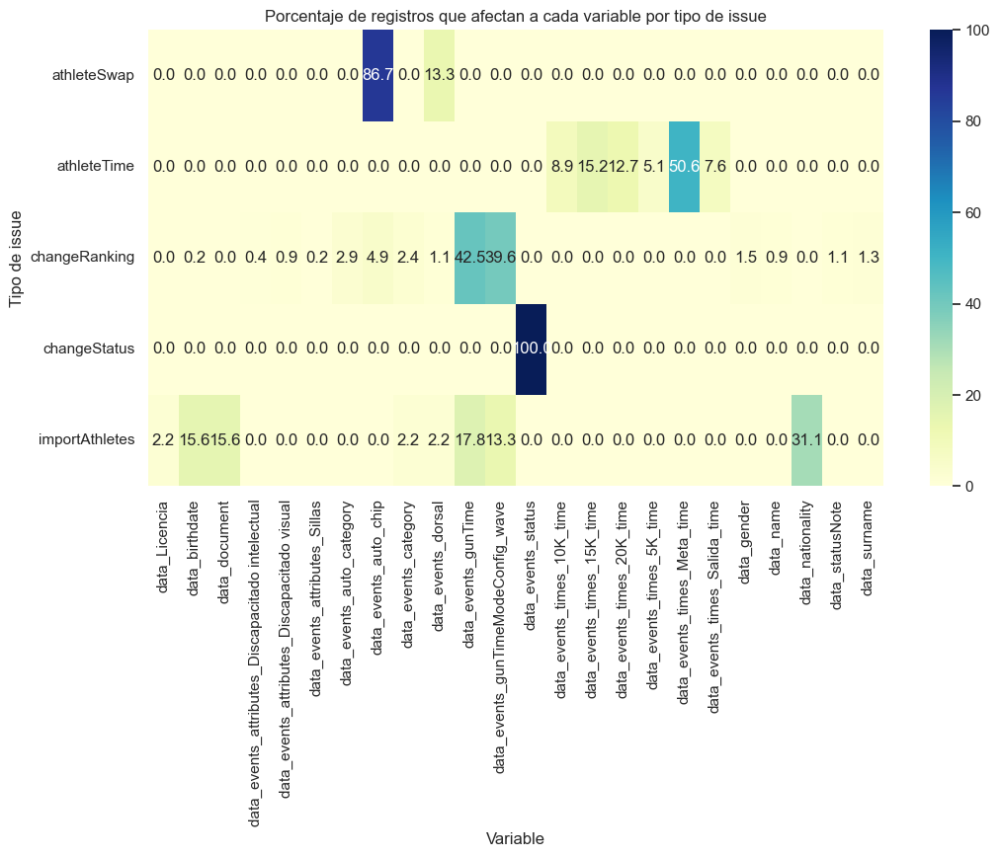

In [71]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# df_changes: columnas ['type', 'variable', 'valor'] o cualquier columna que indique cambio

# 1️⃣ Contar cuántos registros tienen un valor modificado para cada variable y tipo
counts = df_changes.groupby(['type', 'variable'])['valor'].count().unstack(fill_value=0)

# 2️⃣ Dividir entre el total de registros de cada tipo para obtener porcentaje
counts_pct = counts.div(counts.sum(axis=1), axis=0) * 100

# 3️⃣ Visualización como heatmap
plt.figure(figsize=(12,6))
sns.heatmap(counts_pct, annot=True, fmt=".1f", cmap="YlGnBu")
plt.title('Porcentaje de registros que afectan a cada variable por tipo de issue')
plt.ylabel('Tipo de issue')
plt.xlabel('Variable')
plt.show()

### Correlaciones de los issues con las variables

Anteriormente hemos obtenido algunas conclusiones en base a los tipos de error, y creemos que los errores de tipo changeranking, athleteswap e importathletes no entran en nuestro estudio por diferentes moticos (poca abstraccion y contexto e importaciones generales). Por lo que nuestro estudio se centrará en changestatus y athlete time, de las cuáles intentaremos predecir el porque un atleta cambia su estatus de carrera o modifica su tiempo en base a los datos de carrera. 

Identificar qué causas explican (o se asocian con alta probabilidad) la aparición de issues tipo:

- changeStatus — cambios de estado del atleta (p.ej. pasa a retired, DSQ, etc.)

- athleteTime — cambios de tiempos (errores o correcciones de cronometraje).

Y esas causas pueden venir de dos fuentes:

- Variables del atleta (athletes_df, athletes_events_df, …)

- Otros issues sobre el mismo atleta o variable, en momentos cercanos (correlación espacial-temporal).

In [103]:
df_changes.head()

,id,type,datetime,fase_temporal,afectados,athletes_afectados,variable,valor
79,2e616100-eec0-11ef-ba02-2d3eb2d81d1f,athleteTime,2025-02-19 12:51:05.104,post-carrera,0.000032,[19477A97],data_events_times_5K_time,1609398.0
140,5c88e2a0-ee94-11ef-9ab3-55798f1380ce,athleteTime,2025-02-19 07:37:24.682,post-carrera,0.000032,[28B12198],data_events_times_5K_time,1581000.0
336,ccb409f0-ed37-11ef-9ac5-999bc91314b6,athleteTime,2025-02-17 14:02:18.511,post-carrera,0.000032,[52674F19],data_events_times_5K_time,1499877.0
401,ff1b2cd0-edd6-11ef-b1a8-0779410a0038,athleteTime,2025-02-18 09:01:53.053,post-carrera,0.000032,[4D831Z6B],data_events_times_5K_time,1368000.0
427,11a62f30-edd7-11ef-b1a8-0779410a0038,athleteTime,2025-02-18 09:02:24.163,post-carrera,0.000032,[4D831Z6B],data_events_times_10K_time,2503000.0


Primero filtramos por issues relevantes

In [26]:
# Nos quedamos solo con los tipos de issue que queremos estudiar
df_filtrado = df_changes[df_changes['type'].isin(['changeStatus', 'athleteTime'])].copy()

# Aseguramos que la fecha esté en formato datetime
df_filtrado['datetime'] = pd.to_datetime(df_filtrado['datetime'])

print("Tipos de issue incluidos:", df_filtrado['type'].unique())
print("Filas seleccionadas:", len(df_filtrado))
df_filtrado.head()

Tipos de issue incluidos: ['athleteTime' 'changeStatus']
Filas seleccionadas: 96


,id,type,datetime,fase_temporal,afectados,athletes_afectados,variable,valor
79,2e616100-eec0-11ef-ba02-2d3eb2d81d1f,athleteTime,2025-02-19 12:51:05.104,post-carrera,0.000032,[19477A97],data_events_times_5K_time,1609398.0
140,5c88e2a0-ee94-11ef-9ab3-55798f1380ce,athleteTime,2025-02-19 07:37:24.682,post-carrera,0.000032,[28B12198],data_events_times_5K_time,1581000.0
336,ccb409f0-ed37-11ef-9ac5-999bc91314b6,athleteTime,2025-02-17 14:02:18.511,post-carrera,0.000032,[52674F19],data_events_times_5K_time,1499877.0
401,ff1b2cd0-edd6-11ef-b1a8-0779410a0038,athleteTime,2025-02-18 09:01:53.053,post-carrera,0.000032,[4D831Z6B],data_events_times_5K_time,1368000.0
427,11a62f30-edd7-11ef-b1a8-0779410a0038,athleteTime,2025-02-18 09:02:24.163,post-carrera,0.000032,[4D831Z6B],data_events_times_10K_time,2503000.0


In [27]:
# 1️⃣ Expandir la lista de atletas afectados
df_exploded = (
    df_filtrado
    .explode('athletes_afectados')
    .rename(columns={'athletes_afectados': 'athlete_id'})
)

# 2️⃣ Mantener todos los IDs como string limpio
df_exploded['athlete_id'] = df_exploded['athlete_id'].astype(str).str.strip()

print("Filas después de expandir:", len(df_exploded))
print("Ejemplo de athlete_id:", df_exploded['athlete_id'].unique()[:10])
df_exploded.head()

Filas después de expandir: 761
Ejemplo de athlete_id: ['19477A97' '28B12198' '52674F19' '4D831Z6B' 'D43Y2162' 'ZC3F3D71'
 'B4AC91Z4' '6F2A8Y61' 'A1Z3B616' 'BD2YBD42']


,id,type,datetime,fase_temporal,afectados,athlete_id,variable,valor
79,2e616100-eec0-11ef-ba02-2d3eb2d81d1f,athleteTime,2025-02-19 12:51:05.104,post-carrera,0.000032,19477A97,data_events_times_5K_time,1609398.0
140,5c88e2a0-ee94-11ef-9ab3-55798f1380ce,athleteTime,2025-02-19 07:37:24.682,post-carrera,0.000032,28B12198,data_events_times_5K_time,1581000.0
336,ccb409f0-ed37-11ef-9ac5-999bc91314b6,athleteTime,2025-02-17 14:02:18.511,post-carrera,0.000032,52674F19,data_events_times_5K_time,1499877.0
401,ff1b2cd0-edd6-11ef-b1a8-0779410a0038,athleteTime,2025-02-18 09:01:53.053,post-carrera,0.000032,4D831Z6B,data_events_times_5K_time,1368000.0
427,11a62f30-edd7-11ef-b1a8-0779410a0038,athleteTime,2025-02-18 09:02:24.163,post-carrera,0.000032,4D831Z6B,data_events_times_10K_time,2503000.0


In [28]:
# Filtrar solo issues de tipo changeStatus post-carrera
df_status = df_exploded[
    (df_exploded['type'] == 'changeStatus') &
    (df_exploded['fase_temporal'].str.lower().str.contains('post'))
].copy()

print(f"Total de changeStatus post-carrera: {len(df_status)}")
print("Tipos de estado detectados:")
print(df_status['valor'].value_counts())

Total de changeStatus post-carrera: 636
Tipos de estado detectados:
valor
retired         434
disqualified    200
quarantine        2
Name: count, dtype: int64


In [92]:
status_types = df_status['valor'].unique()

# Diccionario de atletas por tipo de status
status_dict = {
    s: set(df_status.loc[df_status['valor'] == s, 'athlete_id'])
    for s in status_types
}

# Añadir columnas binarias al athletes_events_df
for s in status_types:
    col_name = f'has_status_{s}'
    athletes_events_df[col_name] = athletes_events_df['athlete_id'].isin(status_dict[s]).astype(int)

# Añadir columnas binarias al athletes_events_df
for s in status_types:
    col_name = f'has_status_{s}'
    athletes_time_df[col_name] = athletes_time_df['athlete_id'].isin(status_dict[s]).astype(int)

    # Añadir columnas binarias al athletes_events_df
for s in status_types:
    col_name = f'has_status_{s}'
    athletes_df[col_name] = athletes_df['athlete_id'].isin(status_dict[s]).astype(int)

In [94]:
athletes_df.columns

Index(['Licencia', 'TIEMPO ESTIMADO', 'athlete_id', 'birthdate', 'club',
       'color', 'featured', 'fullName', 'gender', 'id', 'importId', 'name',
       'nationality', 'race_id', 'statusNote', 'surname', 'user_id',
       'club_clean', 'nationality_clean', 'has_status_disqualified',
       'has_status_retired', 'has_status_quarantine'],
      dtype='object')

In [31]:
import pandas as pd

# Fecha de la carrera
race_date = pd.Timestamp('2025-02-16')

# Calcular edad
athletes_df['age'] = (race_date - athletes_df['birthdate']).dt.days // 365

# Crear 4 grupos de edad
bins = [0, 25, 35, 45, 100]  # ajustable según tu población
labels = ['<25', '25-34', '35-44', '45+']

athletes_df['age_group'] = pd.cut(athletes_df['age'], bins=bins, labels=labels, right=False)

# Revisar
athletes_df[['age', 'age_group']].head(10)

athletes_df['age_group'] = athletes_df['age_group'].astype('category')

In [113]:
print(athletes_df['age_group'].dtype)

category


In [75]:
athletes_df.columns

Index(['Licencia', 'TIEMPO ESTIMADO', 'athlete_id', 'birthdate', 'club',
       'color', 'featured', 'fullName', 'gender', 'id', 'importId', 'name',
       'nationality', 'race_id', 'statusNote', 'surname', 'user_id',
       'has_status_disqualified', 'has_status_retired',
       'has_status_quarantine', 'age', 'age_group'],
      dtype='object')

In [79]:
athletes_df['has_status_retired'].value_counts()

has_status_retired
0    31249
1      434
Name: count, dtype: int64

In [89]:
import pandas as pd
import numpy as np
import warnings
from scipy.stats import chi2_contingency, ttest_ind, mannwhitneyu, fisher_exact
from sklearn.linear_model import LogisticRegression

warnings.filterwarnings("ignore", category=RuntimeWarning)

# --- Función para V de Cramer ---
def cramers_v(confusion_matrix):
    """Calcula V de Cramer para tablas de contingencia"""
    chi2, _, _, _ = chi2_contingency(confusion_matrix)
    n = confusion_matrix.sum().sum()
    k = min(confusion_matrix.shape) - 1
    return np.sqrt(chi2 / (n * k))

# --- Función principal de análisis ---
def analyze_dataframe(df, dummy_cols, max_categories=20):
    """
    Analiza un DataFrame comparando variables categóricas, numéricas y timedelta frente a dummies.
    Incluye:
      - Chi² y Fisher (para categóricas)
      - t-test y Mann-Whitney (para numéricas)
      - Regresión logística balanceada (odds ratio)
    """
    results = {'categorical': [], 'numerical': []}

    # Identificar tipos de columnas
    numeric_cols = df.select_dtypes(include=[np.number, 'timedelta']).columns.difference(dummy_cols)
    categorical_cols = df.select_dtypes(include=['object', 'category']).columns

    # --- Análisis categórico ---
    for cat_col in categorical_cols:
        n_categories = df[cat_col].nunique()
        if n_categories > max_categories:
            continue

        for dummy in dummy_cols:
            try:
                table = pd.crosstab(df[cat_col], df[dummy])

                if table.shape[0] > 1 and table.shape[1] > 1:
                    chi2, p_chi2, _, _ = chi2_contingency(table)
                    v = cramers_v(table)

                    # Fisher sólo si la tabla es 2x2
                    p_fisher = np.nan
                    if table.shape == (2, 2):
                        _, p_fisher = fisher_exact(table)

                    results['categorical'].append({
                        'categorical_var': cat_col,
                        'dummy': dummy,
                        'chi2': chi2,
                        'p_chi2': p_chi2,
                        'p_fisher': p_fisher,
                        'cramers_v': v
                    })
            except Exception as e:
                print(f"Error en {cat_col} vs {dummy}: {e}")
                continue

    # --- Análisis numérico / timedelta ---
    for num_col in numeric_cols:
        for dummy in dummy_cols:
            col_data = df[num_col]

            # Convertir timedelta a segundos si aplica
            if np.issubdtype(col_data.dtype, np.timedelta64):
                col_data = col_data.dt.total_seconds()

            group0 = col_data[df[dummy] == 0].dropna()
            group1 = col_data[df[dummy] == 1].dropna()

            # Saltar si falta un grupo
            if len(group0) == 0 or len(group1) == 0:
                continue

            try:
                # --- t-test ---
                t_stat, t_p = ttest_ind(group0, group1, nan_policy='omit')

                # --- Mann-Whitney ---
                u_stat, u_p = mannwhitneyu(group0, group1, alternative='two-sided')

                # --- Regresión logística balanceada ---
                valid_idx = df[[num_col, dummy]].dropna().index
                X = df.loc[valid_idx, [num_col]].astype(float)
                y = df.loc[valid_idx, dummy].astype(int)

                logit = LogisticRegression(class_weight='balanced', solver='liblinear')
                logit.fit(X, y)

                coef = logit.coef_[0][0]
                odds_ratio = np.exp(coef)

                results['numerical'].append({
                    'numeric_var': num_col,
                    'dummy': dummy,
                    't_stat': t_stat,
                    't_pvalue': t_p,
                    'mannwhitney_u': u_stat,
                    'mannwhitney_pvalue': u_p,
                    'logit_coef': coef,
                    'odds_ratio': odds_ratio
                })

            except Exception as e:
                print(f"Error en {num_col} vs {dummy}: {e}")
                continue

    return results


# === Ejemplo de uso ===
dummy_cols = ['has_status_retired', 'has_status_disqualified']

analysis_results = analyze_dataframe(athletes_df, dummy_cols, max_categories=20)

# Convertir resultados a DataFrames
cat_results_df = pd.DataFrame(analysis_results['categorical'])
num_results_df = pd.DataFrame(analysis_results['numerical'])

print("=== Resultados categóricos ===")
print(cat_results_df)

print("\n=== Resultados numéricos (con regresión logística balanceada) ===")
print(num_results_df)

=== Resultados categóricos ===
    categorical_var                    dummy          chi2        p_chi2  \
0   TIEMPO ESTIMADO       has_status_retired    223.364116  4.759258e-41   
1   TIEMPO ESTIMADO  has_status_disqualified     18.285532  1.072918e-01   
2             color       has_status_retired      9.977400  3.523180e-01   
3             color  has_status_disqualified     10.174898  3.365128e-01   
4            gender       has_status_retired      0.669888  7.153781e-01   
5            gender  has_status_disqualified      2.842526  2.414090e-01   
6          importId       has_status_retired    345.806557  1.581937e-64   
7          importId  has_status_disqualified     12.067927  6.738803e-01   
8        statusNote       has_status_retired      1.840983  1.748357e-01   
9        statusNote  has_status_disqualified  30726.815447  0.000000e+00   
10        age_group       has_status_retired      1.658274  6.462499e-01   
11        age_group  has_status_disqualified     54.23330

In [84]:
# --- Ejemplo de uso ---
dummy_cols = ['has_status_quarantine', 'has_status_retired', 'has_status_disqualified']
analysis_results = analyze_dataframe(athletes_events_df, dummy_cols, max_categories=20)

# Convertir a DataFrame para visualizar mejor
cat_results_df = pd.DataFrame(analysis_results['categorical'])
num_results_df = pd.DataFrame(analysis_results['numerical'])

print("Categorical results:")
print(cat_results_df)

print("\nNumerical results:")
print(num_results_df)

Error en leader_time_td vs has_status_quarantine: Cannot cast TimedeltaArray to dtype float64
Error en leader_time_td vs has_status_retired: Cannot cast TimedeltaArray to dtype float64
Error en leader_time_td vs has_status_disqualified: Cannot cast TimedeltaArray to dtype float64
Error en startNetTime_td vs has_status_retired: Cannot cast TimedeltaArray to dtype float64
Error en startNetTime_td vs has_status_disqualified: Cannot cast TimedeltaArray to dtype float64
Error en startTime_td vs has_status_retired: Cannot cast TimedeltaArray to dtype float64
Error en startTime_td vs has_status_disqualified: Cannot cast TimedeltaArray to dtype float64
Categorical results:
                         categorical_var                    dummy  \
0   attributes_Discapacitado intelectual    has_status_quarantine   
1   attributes_Discapacitado intelectual       has_status_retired   
2   attributes_Discapacitado intelectual  has_status_disqualified   
3        attributes_Discapacitado visual    has_st

In [90]:
# --- Ejemplo de uso ---
dummy_cols = ['has_status_quarantine', 'has_status_retired', 'has_status_disqualified']
analysis_results = analyze_dataframe(athletes_time_df, dummy_cols, max_categories=20)

# Convertir a DataFrame para visualizar mejor
cat_results_df = pd.DataFrame(analysis_results['categorical'])
num_results_df = pd.DataFrame(analysis_results['numerical'])

print("Categorical results:")
print(cat_results_df)

print("\nNumerical results:")
print(num_results_df)

Error en netTime_td vs has_status_quarantine: Cannot cast TimedeltaArray to dtype float64
Error en netTime_td vs has_status_retired: Cannot cast TimedeltaArray to dtype float64
Error en netTime_td vs has_status_disqualified: Cannot cast TimedeltaArray to dtype float64
Error en offset_td vs has_status_retired: Cannot cast TimedeltaArray to dtype float64
Error en offset_td vs has_status_disqualified: Cannot cast TimedeltaArray to dtype float64
Error en originalTime_td vs has_status_quarantine: Cannot cast TimedeltaArray to dtype float64
Error en originalTime_td vs has_status_disqualified: Cannot cast TimedeltaArray to dtype float64
Error en raw_backupOffset_td vs has_status_retired: Cannot cast TimedeltaArray to dtype float64
Error en raw_backupOffset_td vs has_status_disqualified: Cannot cast TimedeltaArray to dtype float64
Error en raw_times_official_td vs has_status_quarantine: Cannot cast TimedeltaArray to dtype float64
Error en raw_times_official_td vs has_status_retired: Cannot cas

**Retired**: average, netTime, order, splitsMissing,
**Disqualified**: age, issuesCount_data, splitsMissing, statusNote. 

In [93]:
# --- Calcular conteo de atletas descalificados por número de splits missing ---

# 1️⃣ Extraemos las columnas necesarias
df_splits = athletes_events_df[['athlete_id', 'splitsMissing', 'has_status_disqualified']]

# 2️⃣ Combinamos ambas tablas
merged = df_splits.merge(df_status, on='athlete_id', how='left')

# 3️⃣ Filtramos solo los atletas descalificados
disqualified = merged[merged['has_status_disqualified'] == 1]

# 4️⃣ Contamos cuántos tienen 0, 1, 2... splits faltantes
count_by_missing_splits = disqualified['splitsMissing'].value_counts().sort_index()

# 5️⃣ (Opcional) Calculamos también las proporciones
proportion_by_missing_splits = (count_by_missing_splits / count_by_missing_splits.sum()) * 100

# --- Resultados ---
print("Conteo de atletas descalificados por número de splits faltantes:")
print(count_by_missing_splits)

print("\nProporción (%):")
print(proportion_by_missing_splits.round(2))

Conteo de atletas descalificados por número de splits faltantes:
splitsMissing
0     2
2    79
3    58
4    37
5    26
Name: count, dtype: int64

Proporción (%):
splitsMissing
0     0.99
2    39.11
3    28.71
4    18.32
5    12.87
Name: count, dtype: float64


### Change status: correlacion temporal

Posible modelo de hawkess

In [105]:
import pandas as pd

df = df_changes.copy()
df['datetime'] = pd.to_datetime(df['datetime'])
df = df.sort_values('datetime')
df['type'] = df['type'].astype(str)

print("Rango temporal:", df['datetime'].min(), "→", df['datetime'].max())
print("\nNúmero de eventos por tipo:\n", df['type'].value_counts())

Rango temporal: 2025-02-11 08:57:51.349000 → 2025-04-23 07:48:44.243000

Número de eventos por tipo:
 type
changeRanking     452
athleteTime        79
importAthletes     45
athleteSwap        30
changeStatus       17
Name: count, dtype: int64


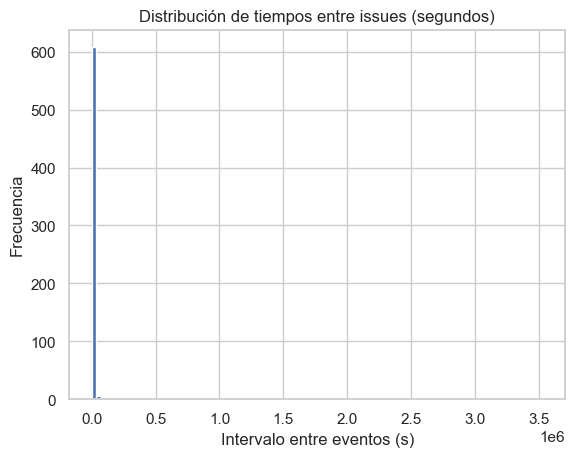

Media: 9855.71 segundos
Desviación estándar: 145613.42
Coeficiente de variación (CV): 14.77


In [107]:
import matplotlib.pyplot as plt

df_sorted = df.sort_values('datetime')
dt = df_sorted['datetime'].diff().dt.total_seconds().dropna()

plt.hist(dt, bins=100)
plt.title('Distribución de tiempos entre issues (segundos)')
plt.xlabel('Intervalo entre eventos (s)')
plt.ylabel('Frecuencia')
plt.show()

print("Media:", round(dt.mean(), 2), "segundos")
print("Desviación estándar:", round(dt.std(), 2))
print("Coeficiente de variación (CV):", round(dt.std()/dt.mean(), 2))

In [108]:
import numpy as np

def proportion_preceded(df, type_a, type_b, window_s=300):
    """
    Devuelve la proporción de eventos de tipo B que tienen al menos un A
    en los window_s segundos anteriores.
    """
    t0 = df['datetime'].min()
    df['t'] = (df['datetime'] - t0).dt.total_seconds()

    A_times = df.loc[df['type'] == type_a, 't'].values
    B_times = df.loc[df['type'] == type_b, 't'].values

    count_preceded = 0
    for tb in B_times:
        if np.any((A_times < tb) & (A_times > tb - window_s)):
            count_preceded += 1

    return count_preceded / len(B_times) if len(B_times) > 0 else np.nan

In [109]:
types = ['changeRanking', 'athleteTime', 'importAthletes', 'athleteSwap']

for t in types:
    prop = proportion_preceded(df_changes, t, 'changeStatus', window_s=300)
    print(f"{t} → changeStatus: {prop:.2%}")

changeRanking → changeStatus: 29.41%
athleteTime → changeStatus: 11.76%
importAthletes → changeStatus: 0.00%
athleteSwap → changeStatus: 0.00%


In [114]:
import pandas as pd

# --- CONFIGURACIÓN ---
window_s = 300  # ventana de 5 minutos
target_type = 'changeStatus'
reference_types = ['changeRanking', 'athleteTime', 'importAthletes', 'athleteSwap']

# Asegurar orden temporal
df_changes = df_changes.sort_values('datetime').reset_index(drop=True)

# --- Filtrar solo los changeStatus ---
target_events = df_changes[df_changes['type'] == target_type].copy()

# Detectar si el valor del changeStatus contiene retired/disqualified
target_events['status_value'] = target_events['valor'].astype(str).str.lower()

# --- Calcular precedentes ---
results = []

for status in ['disqualified']:
    targets = target_events[target_events['status_value'].str.contains(status, na=False)]
    
    for ref_type in reference_types:
        ref_events = df_changes[df_changes['type'] == ref_type]
        
        for _, target in targets.iterrows():
            nearby = ref_events[
                (ref_events['datetime'] <= target['datetime']) &
                (ref_events['datetime'] >= target['datetime'] - pd.Timedelta(seconds=window_s))
            ]
            for _, nb in nearby.iterrows():
                results.append({
                    'status': status,
                    'changeStatus_id': target['id'],
                    'preceding_type': ref_type,
                    'preceding_variable': nb['variable'],
                    'preceding_valor': nb['valor'],
                    'time_diff_s': (target['datetime'] - nb['datetime']).total_seconds()
                })

df_prox = pd.DataFrame(results)

# --- Agregar estadísticas ---
summary_vars = (
    df_prox.groupby(['status', 'preceding_type', 'preceding_variable'])
    .size()
    .reset_index(name='count')
)

summary_time = (
    df_prox.groupby(['status', 'preceding_type', 'preceding_variable'])['time_diff_s']
    .mean()
    .reset_index(name='avg_seconds_before')
)

# Unir y ordenar
summary = (
    summary_vars.merge(summary_time, on=['status', 'preceding_type', 'preceding_variable'])
    .sort_values(['status', 'avg_seconds_before', 'count'], ascending=[True, True, False])
    .reset_index(drop=True)
)

print("=== Variables precedentes antes de cada tipo de changeStatus (ordenadas) ===")
print(summary.head(30))

# --- (Opcional) Análisis de valores numéricos precedentes ---
numeric_subset = df_prox[
    pd.to_numeric(df_prox['preceding_valor'], errors='coerce').notnull()
].copy()
numeric_subset['preceding_valor'] = numeric_subset['preceding_valor'].astype(float)

mean_values = (
    numeric_subset.groupby(['status', 'preceding_variable'])['preceding_valor']
    .mean()
    .reset_index()
    .sort_values(['status', 'preceding_valor'], ascending=[True, False])
)

print("\n=== Valores promedio de variables que preceden a cada tipo de changeStatus ===")
print(mean_values.head(20))

=== Variables precedentes antes de cada tipo de changeStatus (ordenadas) ===
         status preceding_type                  preceding_variable  count  \
0  disqualified  changeRanking           data_events_auto_category      1   
1  disqualified  changeRanking                     data_statusNote      1   
2  disqualified    athleteTime          data_events_times_20K_time      1   
3  disqualified    athleteTime          data_events_times_15K_time      1   
4  disqualified  changeRanking                 data_events_gunTime      2   
5  disqualified  changeRanking  data_events_gunTimeModeConfig_wave      2   
6  disqualified  changeRanking                        data_surname      1   
7  disqualified  changeRanking               data_events_auto_chip      1   

   avg_seconds_before  
0              6.1950  
1              6.1950  
2             99.5930  
3            111.0310  
4            112.4925  
5            112.4925  
6            122.2960  
7            181.5730  

=== Valores 

🧭 Manual: Cómo estudiar las causas de los changeStatus
🎯 Objetivo

Queremos entender por qué se produce un cambio de estado (changeStatus) en un atleta, especialmente los que ocurren post-carrera, como “disqualified”, “retired”, etc.

El propósito es detectar qué variables o eventos previos pueden haber provocado ese cambio:
por ejemplo, si un atleta fue descalificado por una anomalía en su tiempo, una penalización, o una corrección posterior.

1️⃣ Qué datos vamos a usar

Tenemos varias tablas (dataframes):

df_exploded: contiene los issues o incidencias detectadas (por ejemplo athleteTime, changeStatus, etc.), junto con el momento (datetime), el atleta afectado y la variable implicada.

athletes_times_df: tiene los tiempos del atleta en diferentes puntos de la carrera (5K, 10K, meta, etc.).

athletes_events_df: tiene los datos generales del atleta en la competición (posición, estado, penalizaciones, etc.).

(Opcionalmente) otras tablas, como penalizaciones o atributos del atleta.

2️⃣ Filtrar los changeStatus relevantes

Solo analizamos los changeStatus post-carrera, porque son los que reflejan decisiones finales y no ajustes intermedios.
Estos suelen indicar descalificaciones, retiradas o correcciones del resultado final.

3️⃣ Consultar la información del atleta antes del cambio

Para cada atleta que tiene un changeStatus, buscamos cómo estaban sus datos durante la carrera, es decir:

Sus tiempos en athletes_times_df

Sus posiciones, estados o penalizaciones en athletes_events_df

Esto nos da el contexto: por ejemplo, si un atleta fue descalificado, podemos ver si tenía tiempos extraños, estaba muy atrás o tenía penalizaciones previas.

4️⃣ Analizar los issues anteriores cercanos en el tiempo

También es importante ver si antes del changeStatus hubo otros issues que pudieran estar relacionados, por ejemplo:

Un athleteTime justo antes (cambio o corrección de tiempo)

Un changeRanking (cambio en la clasificación)

O varios issues seguidos en el mismo atleta

La idea es mirar una ventana temporal corta (por ejemplo, 5 o 10 minutos antes del changeStatus) y comprobar si ocurrieron otros issues en ese periodo.

De esta forma podemos ver patrones como:

“Los atletas descalificados suelen tener un cambio en su tiempo pocos minutos antes”.

5️⃣ Construir una tabla resumen para el análisis

Una vez recogida la información anterior, se puede preparar una tabla (DataFrame) con una fila por cada atleta con changeStatus.
En esa tabla pondremos:

El athlete_id

El tipo de changeStatus (por ejemplo “disqualified”, “retired”)

Los tiempos que tenía (5K, 10K, meta, etc.)

Si tenía penalizaciones

Cuántos issues tuvo antes del cambio

Qué tipo de issues tuvo antes (por ejemplo, athleteTime, changeRanking, etc.)

Así podremos comparar visualmente y estadísticamente las características de cada caso.

6️⃣ Analizar las relaciones o correlaciones

Una vez tenemos esa tabla resumen:

Si las variables son numéricas (por ejemplo tiempos, posiciones, etc.), podemos estudiar correlaciones para ver si ciertos valores extremos están asociados a ciertos changeStatus.

Si las variables son categóricas (por ejemplo tipo de estado o penalización), podemos usar tablas de frecuencias para ver qué combinaciones son más comunes.

El objetivo es encontrar patrones del tipo:

“Los atletas con tiempos irregulares en los últimos 5K suelen tener un cambio de estado”.

“Las descalificaciones post-carrera se concentran en atletas que tuvieron un cambio de tiempo justo antes”.

### Análisis adicionales

In [11]:
# --- Código principal ---
print("📋 VARIABLES POR DATAFRAME:\n")
for nombre, df in dfs_final.items():
    print(f"➡️ {nombre}:")
    if df.empty:
        print("   ⚠️ DataFrame vacío\n")
    else:
        columnas = df.columns.tolist()
        print(f"   {len(columnas)} columnas")
        print("   Variables:", columnas, "\n")

📋 VARIABLES POR DATAFRAME:

➡️ athletes_df:
   17 columnas
   Variables: ['Licencia', 'TIEMPO ESTIMADO', 'athlete_id', 'birthdate', 'club', 'color', 'featured', 'fullName', 'gender', 'id', 'importId', 'name', 'nationality', 'race_id', 'statusNote', 'surname', 'user_id'] 

➡️ athletes_events_df:
   62 columnas
   Variables: ['athlete_id', 'attributes_Discapacitado intelectual', 'attributes_Discapacitado visual', 'attributes_Sillas', 'auto_category', 'auto_chip', 'calculatedTimes_10K_net', 'calculatedTimes_10K_official', 'calculatedTimes_15K_net', 'calculatedTimes_15K_official', 'calculatedTimes_20K_net', 'calculatedTimes_20K_official', 'calculatedTimes_5K_net', 'calculatedTimes_5K_official', 'calculatedTimes_Meta_net', 'calculatedTimes_Meta_official', 'category', 'commentatorTimes_10K', 'commentatorTimes_15K', 'commentatorTimes_20K', 'commentatorTimes_5K', 'commentatorTimes_Meta', 'commentatorTimes_Salida', 'distance', 'dorsal', 'event', 'event_id', 'gunTime', 'gunTimeMode', 'gunTimeMod

In [15]:
athletes_df = dfs_final['athletes_df']
athletes_events_df = dfs_final['athletes_events_df']
athletes_time_df = dfs_final['athletes_time_df']

In [22]:
df_base = (
    athletes_time_df.merge(athletes_events_df, on=['athlete_id', 'race_id'], how='left', suffixes=('_time', '_event'))
         .merge(athletes_df, on='athlete_id', how='left')
)

In [23]:
df_base

,athlete_id,average,distance_time,event_id_time,incidence,isBackup,location,netTime,offset,order,...,fullName,gender,id,importId,name,nationality,race_id_y,statusNote,surname,user_id
0,31,0.00000,0,Mitja,NaN,NaN,,0,NaN,1,...,Abdezaliz Merzougui,male,31,aae3f350-e853-11ef-8d89-09ba8cee1a95,Abdezaliz,es,1a83229e-2547-42a3-b5b4-36c7425c4d8f,,Merzougui,0
1,31,0.17876,5000,Mitja,NaN,NaN,,891230,NaN,2,...,Abdezaliz Merzougui,male,31,aae3f350-e853-11ef-8d89-09ba8cee1a95,Abdezaliz,es,1a83229e-2547-42a3-b5b4-36c7425c4d8f,,Merzougui,0
2,159,0.00000,0,Mitja,NaN,NaN,,0,NaN,1,...,Floriane Hot,female,159,aae3f350-e853-11ef-8d89-09ba8cee1a95,Floriane,FR,1a83229e-2547-42a3-b5b4-36c7425c4d8f,,Hot,0
3,159,0.21763,5000,Mitja,NaN,NaN,,1081165,NaN,2,...,Floriane Hot,female,159,aae3f350-e853-11ef-8d89-09ba8cee1a95,Floriane,FR,1a83229e-2547-42a3-b5b4-36c7425c4d8f,,Hot,0
4,159,0.21633,10000,Mitja,NaN,NaN,,2156349,NaN,3,...,Floriane Hot,female,159,aae3f350-e853-11ef-8d89-09ba8cee1a95,Floriane,FR,1a83229e-2547-42a3-b5b4-36c7425c4d8f,,Hot,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
162738,168758C2,0.28797,5000,Mitja,NaN,NaN,,1384781,NaN,2,...,Baltasar Barberán Esteve,male,168758C2,aad4d820-e853-11ef-a149-eb364f5bb657,Baltasar,ES,1a83229e-2547-42a3-b5b4-36c7425c4d8f,,Barberán Esteve,0
162739,168758C2,0.27847,10000,Mitja,NaN,NaN,,2729600,NaN,3,...,Baltasar Barberán Esteve,male,168758C2,aad4d820-e853-11ef-a149-eb364f5bb657,Baltasar,ES,1a83229e-2547-42a3-b5b4-36c7425c4d8f,,Barberán Esteve,0
162740,168758C2,0.27513,15000,Mitja,NaN,NaN,,4071865,NaN,4,...,Baltasar Barberán Esteve,male,168758C2,aad4d820-e853-11ef-a149-eb364f5bb657,Baltasar,ES,1a83229e-2547-42a3-b5b4-36c7425c4d8f,,Barberán Esteve,0
162741,168758C2,0.27566,20000,Mitja,NaN,NaN,,5458158,NaN,5,...,Baltasar Barberán Esteve,male,168758C2,aad4d820-e853-11ef-a149-eb364f5bb657,Baltasar,ES,1a83229e-2547-42a3-b5b4-36c7425c4d8f,,Barberán Esteve,0


Filas con nulos en netTime, gender, category, distance, age o split se eliminan.

Split de salida se excluye porque no aporta variabilidad.

Tests aplicados por split

Gender vs netTime: Mann–Whitney U (no paramétrico).

Category vs netTime: Kruskal–Wallis (no paramétrico).

Distance vs netTime: Spearman (correlación de rangos).

Age vs netTime: Spearman (correlación de rangos).

Supuestos

Observaciones independientes dentro de cada split y grupo.

No se requiere normalidad (tests no paramétricos).

Suficiente variabilidad en las variables; si todos los valores son iguales, se omite el test.

In [35]:
import pandas as pd

# merge básico con las claves comunes
merged_df = (
    athletes_time_df
    .merge(athletes_df[['athlete_id', 'gender', 'birthdate']], on='athlete_id', how='left')
    .merge(athletes_events_df[['athlete_id', 'category']], on='athlete_id', how='left')
)

In [38]:
race_date = pd.Timestamp("2025-02-16")

In [44]:
import pandas as pd
import numpy as np
from scipy.stats import mannwhitneyu, kruskal, spearmanr

df = merged_df.copy()

# --- Fecha de la carrera (ajústala según corresponda) ---
race_date = pd.Timestamp("2025-02-16")

# --- Calcular edad en el momento de la carrera ---
df["age"] = ((race_date - df["birthdate"]).dt.days / 365.25).round(1)

# --- Variables relevantes ---
vars_to_keep = ["netTime", "gender", "category", "distance", "age", "split"]

# --- Limpiar datos ---
df_clean = df.dropna(subset=vars_to_keep)
print(f"Filas iniciales: {len(df)}")
print(f"Filas tras eliminar nulos: {len(df_clean)}")

# --- Excluir el split de salida ---
# (ajusta el valor según cómo se codifique: 0, 'start', etc.)
df_clean = df_clean[df_clean["split"] != 0]

# --- Análisis por split ---
results = []

for split_name, subset in df_clean.groupby("split"):
    print(f"\n🔹 Análisis para split: {split_name}")

    # --- Gender vs netTime ---
    male = subset[subset["gender"] == "male"]["netTime"]
    female = subset[subset["gender"] == "female"]["netTime"]

    if len(male) > 5 and len(female) > 5:
        stat, p_gender = mannwhitneyu(male, female, alternative="two-sided")
        print(f"  Gender vs netTime → Mann-Whitney U: p={p_gender:.4f}")
    else:
        print("  ⚠️ No hay suficientes datos en alguna categoría de gender.")

    # --- Category vs netTime ---
    groups = [g["netTime"] for _, g in subset.groupby("category") if len(g) > 5]

    # Evita error si todos los tiempos son iguales
    if len(groups) > 1 and any(g.nunique() > 1 for g in groups):
        stat, p_category = kruskal(*groups)
        print(f"  Category vs netTime → Kruskal-Wallis: p={p_category:.4f}")
    else:
        print("  ⚠️ No hay variabilidad suficiente en los tiempos.")

    # --- Distance vs netTime (Spearman) ---
    if subset["distance"].nunique() > 1:
        corr_dist, p_dist = spearmanr(subset["distance"], subset["netTime"])
        print(f"  Distance–netTime → Spearman ρ={corr_dist:.3f}, p={p_dist:.4f}")
    else:
        print("  ⚠️ Distance constante, se omite correlación.")

    # --- Age vs netTime (Spearman) ---
    if subset["age"].nunique() > 1:
        corr_age, p_age = spearmanr(subset["age"], subset["netTime"])
        print(f"  Age–netTime → Spearman ρ={corr_age:.3f}, p={p_age:.4f}")
    else:
        print("  ⚠️ Age constante, se omite correlación.")

Filas iniciales: 162743
Filas tras eliminar nulos: 162625

🔹 Análisis para split: 10K
  Gender vs netTime → Mann-Whitney U: p=0.0000
  Category vs netTime → Kruskal-Wallis: p=0.0000
  ⚠️ Distance constante, se omite correlación.
  Age–netTime → Spearman ρ=0.029, p=0.0000

🔹 Análisis para split: 15K
  Gender vs netTime → Mann-Whitney U: p=0.0000
  Category vs netTime → Kruskal-Wallis: p=0.0000
  ⚠️ Distance constante, se omite correlación.
  Age–netTime → Spearman ρ=0.034, p=0.0000

🔹 Análisis para split: 20K
  Gender vs netTime → Mann-Whitney U: p=0.0000
  Category vs netTime → Kruskal-Wallis: p=0.0000
  ⚠️ Distance constante, se omite correlación.
  Age–netTime → Spearman ρ=0.040, p=0.0000

🔹 Análisis para split: 5K
  Gender vs netTime → Mann-Whitney U: p=0.0000
  Category vs netTime → Kruskal-Wallis: p=0.0000
  ⚠️ Distance constante, se omite correlación.
  Age–netTime → Spearman ρ=0.025, p=0.0000

🔹 Análisis para split: Meta
  Gender vs netTime → Mann-Whitney U: p=0.0000
  Category 

C:\Users\mario\AppData\Local\Temp\ipykernel_11920\144542155.py:60: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr_age, p_age = spearmanr(subset["age"], subset["netTime"])


Gender vs netTime: diferencias significativas en todos los splits excepto Salida → género influye en los tiempos parciales.

Category vs netTime: diferencias significativas en todos los splits excepto Salida → categoría influye en los tiempos parciales.

Age vs netTime: correlación muy débil pero significativa (ρ≈0.025–0.040) → edad tiene efecto mínimo sobre los tiempos.

Split de salida: tiempos constantes → no aporta información para estas comparaciones.